In [1]:
import numpy as np
import pandas as pd
import tqdm
from scipy.stats import chi2, t
import biogeme.database as db
import biogeme.biogeme as bio
from biogeme import models
from biogeme.expressions import Beta, Variable, exp
from biogeme import results as res
from IPython.display import display, Markdown, Latex
from biogeme.models import loglogit
from biogeme import biogeme
from datetime import datetime
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import math

/opt/anaconda3/lib/python3.9/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.8.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
/opt/anaconda3/lib/python3.9/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [2]:
file_path = '../data_CSV/final_array.csv'
df = pd.read_csv(file_path)

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/482401865.py:2: DtypeWarning: Columns (8,30) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


In [3]:
df['unit_price']= df['price_driver']/df['distance_BBC'] 

df['parkRelais_distance'] = df['parkRelais_distance']/1000
df['parkCarpooling_distance'] = df['parkCarpooling_distance']/1000
df['airport_distance'] = df['airport_distance']/1000
df['trainstation_distance'] = df['trainstation_distance']/1000
df['electric_distance'] = df['electric_distance']/1000
df['bicycle_parking_distance'] = df['bicycle_parking_distance']/1000
df['tram_stop_distance'] = df['tram_stop_distance']/1000
df['subway_entrance_distance'] = df['subway_entrance_distance']/1000
df['bus_stop_distance'] = df['bus_stop_distance']/1000
df['bicycle_rental_distance'] = df['bicycle_rental_distance']/1000
df['fuel_distance'] = df['fuel_distance']/1000
df['parkRelais_distance'] = df['parkRelais_distance']/1000  # de m a km
df['dens_pop'] = df['dens_pop']/100  # de habitants par km2 a habitants par hectare 

#"parkRelais_density","parkCarpooling_density", "airport_density", "trainstation_density", "electric_density", "bicycle_parking_density", "tram_stop_density", "subway_entrance_density", "bus_stop_density", "bicycle_rental_density","fuel_density", "norm_weighted_sum", "dens_pop", "unit_price"

In [4]:
from datetime import datetime

def time_to_minutes1(time_str):
    # Si la chaîne contient une date + heure, on extrait uniquement l'heure
    time_str = time_str.split(' ')[1] if ' ' in time_str else time_str
    time_obj = datetime.strptime(time_str, '%H:%M:%S')  # Parse uniquement l'heure
    return time_obj.hour * 60 + time_obj.minute  # Convertir en minutes

def time_to_minutes2(time_str):
    time_str = time_str.split(' ')[1] if ' ' in time_str else time_str
    time_obj = datetime.strptime(time_str, '%H:%M:%S')
    return (time_obj.hour * 60 + time_obj.minute) / 60  # Convertir en heures

# Appliquer les fonctions
df['departure_time_min'] = df['departure_time'].apply(time_to_minutes1)
df['departure_time_hour'] = df['departure_time'].apply(time_to_minutes2)


In [5]:
# Filter out rows where `seats_booked` is not valid (negative values)
df = df[df['seats_booked'] >= 0]

# Ensure seats_booked is an integer
df['seats_booked'] = df['seats_booked'].astype(int)

# Create a list to store rows for the new DataFrame
result_rows = []


for _, row in df.iterrows():
    seats = row['seats_booked']
    row_data = row.to_dict()  # Convert the row to a dictionary
    if seats == 0:
        # Add the row with binary_seats = 0
        row_data['binary_seats'] = 0
        result_rows.append(row_data)
    elif seats >= 1:
        # Add the row with binary_seats = 1
        row_data['binary_seats'] = 1
        result_rows.append(row_data)

# Convert the list of rows to a DataFrame
result = pd.DataFrame(result_rows)



In [6]:
print(result["departure_time_hour"])

0         22.0
1         16.0
2          8.0
3         13.5
4         13.0
          ... 
169277    13.0
169278    14.0
169279    14.0
169280    10.0
169281     6.5
Name: departure_time_hour, Length: 169282, dtype: float64


In [7]:
sA=0
sB=0
alt1 = result[result["binary_seats"] == 1]
alt0 = result[result["binary_seats"] == 0]
mA = alt1['parkRelais_density'].mean()
mB = alt0['parkRelais_density'].mean()
nA = len(result[result["binary_seats"] == 1])
nB = len(result[result["binary_seats"] == 0])
StdA = alt1['parkRelais_density'].std()
StdB = alt0['parkRelais_density'].std()

for i in range(len(result['parkRelais_density'])):
    sA = sA + pow(result['parkRelais_density'].loc[i] - mA , 2)
    sB = sB + pow(result['parkRelais_density'].loc[i] - mB , 2)

s = (sA + sB)/(nA + nB - 2)

print(s,sA,sB, nA, nB)
t_stat = (mA - mB)/(math.sqrt(pow(StdA,2)/nA + pow(StdB,2)/nB))
print(t_stat)

df = pow(pow(sA ,2)/nA+pow(sB ,2)/nB,2)/(pow(pow(sA ,2)/nA,2)/(nA+1)+pow(pow(sB ,2)/nB,2)/(nB+1))
print(df)

from scipy.stats import t


# Calcul de la p-value bilatérale
p_value = 2 * (1 - t.cdf(abs(t_stat), df))

print("P-value:", p_value)
print(result.columns)

0.47808194507767726 40476.66847758811 40453.04318516109 79359 89923
19.756349582972437
166653.5083241037
P-value: 0.0
Index(['departure', 'arrival', 'route', 'departure_date_num', 'departure_time',
       'seats_total', 'seats_booked', 'distance_BBC',
       'announce_published_date', 'announce_views', 'arrival_latitude',
       'arrival_longitude', 'car_mark', 'car_model', 'comment_average_note',
       'commission', 'departure_date', 'departure_latitude',
       'departure_longitude', 'departure_strike', 'driver_age',
       'driving_quality', 'experience', 'member_since_month',
       'member_since_year', 'price_driver', 'price_driver_default',
       'price_driver_hcap', 'price_driver_lcap', 'published_ads',
       'trip_description', 'hour', 'parkRelais_density', 'parkRelais_distance',
       'parkCarpooling_density', 'parkCarpooling_distance',
       'trainstation_density', 'trainstation_distance', 'airport_density',
       'airport_distance', 'electric_density', 'electric_distan

In [8]:
# Assuming df is your DataFrame
columns = [
    "parkRelais_distance", "parkRelais_density", "parkCarpooling_distance", "parkCarpooling_density", 
    "airport_distance", "airport_density", "trainstation_distance", "trainstation_density", 
    "electric_distance", "electric_density", "bicycle_parking_distance", "bicycle_parking_density", 
    "tram_stop_distance", "tram_stop_density", "subway_entrance_distance", "subway_entrance_density", 
    "bus_stop_distance", "bus_stop_density", "bicycle_rental_distance", "bicycle_rental_density", 
    "fuel_distance", "fuel_density", "safety", "dens_pop", "unit_price",'departure_time_hour','Hors unité urbaine','Banlieue','Centre','Isolées'
]

df_seat1 = result[result["binary_seats"] == 1]  # Contient seulement les lignes où seat == 1
df_seat0 = result[result["binary_seats"] == 0]  # Contient seulement les lignes où seat == 0

# Creating an empty dictionary to store the results
results = {"Variable": [], "Total Mean": [], "Total Std Dev": [], 
           "Alt.0 Mean": [], "Alt.0 Std Dev": [], "Alt.1 Mean": [], "Alt.1 Std Dev": [], "t-stat": [], "p-value": []}

# Assuming alternative 1 and 2 are defined by some condition
alt0_condition = result['binary_seats'] == 0  # Modify as needed
alt1_condition = result['binary_seats'] == 1  # Modify as needed

for col in columns:
    results["Variable"].append(col)
    results["Total Mean"].append(result[col].mean())
    results["Total Std Dev"].append(result[col].std())

    results["Alt.1 Mean"].append(df_seat1[col].mean())
    results["Alt.1 Std Dev"].append(df_seat1[col].std())
    results["Alt.0 Mean"].append(df_seat0[col].mean())
    results["Alt.0 Std Dev"].append(df_seat0[col].std())
    
    # Test t de Welch entre seat = 1 et seat = 0
    if not df_seat1[col].dropna().empty and not df_seat0[col].dropna().empty:
        t_stat, p_value = stats.ttest_ind(df_seat1[col].dropna(), df_seat0[col].dropna(), equal_var=False)
    else:
        p_value = None  # Pas de test si une catégorie est vide
    
    results["t-stat"].append(t_stat)
    results["p-value"].append(p_value)

# Convert results into a DataFrame
results_df = pd.DataFrame(results)
print(results_df)

                    Variable  Total Mean  Total Std Dev  Alt.0 Mean  \
0        parkRelais_distance    0.007133       0.008007    0.007907   
1         parkRelais_density    0.174000       0.488342    0.151830   
2    parkCarpooling_distance    9.546035       4.118985    9.446393   
3     parkCarpooling_density    0.022040       0.285734    0.027846   
4           airport_distance   14.781445       6.552987   15.070753   
5            airport_density    0.008347       0.090980    0.009897   
6      trainstation_distance    1.265187       1.204470    1.278795   
7       trainstation_density    0.705734       1.033719    0.699977   
8          electric_distance    0.514072       0.694956    0.544752   
9           electric_density    5.633239       4.327464    5.369216   
10  bicycle_parking_distance    0.154009       0.451554    0.177494   
11   bicycle_parking_density  137.416181     125.959007  129.411130   
12        tram_stop_distance    2.329560       3.796712    2.645308   
13    

In [9]:
# Convert time strings to seconds since midnight
# Convert time strings to time objects

result['departure_time'] = result['departure_time'].apply(lambda x: x.split()[1])
result['departure_time'] = result['departure_time'].apply(lambda x: datetime.strptime(x, "%H:%M:%S").time())

# Define custom function for time categorization
def categorize_time(time_value):
    if time_value < datetime.strptime("04:00:00", "%H:%M:%S").time():
        return "Night"
    elif time_value < datetime.strptime("07:30:00", "%H:%M:%S").time():
        return "Morning_Normal"
    elif time_value < datetime.strptime("09:30:00", "%H:%M:%S").time():
        return "Morning_Pick"
    elif time_value < datetime.strptime("16:30:00", "%H:%M:%S").time():
        return "Mid_day"
    elif time_value < datetime.strptime("19:30:00", "%H:%M:%S").time():
        return "Evening_Pick"
    else:
        return "Evening_Normal"

# Apply the function to create the time_category column
result['time_category'] = result['departure_time'].apply(categorize_time)

# Perform one-hot encoding (binary columns for each category)
result = pd.get_dummies(result, columns=['time_category'], prefix='time')

# Ensure that the columns are binary (1 or 0)
result = result.astype({"time_Night": "int", "time_Morning_Normal": "int", "time_Morning_Pick": "int", "time_Mid_day": "int", "time_Evening_Pick": "int", "time_Evening_Normal": "int"})

print(result)

       departure   arrival           route departure_date_num departure_time  \
0          Paris    Amiens    Paris-Amiens          09apr2018       22:00:00   
1          Paris  Bordeaux  Paris-Bordeaux          05apr2018       16:00:48   
2          Paris   Le Mans   Paris-Le Mans          12jul2018       08:00:00   
3          Paris     Lille     Paris-Lille          07apr2018       13:30:00   
4          Paris      Lyon      Paris-Lyon          28apr2018       13:00:00   
...          ...       ...             ...                ...            ...   
169277     Paris  Toulouse  Paris-Toulouse          03jun2018       13:00:00   
169278     Paris  Toulouse  Paris-Toulouse          26jul2018       14:00:00   
169279     Paris  Toulouse  Paris-Toulouse          08may2018       14:00:00   
169280     Paris  Toulouse  Paris-Toulouse          21may2018       10:00:00   
169281     Paris  Toulouse  Paris-Toulouse          07apr2018       06:30:00   

        seats_total  seats_booked  dist

In [10]:
# Supposons que result soit le DataFrame de départ
result['group'] = result.groupby(['arrival', 'departure', 'departure_time']).ngroup()

num_groups = result['group'].nunique()
print(f"Nombre de groupes uniques : {num_groups}")

Nombre de groupes uniques : 7986


In [11]:
result = result.drop(columns=['arrival'])
result = result.drop(columns=['departure'])
result = result.drop(columns=['route'])
result = result.drop(columns=['departure_date_num'])
result = result.drop(columns=['announce_published_date'])
result = result.drop(columns=['departure_time'])
result = result.drop(columns=['car_mark'])
result = result.drop(columns=['car_model'])
result = result.drop(columns=['departure_date'])
result = result.drop(columns=['trip_description'])
result = result.drop(columns=['announce_views'])
result = result.drop(columns=['comment_average_note'])
result = result.drop(columns=['geometry'])
result = result.drop(columns=['driver_age'])
result = result.drop(columns=['driving_quality'])
result = result.drop(columns=['experience'])
result = result.drop(columns=['member_since_month'])
result = result.drop(columns=['member_since_year'])
result = result.drop(columns=['published_ads'])
result = result.drop(columns=['departure_strike'])
result = result.drop(columns=['commission'])
df_cleaned = result.dropna()
print(len(df_cleaned['unit_price']))
database = db.Database("lpmc09", df_cleaned)

169282


In [12]:
# Count occurrences of 0 and 1 in 'binary_seats' column
counts = df_cleaned["binary_seats"].value_counts()

# Display the counts
print(counts)

binary_seats
0    89923
1    79359
Name: count, dtype: int64


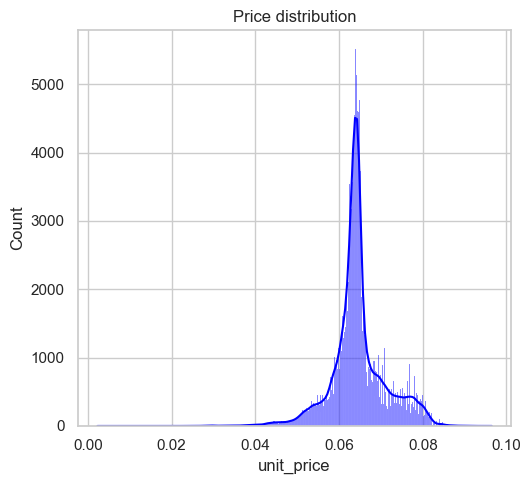

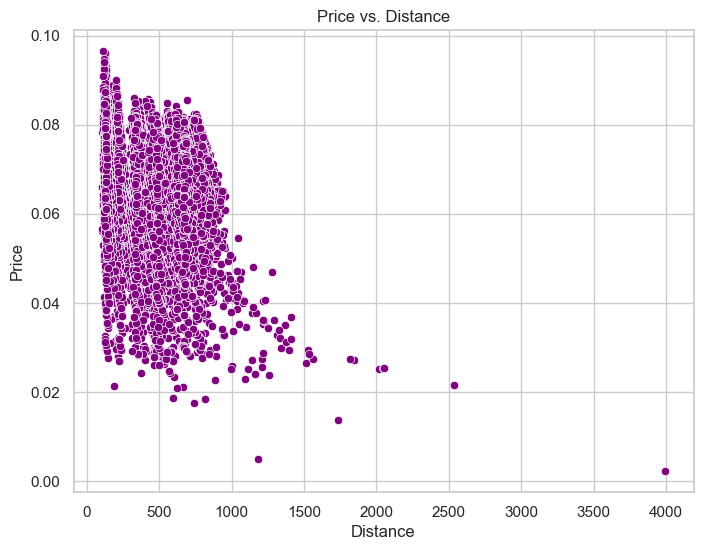

In [13]:
sns.set(style="whitegrid")

plt.figure(figsize=(10,5))

plt.subplot(1, 2, 1)
sns.histplot(result['unit_price'], kde=True, color='blue')
plt.title('Price distribution')

plt.tight_layout()
plt.show()

plt.figure(figsize=(8,6))
sns.scatterplot(x=result['distance_BBC'], y=result['unit_price'], color='purple')
plt.title('Price vs. Distance')
plt.xlabel('Distance')
plt.ylabel('Price')
plt.show()

In [14]:
print(result)

        seats_total  seats_booked  distance_BBC  arrival_latitude  \
0               3.0             2         131.0         49.894066   
1               3.0             1         620.0         44.830593   
2               3.0             2         202.0         47.996552   
3               3.0             0         211.0         50.637215   
4               4.0             2         522.0         45.711926   
...             ...           ...           ...               ...   
169277          3.0             0         668.0         43.621403   
169278          2.0             1         676.0         43.611237   
169279          2.0             1         667.0         43.727058   
169280          2.0             1         673.0         43.611237   
169281          3.0             0         674.0         43.628971   

        arrival_longitude  departure_latitude  departure_longitude  \
0                2.295753           48.856614             2.352222   
1               -0.710305      

In [15]:
def my_statistics(column_name, n):
    # Séparation des groupes
    group_1 = result[result["binary_seats"] == 1][column_name]
    group_0 = result[result["binary_seats"] == 0][column_name]
    print(len(group_0), len(group_1))

    if len(group_0) > len(group_1):
        group_0 = group_0.sample(n=len(group_1), random_state=42)
        
    print(len(group_0), len(group_1))
    mean_1, mean_0 = group_1.mean(), group_0.mean()
    mean_total = result[column_name].mean()
    std_dev_1, std_dev_0 = group_1.std(), group_0.std()

    x_min = min(group_1.min(), group_0.min())
    x_range = (x_min, mean_total + n * max(std_dev_1, std_dev_0))

    count_1_in_range = group_1[(group_1 >= mean_1) & (group_1 <= mean_1 + std_dev_1)].count()
    count_0_in_range = group_0[(group_0 >= mean_0) & (group_0 <= mean_0 + std_dev_0)].count()

    total_1, total_0 = len(group_1), len(group_0)
    percentage_1_in_range = (count_1_in_range / total_1) * 100 if total_1 > 0 else 0
    percentage_0_in_range = (count_0_in_range / total_0) * 100 if total_0 > 0 else 0

    print(f"{column_name}\n")
    print(f"Mean (1) : {mean_1:.2f}, Mean (0) : {mean_0:.2f}, Total Mean : {mean_total:.2f}")
    print(f"Standard Deviation (1) : {std_dev_1:.2f}, Standard Deviation (0) : {std_dev_0:.2f}")
    print(f"{percentage_1_in_range:.2f}% of '1' are between the mean and the standard deviation")
    print(f"{percentage_0_in_range:.2f}% of '0' are between the mean and the standard deviation\n")

    sns.set(style="whitegrid")

    # Histogramme avec KDE
    plt.figure(figsize=(12, 6))
    sns.histplot(group_1, kde=True, color='blue', label="binary_seats = 1", alpha=0.6)
    sns.histplot(group_0, kde=True, color='red', label="binary_seats = 0", alpha=0.6)

    plt.axvline(mean_1, color='blue', linestyle='--', linewidth=2, label=f'Mean 1: {mean_1:.2f}')
    plt.axvline(mean_0, color='red', linestyle='--', linewidth=2, label=f'Mean 0: {mean_0:.2f}')
    plt.axvline(mean_total, color='green', linestyle='-', linewidth=2, label=f'Total mean: {mean_total:.2f}')

    plt.axvline(mean_1 + std_dev_1, color='blue', linestyle=':', linewidth=2)
    plt.axvline(mean_1 - std_dev_1, color='blue', linestyle=':', linewidth=2)
    plt.axvline(mean_0 + std_dev_0, color='red', linestyle=':', linewidth=2)
    plt.axvline(mean_0 - std_dev_0, color='red', linestyle=':', linewidth=2)

    plt.xlim(x_range)
    plt.title(f"Distribution of {column_name} for binary_seats '0' and '1'")
    plt.legend()
    plt.show()

    # CDF
    plt.figure(figsize=(8, 4))
    sns.ecdfplot(group_1, color='blue', label="CDF binary_seats = 1")
    sns.ecdfplot(group_0, color='red', label="CDF binary_seats = 0")

    plt.axvline(mean_1, color='blue', linestyle='--', linewidth=2)
    plt.axvline(mean_0, color='red', linestyle='--', linewidth=2)
    plt.axvline(mean_total, color='green', linestyle='-', linewidth=2)

    plt.xlim(x_range)
    plt.title(f"Cumulative Distribution Function (CDF) of {column_name}")
    plt.legend()
    plt.show()

    # Graphique en barres
    plt.figure(figsize=(4, 4))
    sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],
                y=[percentage_1_in_range, percentage_0_in_range],
                palette=["blue", "red"])
    plt.ylabel("% of values between Mean and Mean + Standard deviation", fontsize=9)
    plt.title(f"Proportion of {column_name} in the interval [Mean, Mean + Standard deviation]", fontsize=9)

    plt.show()

In [16]:
def my_statistics1(column_name, n1, n2):
    # Séparation des groupes
    group_1 = result[result["binary_seats"] == 1][column_name]
    group_0 = result[result["binary_seats"] == 0][column_name]

            # ✅ Normalize group sizes (Optional)
    if len(group_0) > len(group_1):
        group_0 = group_0.sample(n=len(group_1), random_state=42)
    
    # Calcul des statistiques
    mean_1, mean_0 = group_1.mean(), group_0.mean()
    mean_total = result[column_name].mean()
    std_dev_1, std_dev_0 = group_1.std(), group_0.std()

    # Détermination des limites de l'axe X pour une meilleure lisibilité
    x_min = min(group_1.min(), group_0.min())
    x_range = (mean_total - n1 * max(std_dev_1, std_dev_0), mean_total + n2 * max(std_dev_1, std_dev_0))
    
    # Décompte des valeurs dans l'intervalle [moyenne, moyenne + écart-type]
    count_1_in_range = group_1[(group_1 >= mean_1) & (group_1 <= mean_1 + std_dev_1)].count()
    count_0_in_range = group_0[(group_0 >= mean_0) & (group_0 <= mean_0 + std_dev_0)].count()
    total_1, total_0 = len(group_1), len(group_0)
    
    percentage_1_in_range = (count_1_in_range / total_1) * 100 if total_1 > 0 else 0
    percentage_0_in_range = (count_0_in_range / total_0) * 100 if total_0 > 0 else 0
    
    # Affichage des stats
    print(f"{column_name}\n")
    print(f"Mean (1) : {mean_1:.2f}, Mean (0) : {mean_0:.2f}, Total Mean : {mean_total:.2f}")
    print(f"Standard Deviation (1) : {std_dev_1:.2f}, Standad Deviation(0) : {std_dev_0:.2f}")
    print(f"{percentage_1_in_range:.2f}% of '1' are between the mean and the standard deviation")
    print(f"{percentage_0_in_range:.2f}% of '0' are between the mean and the standard deviation\n")
    
    sns.set(style="whitegrid")
    
    # 1️⃣ Histogramme superposé des deux groupes (grande taille)
    plt.figure(figsize=(12, 6))
    sns.histplot(group_1, kde=True, color='blue', label="binary_seats = 1", alpha=0.6)
    sns.histplot(group_0, kde=True, color='red', label="binary_seats = 0", alpha=0.6)
    
    # Ajout des moyennes
    plt.axvline(mean_1, color='blue', linestyle='--', linewidth=2, label=f'Mean 1: {mean_1:.2f}')
    plt.axvline(mean_0, color='red', linestyle='--', linewidth=2, label=f'Mean 0: {mean_0:.2f}')
    plt.axvline(mean_total, color='green', linestyle='-', linewidth=2, label=f'Total mean: {mean_total:.2f}')

    plt.axvline(mean_1 - std_dev_1, color='blue', linestyle=':', linewidth=2, label=f'±Standard deviation 1')
    plt.axvline(mean_1 + std_dev_1, color='blue', linestyle=':', linewidth=2)
    plt.axvline(mean_0 - std_dev_0, color='red', linestyle=':', linewidth=2, label=f'±Standard deviation 0')
    plt.axvline(mean_0 + std_dev_0, color='red', linestyle=':', linewidth=2)


    plt.xlim(x_range)  # Limite de l'axe X
    #plt.yscale("log")  # Échelle logarithmique pour mieux voir les différences
    plt.title(f"Distribution of {column_name} for binary_seats '0' and '1'")
    plt.legend()
    plt.show()

    # CDF
    plt.figure(figsize=(8, 4))
    sns.ecdfplot(group_1, color='blue', label="CDF binary_seats = 1")
    sns.ecdfplot(group_0, color='red', label="CDF binary_seats = 0")

    plt.axvline(mean_1, color='blue', linestyle='--', linewidth=2)
    plt.axvline(mean_0, color='red', linestyle='--', linewidth=2)
    plt.axvline(mean_total, color='green', linestyle='-', linewidth=2)

    plt.xlim(x_range)
    plt.title(f"Cumulative Distribution Function (CDF) of {column_name}")
    plt.legend()
    plt.show()
    
    # 2️⃣ Graphique plus petit pour visualiser les valeurs entre la moyenne et l’écart-type
    plt.figure(figsize=(4, 4))
    sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],
                y=[percentage_1_in_range, percentage_0_in_range],
                palette=["blue", "red"])
    plt.ylabel("% of values between Mean and Mean + Standard deviation", fontsize=9)
    plt.title(f"Proportion of {column_name} in the interval [Mean, Mean + Standard deviation]", fontsize=9)
    
    plt.show()


In [17]:
def my_statistics2(column_name, n):
    # Séparation des groupes
    group_1 = result[result["binary_seats"] == 1][column_name]
    group_0 = result[result["binary_seats"] == 0][column_name]
    print(len(group_0), len(group_1))

    if len(group_0) > len(group_1):
        group_0 = group_0.sample(n=len(group_1), random_state=42)
        
    print(len(group_0), len(group_1))
    mean_1, mean_0 = group_1.mean(), group_0.mean()
    mean_total = result[column_name].mean()
    std_dev_1, std_dev_0 = group_1.std(), group_0.std()

    x_min = min(group_1.min(), group_0.min())
    x_range = (x_min, mean_total + n * max(std_dev_1, std_dev_0))

    count_1_in_range = group_1[(group_1 >= mean_1) & (group_1 <= mean_1 + std_dev_1)].count()
    count_0_in_range = group_0[(group_0 >= mean_0) & (group_0 <= mean_0 + std_dev_0)].count()

    total_1, total_0 = len(group_1), len(group_0)
    percentage_1_in_range = (count_1_in_range / total_1) * 100 if total_1 > 0 else 0
    percentage_0_in_range = (count_0_in_range / total_0) * 100 if total_0 > 0 else 0

    print(f"{column_name}\n")
    print(f"Mean (1) : {mean_1:.2f}, Mean (0) : {mean_0:.2f}, Total Mean : {mean_total:.2f}")
    print(f"Standard Deviation (1) : {std_dev_1:.2f}, Standard Deviation (0) : {std_dev_0:.2f}")
    print(f"{percentage_1_in_range:.2f}% of '1' are between the mean and the standard deviation")
    print(f"{percentage_0_in_range:.2f}% of '0' are between the mean and the standard deviation\n")

    sns.set(style="whitegrid")

    # Histogramme avec KDE
    plt.figure(figsize=(12, 6))
    sns.histplot(group_1, kde=True, color='blue', label="binary_seats = 1", alpha=0.6)
    sns.histplot(group_0, kde=True, color='red', label="binary_seats = 0", alpha=0.6)

    plt.axvline(mean_1, color='blue', linestyle='--', linewidth=2, label=f'Mean 1: {mean_1:.2f}')
    plt.axvline(mean_0, color='red', linestyle='--', linewidth=2, label=f'Mean 0: {mean_0:.2f}')
    plt.axvline(mean_total, color='green', linestyle='-', linewidth=2, label=f'Total mean: {mean_total:.2f}')

    plt.axvline(mean_1 + std_dev_1, color='blue', linestyle=':', linewidth=2)
    plt.axvline(mean_1 - std_dev_1, color='blue', linestyle=':', linewidth=2)
    plt.axvline(mean_0 + std_dev_0, color='red', linestyle=':', linewidth=2)
    plt.axvline(mean_0 - std_dev_0, color='red', linestyle=':', linewidth=2)

    plt.xlim(x_range)
    plt.yscale('log')
    plt.title(f"Distribution of {column_name} for binary_seats '0' and '1'")
    plt.legend()
    plt.show()

    # CDF
    plt.figure(figsize=(8, 4))
    sns.ecdfplot(group_1, color='blue', label="CDF binary_seats = 1")
    sns.ecdfplot(group_0, color='red', label="CDF binary_seats = 0")

    plt.axvline(mean_1, color='blue', linestyle='--', linewidth=2)
    plt.axvline(mean_0, color='red', linestyle='--', linewidth=2)
    plt.axvline(mean_total, color='green', linestyle='-', linewidth=2)

    plt.xlim(x_range)
    plt.yscale('log')
    plt.title(f"Cumulative Distribution Function (CDF) of {column_name}")
    plt.legend()
    plt.show()

    # Graphique en barres
    plt.figure(figsize=(4, 4))
    sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],
                y=[percentage_1_in_range, percentage_0_in_range],
                palette=["blue", "red"])
    plt.ylabel("% of values between Mean and Mean + Standard deviation", fontsize=9)
    plt.title(f"Proportion of {column_name} in the interval [Mean, Mean + Standard deviation]", fontsize=9)

    plt.show()


In [18]:
def my_statistics3(column_name, n):
    # Séparation des groupes
    group_1 = result[result["binary_seats"] == 1][column_name]
    group_0 = result[result["binary_seats"] == 0][column_name]
    print(len(group_0), len(group_1))

    if len(group_0) > len(group_1):
        group_0 = group_0.sample(n=len(group_1), random_state=42)

    print(len(group_0), len(group_1))

    # Log Transformation (en ajoutant 1 pour éviter les valeurs négatives ou nulles)
    group_1_log = np.log1p(group_1)
    group_0_log = np.log1p(group_0)

    # Moyennes et écart-types après transformation
    mean_1, mean_0 = group_1_log.mean(), group_0_log.mean()
    mean_total = np.log1p(result[column_name]).mean()
    std_dev_1, std_dev_0 = group_1_log.std(), group_0_log.std()

    x_min = min(group_1_log.min(), group_0_log.min())
    x_range = (x_min, mean_total + n * max(std_dev_1, std_dev_0))

    count_1_in_range = group_1_log[(group_1_log >= mean_1) & (group_1_log <= mean_1 + std_dev_1)].count()
    count_0_in_range = group_0_log[(group_0_log >= mean_0) & (group_0_log <= mean_0 + std_dev_0)].count()

    total_1, total_0 = len(group_1_log), len(group_0_log)
    percentage_1_in_range = (count_1_in_range / total_1) * 100 if total_1 > 0 else 0
    percentage_0_in_range = (count_0_in_range / total_0) * 100 if total_0 > 0 else 0

    print(f"{column_name} (Log Transformed)\n")
    print(f"Mean (1) : {mean_1:.2f}, Mean (0) : {mean_0:.2f}, Total Mean : {mean_total:.2f}")
    print(f"Standard Deviation (1) : {std_dev_1:.2f}, Standard Deviation (0) : {std_dev_0:.2f}")
    print(f"{percentage_1_in_range:.2f}% of '1' are between the mean and the standard deviation")
    print(f"{percentage_0_in_range:.2f}% of '0' are between the mean and the standard deviation\n")

    sns.set(style="whitegrid")

    # Histogramme avec KDE (Log Transformation)
    plt.figure(figsize=(12, 6))
    sns.histplot(group_1_log, kde=True, color='blue', label="binary_seats = 1", alpha=0.6)
    sns.histplot(group_0_log, kde=True, color='red', label="binary_seats = 0", alpha=0.6)

    plt.axvline(mean_1, color='blue', linestyle='--', linewidth=2, label=f'Mean 1: {mean_1:.2f}')
    plt.axvline(mean_0, color='red', linestyle='--', linewidth=2, label=f'Mean 0: {mean_0:.2f}')
    plt.axvline(mean_total, color='green', linestyle='-', linewidth=2, label=f'Total mean: {mean_total:.2f}')

    plt.xlim(x_range)
    plt.title(f"Distribution of log({column_name}) for binary_seats '0' and '1'")
    plt.legend()
    plt.show()

    # CDF (Log Transformation)
    plt.figure(figsize=(8, 4))
    sns.ecdfplot(group_1_log, color='blue', label="CDF binary_seats = 1")
    sns.ecdfplot(group_0_log, color='red', label="CDF binary_seats = 0")

    plt.axvline(mean_1, color='blue', linestyle='--', linewidth=2)
    plt.axvline(mean_0, color='red', linestyle='--', linewidth=2)
    plt.axvline(mean_total, color='green', linestyle='-', linewidth=2)

    plt.xlim(x_range)
    plt.title(f"CDF of log({column_name})")
    plt.legend()
    plt.show()

    # Graphique en barres (Log Transformation)
    plt.figure(figsize=(4, 4))
    sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],
                y=[percentage_1_in_range, percentage_0_in_range],
                palette=["blue", "red"])
    plt.ylabel("% of values between Mean and Mean + Standard deviation", fontsize=9)
    plt.title(f"Proportion of log({column_name}) in the interval [Mean, Mean + Standard deviation]", fontsize=9)

    plt.show()


In [19]:
def my_statistics4(column_name, n):
    # Séparation des groupes
    group_1 = result[result["binary_seats"] == 1][column_name]
    group_0 = result[result["binary_seats"] == 0][column_name]
    print(len(group_0), len(group_1))

    if len(group_0) > len(group_1):
        group_0 = group_0.sample(n=len(group_1), random_state=42)

    print(len(group_0), len(group_1))

    # Log Transformation (en ajoutant 1 pour éviter les valeurs négatives ou nulles)
    group_1_log = np.log1p(group_1)
    group_0_log = np.log1p(group_0)

    # Moyennes et écart-types après transformation
    mean_1, mean_0 = group_1_log.mean(), group_0_log.mean()
    mean_total = np.log1p(result[column_name]).mean()
    std_dev_1, std_dev_0 = group_1_log.std(), group_0_log.std()

    x_min = min(group_1_log.min(), group_0_log.min())
    x_range = (x_min, mean_total + n * max(std_dev_1, std_dev_0))

    count_1_in_range = group_1_log[(group_1_log >= mean_1) & (group_1_log <= mean_1 + std_dev_1)].count()
    count_0_in_range = group_0_log[(group_0_log >= mean_0) & (group_0_log <= mean_0 + std_dev_0)].count()

    total_1, total_0 = len(group_1_log), len(group_0_log)
    percentage_1_in_range = (count_1_in_range / total_1) * 100 if total_1 > 0 else 0
    percentage_0_in_range = (count_0_in_range / total_0) * 100 if total_0 > 0 else 0

    print(f"{column_name} (Log Transformed)\n")
    print(f"Mean (1) : {mean_1:.2f}, Mean (0) : {mean_0:.2f}, Total Mean : {mean_total:.2f}")
    print(f"Standard Deviation (1) : {std_dev_1:.2f}, Standard Deviation (0) : {std_dev_0:.2f}")
    print(f"{percentage_1_in_range:.2f}% of '1' are between the mean and the standard deviation")
    print(f"{percentage_0_in_range:.2f}% of '0' are between the mean and the standard deviation\n")

    sns.set(style="whitegrid")

    # Histogramme avec KDE (Log Transformation)
    plt.figure(figsize=(12, 6))
    sns.histplot(group_1_log, kde=True, color='blue', label="binary_seats = 1", alpha=0.6)
    sns.histplot(group_0_log, kde=True, color='red', label="binary_seats = 0", alpha=0.6)

    plt.axvline(mean_1, color='blue', linestyle='--', linewidth=2, label=f'Mean 1: {mean_1:.2f}')
    plt.axvline(mean_0, color='red', linestyle='--', linewidth=2, label=f'Mean 0: {mean_0:.2f}')
    plt.axvline(mean_total, color='green', linestyle='-', linewidth=2, label=f'Total mean: {mean_total:.2f}')

    plt.xlim(x_range)
    plt.yscale('log')
    plt.title(f"Distribution of log({column_name}) for binary_seats '0' and '1'")
    plt.legend()
    plt.show()

    # CDF (Log Transformation)
    plt.figure(figsize=(8, 4))
    sns.ecdfplot(group_1_log, color='blue', label="CDF binary_seats = 1")
    sns.ecdfplot(group_0_log, color='red', label="CDF binary_seats = 0")

    plt.axvline(mean_1, color='blue', linestyle='--', linewidth=2)
    plt.axvline(mean_0, color='red', linestyle='--', linewidth=2)
    plt.axvline(mean_total, color='green', linestyle='-', linewidth=2)

    plt.xlim(x_range)
    plt.yscale('log')
    plt.title(f"CDF of log({column_name})")
    plt.legend()
    plt.show()

    # Graphique en barres (Log Transformation)
    plt.figure(figsize=(4, 4))
    sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],
                y=[percentage_1_in_range, percentage_0_in_range],
                palette=["blue", "red"])
    plt.ylabel("% of values between Mean and Mean + Standard deviation", fontsize=9)
    plt.title(f"Proportion of log({column_name}) in the interval [Mean, Mean + Standard deviation]", fontsize=9)

    plt.show()


89923 79359
79359 79359
airport_distance

Mean (1) : 14.45, Mean (0) : 15.07, Total Mean : 14.78
Standard Deviation (1) : 6.00, Standard Deviation (0) : 6.98
32.20% of '1' are between the mean and the standard deviation
30.09% of '0' are between the mean and the standard deviation



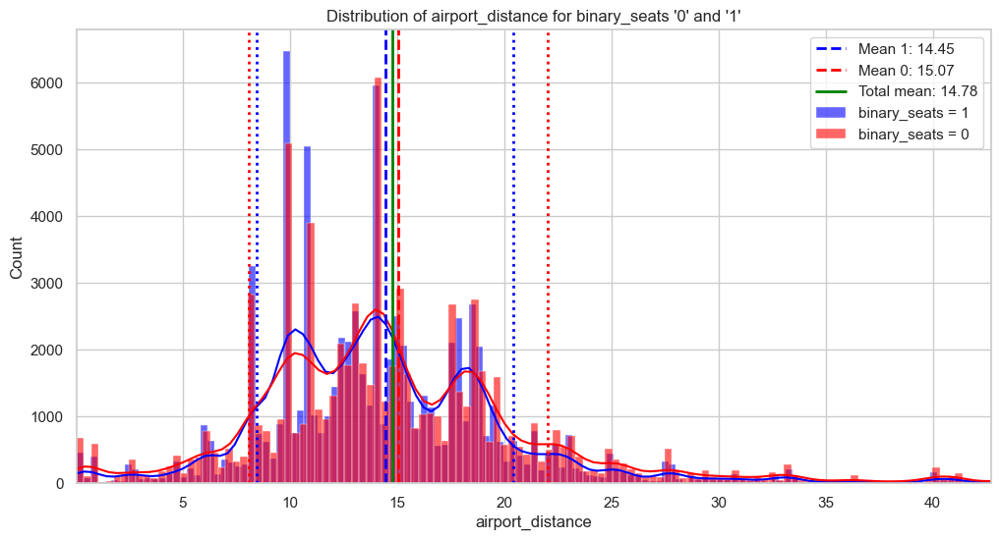

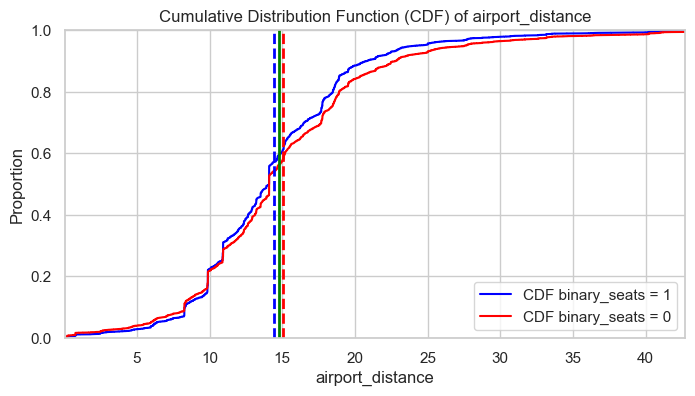

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/2489681251.py:68: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


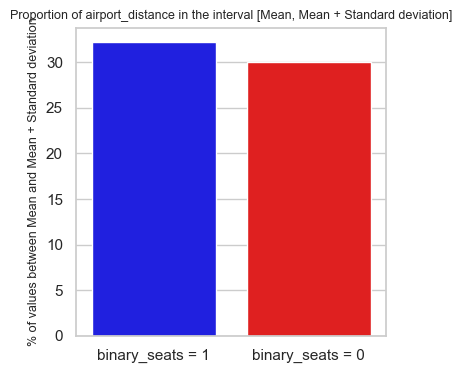

89923 79359
79359 79359
airport_distance

Mean (1) : 14.45, Mean (0) : 15.07, Total Mean : 14.78
Standard Deviation (1) : 6.00, Standard Deviation (0) : 6.98
32.20% of '1' are between the mean and the standard deviation
30.09% of '0' are between the mean and the standard deviation



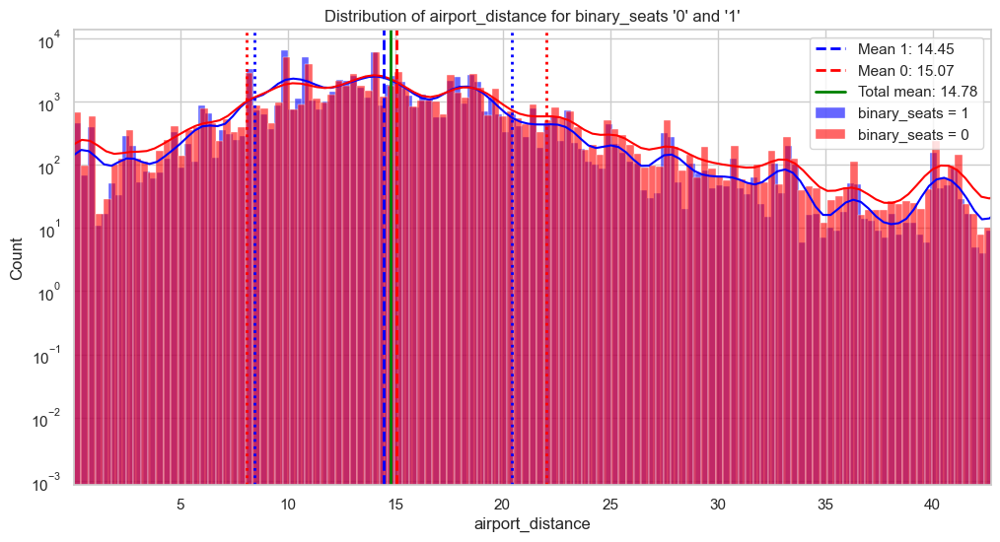

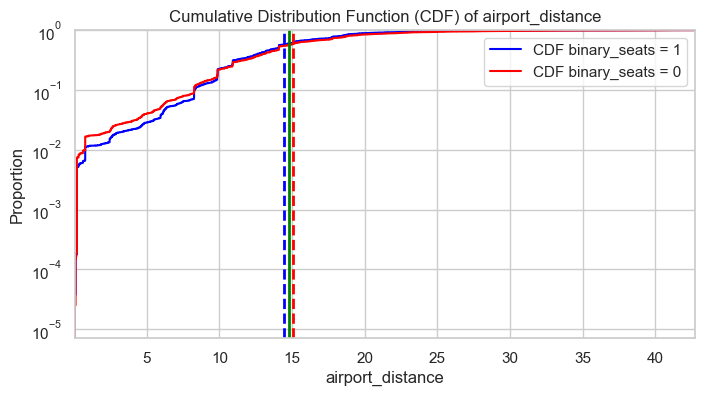

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/531870254.py:70: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


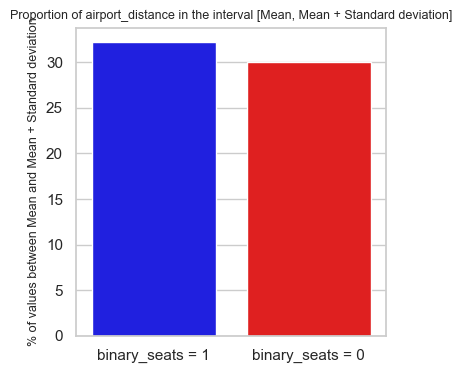

89923 79359
79359 79359
airport_distance (Log Transformed)

Mean (1) : 2.66, Mean (0) : 2.67, Total Mean : 2.67
Standard Deviation (1) : 0.44, Standard Deviation (0) : 0.50
45.15% of '1' are between the mean and the standard deviation
47.91% of '0' are between the mean and the standard deviation



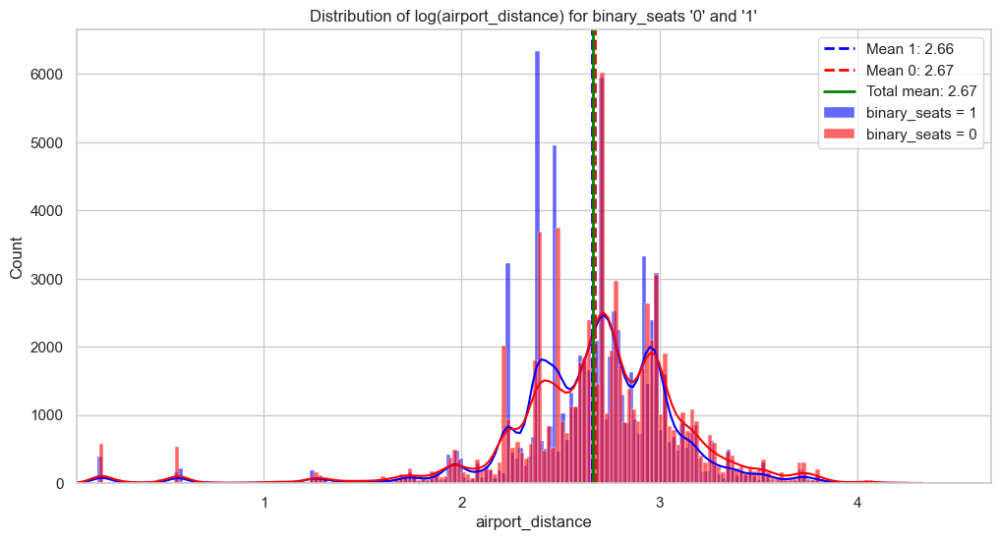

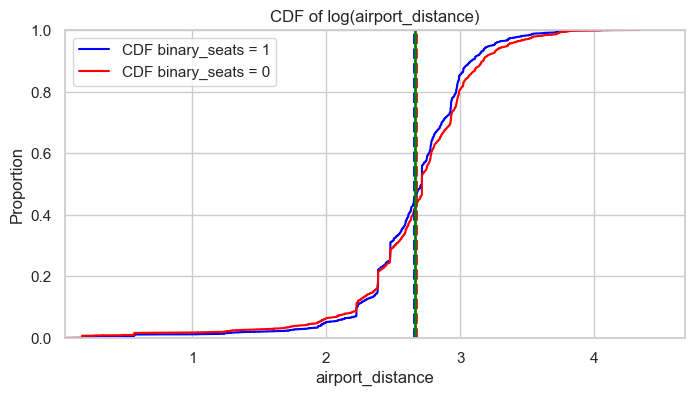

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/1832133660.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


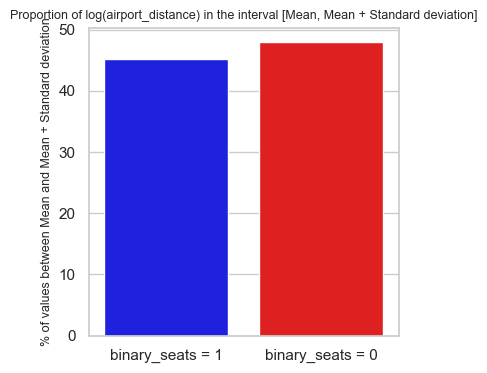

89923 79359
79359 79359
airport_distance (Log Transformed)

Mean (1) : 2.66, Mean (0) : 2.67, Total Mean : 2.67
Standard Deviation (1) : 0.44, Standard Deviation (0) : 0.50
45.15% of '1' are between the mean and the standard deviation
47.91% of '0' are between the mean and the standard deviation



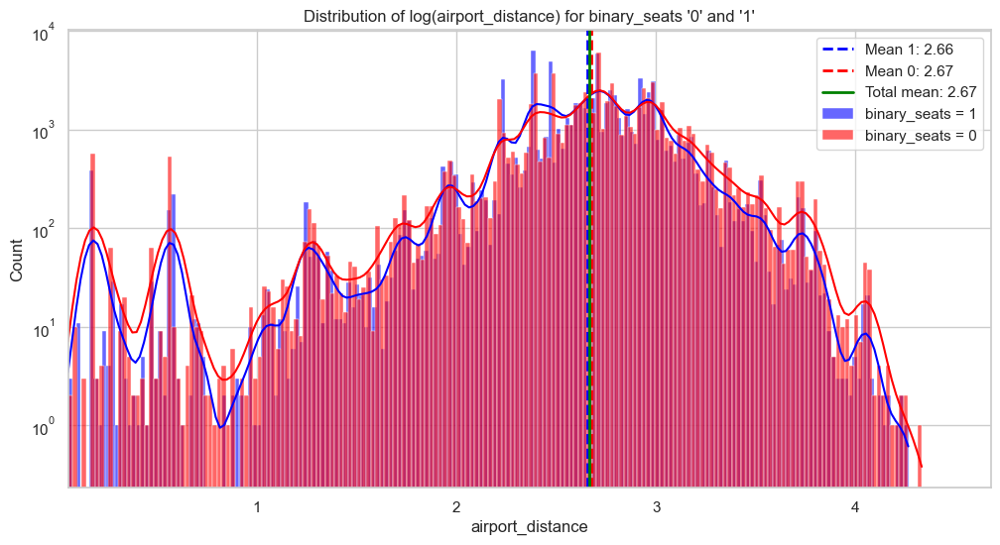

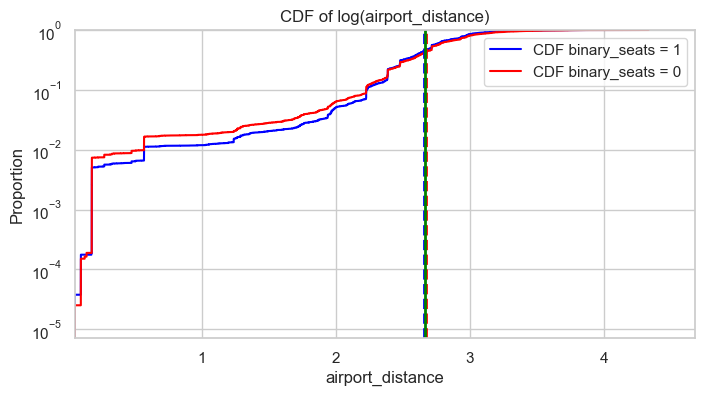

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/477769048.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


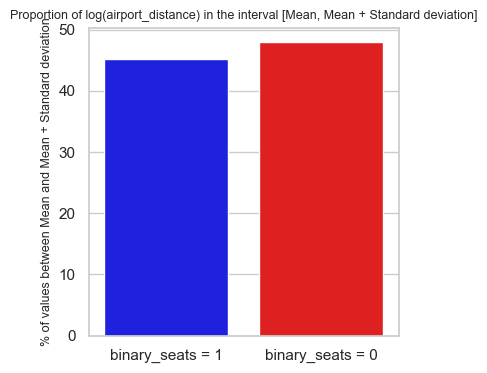

89923 79359
79359 79359
airport_density

Mean (1) : 0.01, Mean (0) : 0.01, Total Mean : 0.01
Standard Deviation (1) : 0.08, Standard Deviation (0) : 0.10
0.00% of '1' are between the mean and the standard deviation
0.00% of '0' are between the mean and the standard deviation



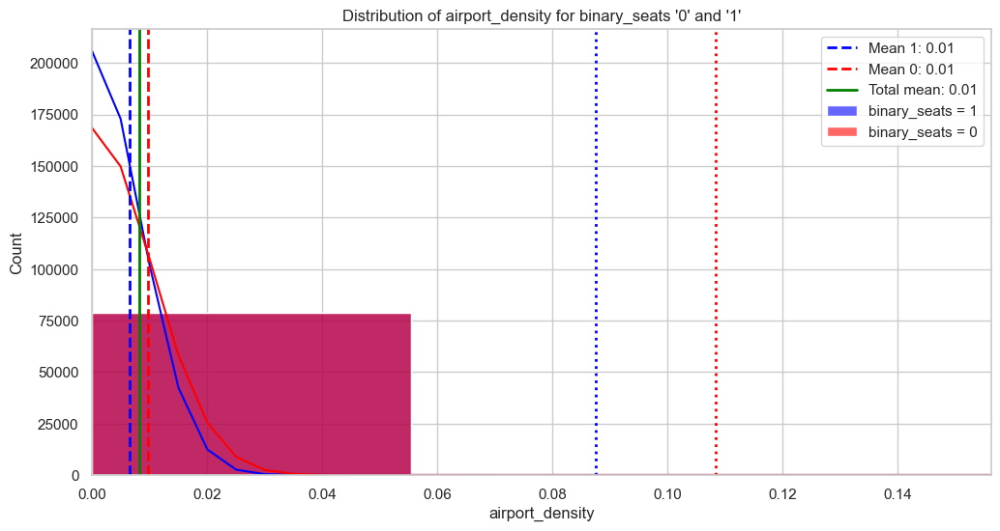

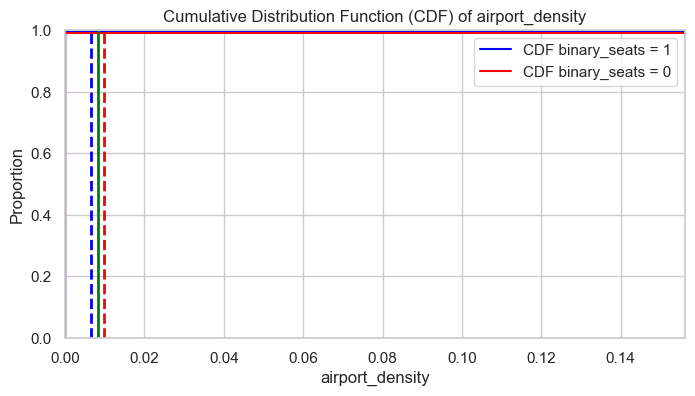

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/2489681251.py:68: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


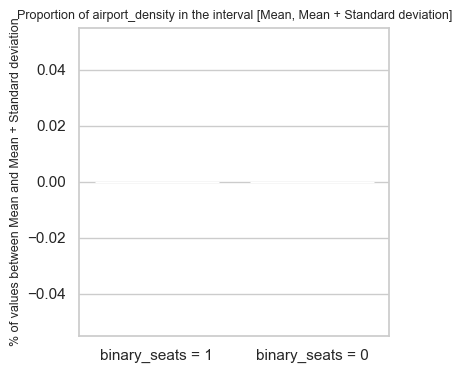

89923 79359
79359 79359
airport_density

Mean (1) : 0.01, Mean (0) : 0.01, Total Mean : 0.01
Standard Deviation (1) : 0.08, Standard Deviation (0) : 0.10
0.00% of '1' are between the mean and the standard deviation
0.00% of '0' are between the mean and the standard deviation



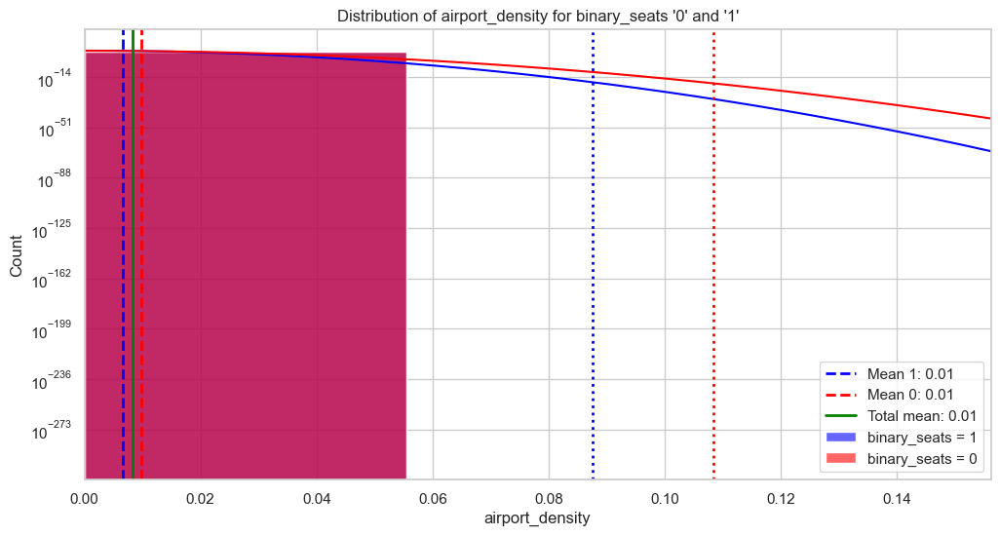

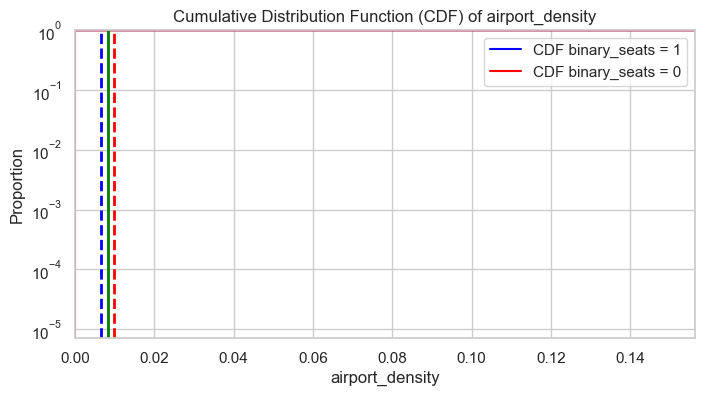

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/531870254.py:70: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


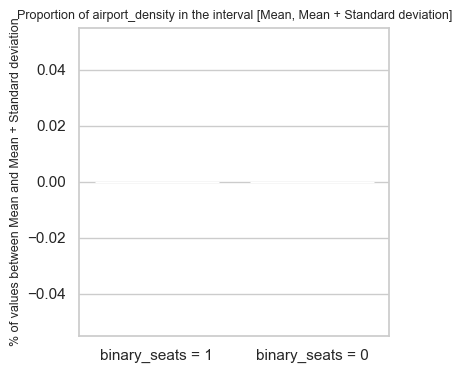

89923 79359
79359 79359
airport_density (Log Transformed)

Mean (1) : 0.00, Mean (0) : 0.01, Total Mean : 0.01
Standard Deviation (1) : 0.06, Standard Deviation (0) : 0.07
0.00% of '1' are between the mean and the standard deviation
0.00% of '0' are between the mean and the standard deviation



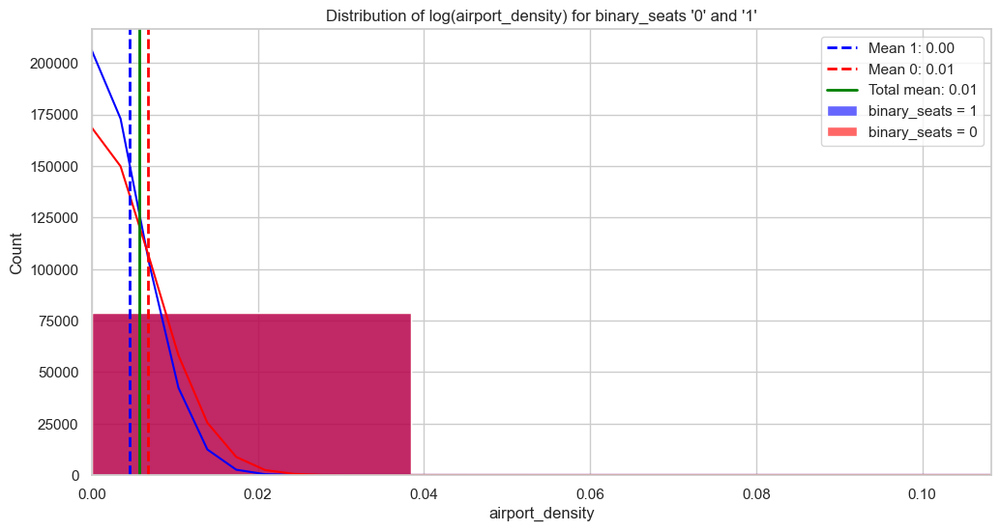

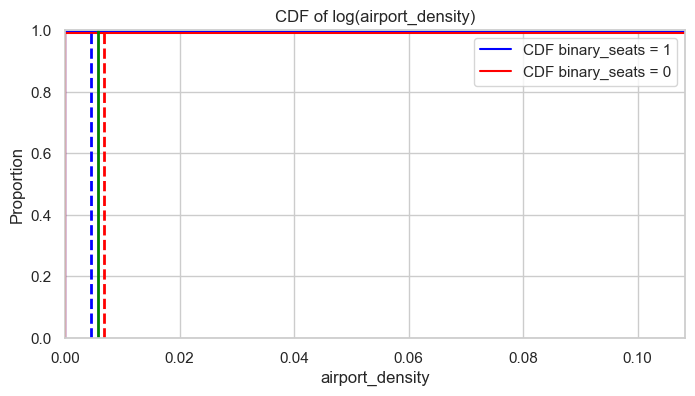

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/1832133660.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


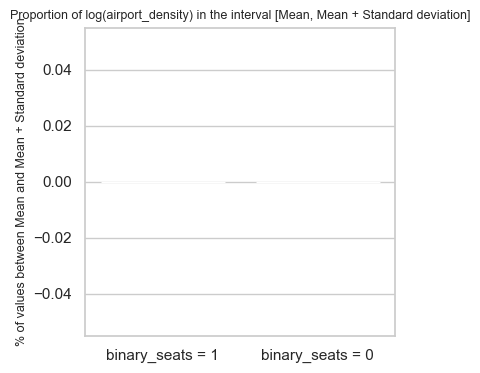

89923 79359
79359 79359
airport_density (Log Transformed)

Mean (1) : 0.00, Mean (0) : 0.01, Total Mean : 0.01
Standard Deviation (1) : 0.06, Standard Deviation (0) : 0.07
0.00% of '1' are between the mean and the standard deviation
0.00% of '0' are between the mean and the standard deviation



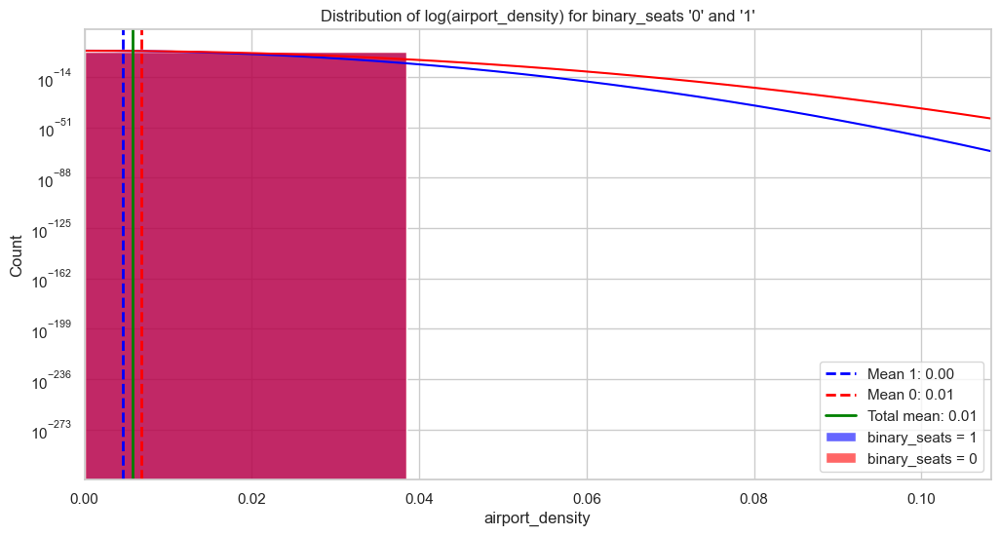

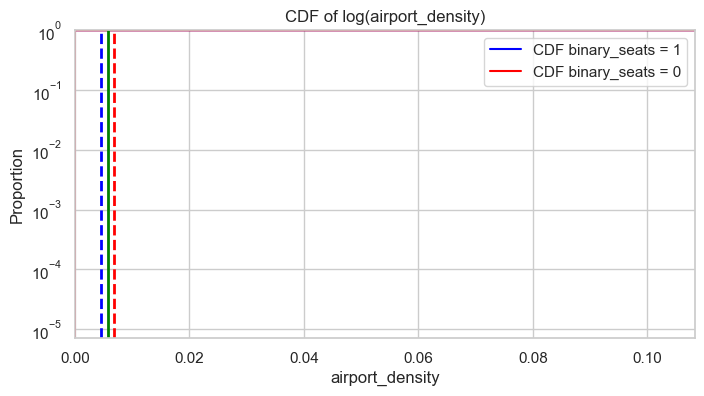

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/477769048.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


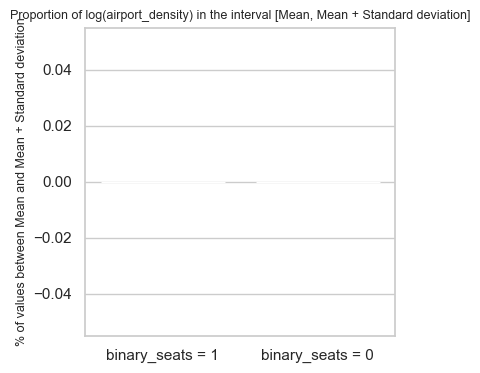

89923 79359
79359 79359
trainstation_distance

Mean (1) : 1.25, Mean (0) : 1.28, Total Mean : 1.27
Standard Deviation (1) : 1.14, Standard Deviation (0) : 1.26
33.36% of '1' are between the mean and the standard deviation
31.14% of '0' are between the mean and the standard deviation



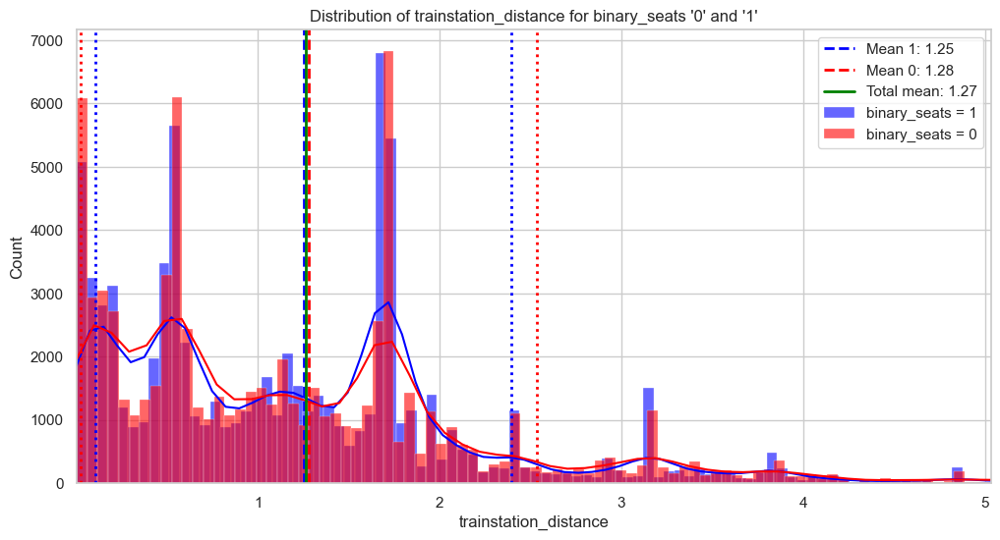

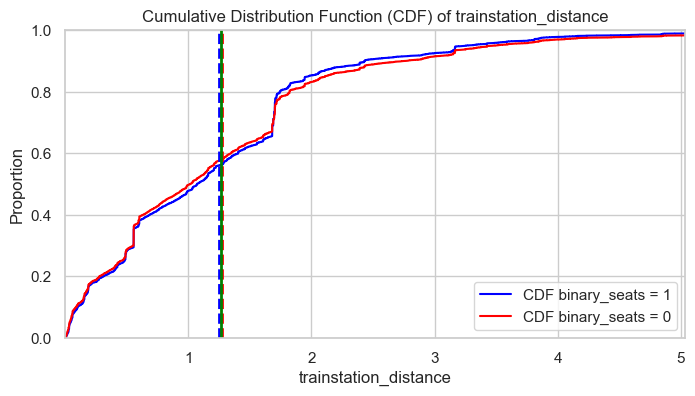

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/2489681251.py:68: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


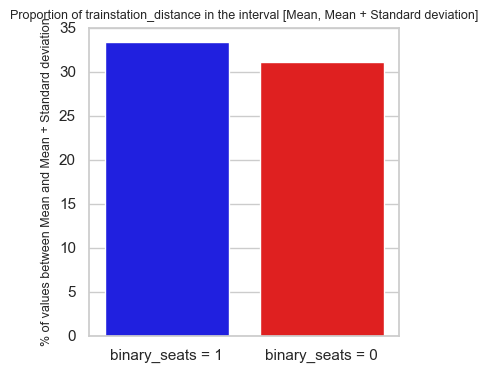

89923 79359
79359 79359
trainstation_distance

Mean (1) : 1.25, Mean (0) : 1.28, Total Mean : 1.27
Standard Deviation (1) : 1.14, Standard Deviation (0) : 1.26
33.36% of '1' are between the mean and the standard deviation
31.14% of '0' are between the mean and the standard deviation



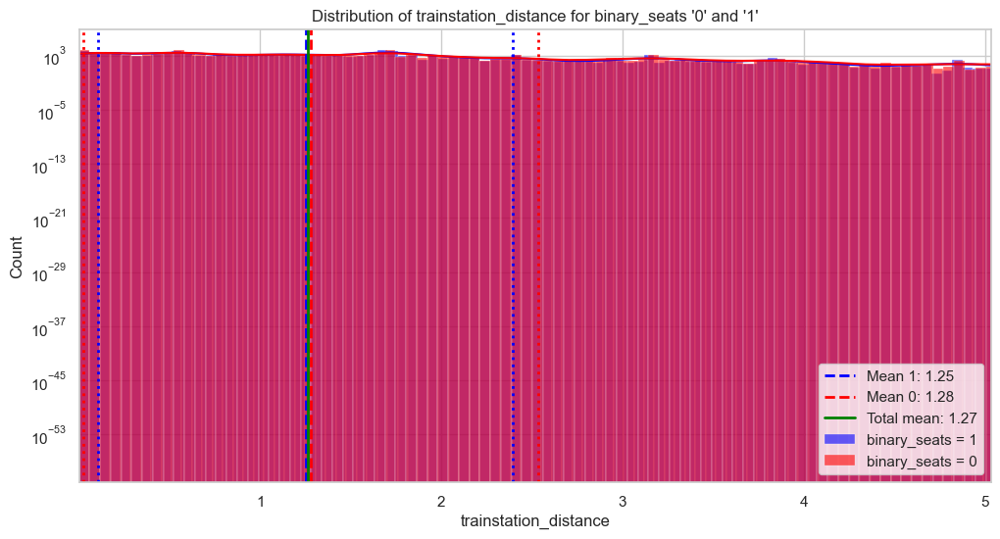

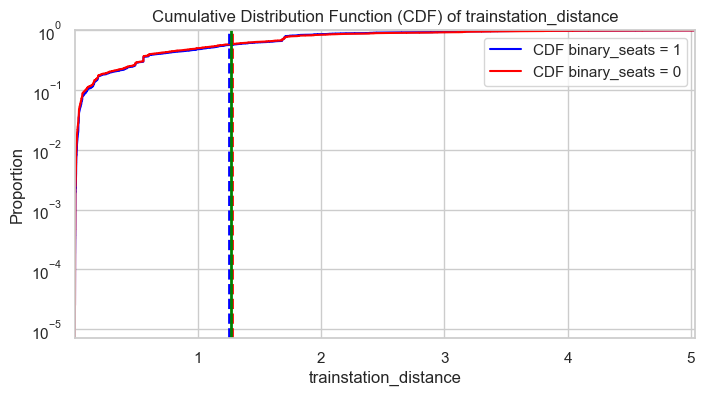

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/531870254.py:70: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


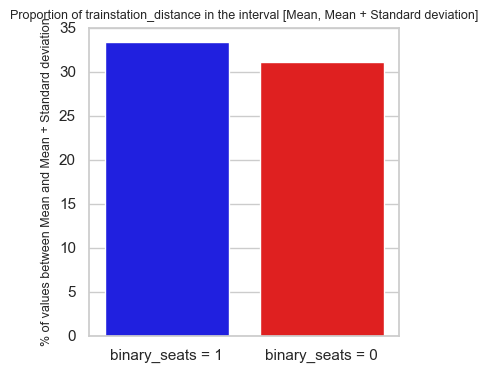

89923 79359
79359 79359
trainstation_distance (Log Transformed)

Mean (1) : 0.71, Mean (0) : 0.71, Total Mean : 0.71
Standard Deviation (1) : 0.44, Standard Deviation (0) : 0.46
39.20% of '1' are between the mean and the standard deviation
35.92% of '0' are between the mean and the standard deviation



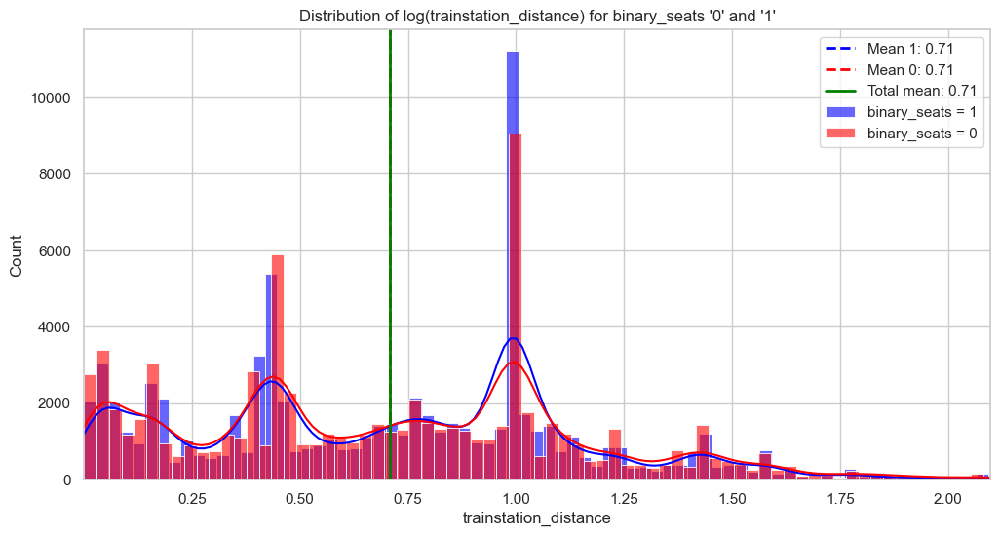

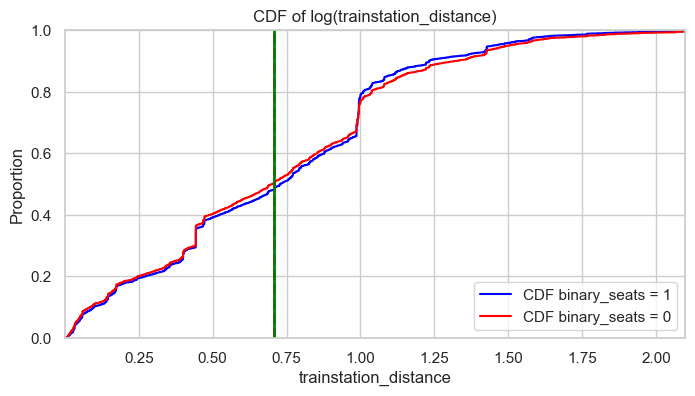

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/1832133660.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


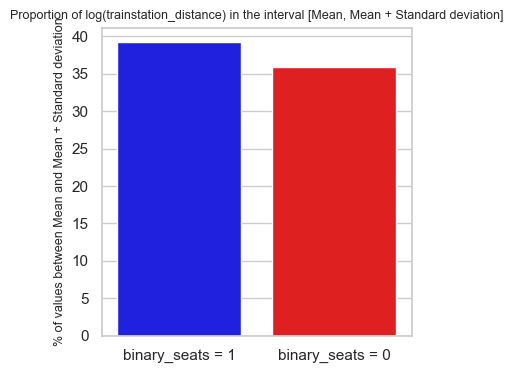

89923 79359
79359 79359
trainstation_distance (Log Transformed)

Mean (1) : 0.71, Mean (0) : 0.71, Total Mean : 0.71
Standard Deviation (1) : 0.44, Standard Deviation (0) : 0.46
39.20% of '1' are between the mean and the standard deviation
35.92% of '0' are between the mean and the standard deviation



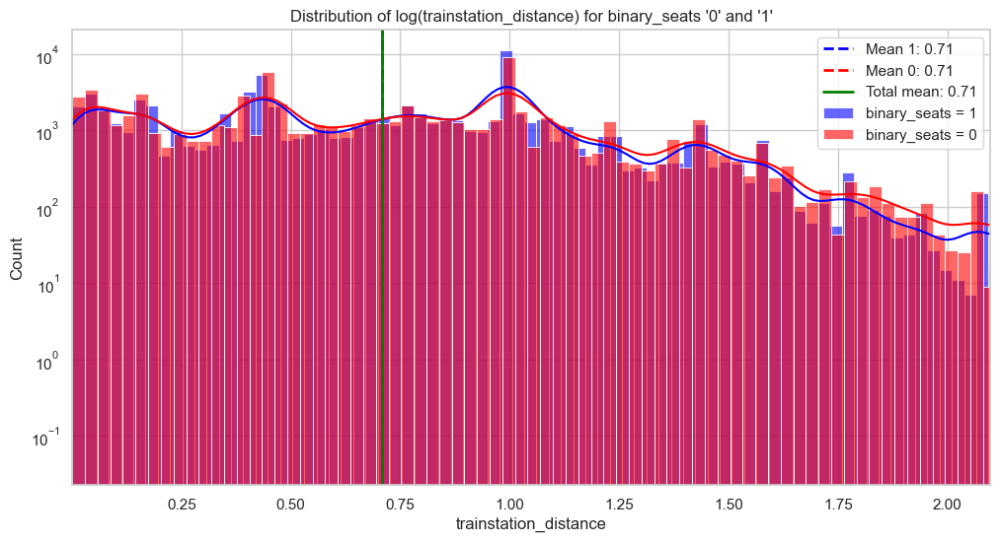

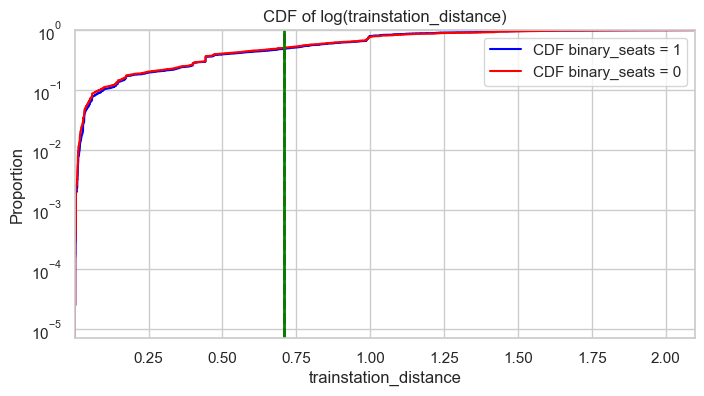

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/477769048.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


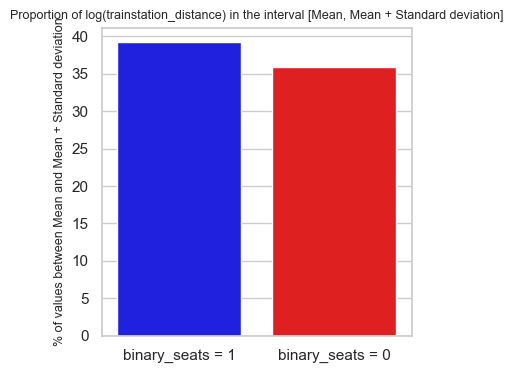

89923 79359
79359 79359
electric_distance

Mean (1) : 0.48, Mean (0) : 0.54, Total Mean : 0.51
Standard Deviation (1) : 0.64, Standard Deviation (0) : 0.74
22.97% of '1' are between the mean and the standard deviation
19.68% of '0' are between the mean and the standard deviation



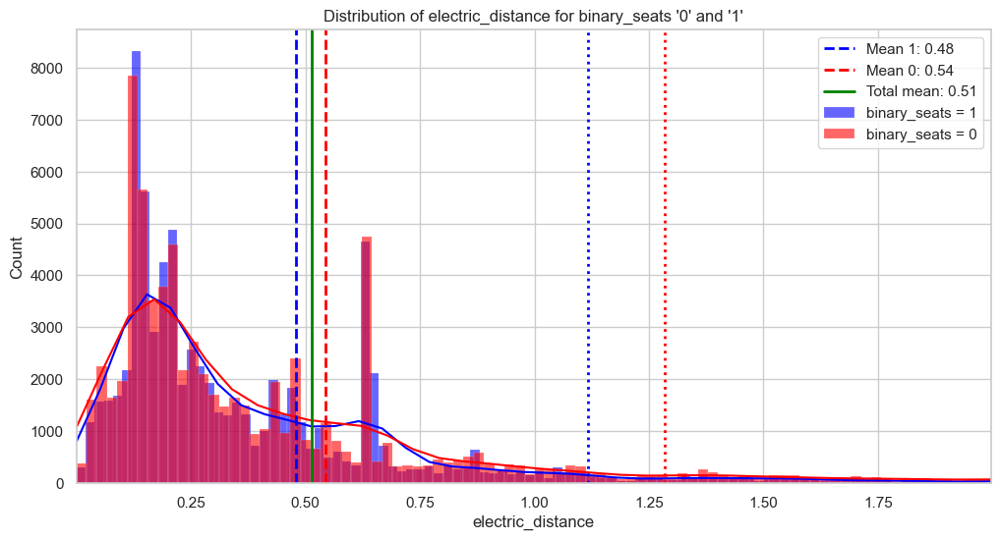

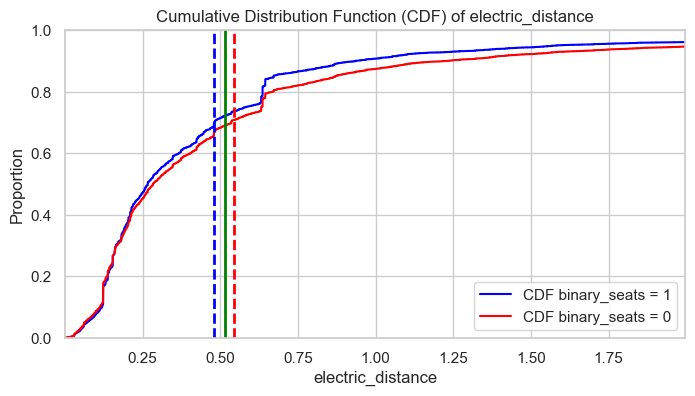

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/2489681251.py:68: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


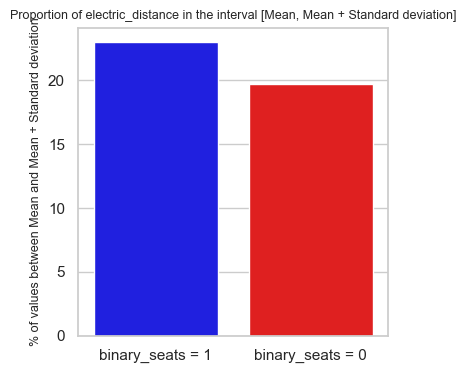

89923 79359
79359 79359
electric_distance

Mean (1) : 0.48, Mean (0) : 0.54, Total Mean : 0.51
Standard Deviation (1) : 0.64, Standard Deviation (0) : 0.74
22.97% of '1' are between the mean and the standard deviation
19.68% of '0' are between the mean and the standard deviation



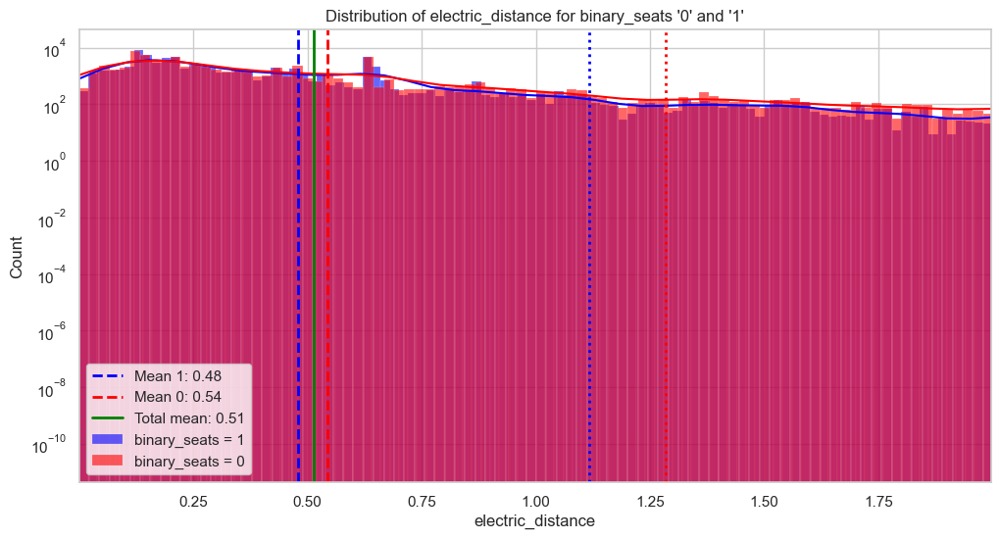

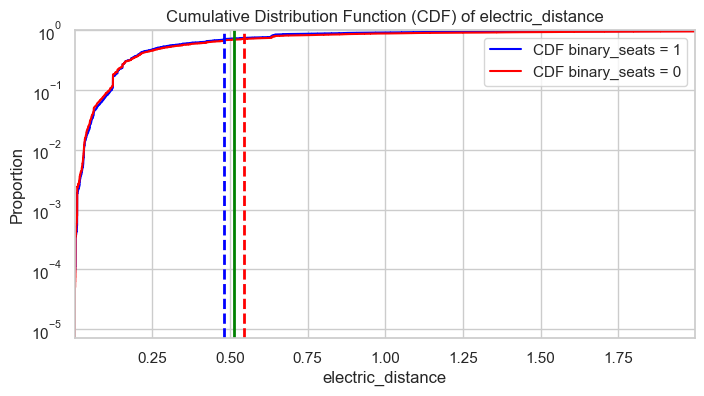

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/531870254.py:70: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


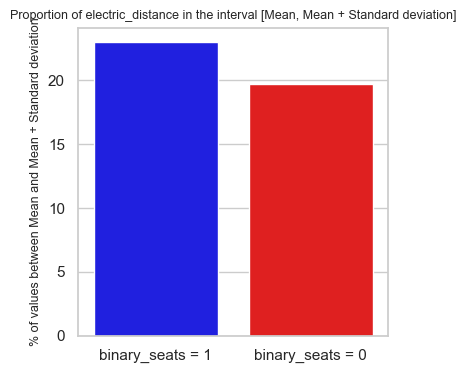

89923 79359
79359 79359
electric_distance (Log Transformed)

Mean (1) : 0.34, Mean (0) : 0.37, Total Mean : 0.35
Standard Deviation (1) : 0.29, Standard Deviation (0) : 0.33
26.99% of '1' are between the mean and the standard deviation
23.89% of '0' are between the mean and the standard deviation



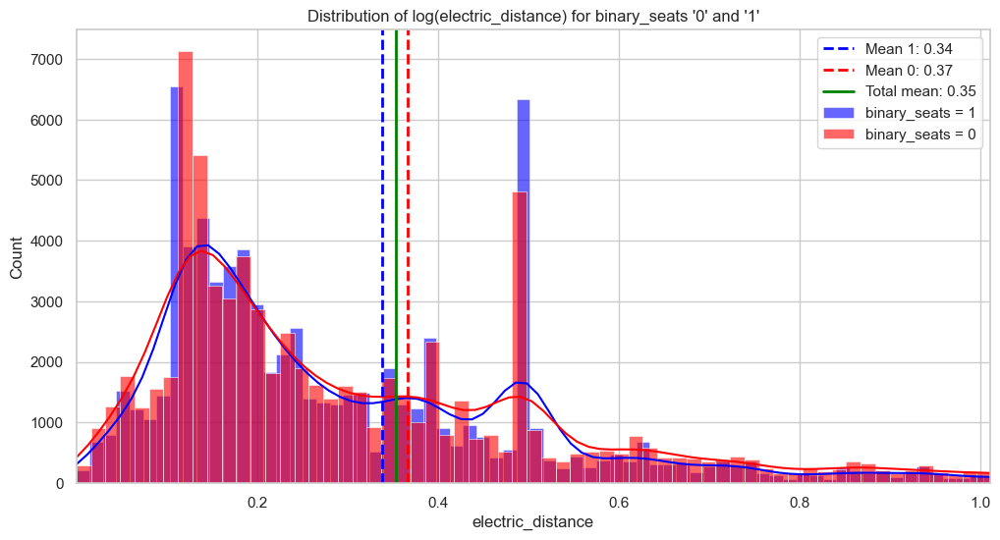

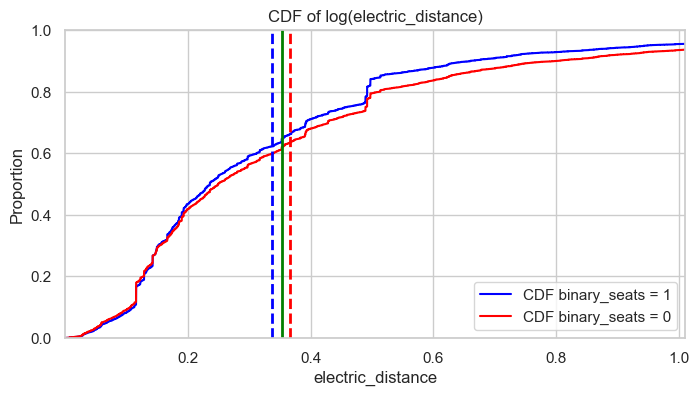

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/1832133660.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


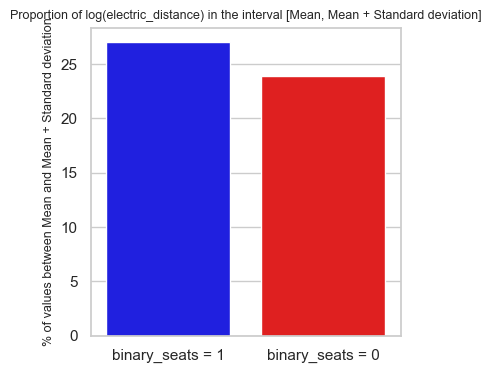

89923 79359
79359 79359
electric_distance (Log Transformed)

Mean (1) : 0.34, Mean (0) : 0.37, Total Mean : 0.35
Standard Deviation (1) : 0.29, Standard Deviation (0) : 0.33
26.99% of '1' are between the mean and the standard deviation
23.89% of '0' are between the mean and the standard deviation



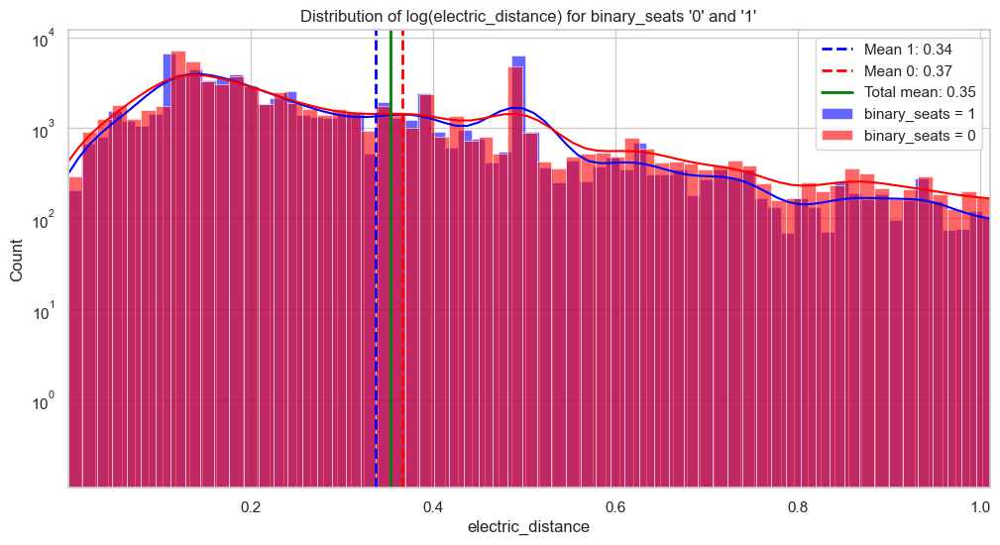

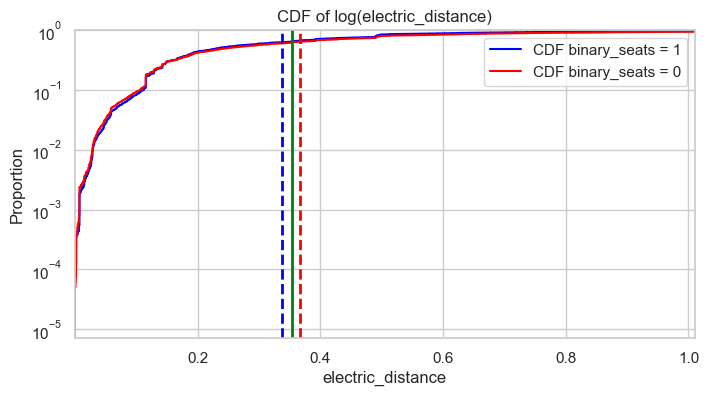

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/477769048.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


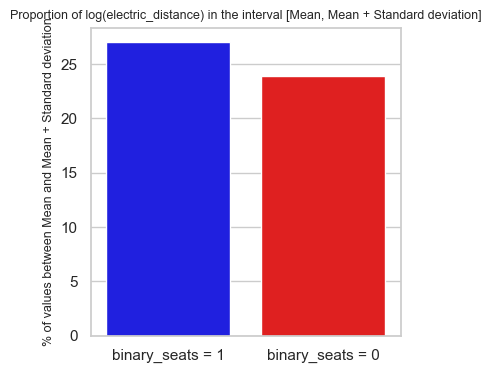

89923 79359
79359 79359
electric_density

Mean (1) : 5.93, Mean (0) : 5.38, Total Mean : 5.63
Standard Deviation (1) : 4.25, Standard Deviation (0) : 4.38
39.50% of '1' are between the mean and the standard deviation
29.08% of '0' are between the mean and the standard deviation



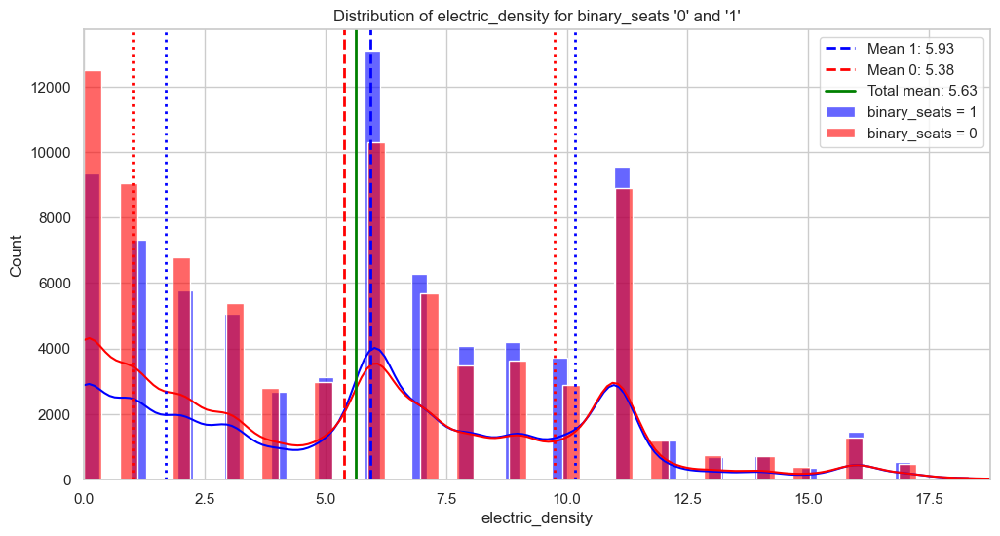

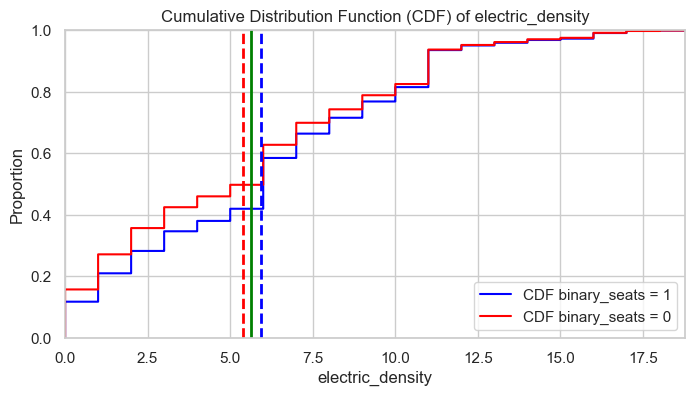

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/2489681251.py:68: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


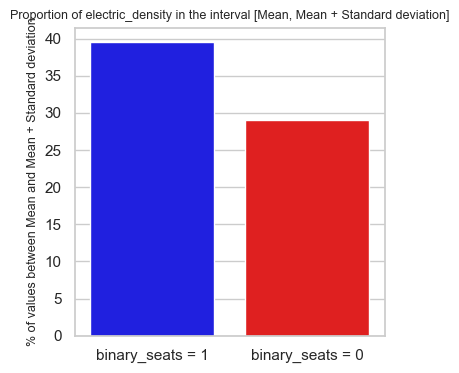

89923 79359
79359 79359
electric_density

Mean (1) : 5.93, Mean (0) : 5.38, Total Mean : 5.63
Standard Deviation (1) : 4.25, Standard Deviation (0) : 4.38
39.50% of '1' are between the mean and the standard deviation
29.08% of '0' are between the mean and the standard deviation



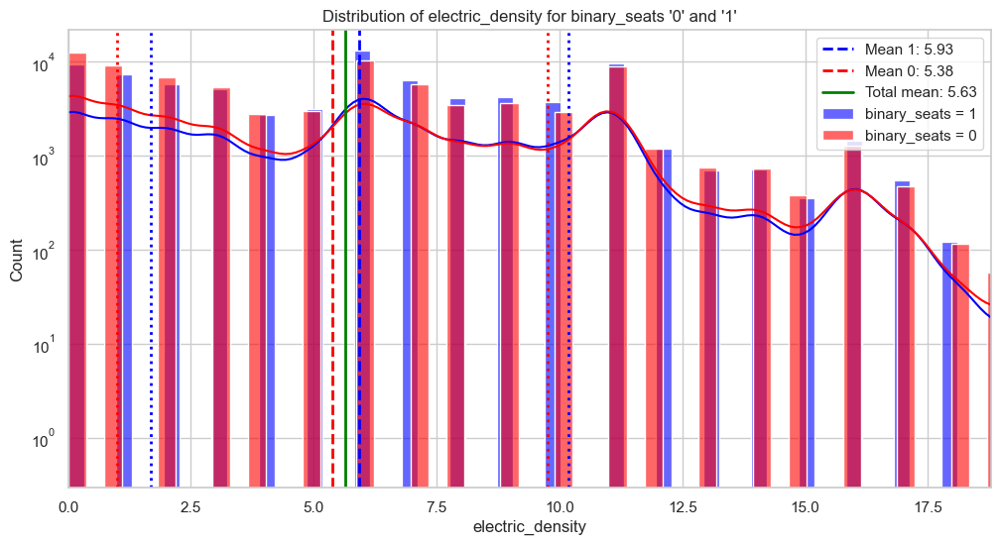

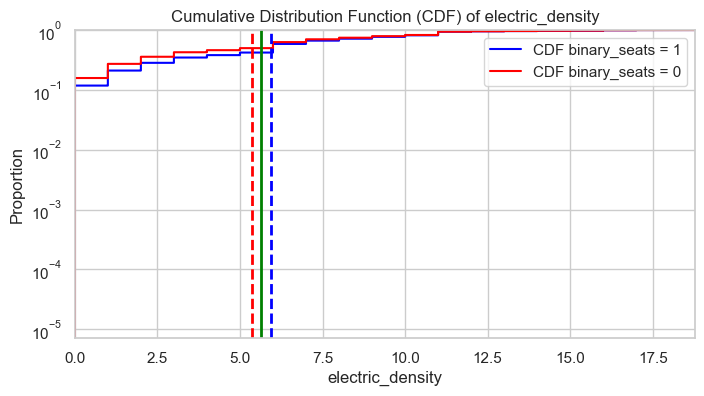

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/531870254.py:70: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


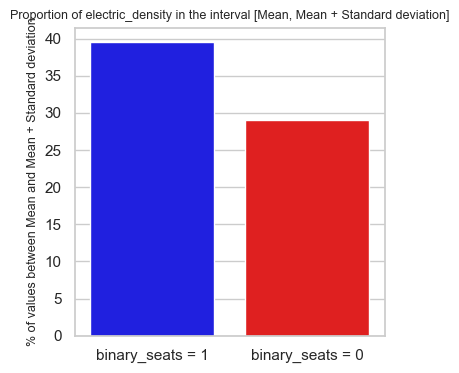

89923 79359
79359 79359
electric_density (Log Transformed)

Mean (1) : 1.67, Mean (0) : 1.53, Total Mean : 1.59
Standard Deviation (1) : 0.83, Standard Deviation (0) : 0.88
55.47% of '1' are between the mean and the standard deviation
39.99% of '0' are between the mean and the standard deviation



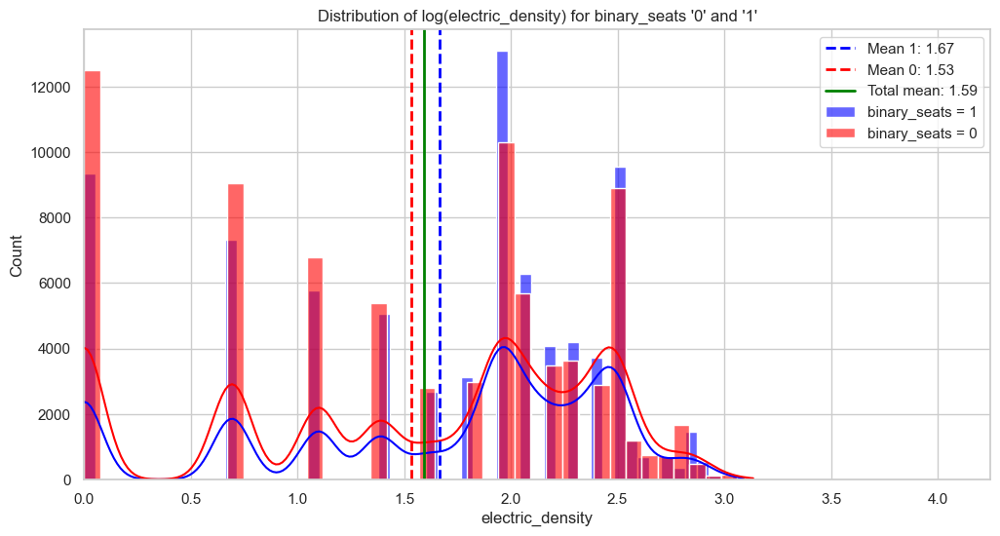

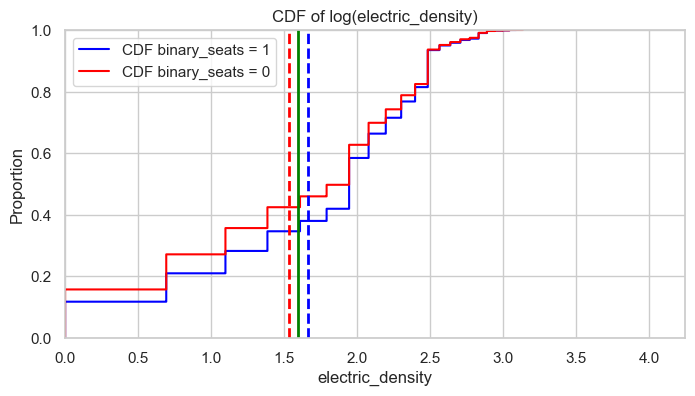

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/1832133660.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


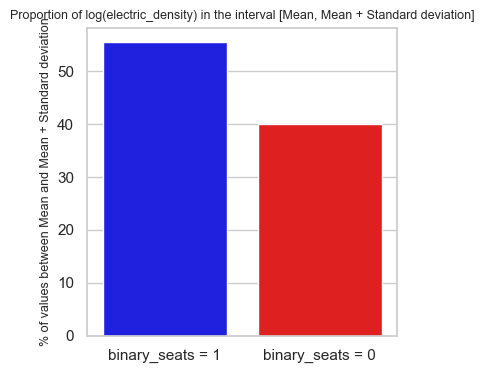

89923 79359
79359 79359
electric_density (Log Transformed)

Mean (1) : 1.67, Mean (0) : 1.53, Total Mean : 1.59
Standard Deviation (1) : 0.83, Standard Deviation (0) : 0.88
55.47% of '1' are between the mean and the standard deviation
39.99% of '0' are between the mean and the standard deviation



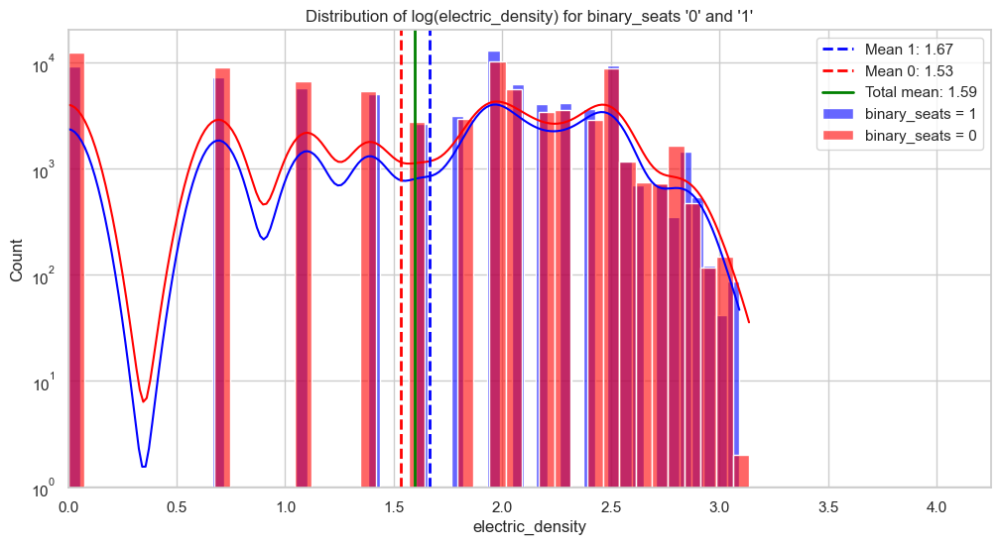

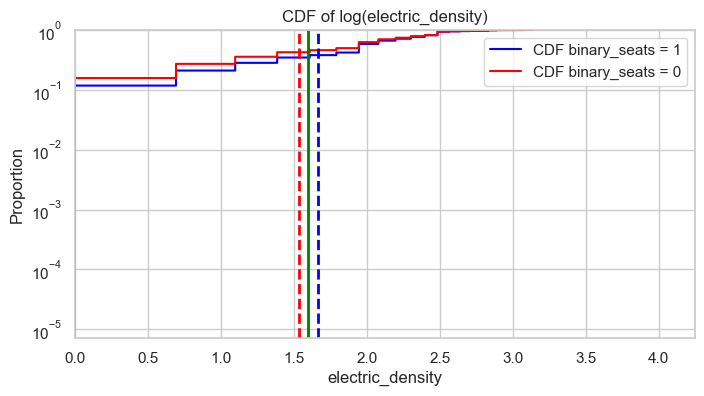

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/477769048.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


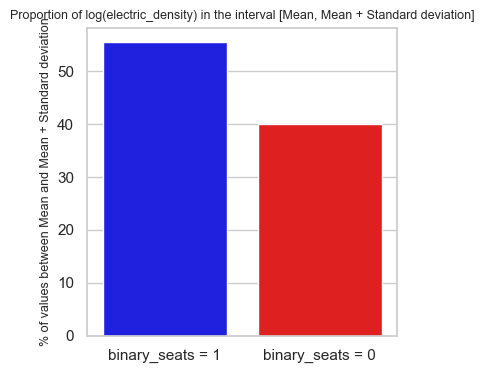

89923 79359
79359 79359
bicycle_parking_distance

Mean (1) : 0.13, Mean (0) : 0.18, Total Mean : 0.15
Standard Deviation (1) : 0.37, Standard Deviation (0) : 0.52
12.54% of '1' are between the mean and the standard deviation
13.07% of '0' are between the mean and the standard deviation



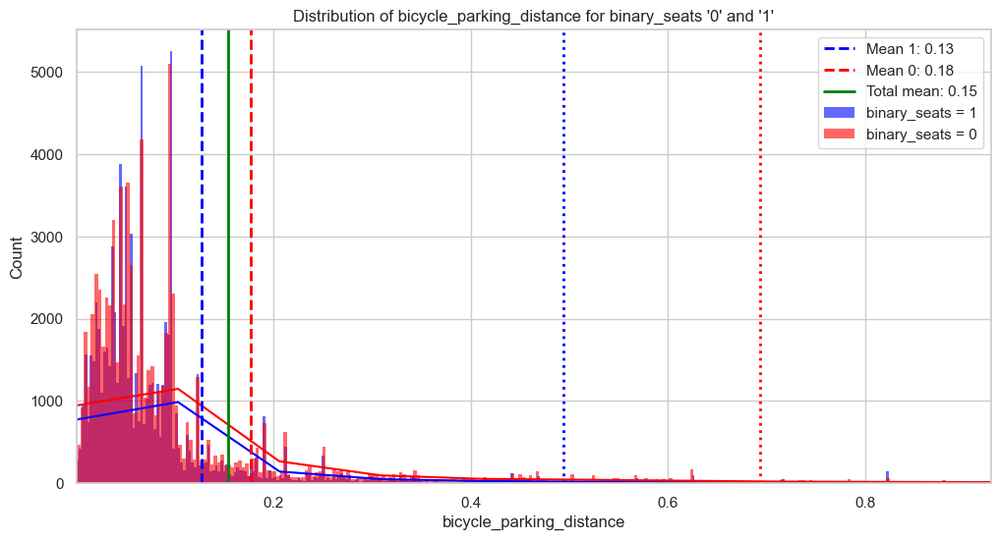

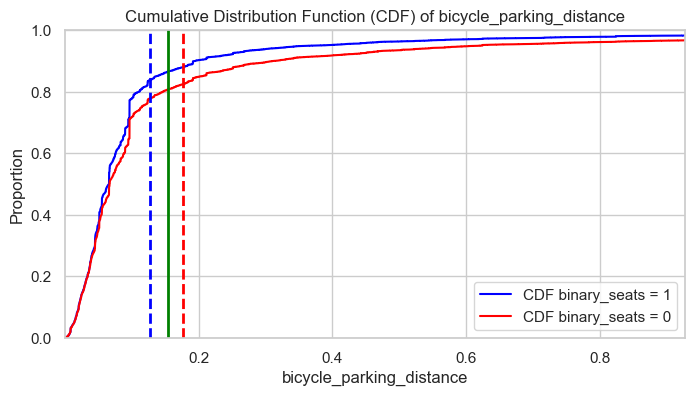

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/2489681251.py:68: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


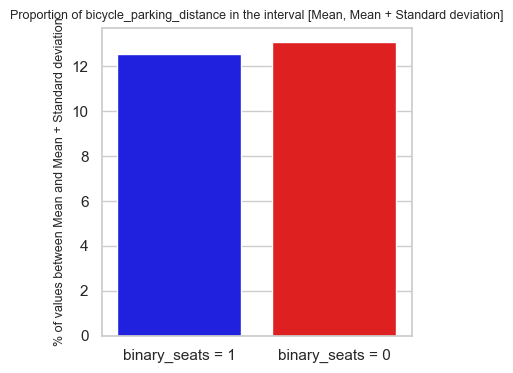

89923 79359
79359 79359
bicycle_parking_distance

Mean (1) : 0.13, Mean (0) : 0.18, Total Mean : 0.15
Standard Deviation (1) : 0.37, Standard Deviation (0) : 0.52
12.54% of '1' are between the mean and the standard deviation
13.07% of '0' are between the mean and the standard deviation



/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


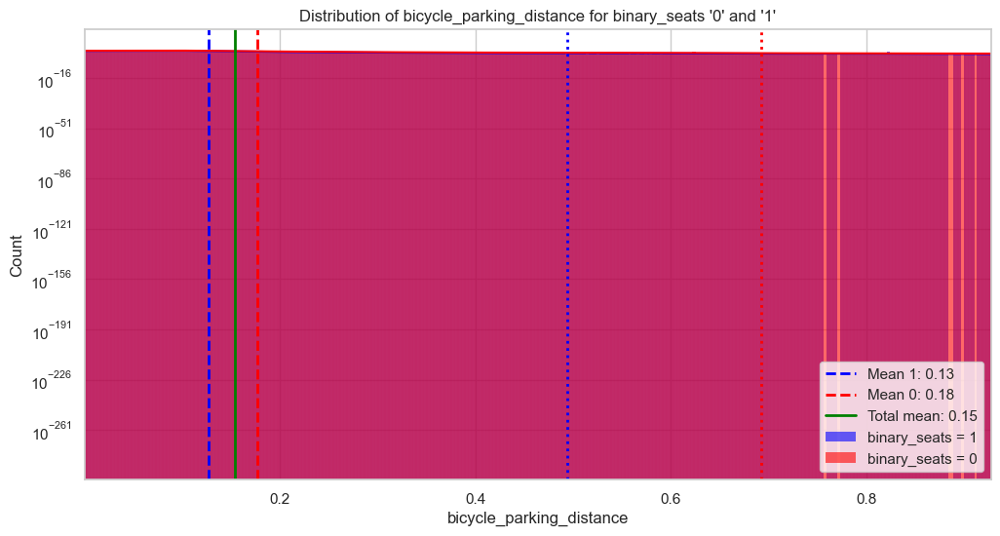

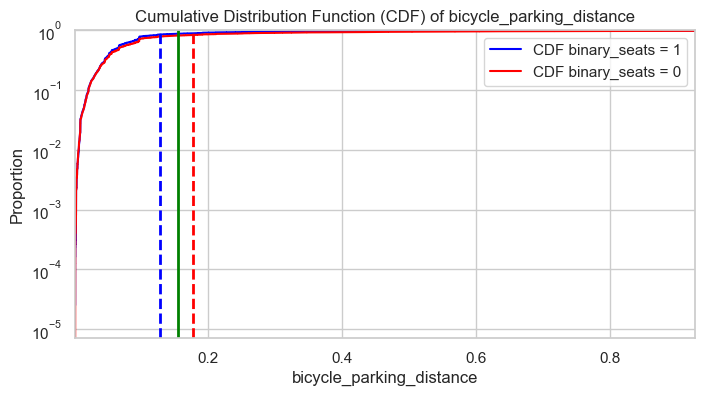

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/531870254.py:70: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


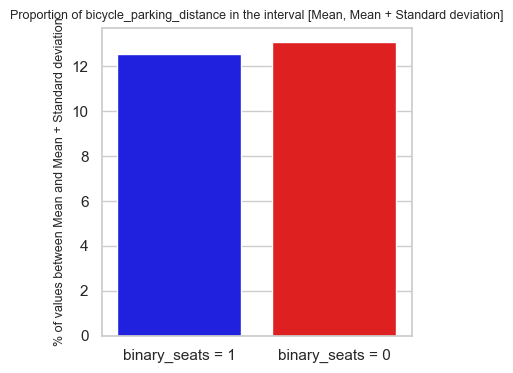

89923 79359
79359 79359
bicycle_parking_distance (Log Transformed)

Mean (1) : 0.10, Mean (0) : 0.13, Total Mean : 0.12
Standard Deviation (1) : 0.16, Standard Deviation (0) : 0.21
14.29% of '1' are between the mean and the standard deviation
12.88% of '0' are between the mean and the standard deviation



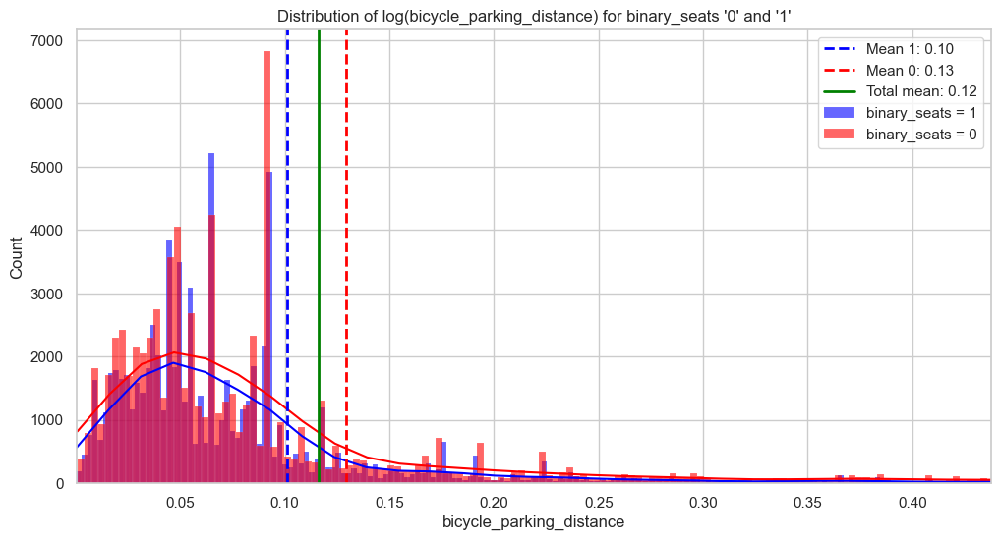

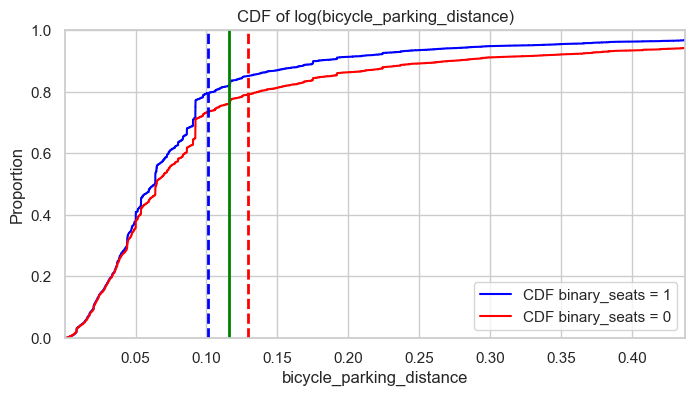

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/1832133660.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


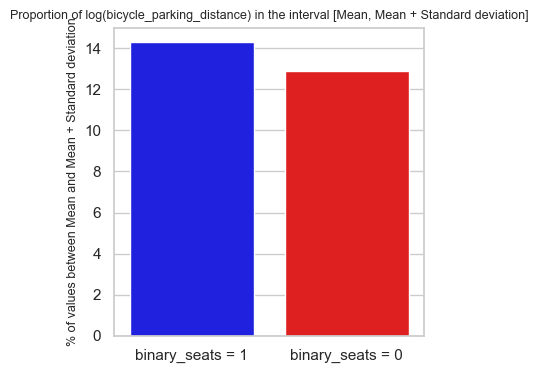

89923 79359
79359 79359
bicycle_parking_distance (Log Transformed)

Mean (1) : 0.10, Mean (0) : 0.13, Total Mean : 0.12
Standard Deviation (1) : 0.16, Standard Deviation (0) : 0.21
14.29% of '1' are between the mean and the standard deviation
12.88% of '0' are between the mean and the standard deviation



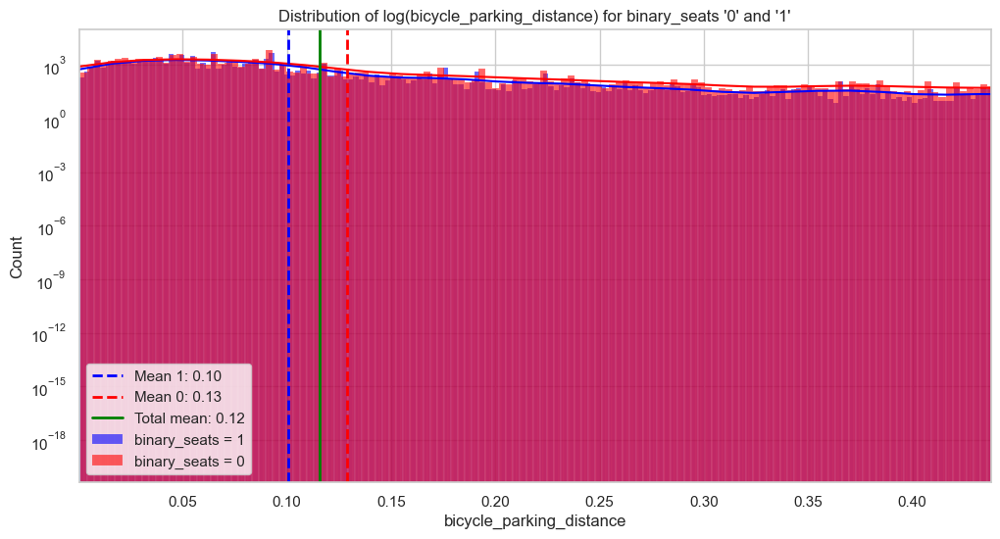

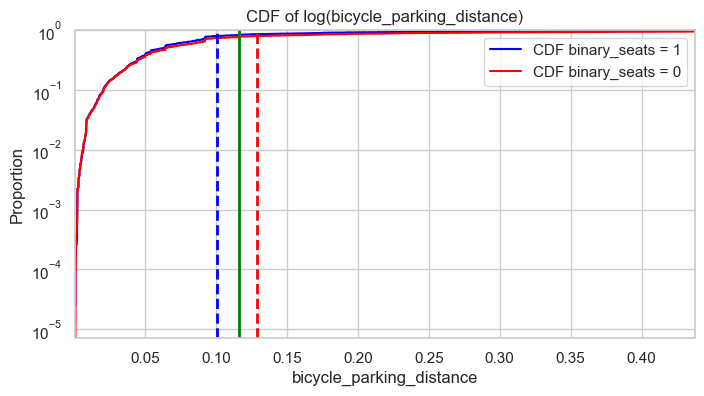

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/477769048.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


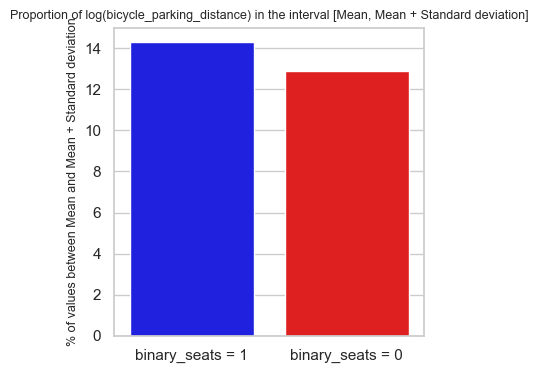

89923 79359
79359 79359
bicycle_parking_density

Mean (1) : 146.49, Mean (0) : 129.73, Total Mean : 137.42
Standard Deviation (1) : 123.18, Standard Deviation (0) : 128.01
28.78% of '1' are between the mean and the standard deviation
27.38% of '0' are between the mean and the standard deviation



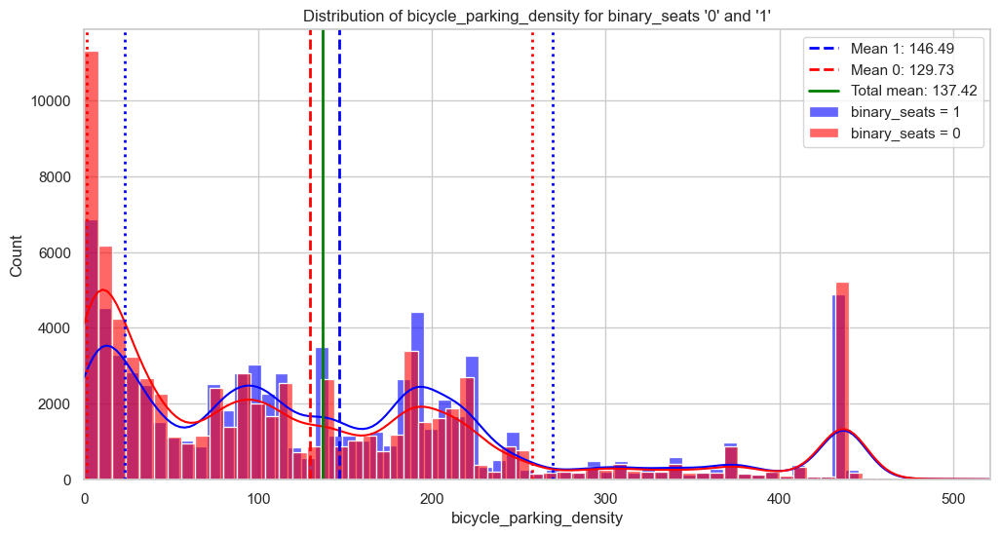

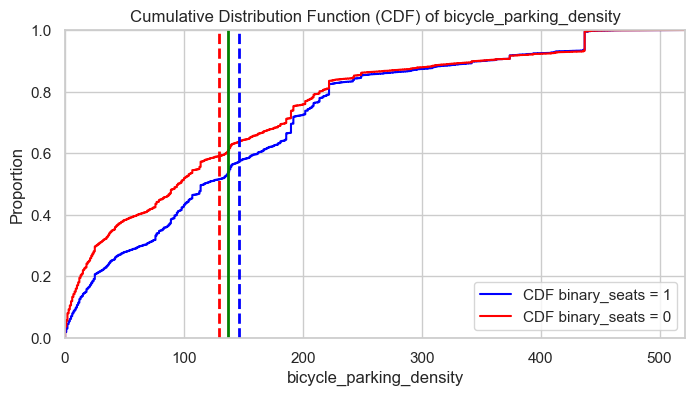

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/2489681251.py:68: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


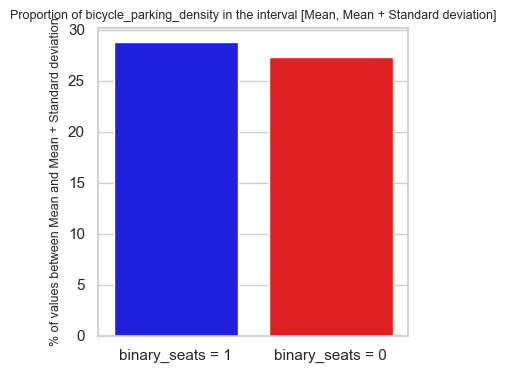

89923 79359
79359 79359
bicycle_parking_density

Mean (1) : 146.49, Mean (0) : 129.73, Total Mean : 137.42
Standard Deviation (1) : 123.18, Standard Deviation (0) : 128.01
28.78% of '1' are between the mean and the standard deviation
27.38% of '0' are between the mean and the standard deviation



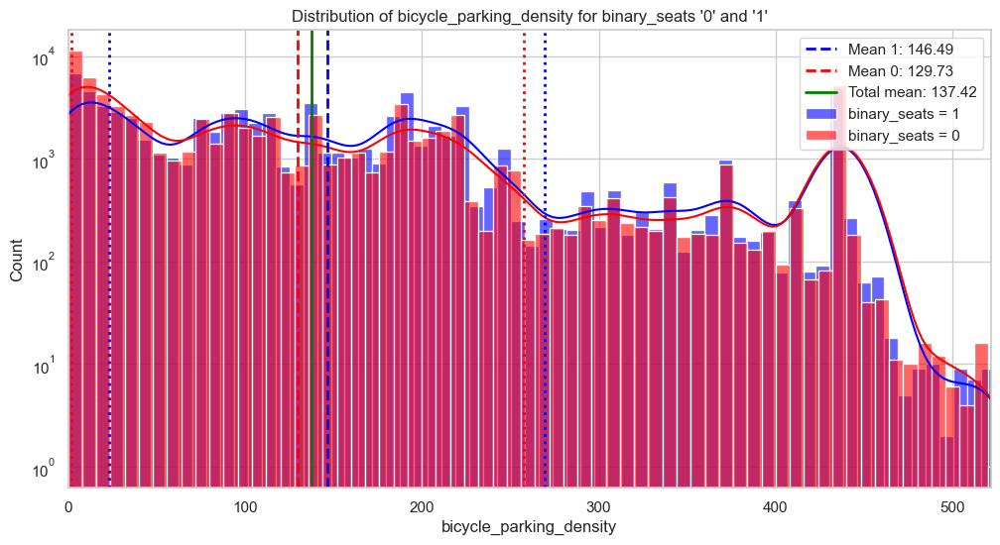

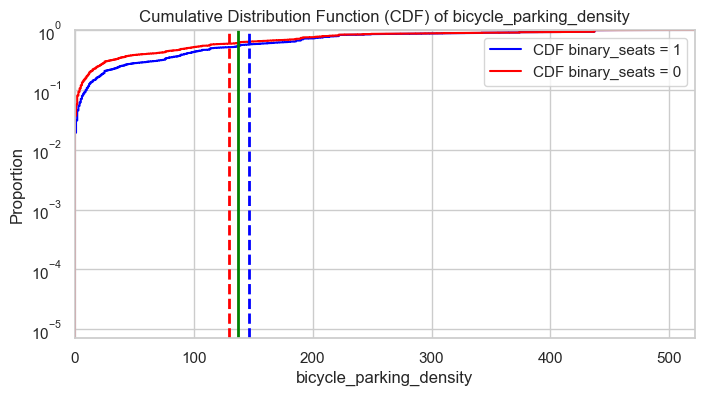

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/531870254.py:70: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


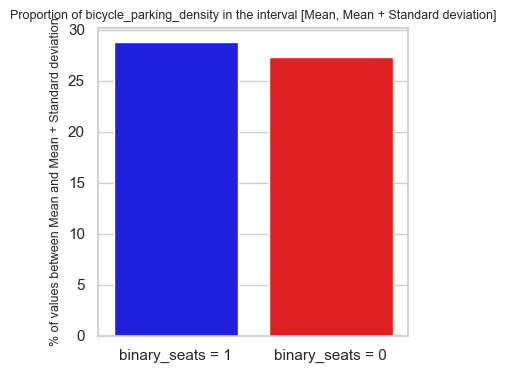

89923 79359
79359 79359
bicycle_parking_density (Log Transformed)

Mean (1) : 4.40, Mean (0) : 4.07, Total Mean : 4.22
Standard Deviation (1) : 1.39, Standard Deviation (0) : 1.61
53.87% of '1' are between the mean and the standard deviation
47.89% of '0' are between the mean and the standard deviation



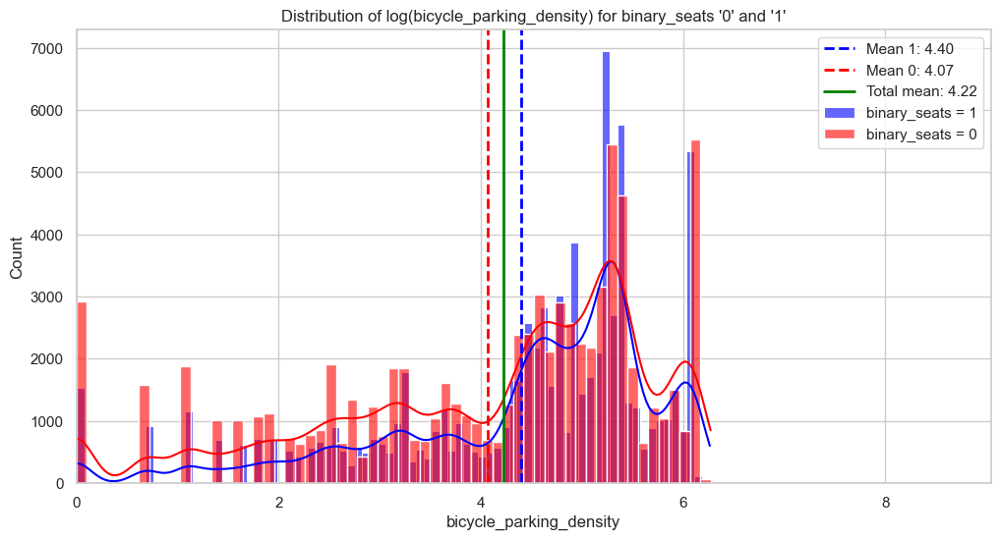

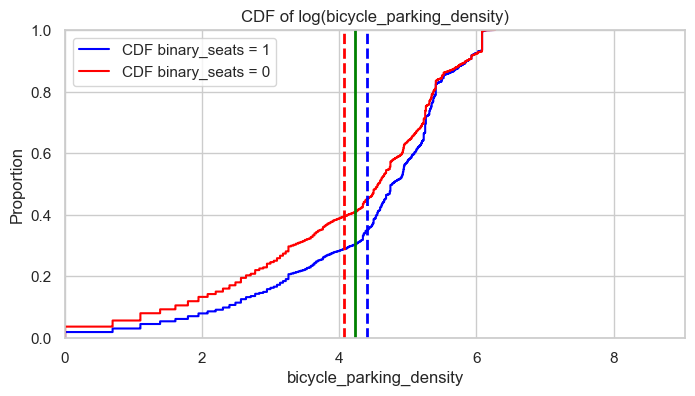

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/1832133660.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


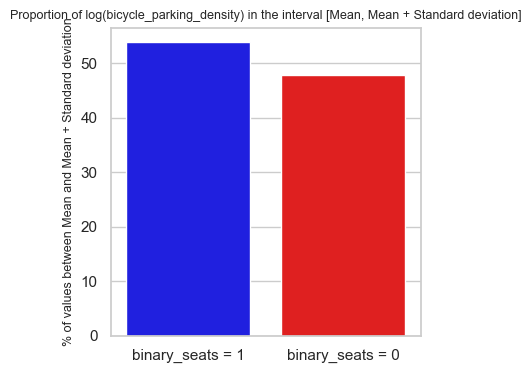

89923 79359
79359 79359
bicycle_parking_density (Log Transformed)

Mean (1) : 4.40, Mean (0) : 4.07, Total Mean : 4.22
Standard Deviation (1) : 1.39, Standard Deviation (0) : 1.61
53.87% of '1' are between the mean and the standard deviation
47.89% of '0' are between the mean and the standard deviation



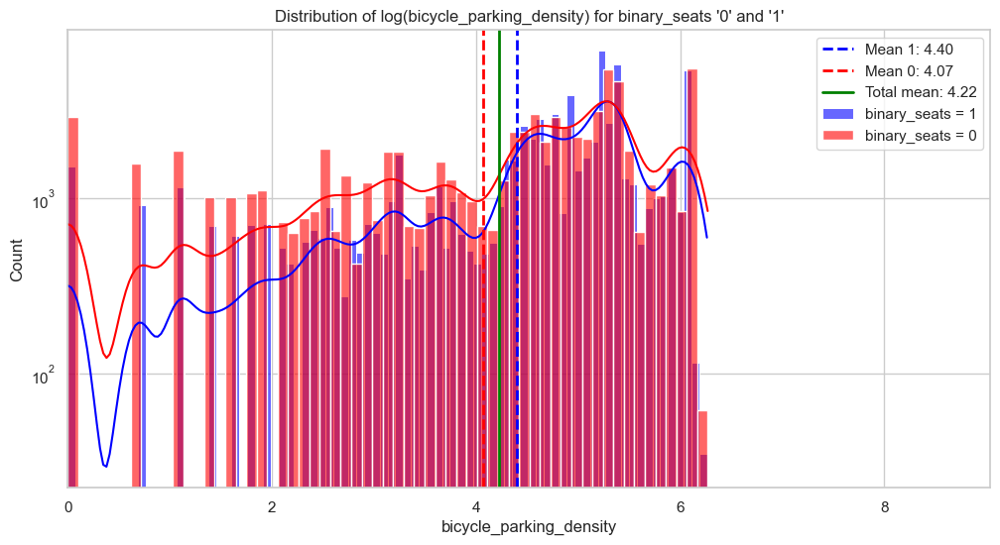

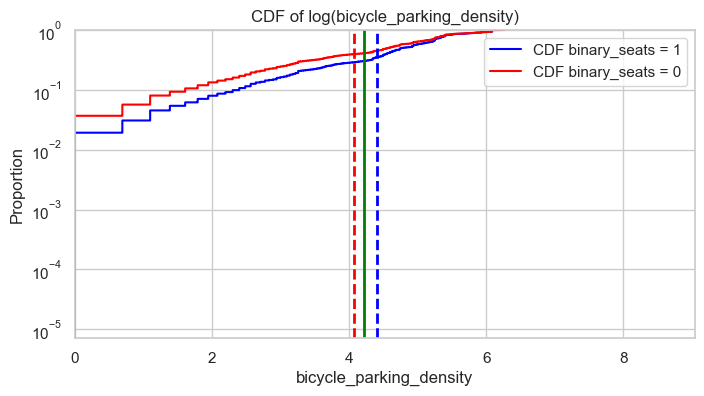

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/477769048.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


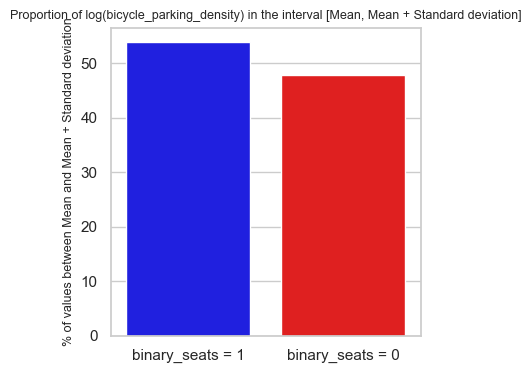

89923 79359
79359 79359
tram_stop_distance

Mean (1) : 1.97, Mean (0) : 2.64, Total Mean : 2.33
Standard Deviation (1) : 3.26, Standard Deviation (0) : 4.17
24.90% of '1' are between the mean and the standard deviation
22.95% of '0' are between the mean and the standard deviation



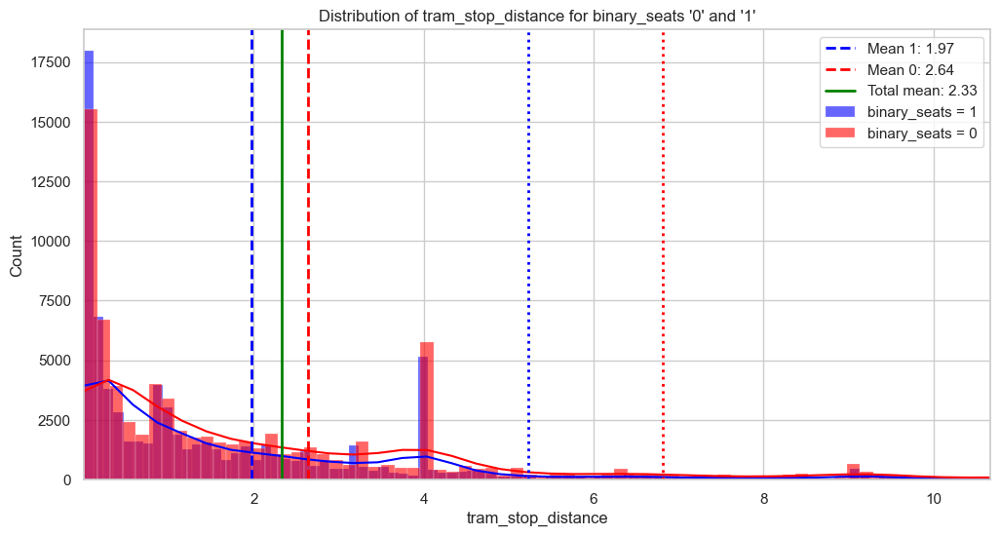

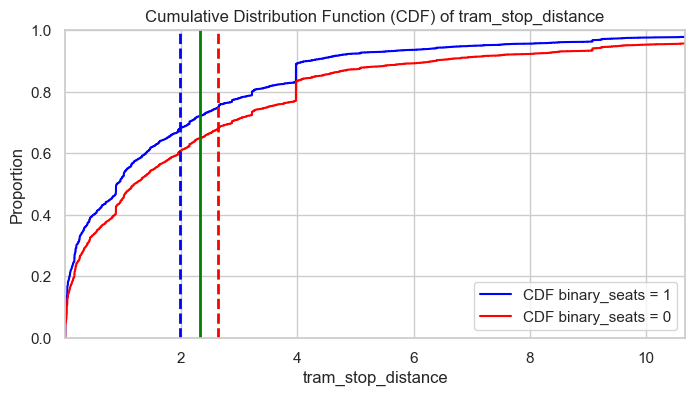

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/2489681251.py:68: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


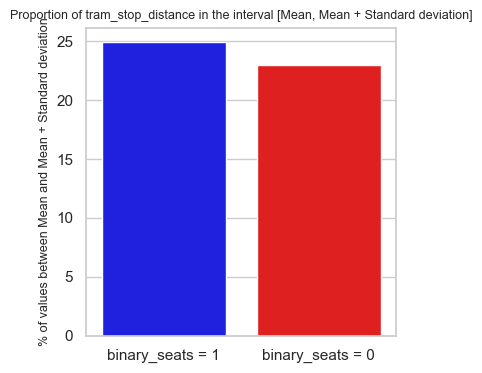

89923 79359
79359 79359
tram_stop_distance

Mean (1) : 1.97, Mean (0) : 2.64, Total Mean : 2.33
Standard Deviation (1) : 3.26, Standard Deviation (0) : 4.17
24.90% of '1' are between the mean and the standard deviation
22.95% of '0' are between the mean and the standard deviation



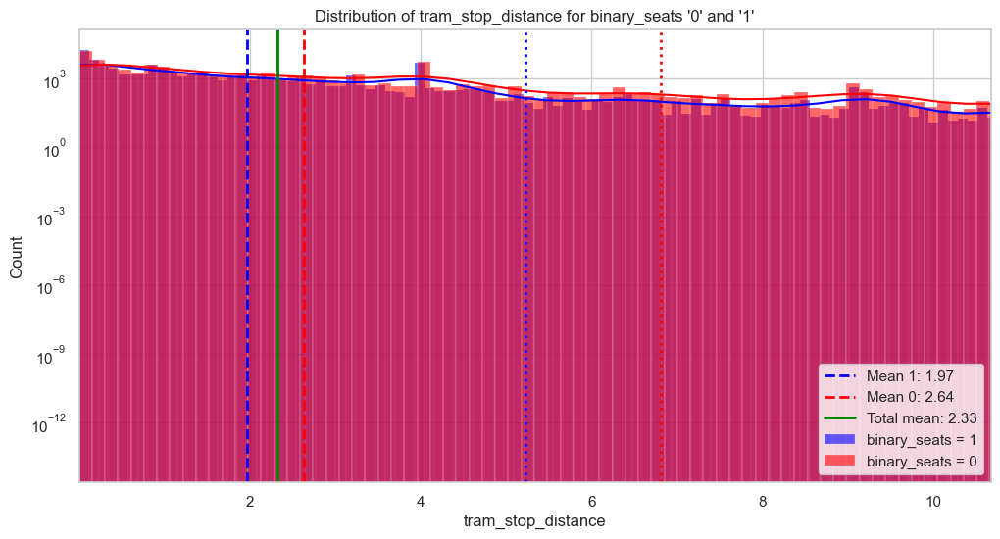

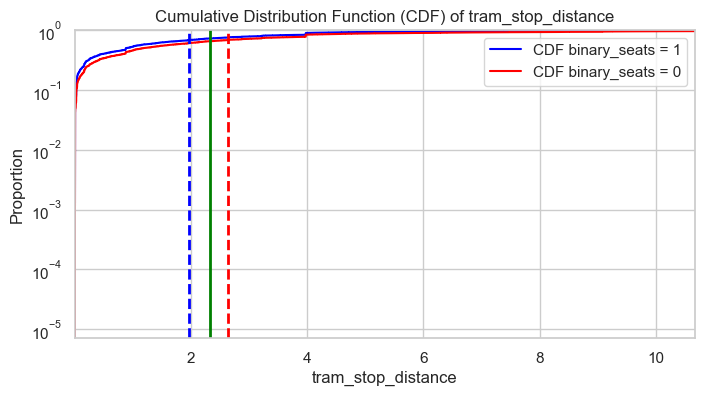

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/531870254.py:70: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


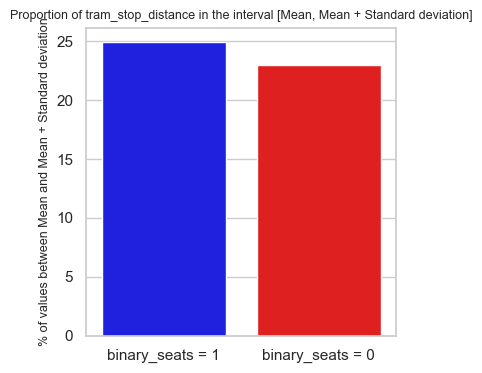

89923 79359
79359 79359
tram_stop_distance (Log Transformed)

Mean (1) : 0.78, Mean (0) : 0.93, Total Mean : 0.86
Standard Deviation (1) : 0.71, Standard Deviation (0) : 0.78
23.96% of '1' are between the mean and the standard deviation
30.79% of '0' are between the mean and the standard deviation



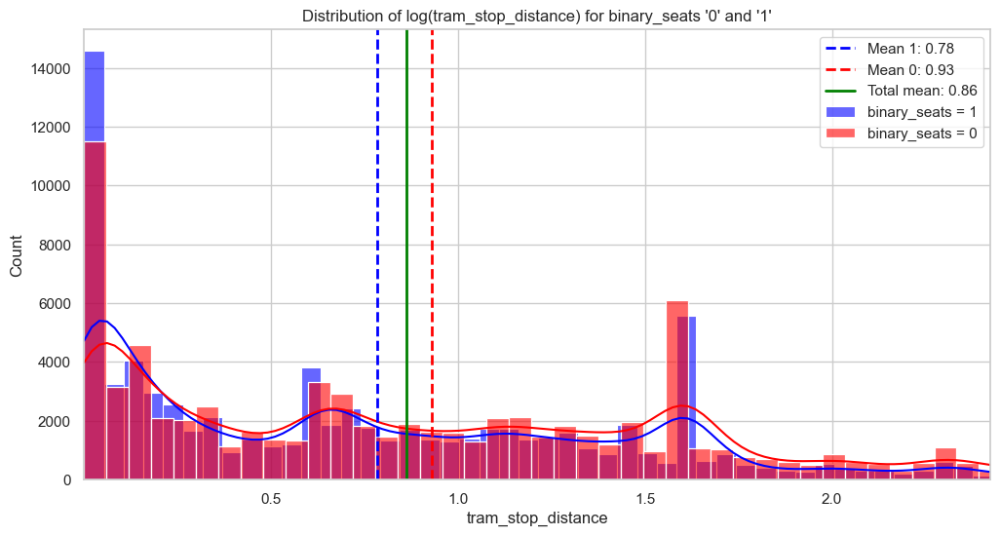

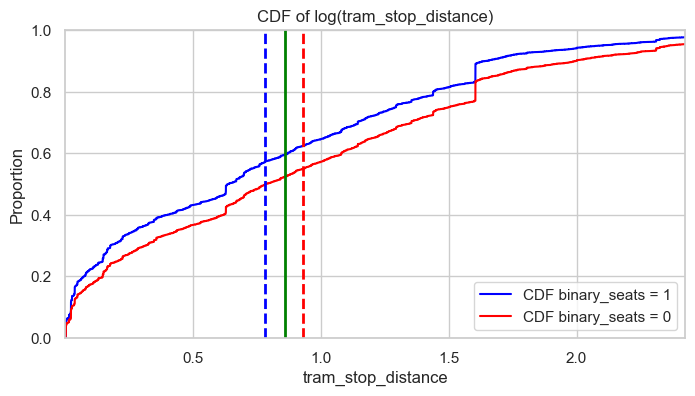

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/1832133660.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


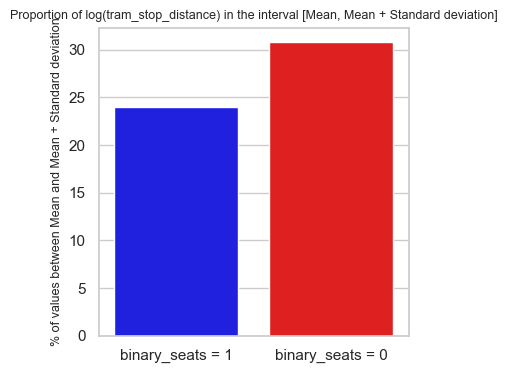

89923 79359
79359 79359
tram_stop_distance (Log Transformed)

Mean (1) : 0.78, Mean (0) : 0.93, Total Mean : 0.86
Standard Deviation (1) : 0.71, Standard Deviation (0) : 0.78
23.96% of '1' are between the mean and the standard deviation
30.79% of '0' are between the mean and the standard deviation



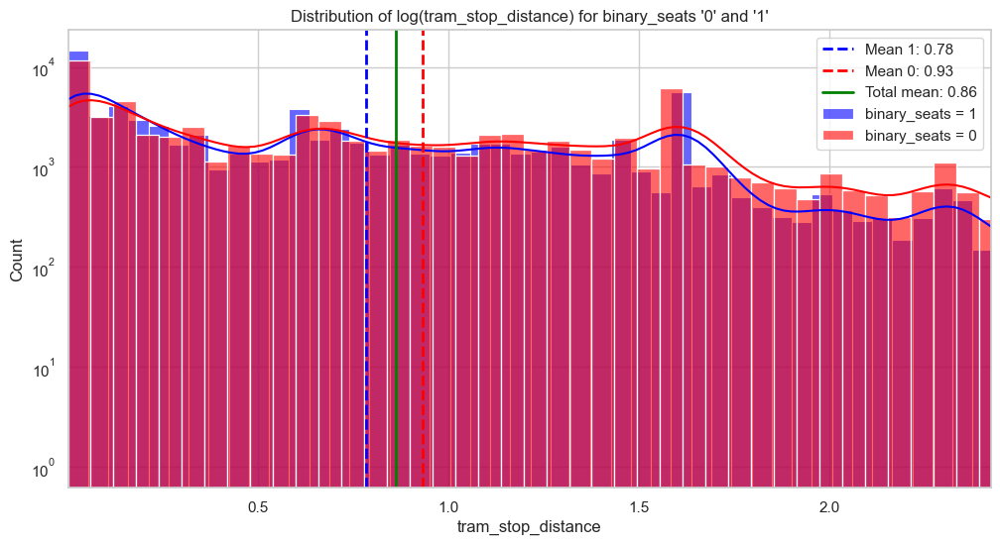

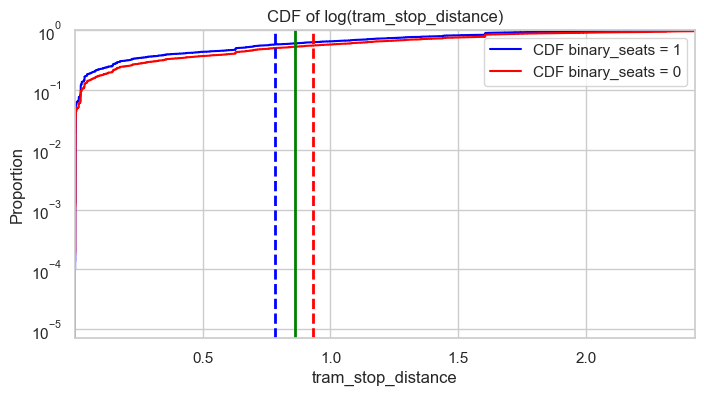

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/477769048.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


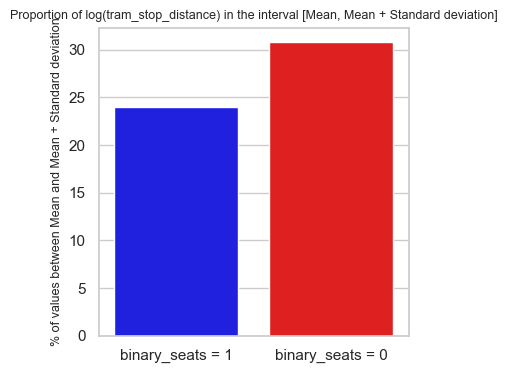

89923 79359
79359 79359
tram_stop_density

Mean (1) : 2.85, Mean (0) : 2.36, Total Mean : 2.59
Standard Deviation (1) : 3.51, Standard Deviation (0) : 3.34
19.76% of '1' are between the mean and the standard deviation
6.25% of '0' are between the mean and the standard deviation



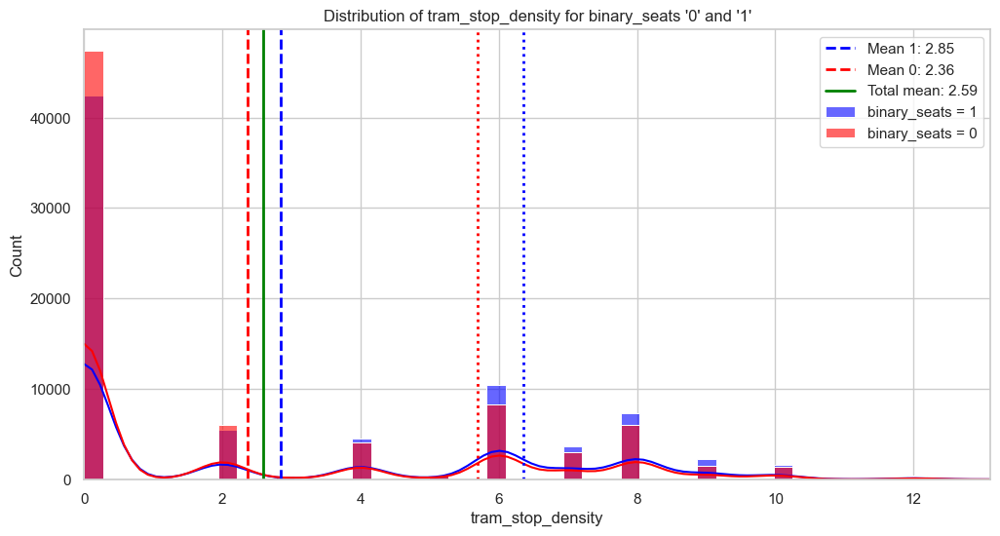

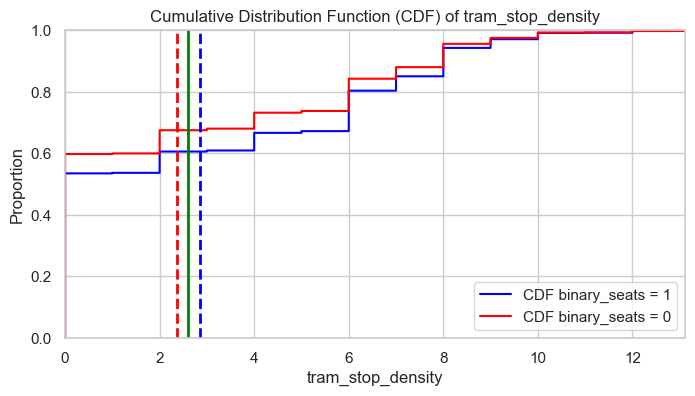

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/2489681251.py:68: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


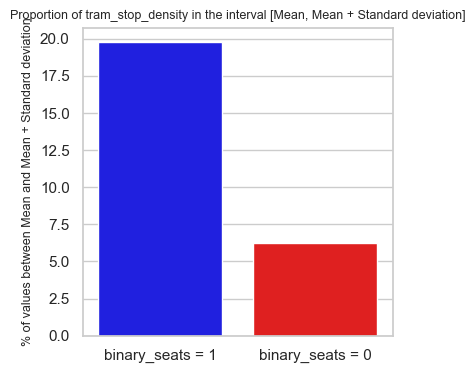

89923 79359
79359 79359
tram_stop_density

Mean (1) : 2.85, Mean (0) : 2.36, Total Mean : 2.59
Standard Deviation (1) : 3.51, Standard Deviation (0) : 3.34
19.76% of '1' are between the mean and the standard deviation
6.25% of '0' are between the mean and the standard deviation



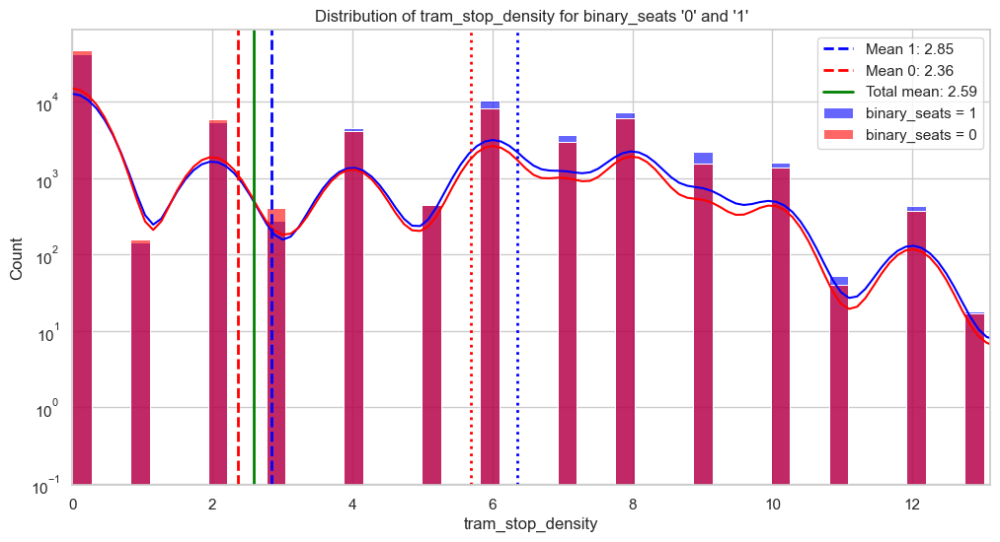

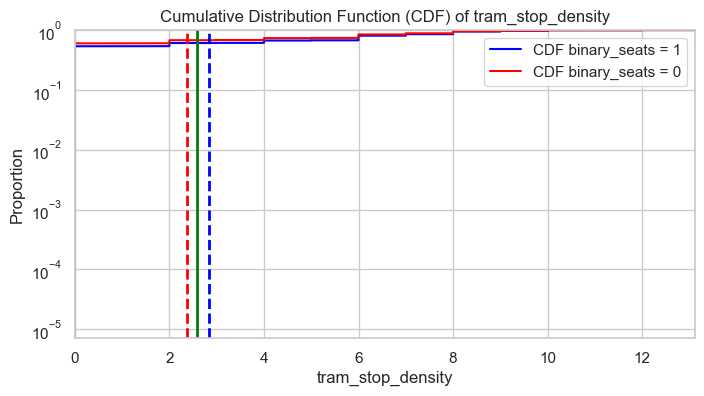

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/531870254.py:70: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


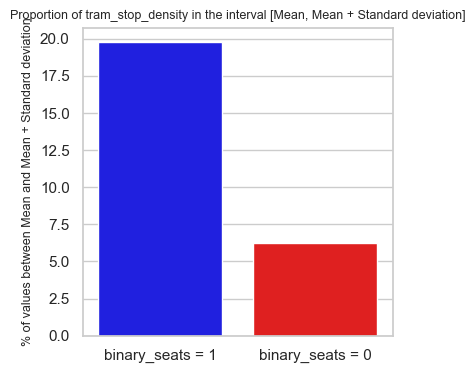

89923 79359
79359 79359
tram_stop_density (Log Transformed)

Mean (1) : 0.88, Mean (0) : 0.74, Total Mean : 0.81
Standard Deviation (1) : 0.98, Standard Deviation (0) : 0.94
13.54% of '1' are between the mean and the standard deviation
13.22% of '0' are between the mean and the standard deviation



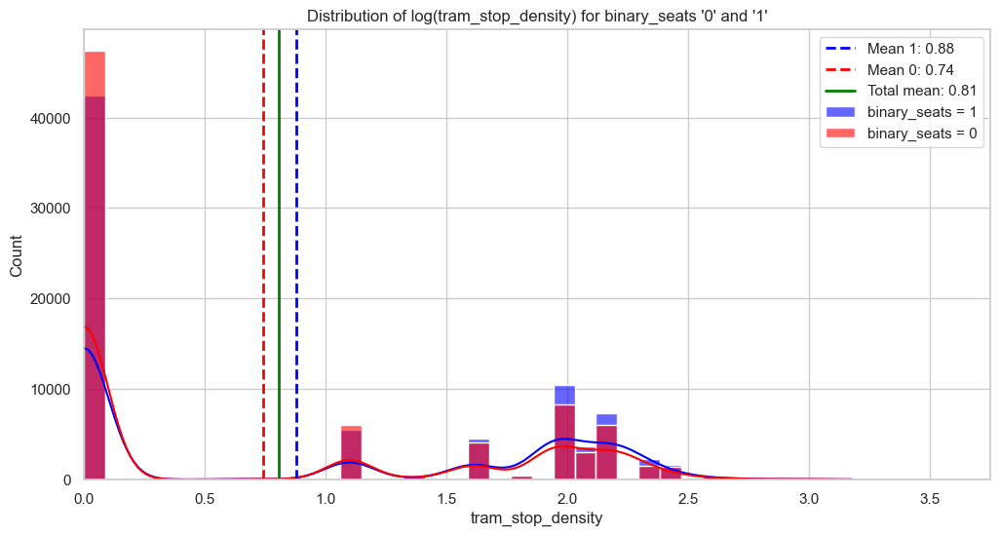

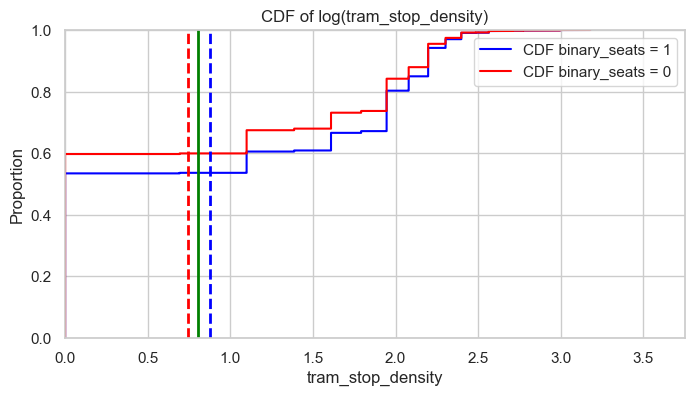

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/1832133660.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


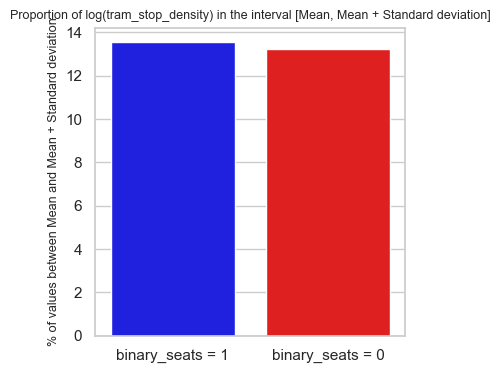

89923 79359
79359 79359
tram_stop_density (Log Transformed)

Mean (1) : 0.88, Mean (0) : 0.74, Total Mean : 0.81
Standard Deviation (1) : 0.98, Standard Deviation (0) : 0.94
13.54% of '1' are between the mean and the standard deviation
13.22% of '0' are between the mean and the standard deviation



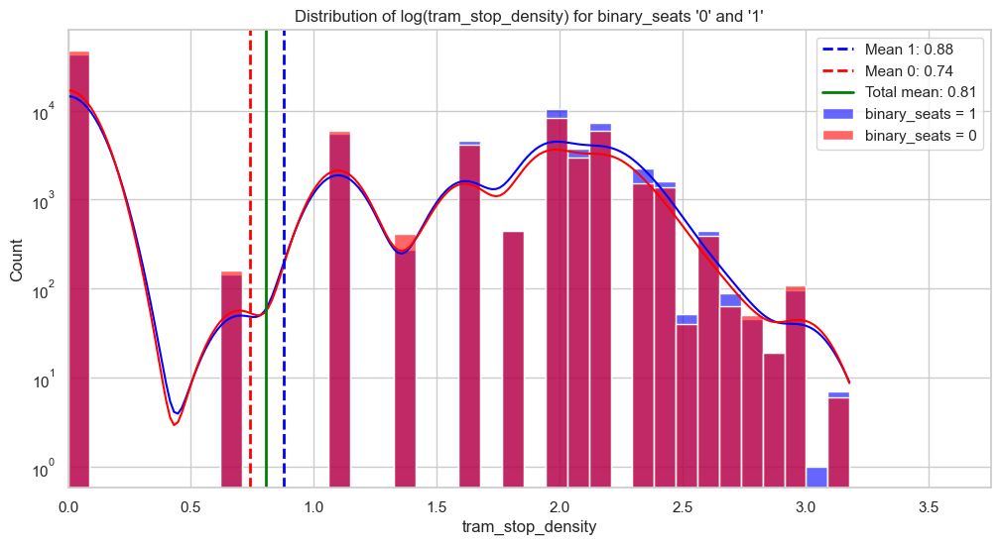

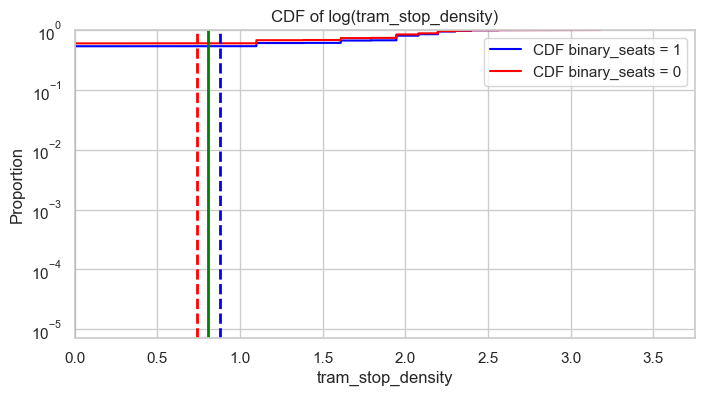

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/477769048.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


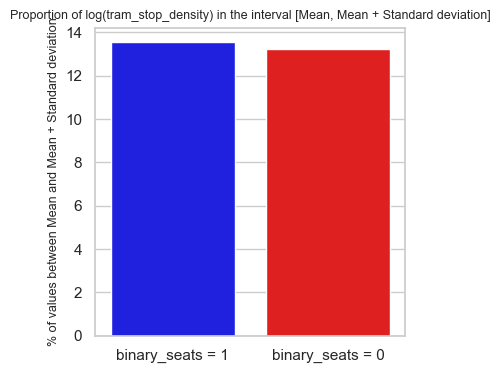

89923 79359
79359 79359
subway_entrance_distance

Mean (1) : 2.15, Mean (0) : 3.02, Total Mean : 2.62
Standard Deviation (1) : 4.84, Standard Deviation (0) : 5.83
10.37% of '1' are between the mean and the standard deviation
8.66% of '0' are between the mean and the standard deviation



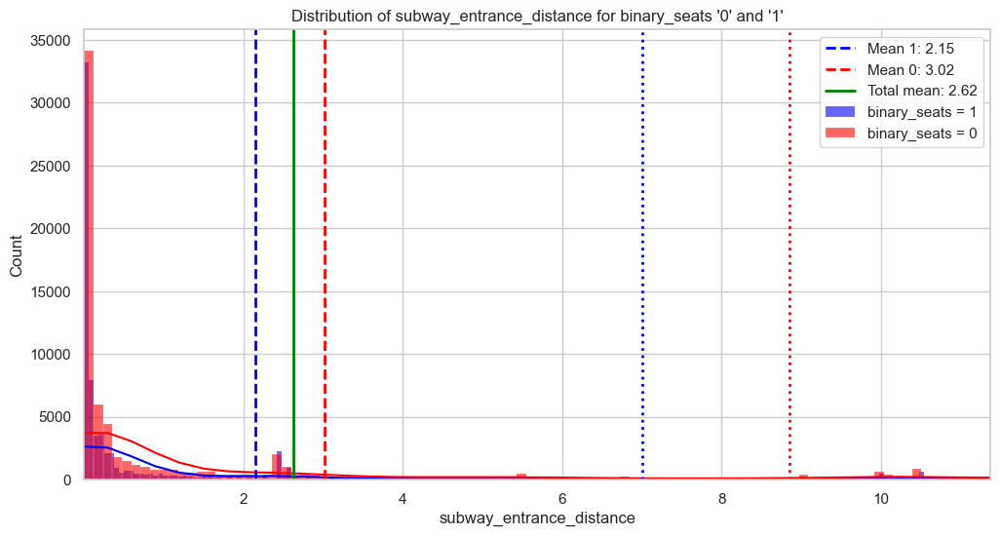

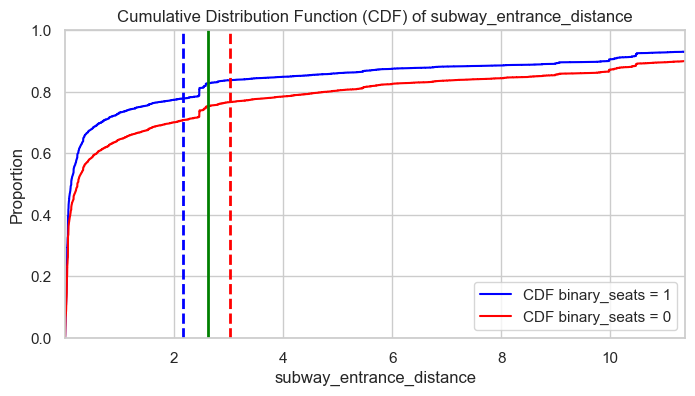

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/2489681251.py:68: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


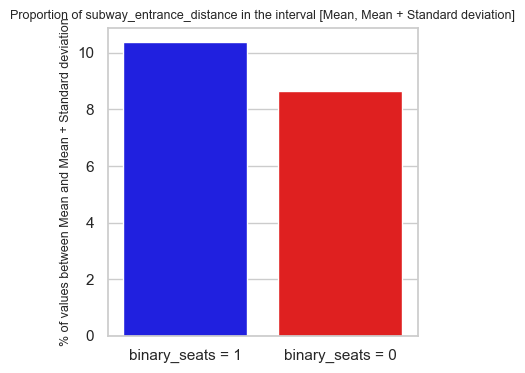

89923 79359
79359 79359
subway_entrance_distance

Mean (1) : 2.15, Mean (0) : 3.02, Total Mean : 2.62
Standard Deviation (1) : 4.84, Standard Deviation (0) : 5.83
10.37% of '1' are between the mean and the standard deviation
8.66% of '0' are between the mean and the standard deviation



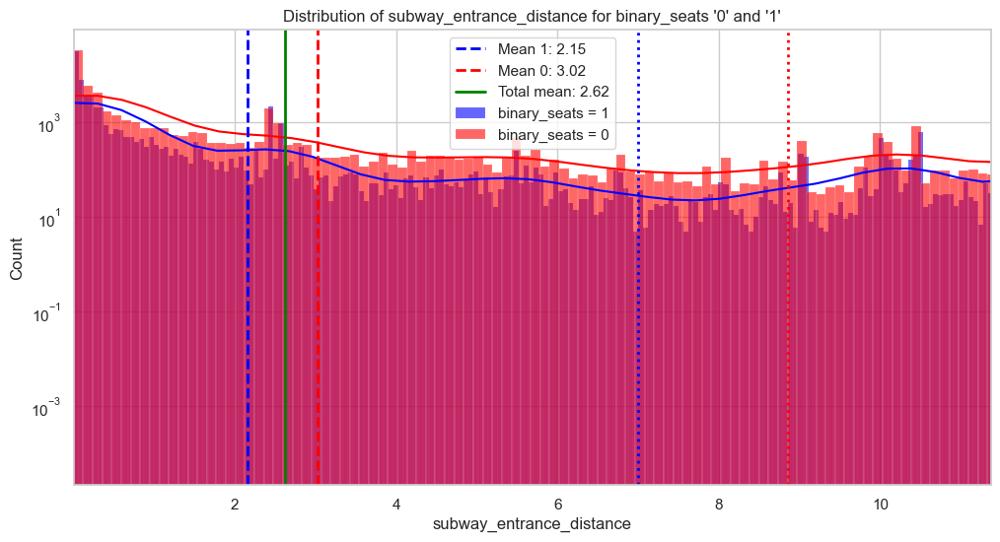

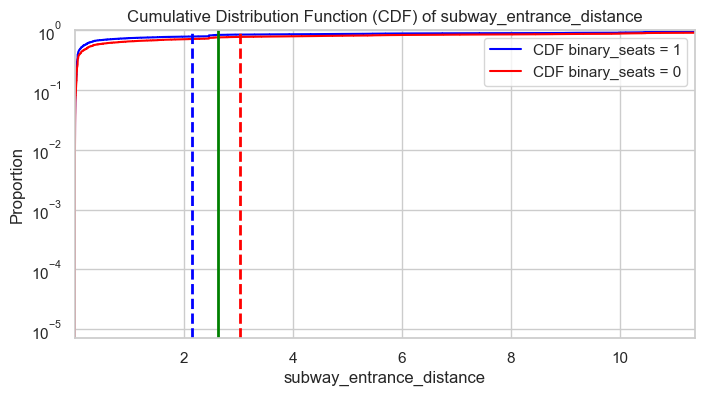

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/531870254.py:70: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


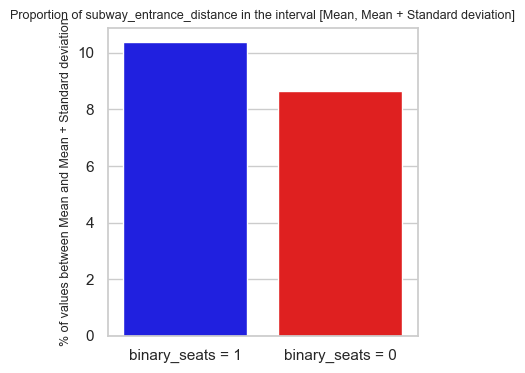

89923 79359
79359 79359
subway_entrance_distance (Log Transformed)

Mean (1) : 0.59, Mean (0) : 0.77, Total Mean : 0.69
Standard Deviation (1) : 0.88, Standard Deviation (0) : 0.98
12.53% of '1' are between the mean and the standard deviation
14.23% of '0' are between the mean and the standard deviation



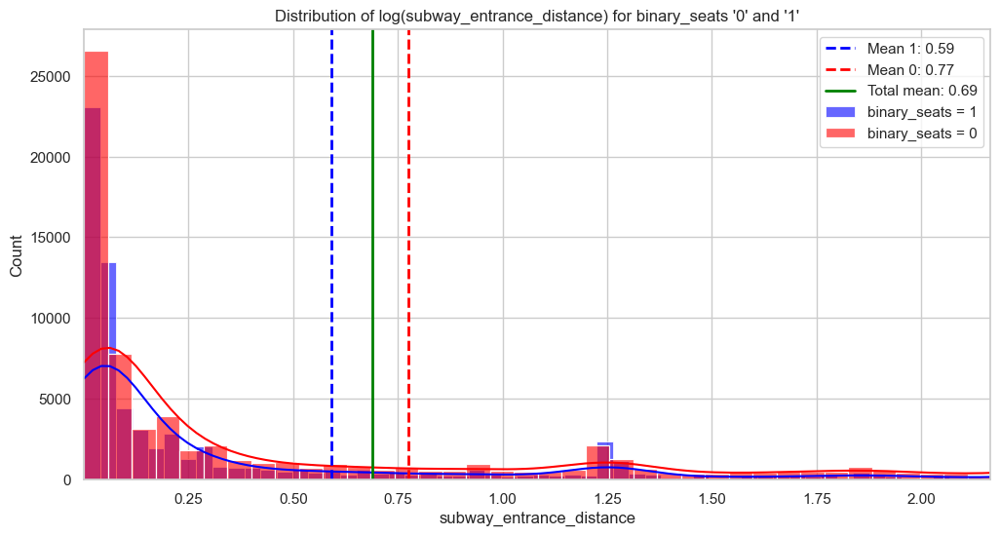

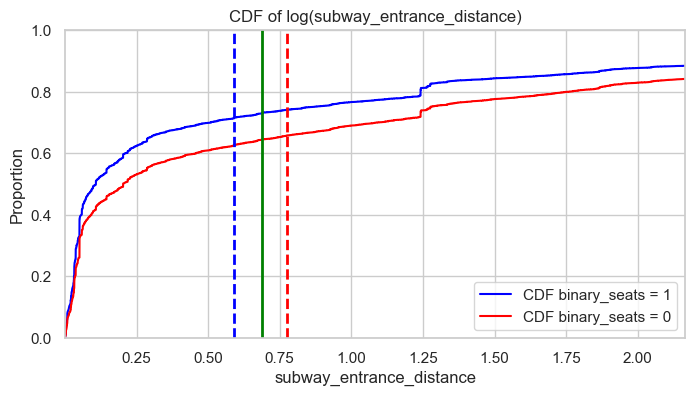

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/1832133660.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


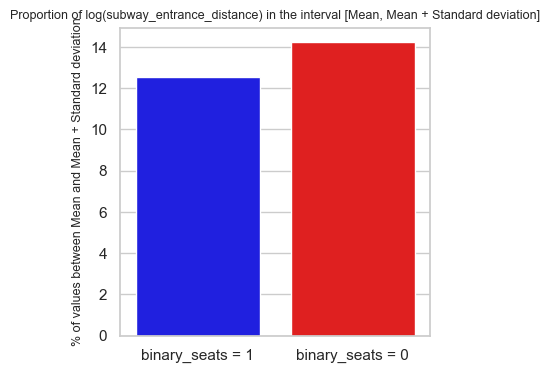

89923 79359
79359 79359
subway_entrance_distance (Log Transformed)

Mean (1) : 0.59, Mean (0) : 0.77, Total Mean : 0.69
Standard Deviation (1) : 0.88, Standard Deviation (0) : 0.98
12.53% of '1' are between the mean and the standard deviation
14.23% of '0' are between the mean and the standard deviation



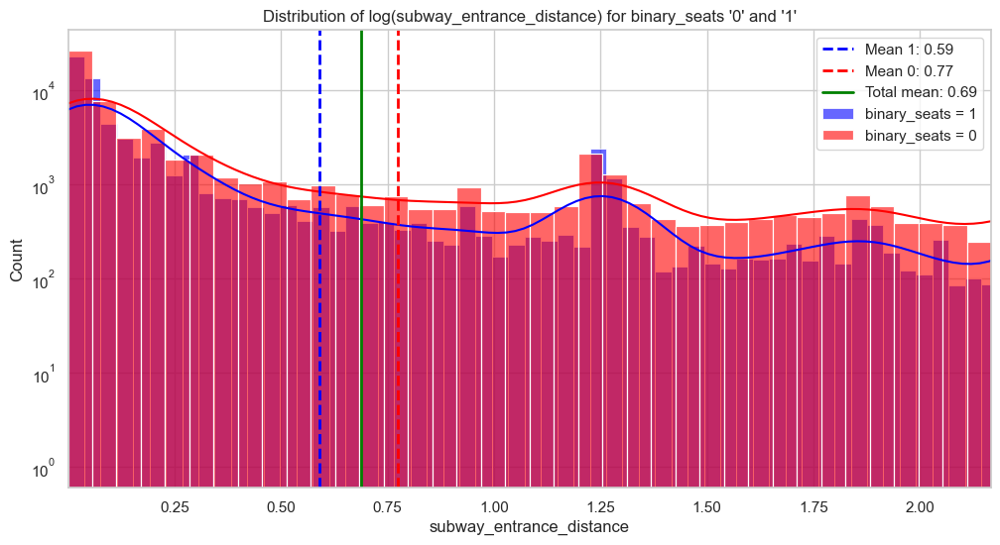

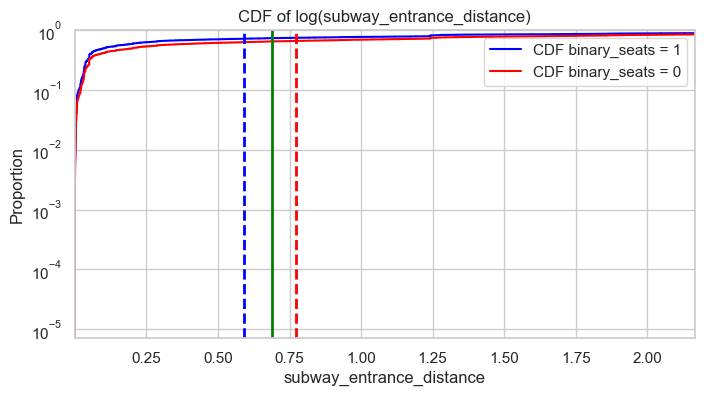

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/477769048.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


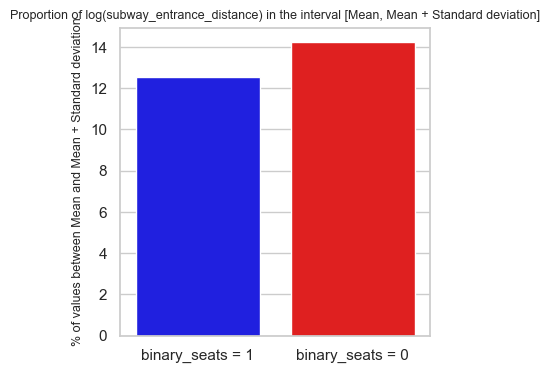

89923 79359
79359 79359
subway_entrance_density

Mean (1) : 14.80, Mean (0) : 12.83, Total Mean : 13.74
Standard Deviation (1) : 16.55, Standard Deviation (0) : 16.64
25.50% of '1' are between the mean and the standard deviation
22.86% of '0' are between the mean and the standard deviation



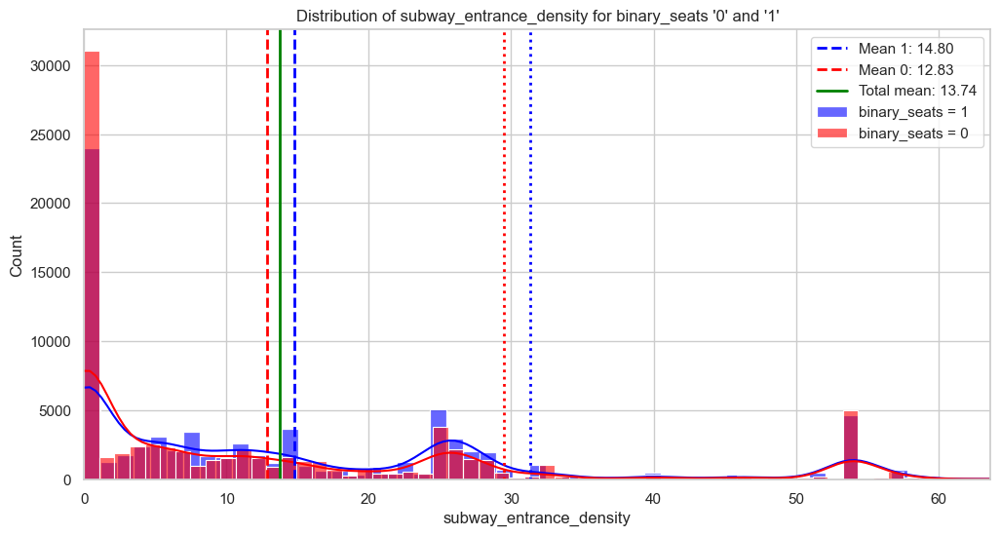

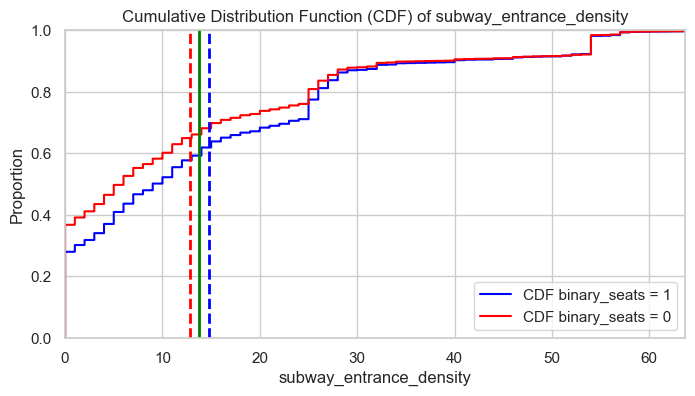

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/2489681251.py:68: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


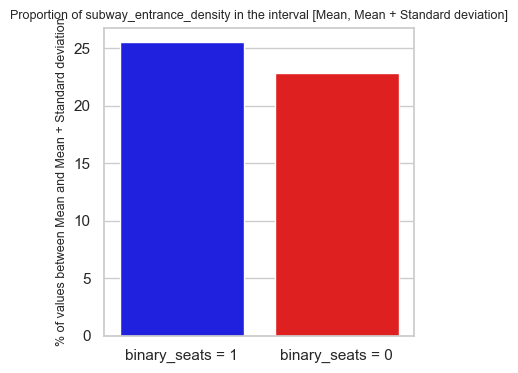

89923 79359
79359 79359
subway_entrance_density

Mean (1) : 14.80, Mean (0) : 12.83, Total Mean : 13.74
Standard Deviation (1) : 16.55, Standard Deviation (0) : 16.64
25.50% of '1' are between the mean and the standard deviation
22.86% of '0' are between the mean and the standard deviation



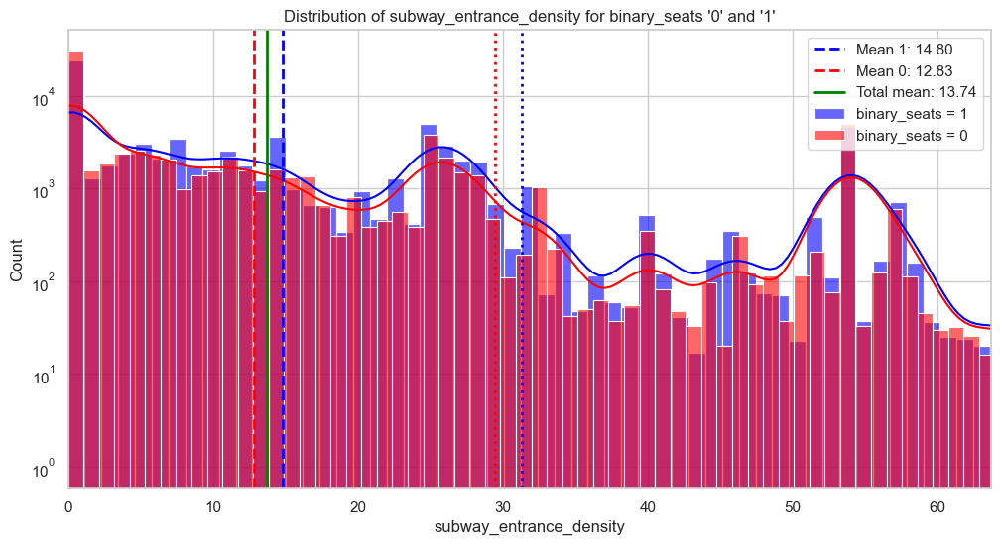

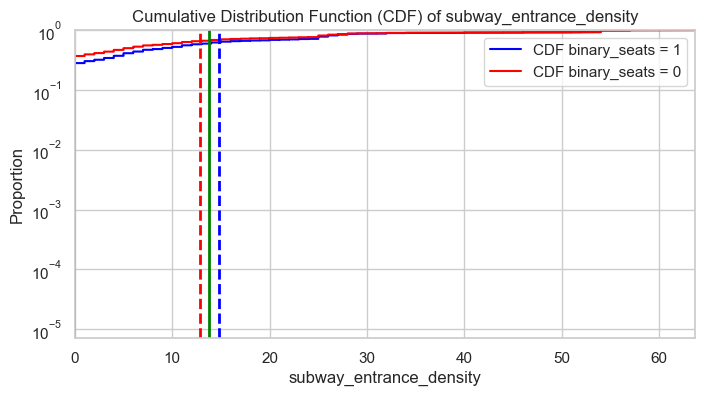

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/531870254.py:70: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


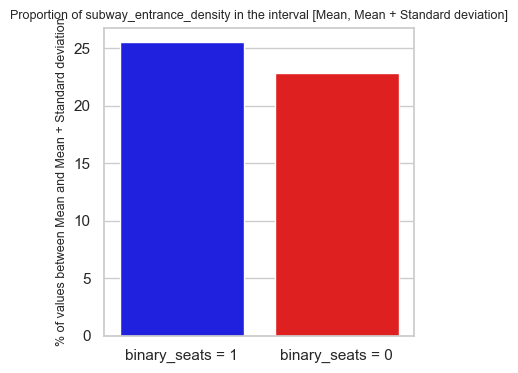

89923 79359
79359 79359
subway_entrance_density (Log Transformed)

Mean (1) : 1.98, Mean (0) : 1.71, Total Mean : 1.84
Standard Deviation (1) : 1.43, Standard Deviation (0) : 1.49
43.31% of '1' are between the mean and the standard deviation
29.03% of '0' are between the mean and the standard deviation



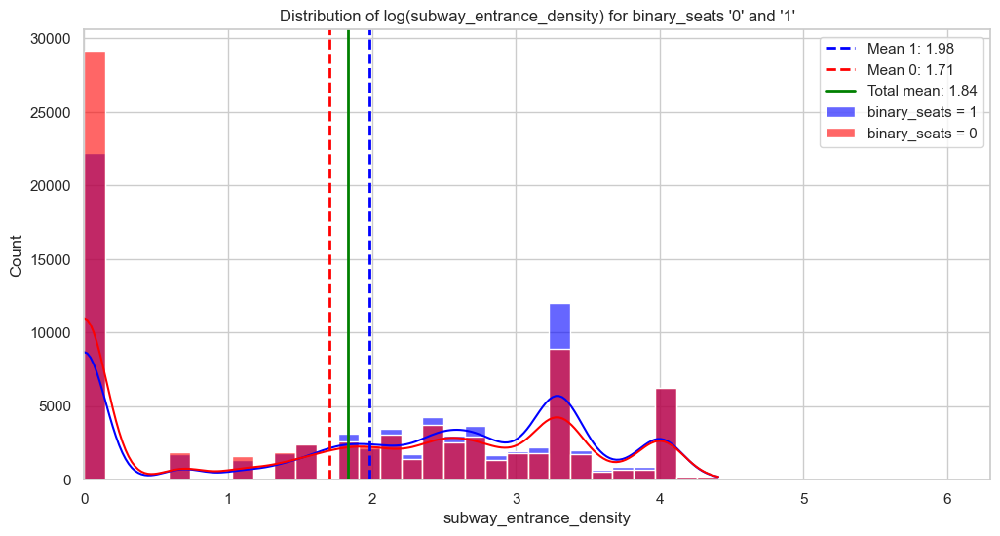

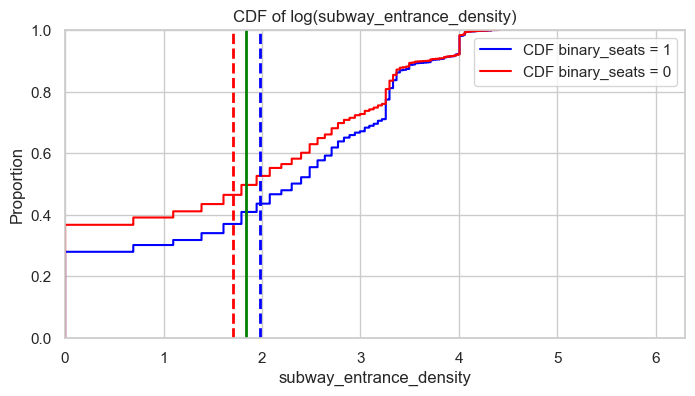

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/1832133660.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


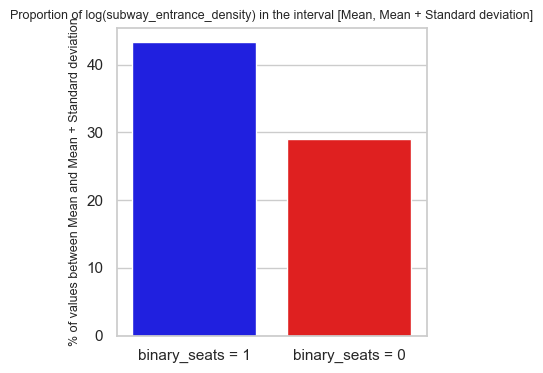

89923 79359
79359 79359
subway_entrance_density (Log Transformed)

Mean (1) : 1.98, Mean (0) : 1.71, Total Mean : 1.84
Standard Deviation (1) : 1.43, Standard Deviation (0) : 1.49
43.31% of '1' are between the mean and the standard deviation
29.03% of '0' are between the mean and the standard deviation



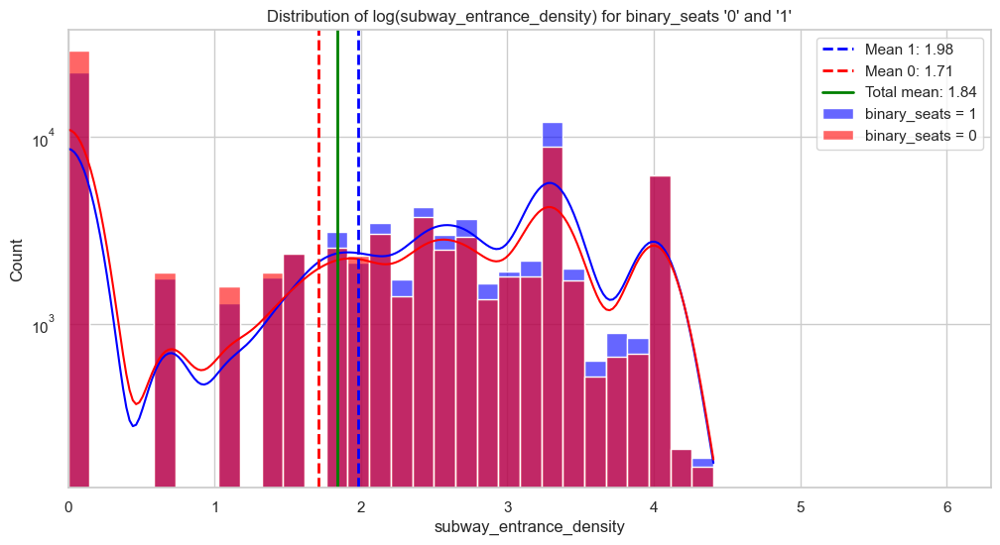

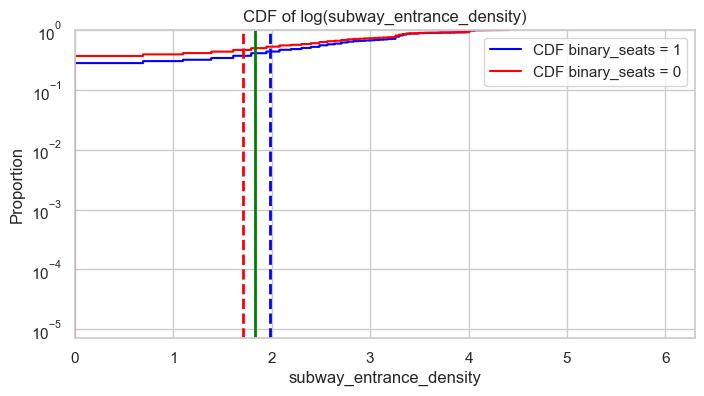

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/477769048.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


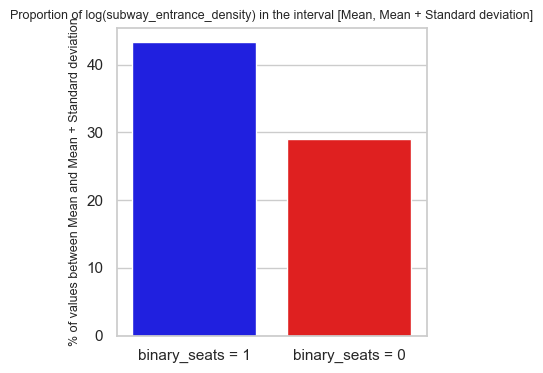

89923 79359
79359 79359
bus_stop_distance

Mean (1) : 0.08, Mean (0) : 0.08, Total Mean : 0.08
Standard Deviation (1) : 0.08, Standard Deviation (0) : 0.10
29.78% of '1' are between the mean and the standard deviation
31.19% of '0' are between the mean and the standard deviation



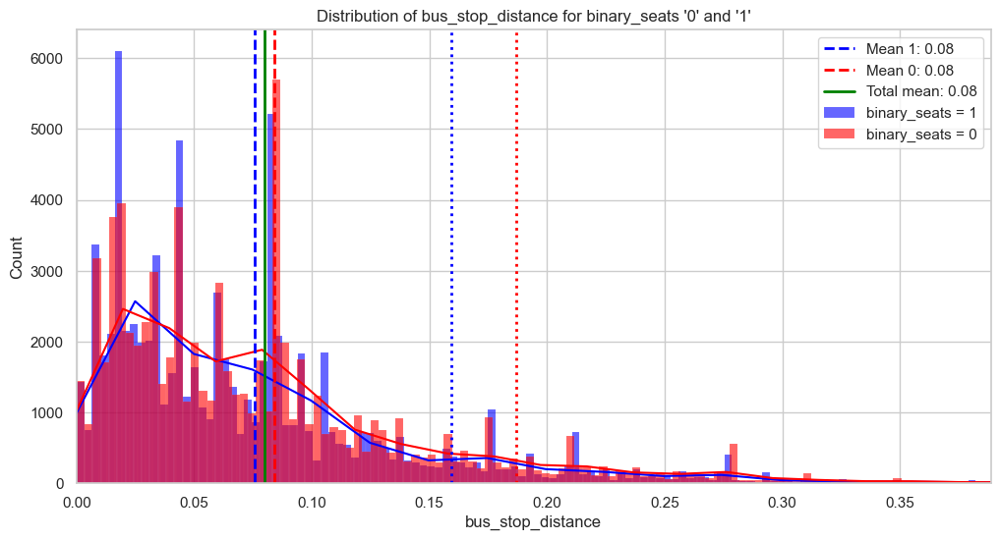

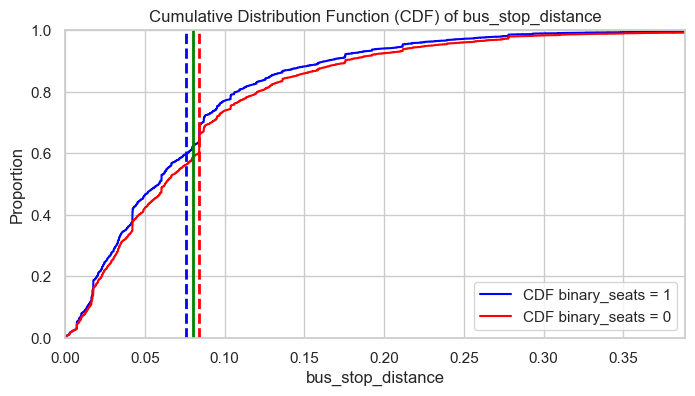

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/2489681251.py:68: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


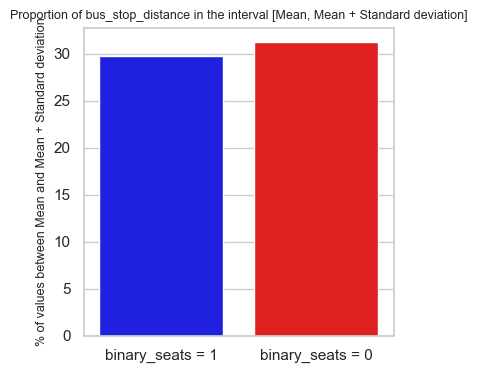

89923 79359
79359 79359
bus_stop_distance

Mean (1) : 0.08, Mean (0) : 0.08, Total Mean : 0.08
Standard Deviation (1) : 0.08, Standard Deviation (0) : 0.10
29.78% of '1' are between the mean and the standard deviation
31.19% of '0' are between the mean and the standard deviation



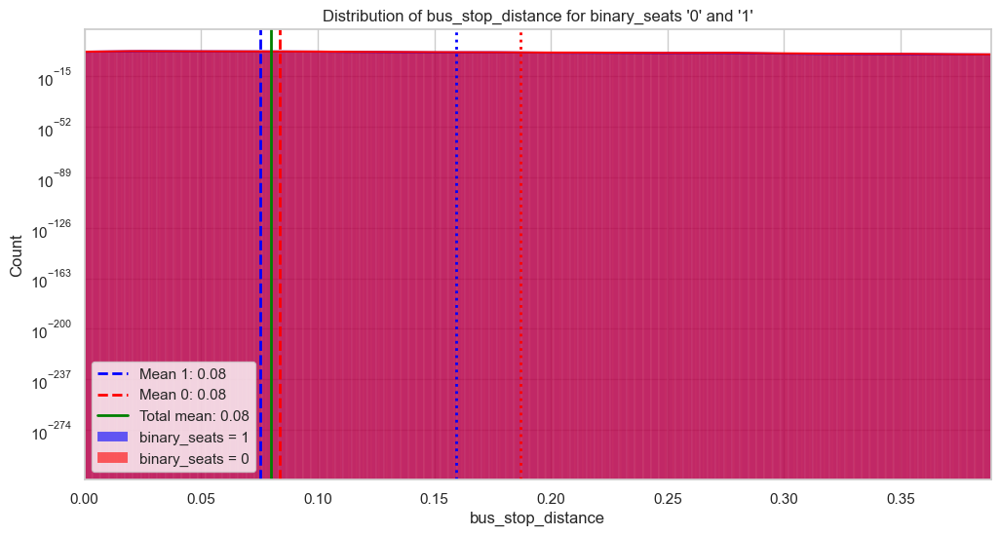

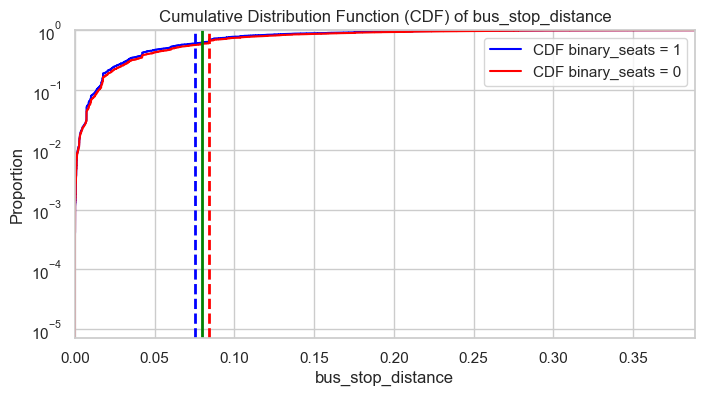

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/531870254.py:70: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


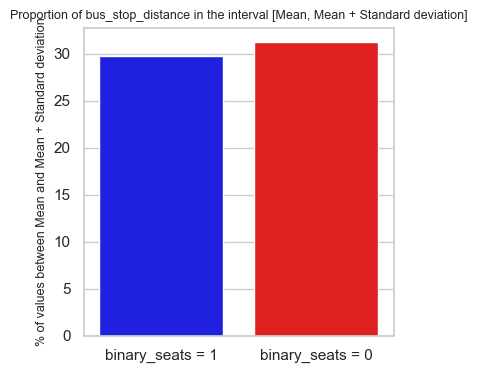

89923 79359
79359 79359
bus_stop_distance (Log Transformed)

Mean (1) : 0.07, Mean (0) : 0.08, Total Mean : 0.07
Standard Deviation (1) : 0.06, Standard Deviation (0) : 0.07
28.89% of '1' are between the mean and the standard deviation
29.13% of '0' are between the mean and the standard deviation



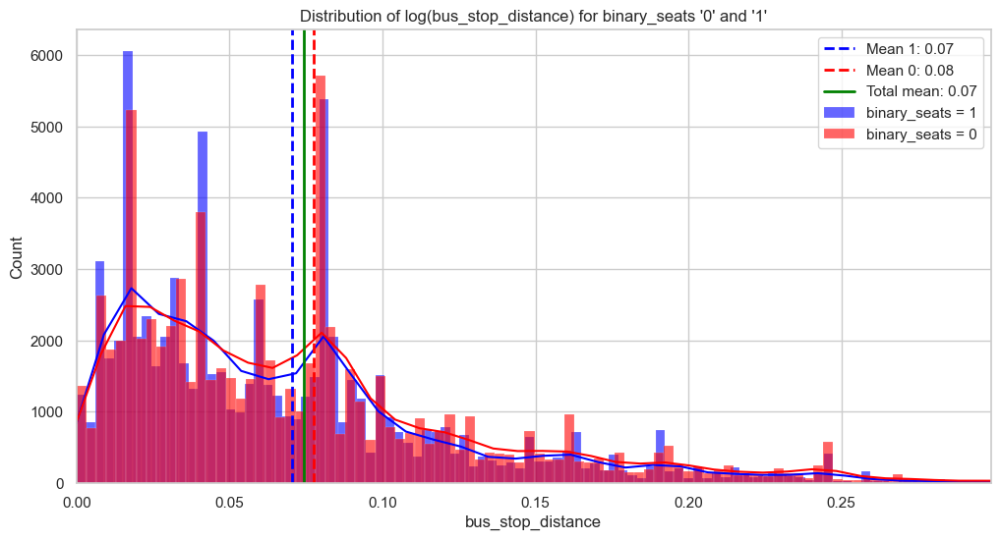

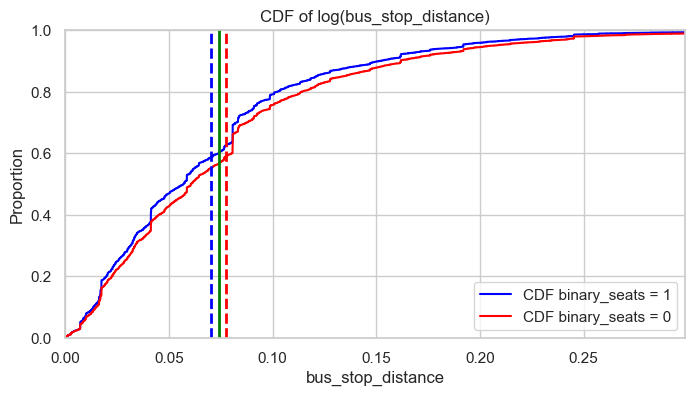

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/1832133660.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


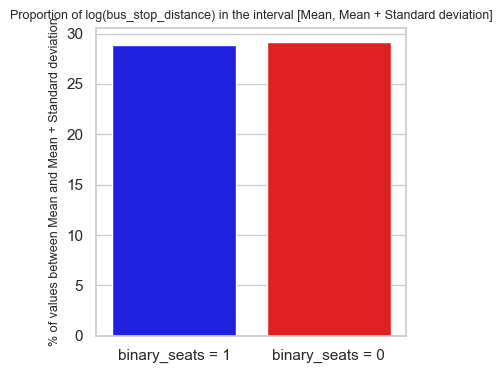

89923 79359
79359 79359
bus_stop_distance (Log Transformed)

Mean (1) : 0.07, Mean (0) : 0.08, Total Mean : 0.07
Standard Deviation (1) : 0.06, Standard Deviation (0) : 0.07
28.89% of '1' are between the mean and the standard deviation
29.13% of '0' are between the mean and the standard deviation



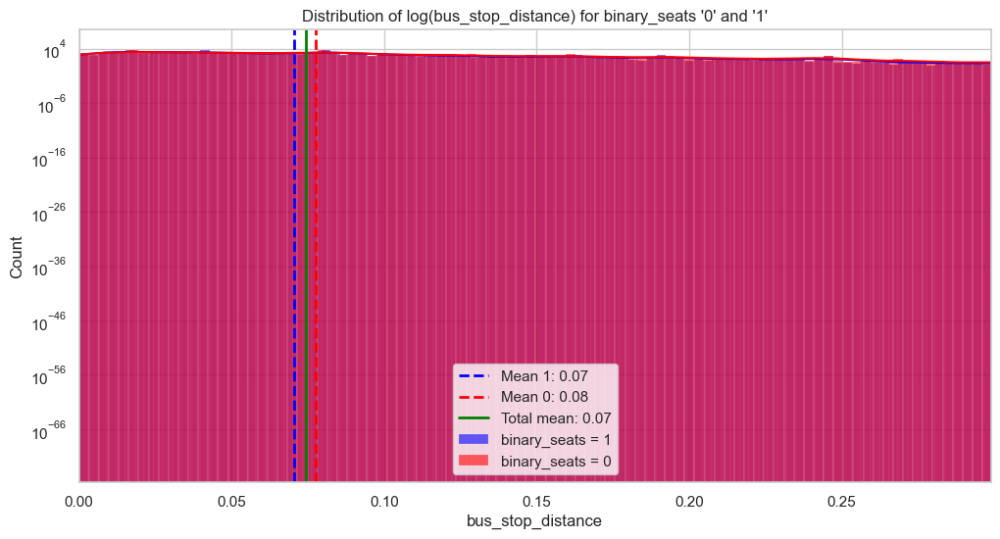

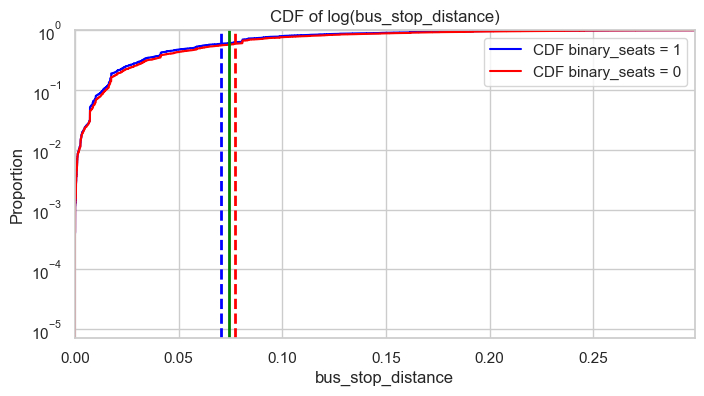

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/477769048.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


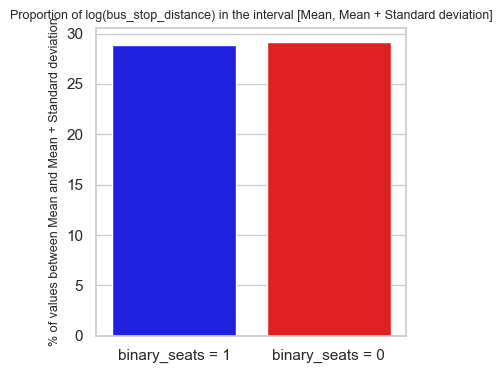

89923 79359
79359 79359
bus_stop_density

Mean (1) : 53.76, Mean (0) : 50.72, Total Mean : 52.12
Standard Deviation (1) : 18.18, Standard Deviation (0) : 19.64
33.16% of '1' are between the mean and the standard deviation
31.69% of '0' are between the mean and the standard deviation



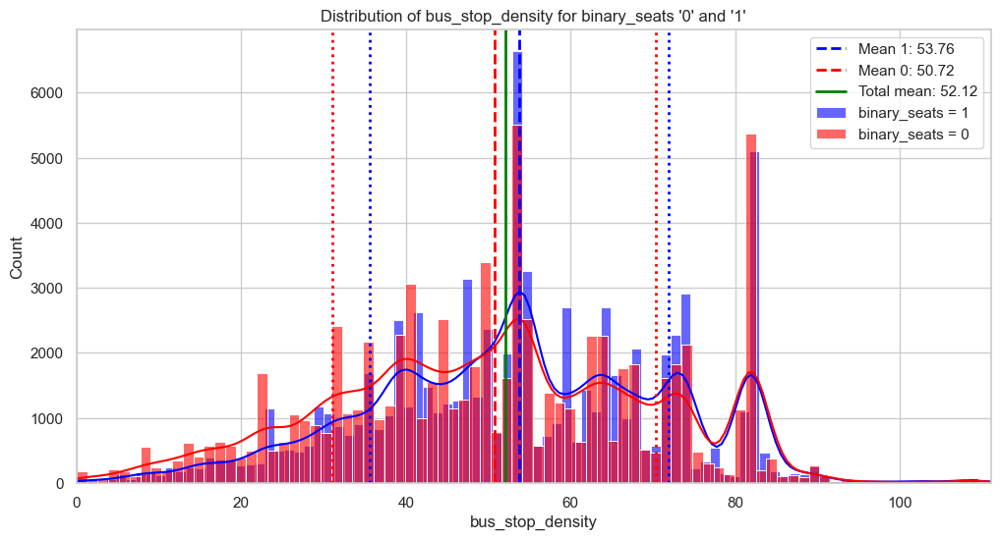

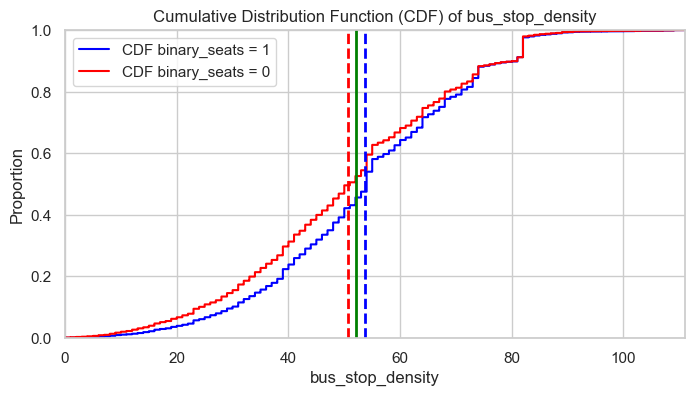

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/2489681251.py:68: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


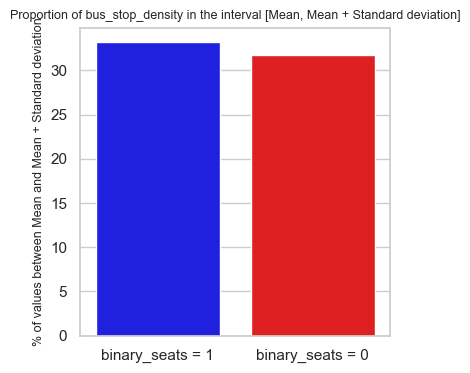

89923 79359
79359 79359
bus_stop_density

Mean (1) : 53.76, Mean (0) : 50.72, Total Mean : 52.12
Standard Deviation (1) : 18.18, Standard Deviation (0) : 19.64
33.16% of '1' are between the mean and the standard deviation
31.69% of '0' are between the mean and the standard deviation



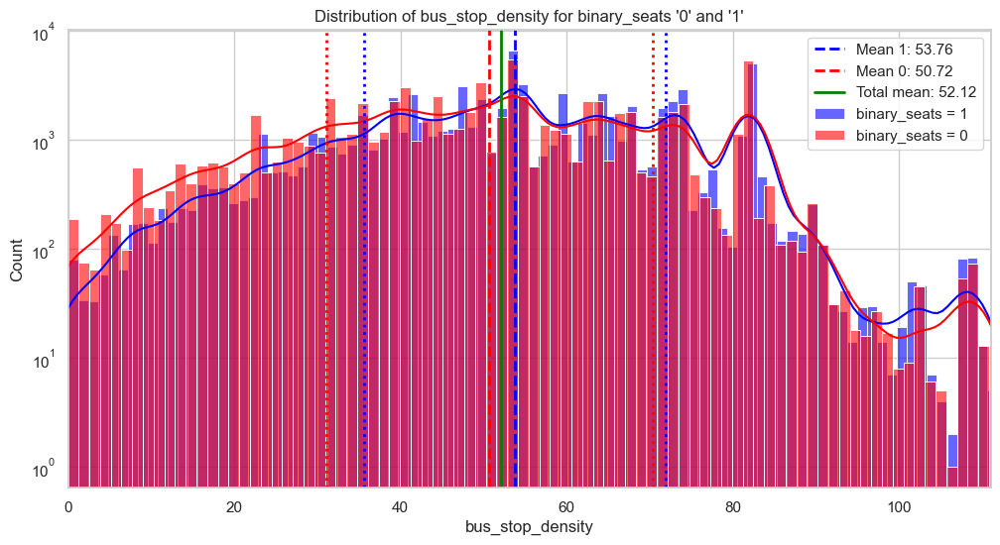

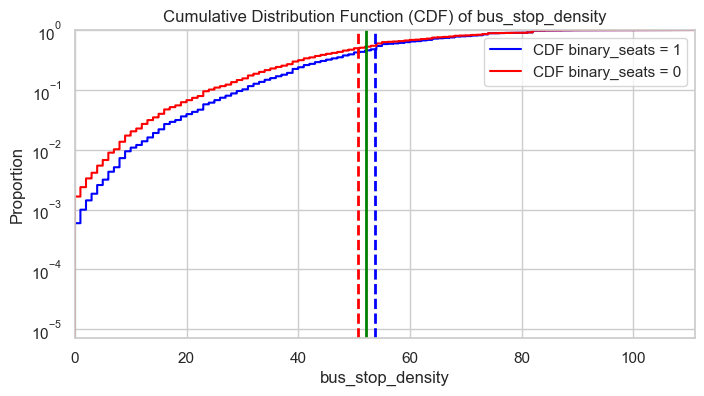

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/531870254.py:70: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


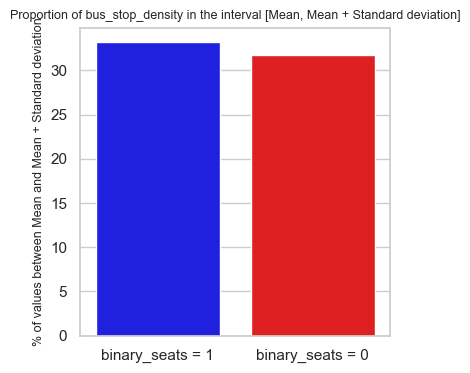

89923 79359
79359 79359
bus_stop_density (Log Transformed)

Mean (1) : 3.93, Mean (0) : 3.85, Total Mean : 3.89
Standard Deviation (1) : 0.43, Standard Deviation (0) : 0.51
50.04% of '1' are between the mean and the standard deviation
48.92% of '0' are between the mean and the standard deviation



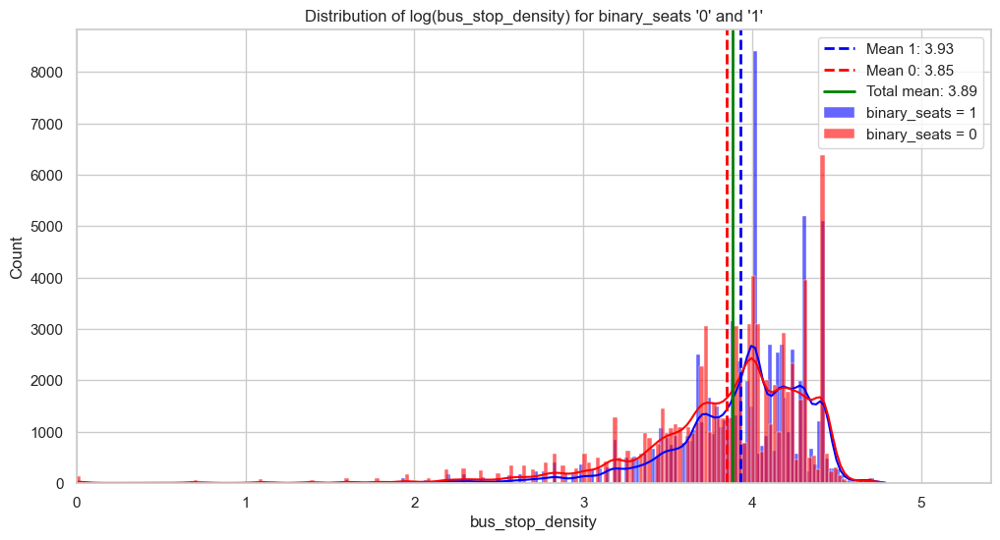

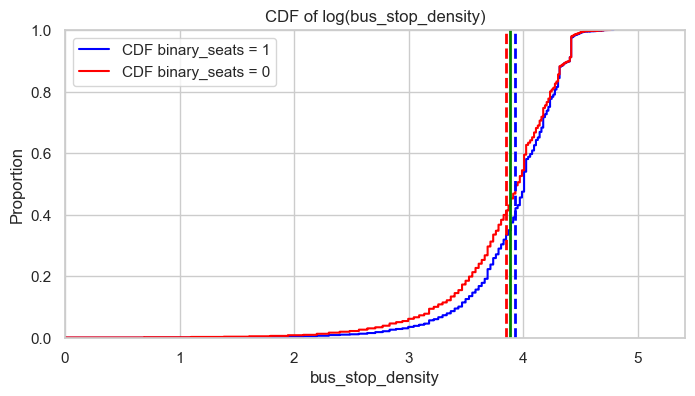

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/1832133660.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


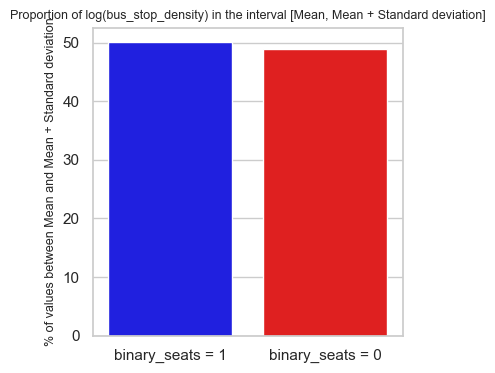

89923 79359
79359 79359
bus_stop_density (Log Transformed)

Mean (1) : 3.93, Mean (0) : 3.85, Total Mean : 3.89
Standard Deviation (1) : 0.43, Standard Deviation (0) : 0.51
50.04% of '1' are between the mean and the standard deviation
48.92% of '0' are between the mean and the standard deviation



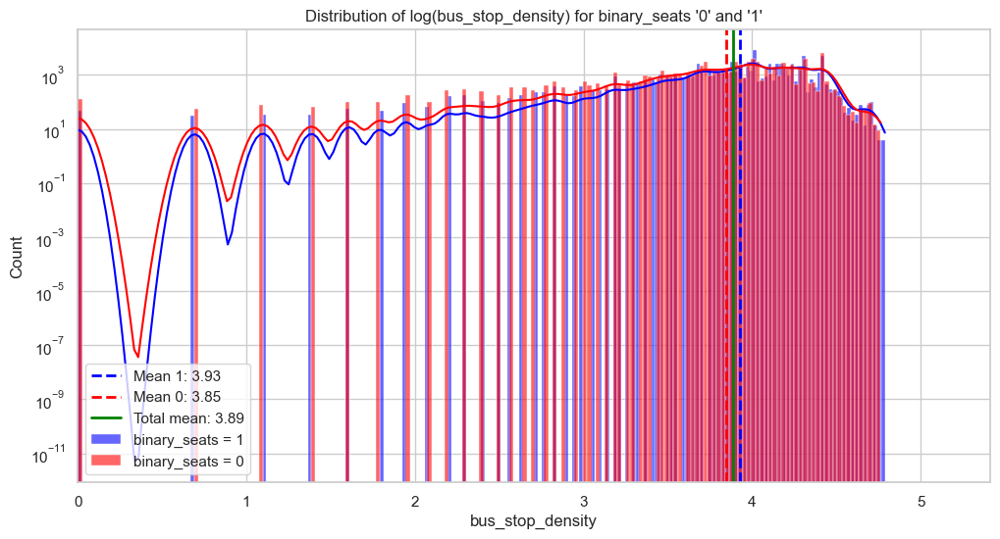

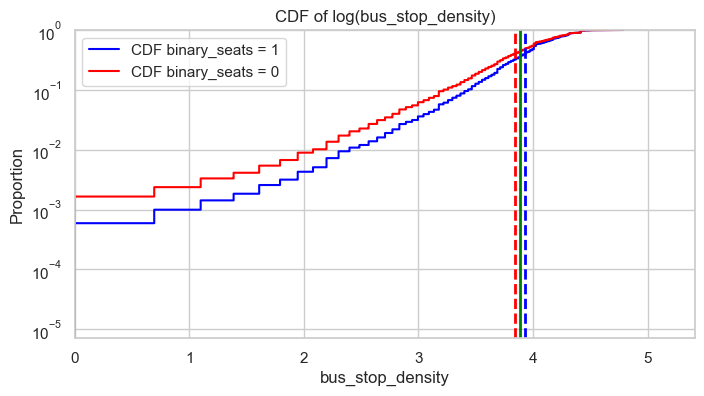

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/477769048.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


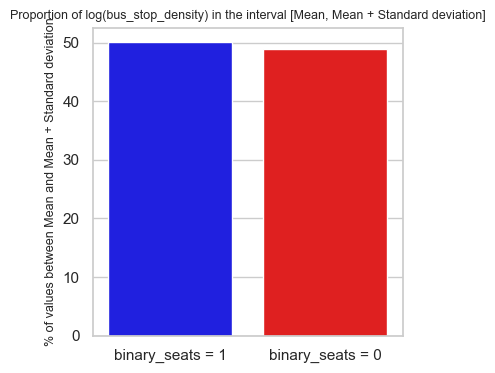

89923 79359
79359 79359
bicycle_rental_distance

Mean (1) : 1.18, Mean (0) : 1.73, Total Mean : 1.48
Standard Deviation (1) : 2.88, Standard Deviation (0) : 3.61
10.08% of '1' are between the mean and the standard deviation
12.45% of '0' are between the mean and the standard deviation



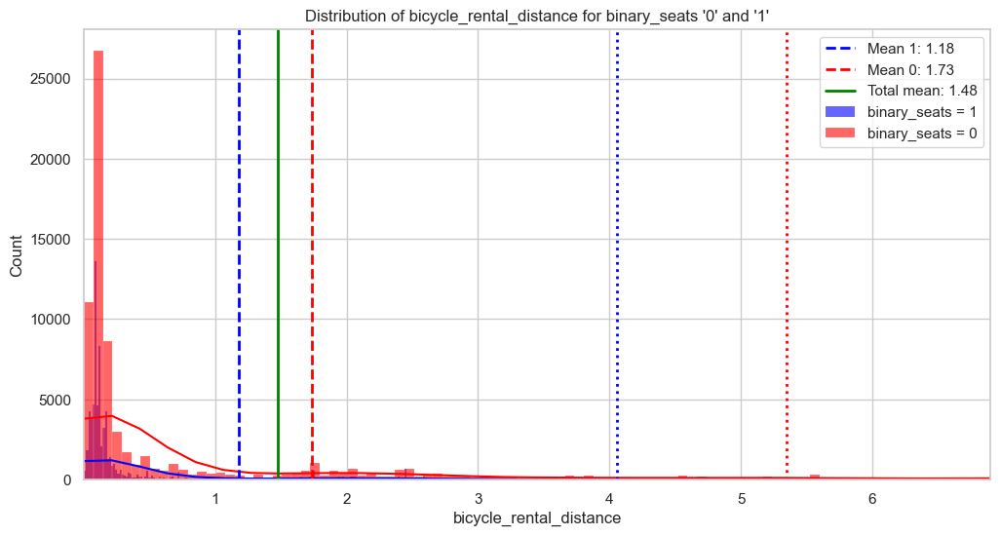

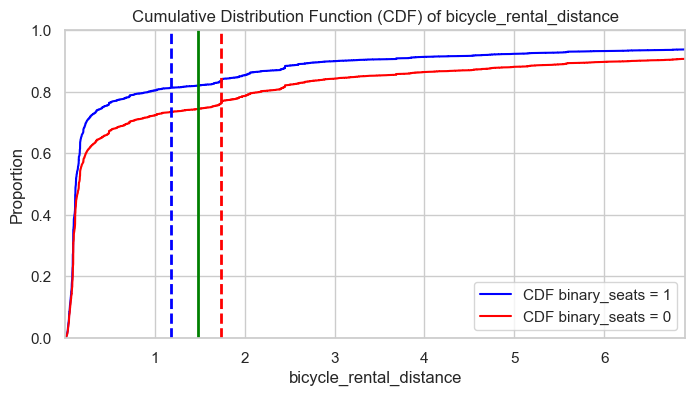

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/2489681251.py:68: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


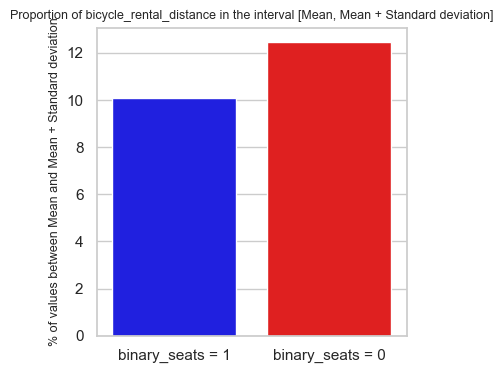

89923 79359
79359 79359
bicycle_rental_distance

Mean (1) : 1.18, Mean (0) : 1.73, Total Mean : 1.48
Standard Deviation (1) : 2.88, Standard Deviation (0) : 3.61
10.08% of '1' are between the mean and the standard deviation
12.45% of '0' are between the mean and the standard deviation



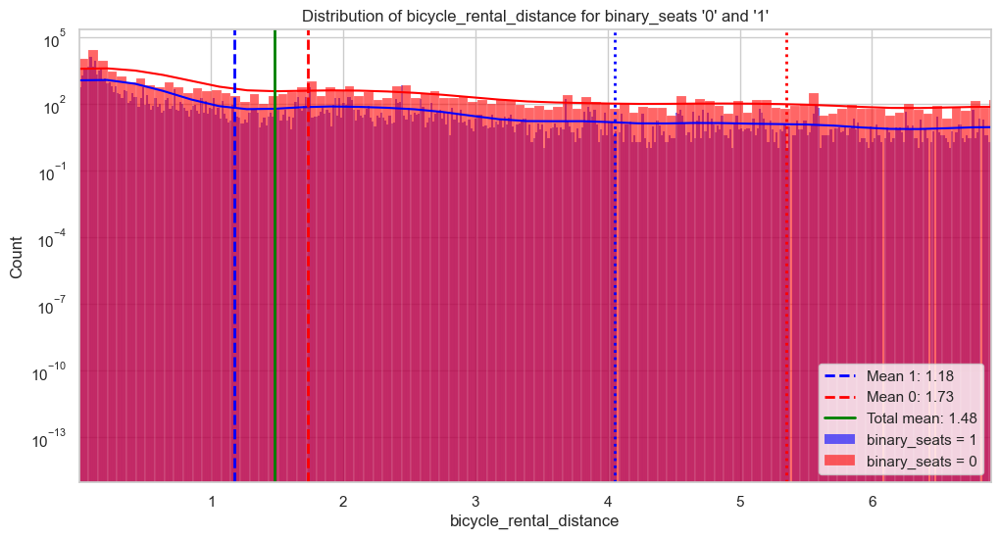

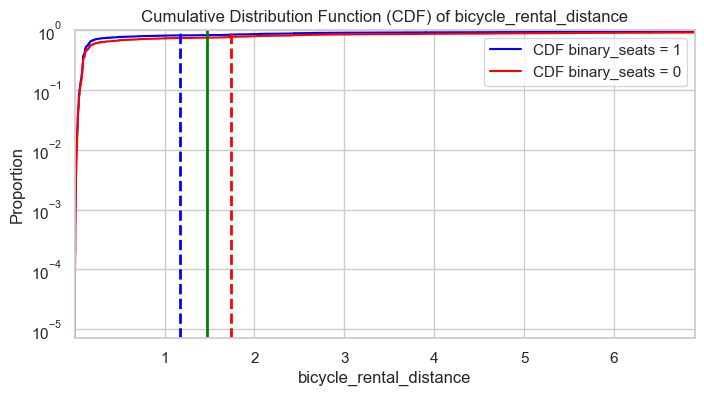

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/531870254.py:70: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


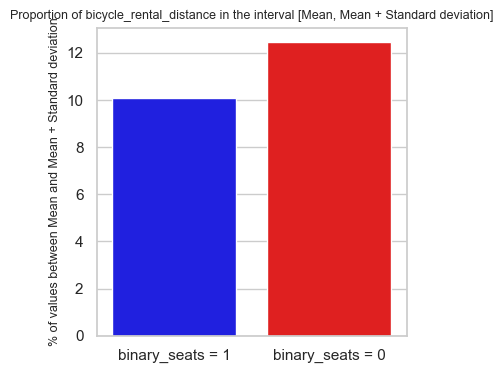

89923 79359
79359 79359
bicycle_rental_distance (Log Transformed)

Mean (1) : 0.43, Mean (0) : 0.58, Total Mean : 0.51
Standard Deviation (1) : 0.67, Standard Deviation (0) : 0.78
8.40% of '1' are between the mean and the standard deviation
13.16% of '0' are between the mean and the standard deviation



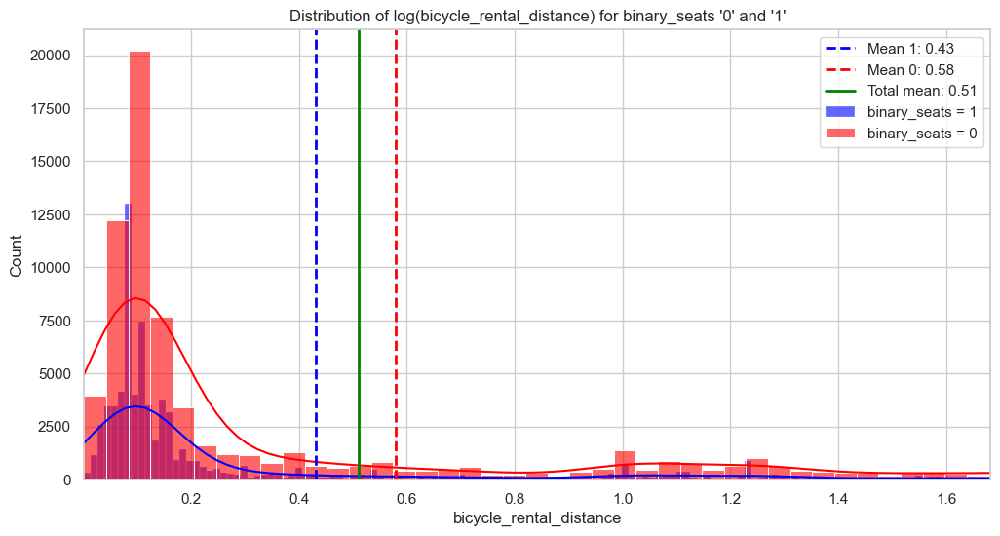

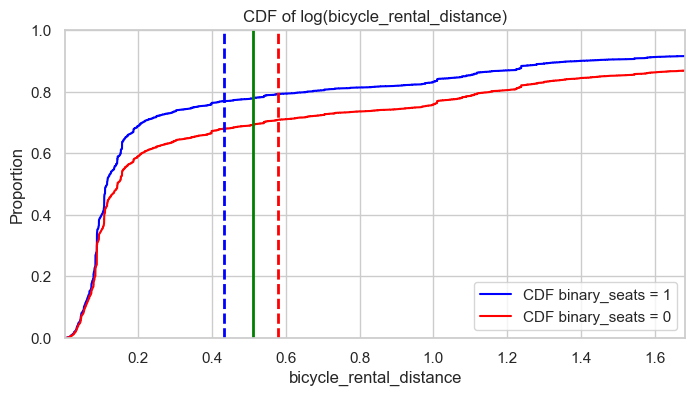

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/1832133660.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


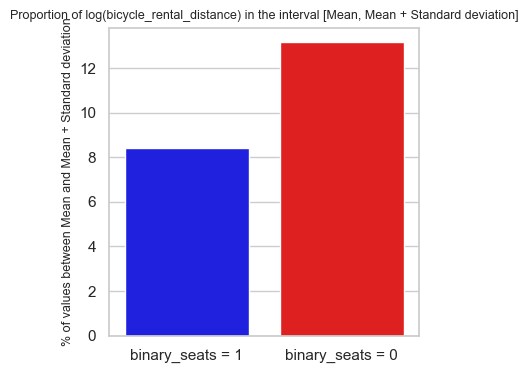

89923 79359
79359 79359
bicycle_rental_distance (Log Transformed)

Mean (1) : 0.43, Mean (0) : 0.58, Total Mean : 0.51
Standard Deviation (1) : 0.67, Standard Deviation (0) : 0.78
8.40% of '1' are between the mean and the standard deviation
13.16% of '0' are between the mean and the standard deviation



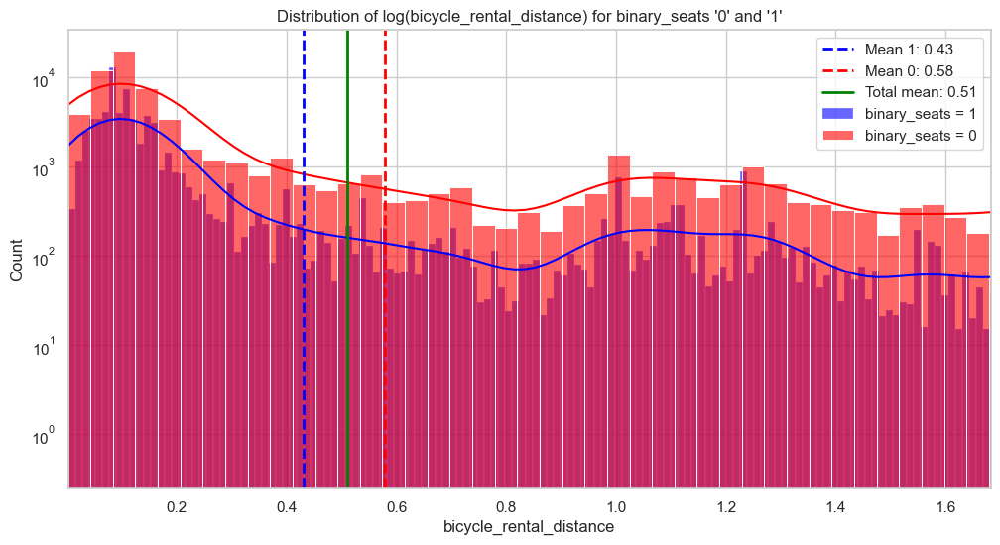

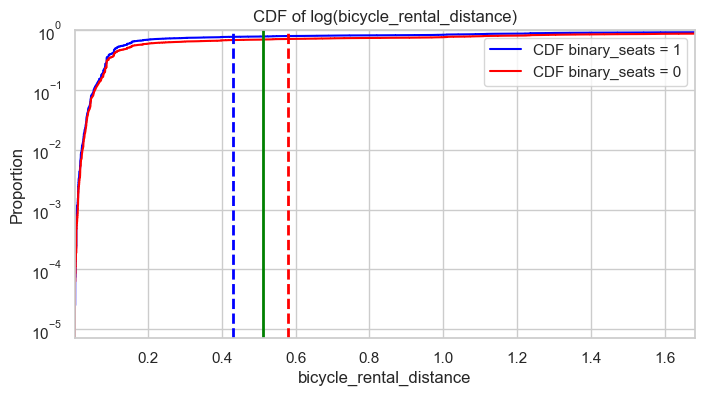

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/477769048.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


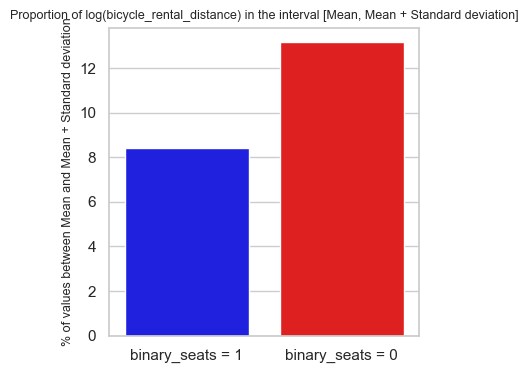

89923 79359
79359 79359
bicycle_rental_density

Mean (1) : 13.15, Mean (0) : 11.47, Total Mean : 12.24
Standard Deviation (1) : 11.89, Standard Deviation (0) : 12.29
34.63% of '1' are between the mean and the standard deviation
28.91% of '0' are between the mean and the standard deviation



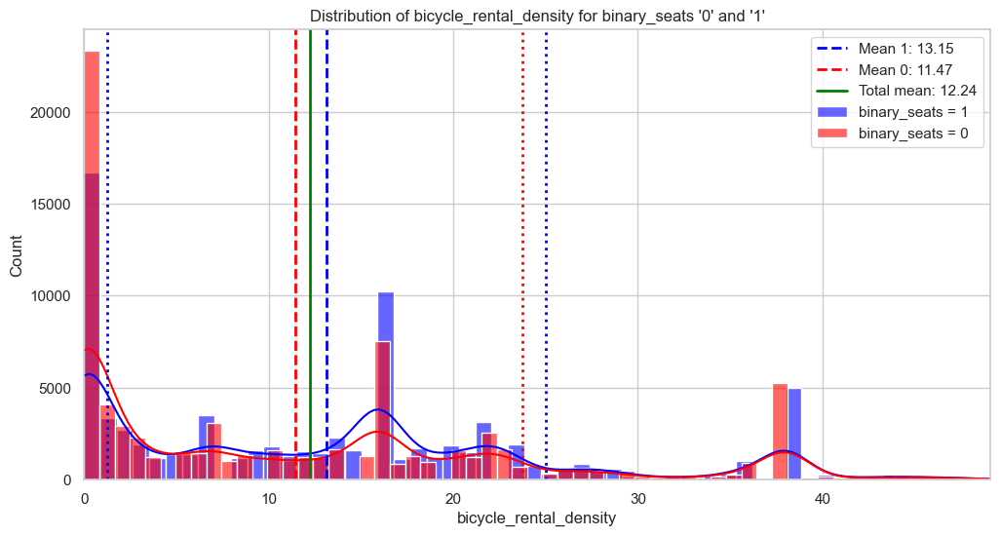

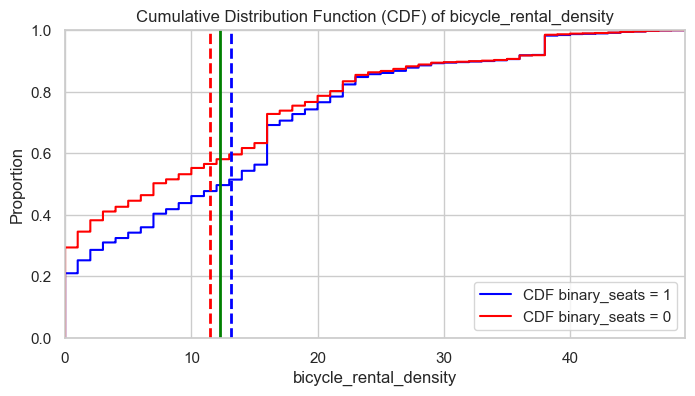

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/2489681251.py:68: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


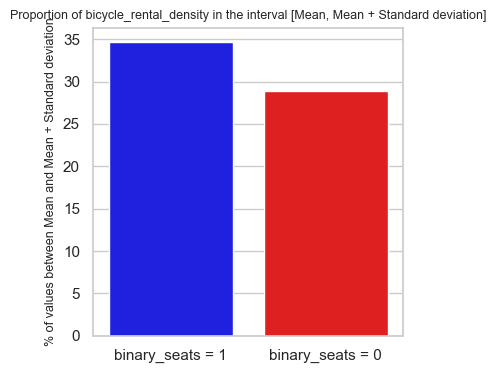

89923 79359
79359 79359
bicycle_rental_density

Mean (1) : 13.15, Mean (0) : 11.47, Total Mean : 12.24
Standard Deviation (1) : 11.89, Standard Deviation (0) : 12.29
34.63% of '1' are between the mean and the standard deviation
28.91% of '0' are between the mean and the standard deviation



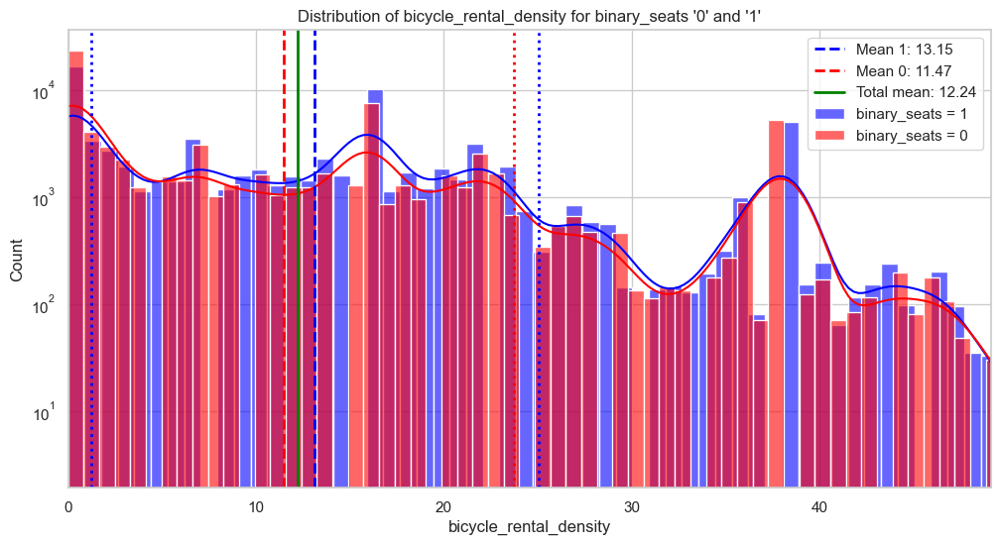

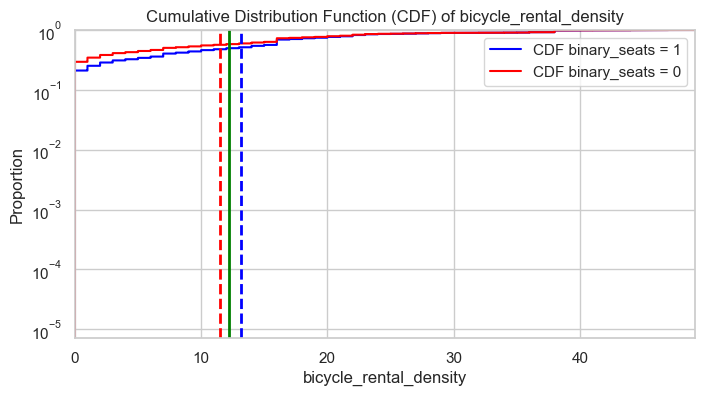

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/531870254.py:70: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


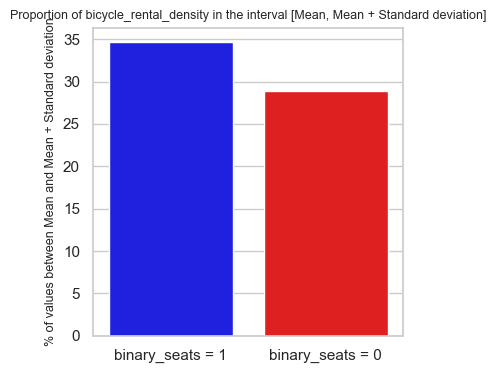

89923 79359
79359 79359
bicycle_rental_density (Log Transformed)

Mean (1) : 2.07, Mean (0) : 1.80, Total Mean : 1.92
Standard Deviation (1) : 1.28, Standard Deviation (0) : 1.37
51.83% of '1' are between the mean and the standard deviation
38.79% of '0' are between the mean and the standard deviation



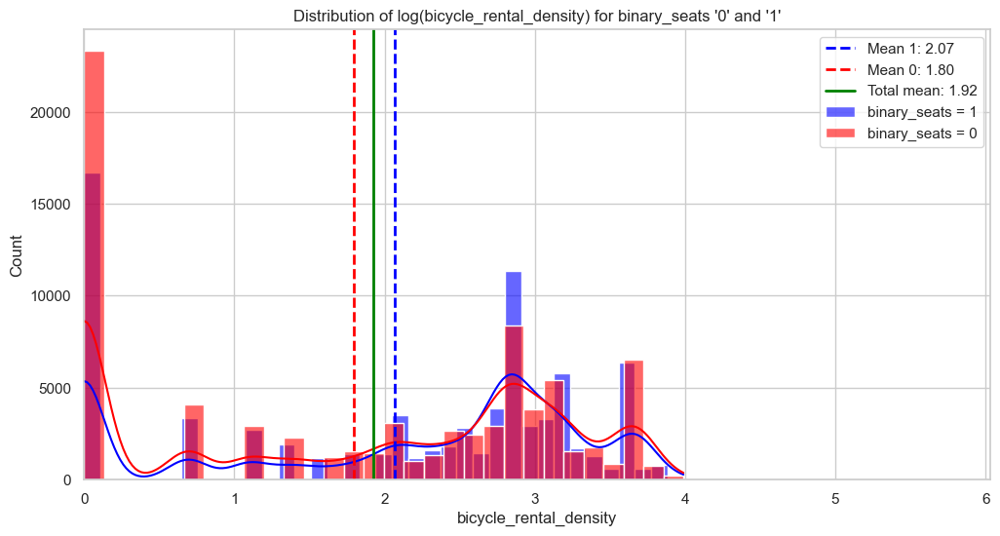

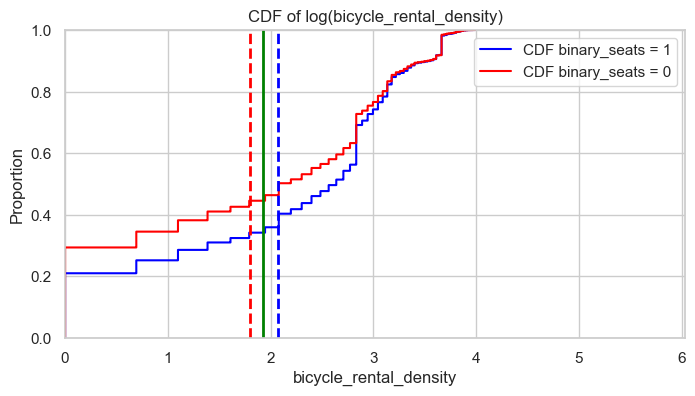

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/1832133660.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


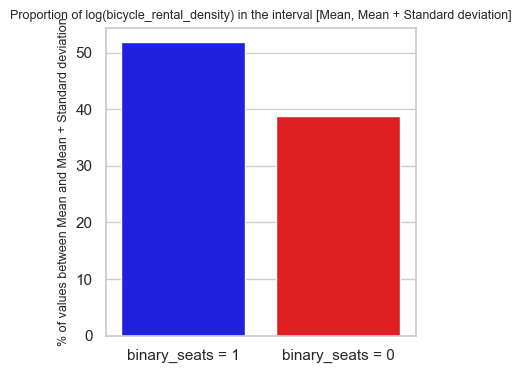

89923 79359
79359 79359
bicycle_rental_density (Log Transformed)

Mean (1) : 2.07, Mean (0) : 1.80, Total Mean : 1.92
Standard Deviation (1) : 1.28, Standard Deviation (0) : 1.37
51.83% of '1' are between the mean and the standard deviation
38.79% of '0' are between the mean and the standard deviation



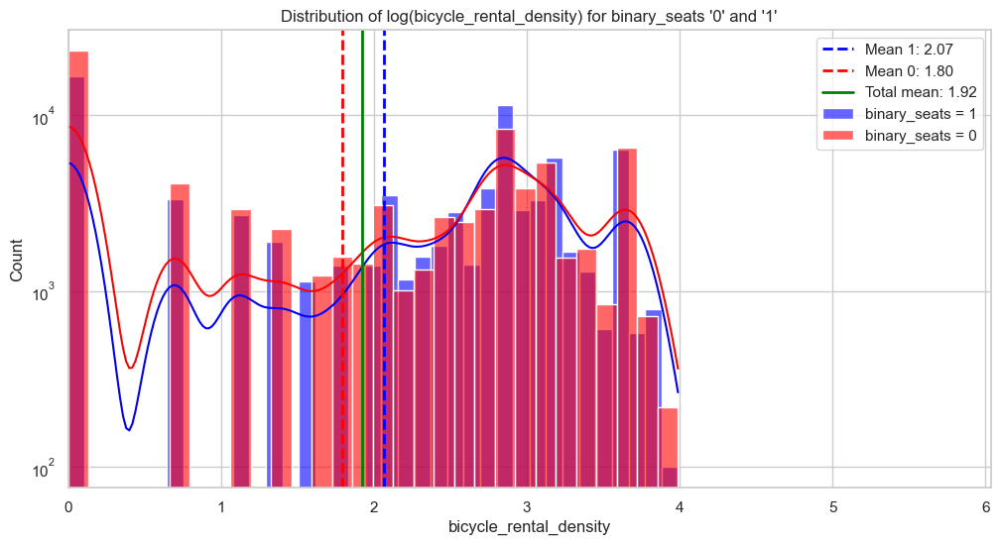

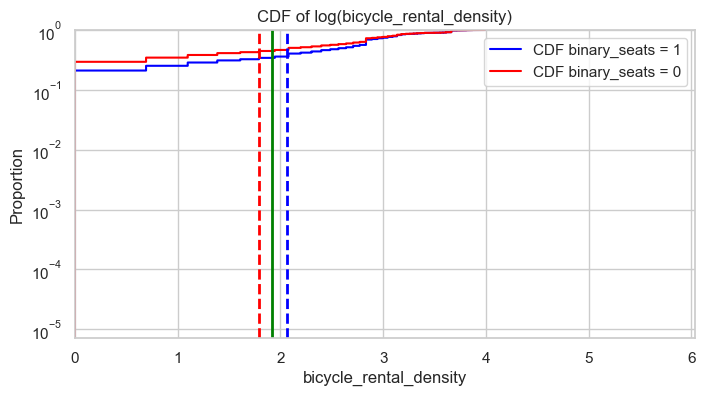

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/477769048.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


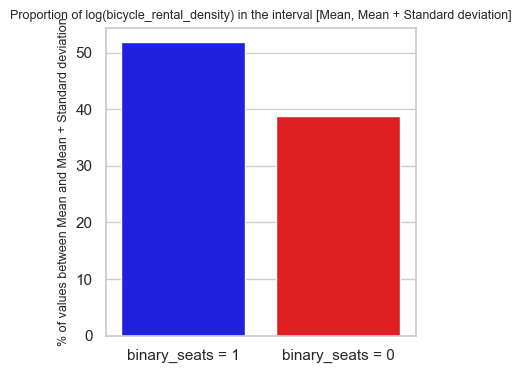

89923 79359
79359 79359
fuel_distance

Mean (1) : 0.83, Mean (0) : 0.93, Total Mean : 0.88
Standard Deviation (1) : 0.74, Standard Deviation (0) : 0.85
33.76% of '1' are between the mean and the standard deviation
31.65% of '0' are between the mean and the standard deviation



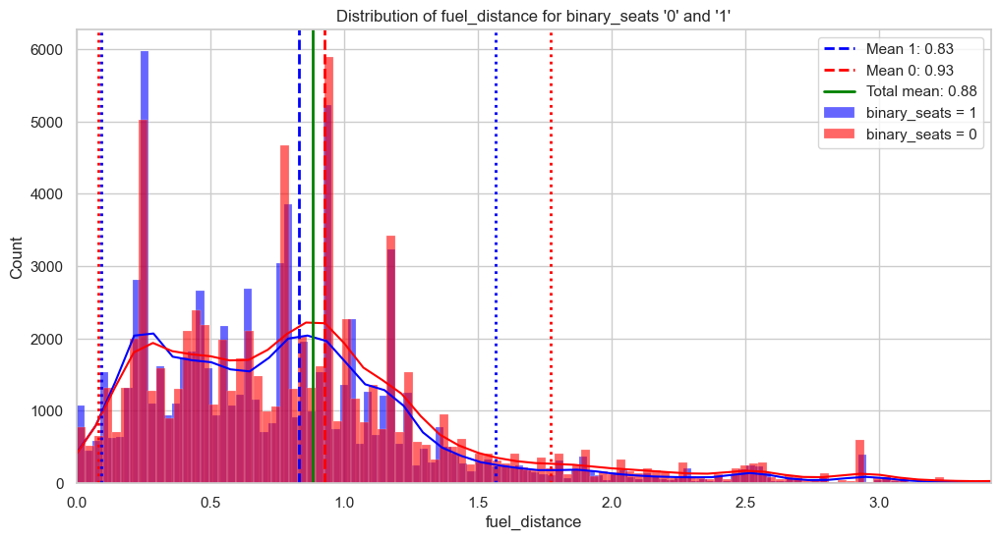

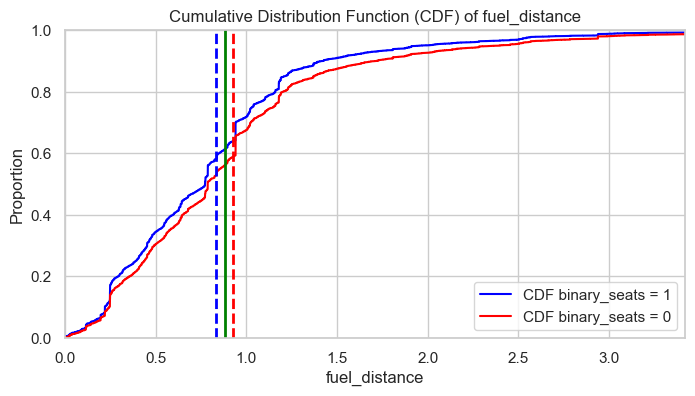

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/2489681251.py:68: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


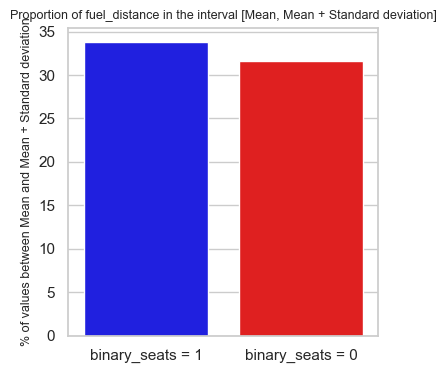

89923 79359
79359 79359
fuel_distance

Mean (1) : 0.83, Mean (0) : 0.93, Total Mean : 0.88
Standard Deviation (1) : 0.74, Standard Deviation (0) : 0.85
33.76% of '1' are between the mean and the standard deviation
31.65% of '0' are between the mean and the standard deviation



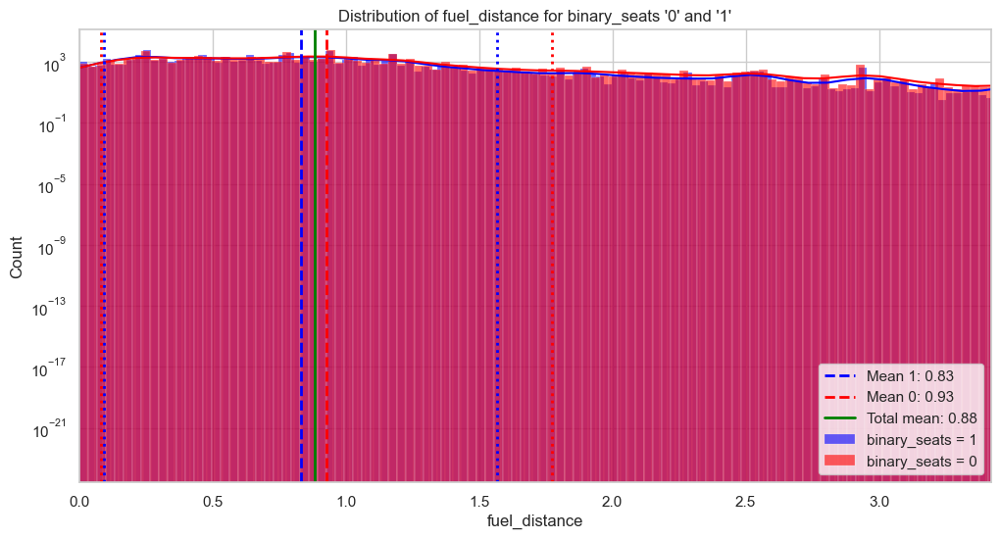

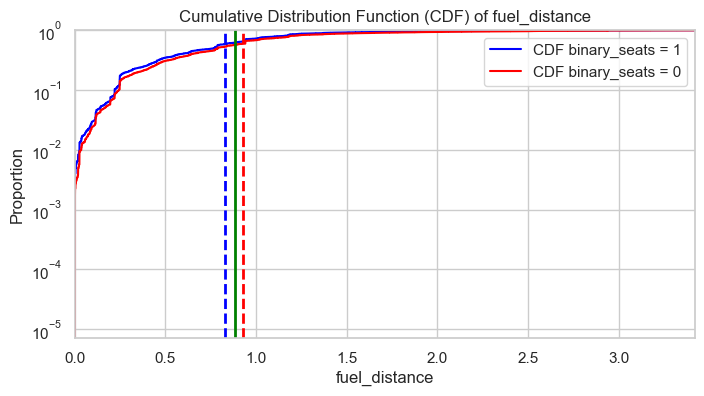

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/531870254.py:70: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


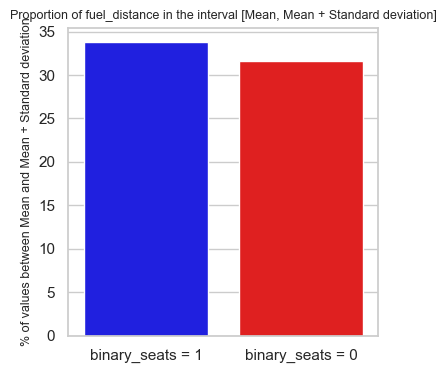

89923 79359
79359 79359
fuel_distance (Log Transformed)

Mean (1) : 0.55, Mean (0) : 0.59, Total Mean : 0.58
Standard Deviation (1) : 0.30, Standard Deviation (0) : 0.33
40.12% of '1' are between the mean and the standard deviation
35.75% of '0' are between the mean and the standard deviation



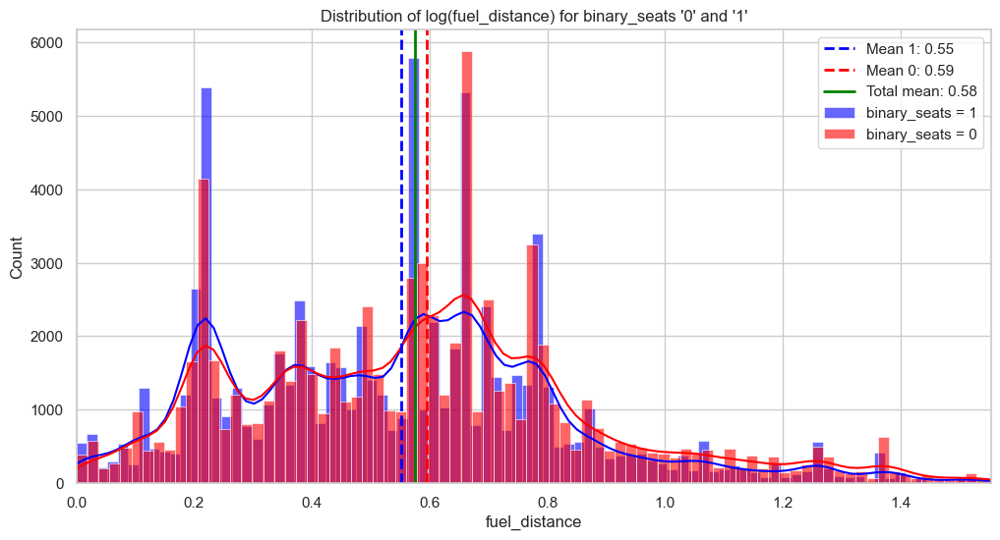

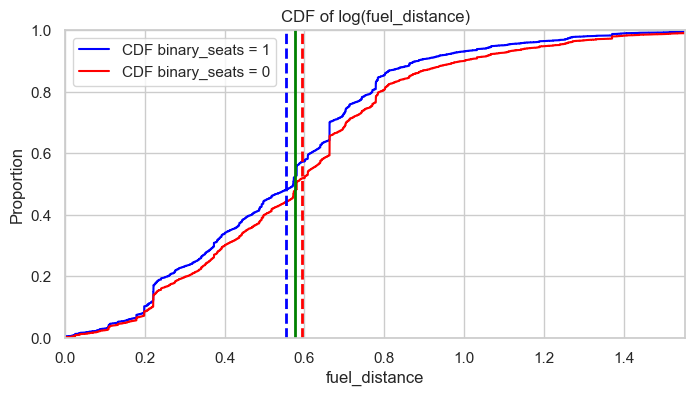

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/1832133660.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


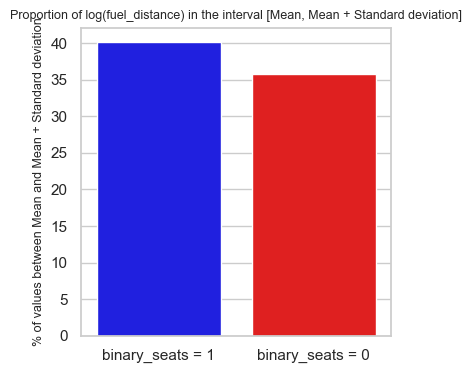

89923 79359
79359 79359
fuel_distance (Log Transformed)

Mean (1) : 0.55, Mean (0) : 0.59, Total Mean : 0.58
Standard Deviation (1) : 0.30, Standard Deviation (0) : 0.33
40.12% of '1' are between the mean and the standard deviation
35.75% of '0' are between the mean and the standard deviation



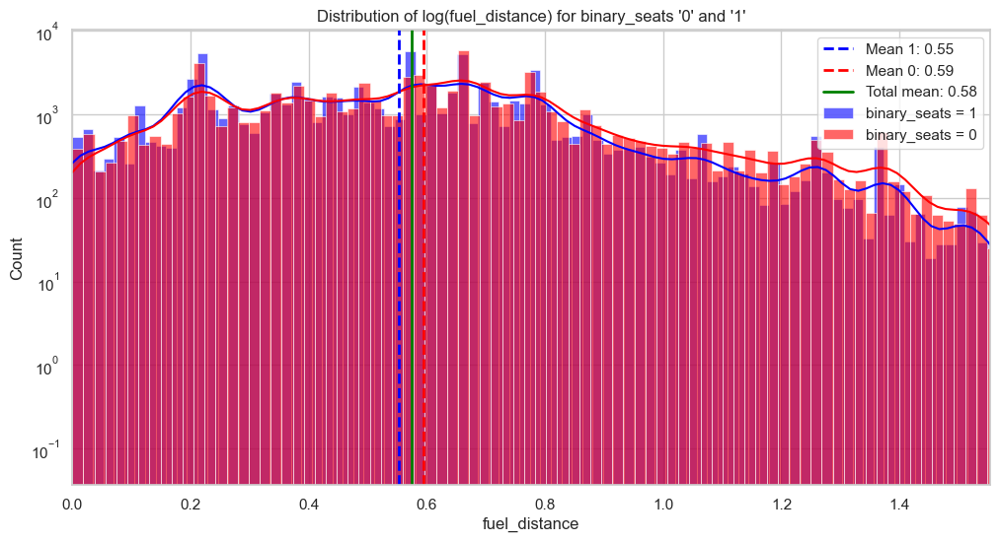

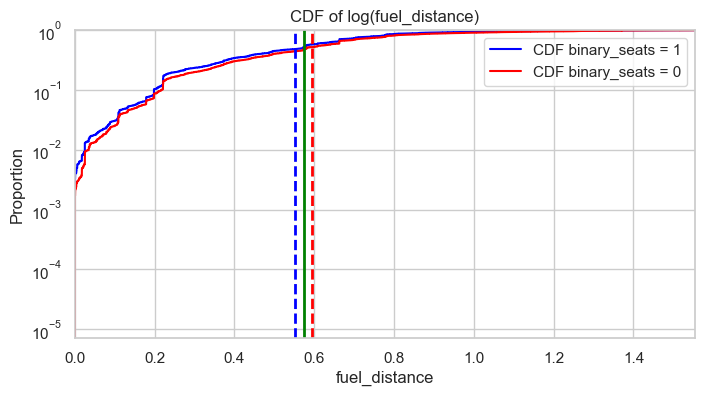

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/477769048.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


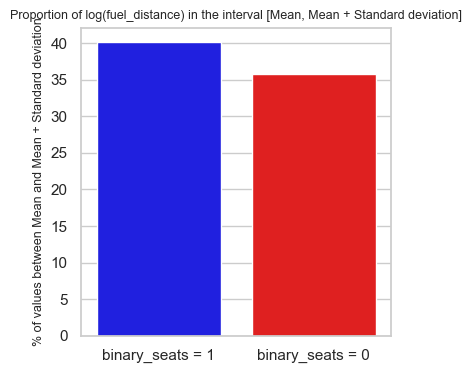

89923 79359
79359 79359
fuel_density

Mean (1) : 1.15, Mean (0) : 1.01, Total Mean : 1.07
Standard Deviation (1) : 1.34, Standard Deviation (0) : 1.29
23.92% of '1' are between the mean and the standard deviation
20.14% of '0' are between the mean and the standard deviation



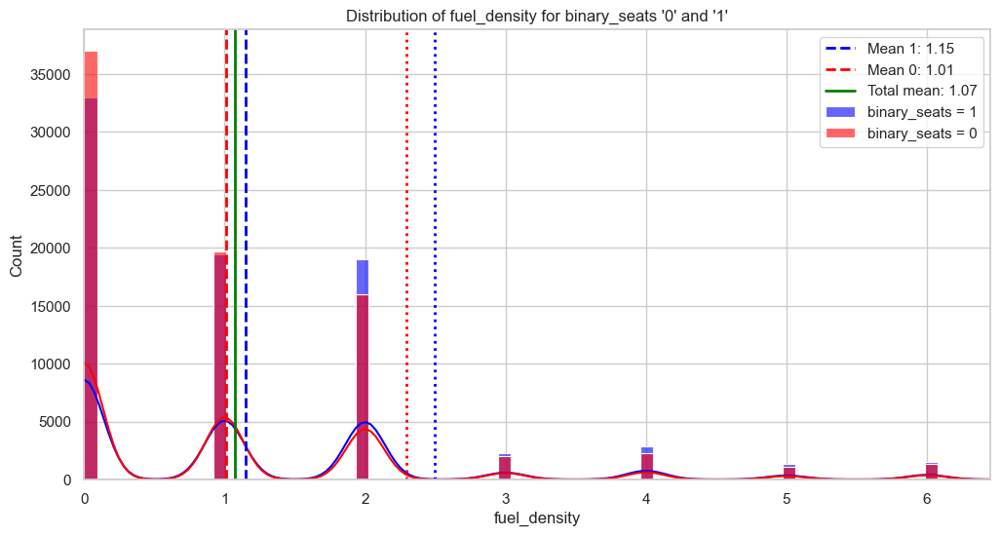

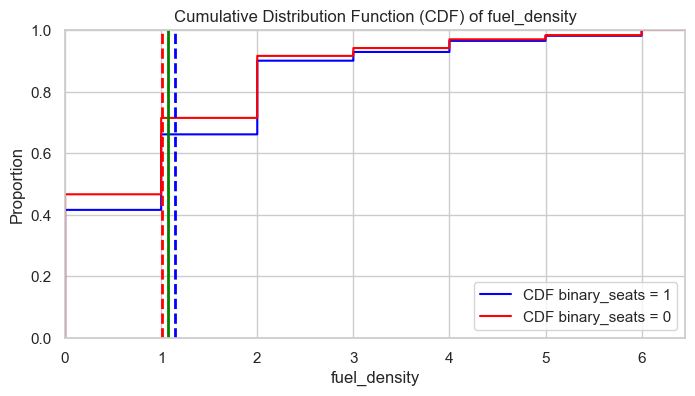

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/2489681251.py:68: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


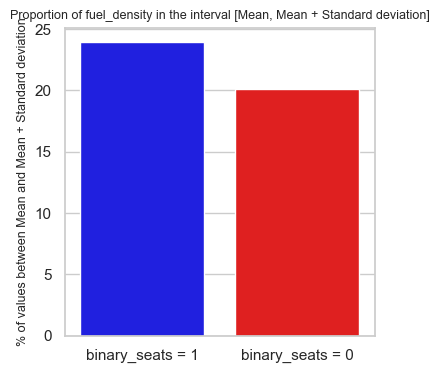

89923 79359
79359 79359
fuel_density

Mean (1) : 1.15, Mean (0) : 1.01, Total Mean : 1.07
Standard Deviation (1) : 1.34, Standard Deviation (0) : 1.29
23.92% of '1' are between the mean and the standard deviation
20.14% of '0' are between the mean and the standard deviation



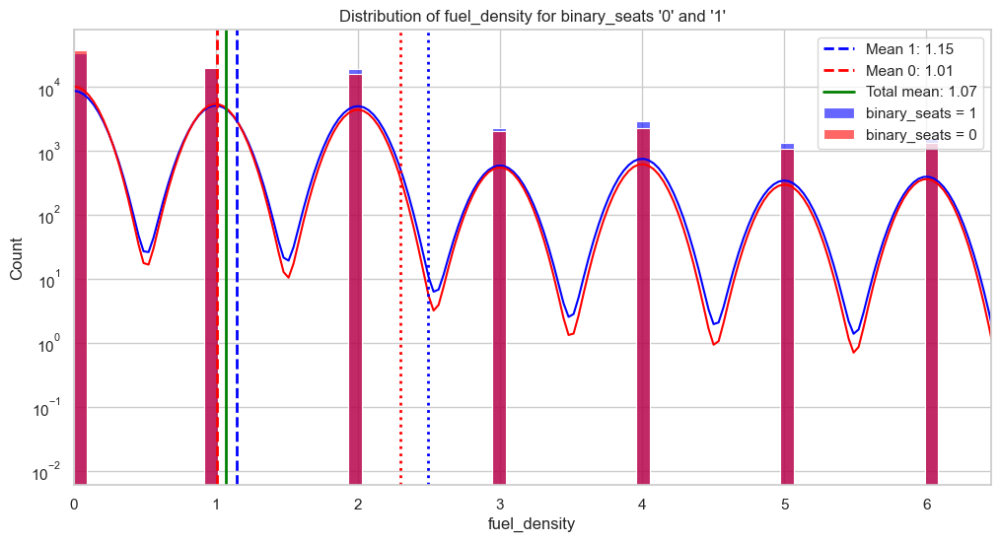

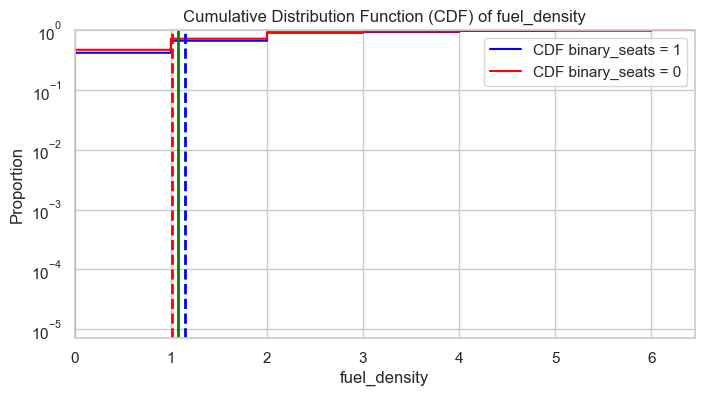

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/531870254.py:70: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


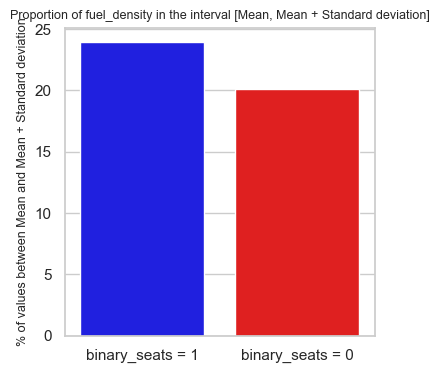

89923 79359
79359 79359
fuel_density (Log Transformed)

Mean (1) : 0.60, Mean (0) : 0.53, Total Mean : 0.56
Standard Deviation (1) : 0.57, Standard Deviation (0) : 0.56
48.44% of '1' are between the mean and the standard deviation
24.80% of '0' are between the mean and the standard deviation



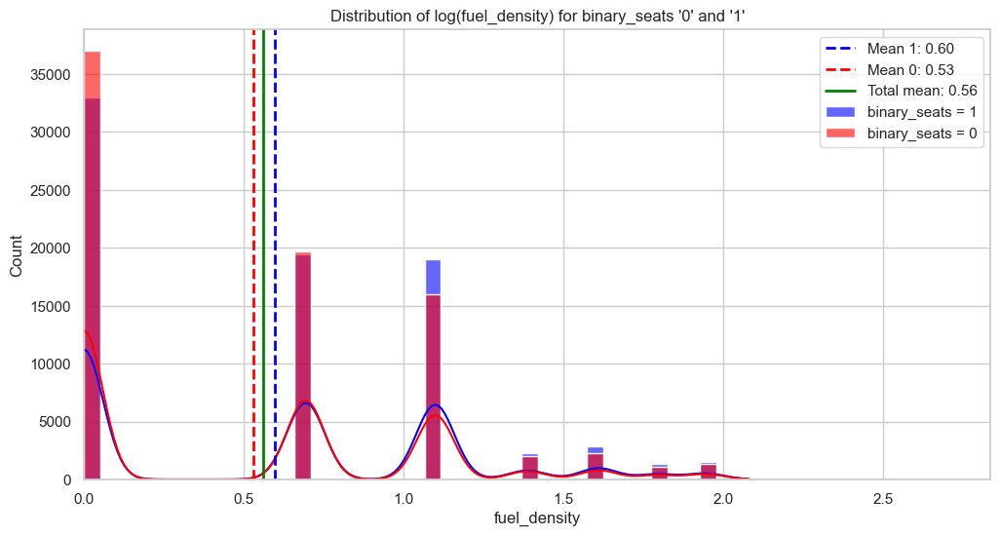

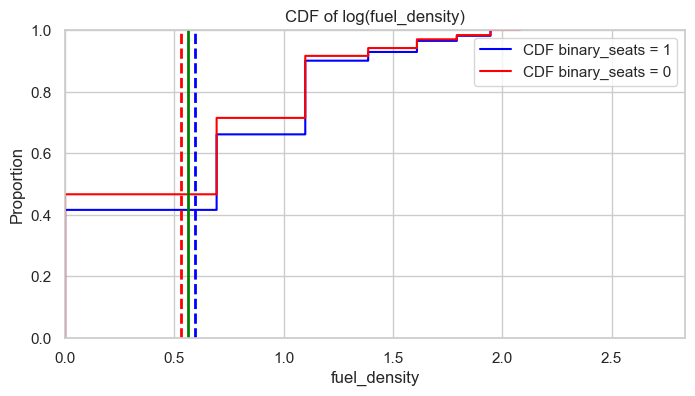

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/1832133660.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


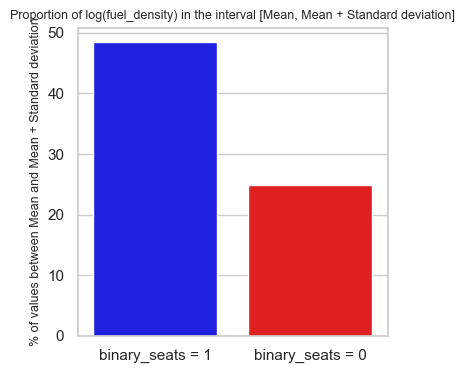

89923 79359
79359 79359
fuel_density (Log Transformed)

Mean (1) : 0.60, Mean (0) : 0.53, Total Mean : 0.56
Standard Deviation (1) : 0.57, Standard Deviation (0) : 0.56
48.44% of '1' are between the mean and the standard deviation
24.80% of '0' are between the mean and the standard deviation



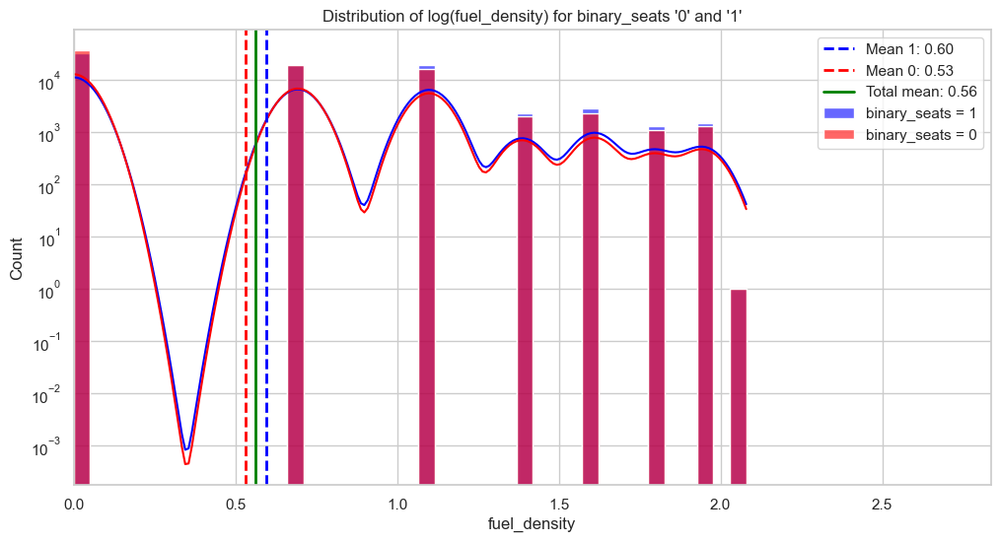

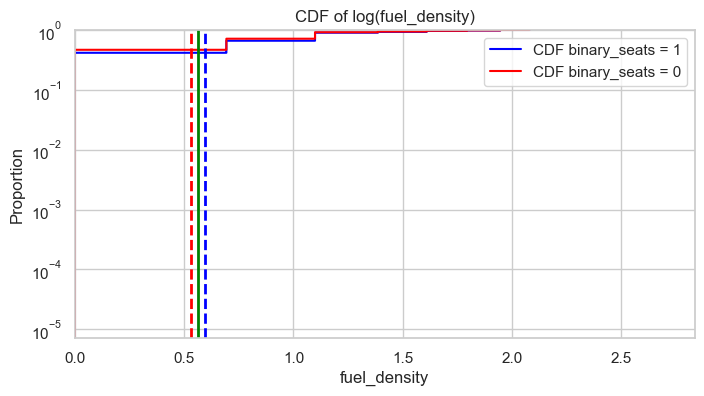

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/477769048.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


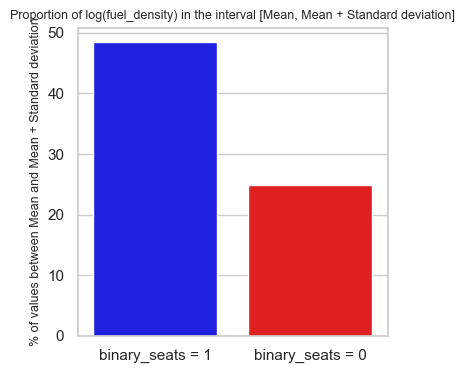

89923 79359
79359 79359
dens_pop

Mean (1) : 155.14, Mean (0) : 137.15, Total Mean : 145.52
Standard Deviation (1) : 100.08, Standard Deviation (0) : 100.72
30.87% of '1' are between the mean and the standard deviation
14.42% of '0' are between the mean and the standard deviation



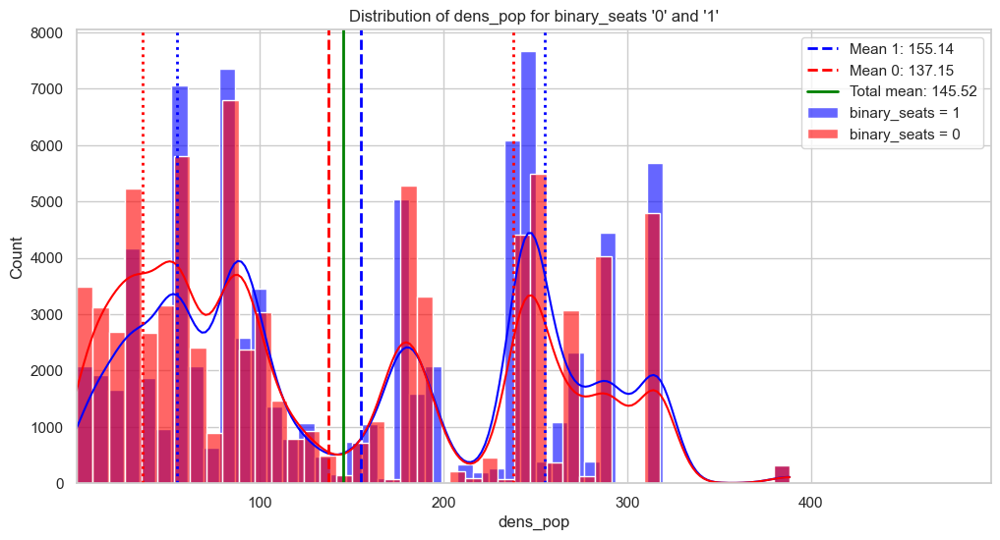

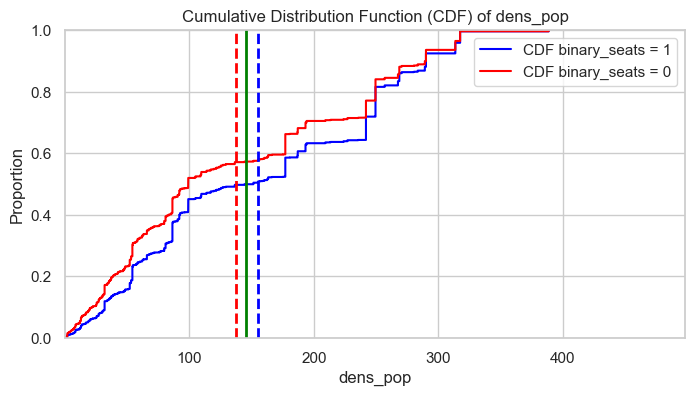

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/2489681251.py:68: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


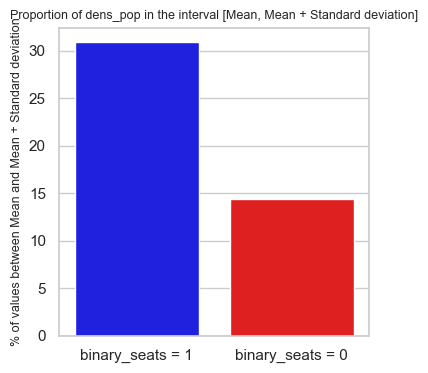

89923 79359
79359 79359
dens_pop

Mean (1) : 155.14, Mean (0) : 137.15, Total Mean : 145.52
Standard Deviation (1) : 100.08, Standard Deviation (0) : 100.72
30.87% of '1' are between the mean and the standard deviation
14.42% of '0' are between the mean and the standard deviation



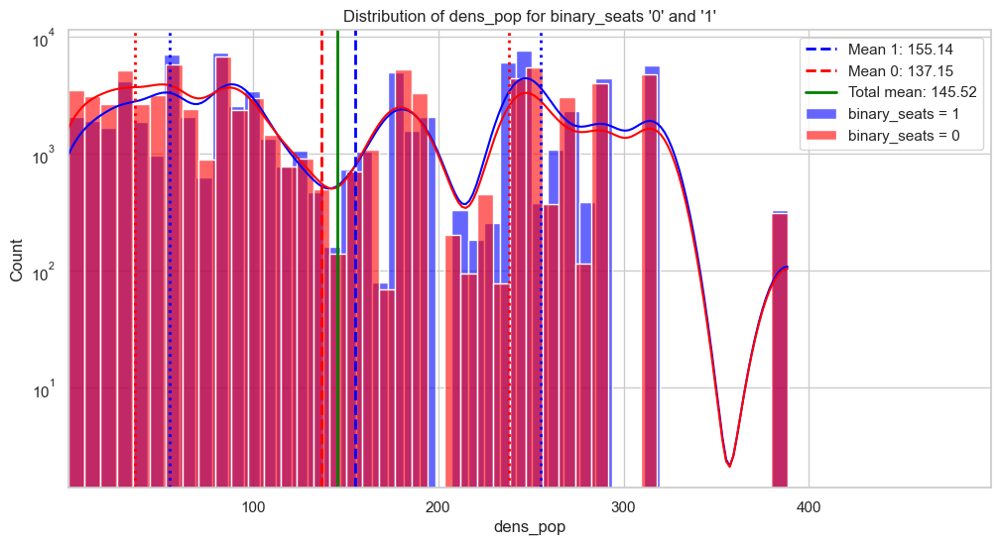

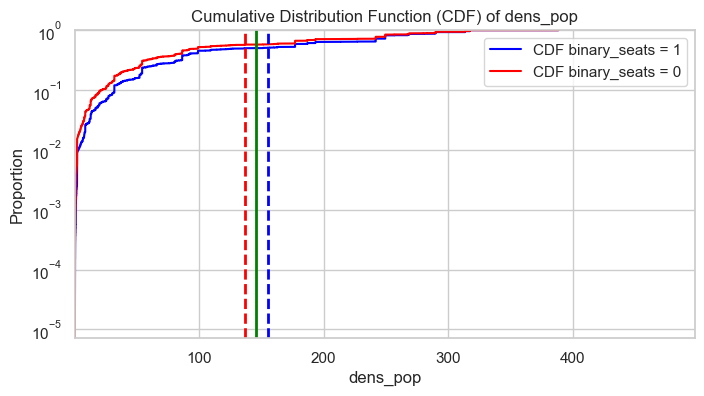

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/531870254.py:70: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


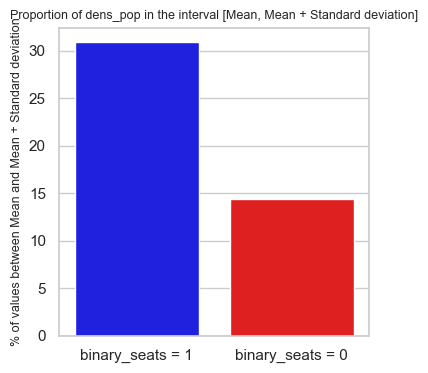

89923 79359
79359 79359
dens_pop (Log Transformed)

Mean (1) : 4.73, Mean (0) : 4.52, Total Mean : 4.62
Standard Deviation (1) : 0.95, Standard Deviation (0) : 1.06
45.61% of '1' are between the mean and the standard deviation
38.07% of '0' are between the mean and the standard deviation



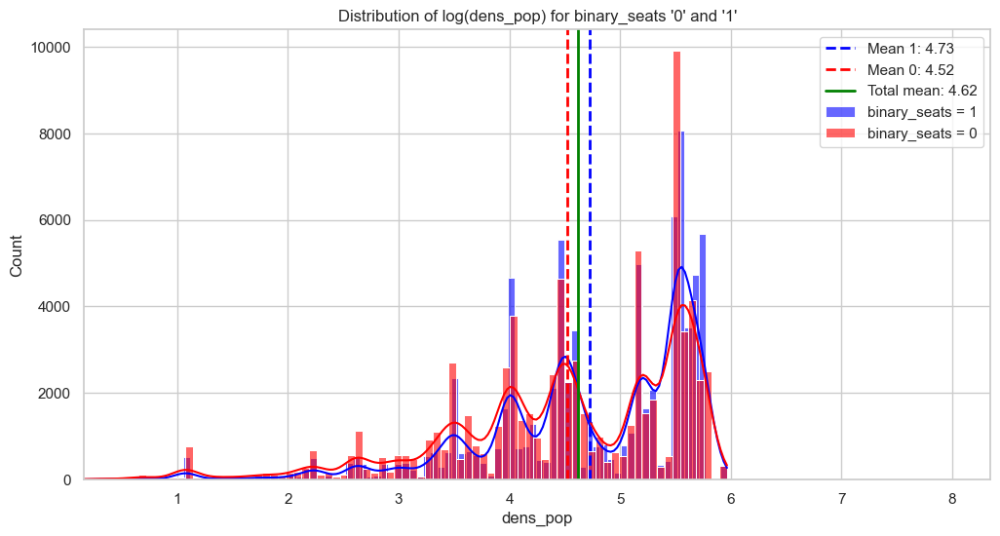

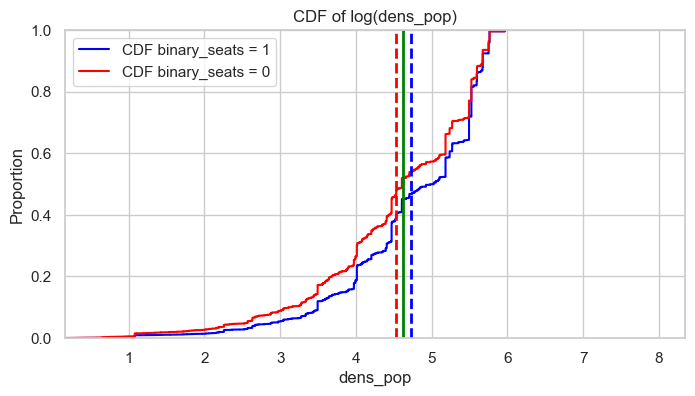

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/1832133660.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


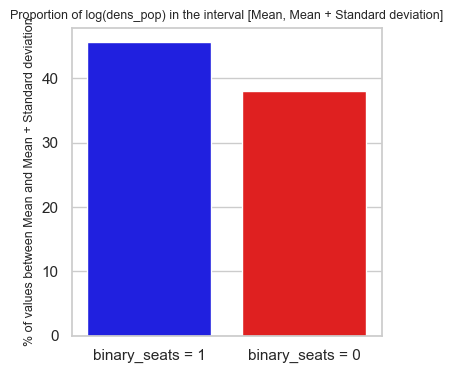

89923 79359
79359 79359
dens_pop (Log Transformed)

Mean (1) : 4.73, Mean (0) : 4.52, Total Mean : 4.62
Standard Deviation (1) : 0.95, Standard Deviation (0) : 1.06
45.61% of '1' are between the mean and the standard deviation
38.07% of '0' are between the mean and the standard deviation



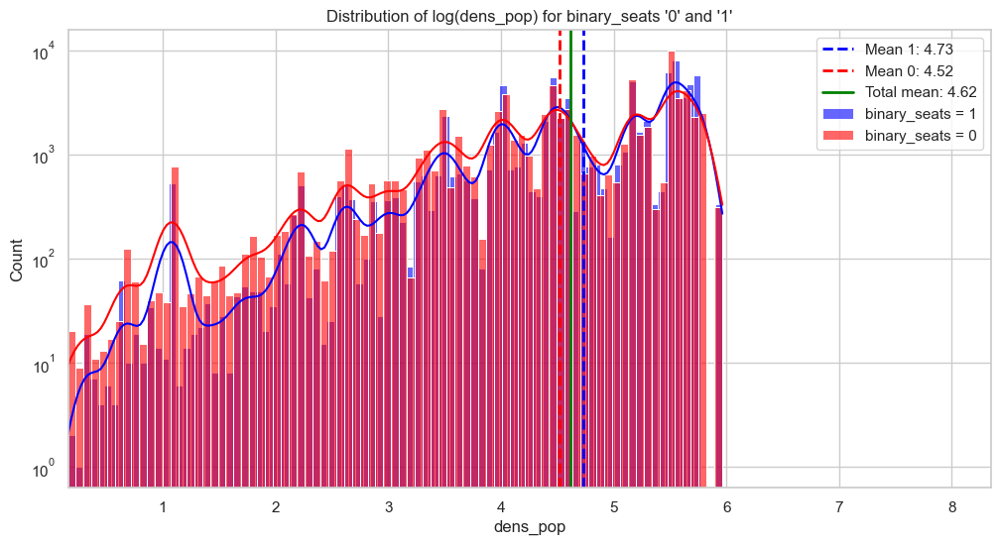

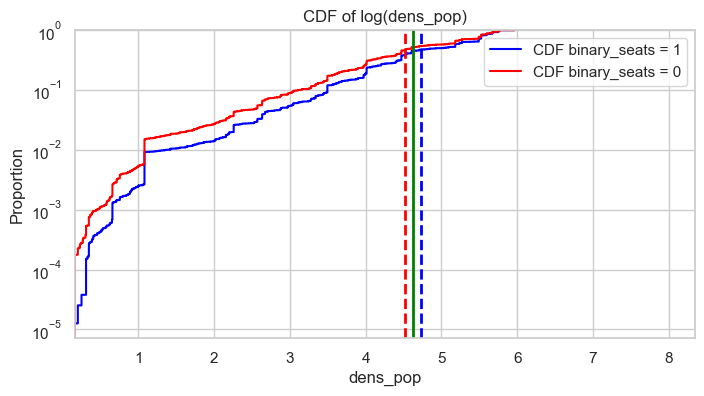

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/477769048.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


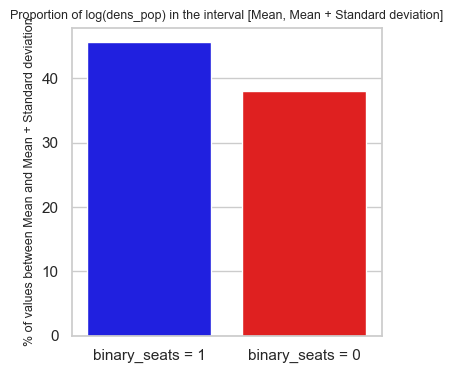

89923 79359
79359 79359
departure_time_hour

Mean (1) : 13.89, Mean (0) : 13.38, Total Mean : 13.62
Standard Deviation (1) : 4.54, Standard Deviation (0) : 4.74
36.94% of '1' are between the mean and the standard deviation
35.76% of '0' are between the mean and the standard deviation



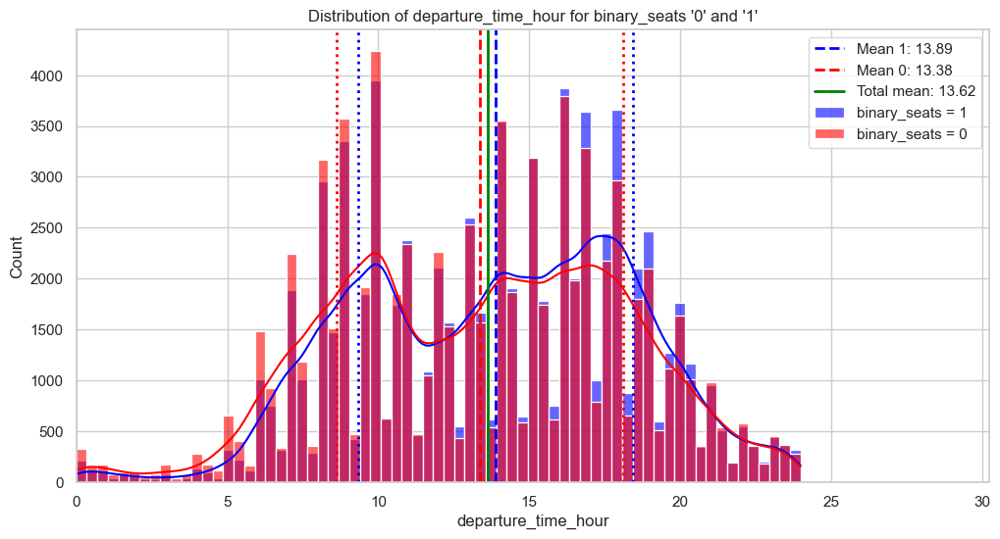

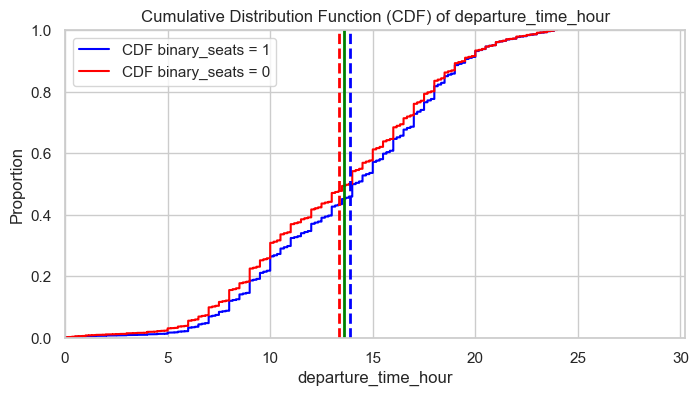

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/2489681251.py:68: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


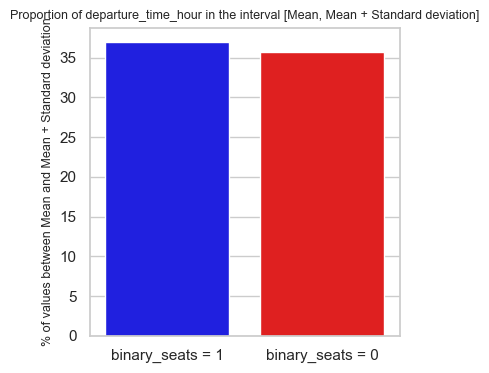

89923 79359
79359 79359
departure_time_hour

Mean (1) : 13.89, Mean (0) : 13.38, Total Mean : 13.62
Standard Deviation (1) : 4.54, Standard Deviation (0) : 4.74
36.94% of '1' are between the mean and the standard deviation
35.76% of '0' are between the mean and the standard deviation



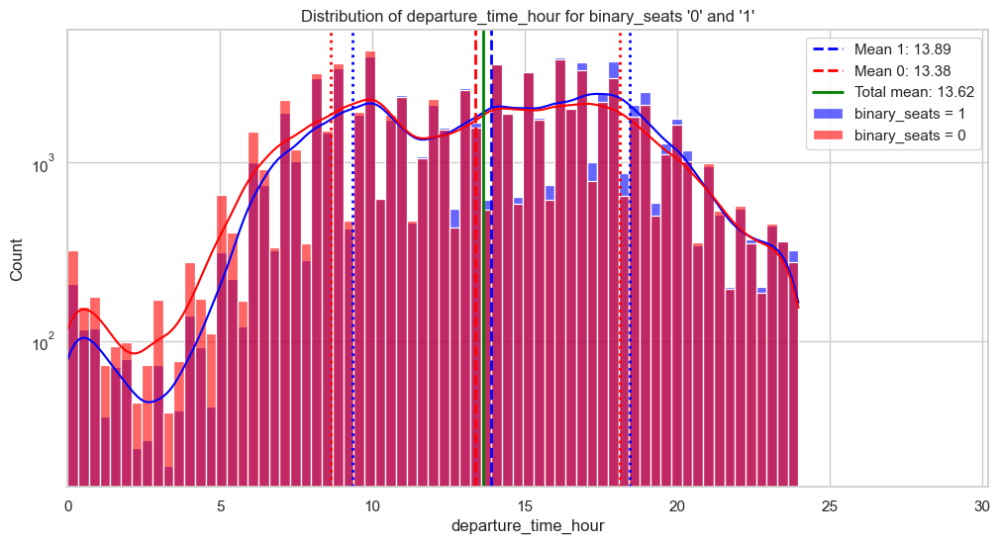

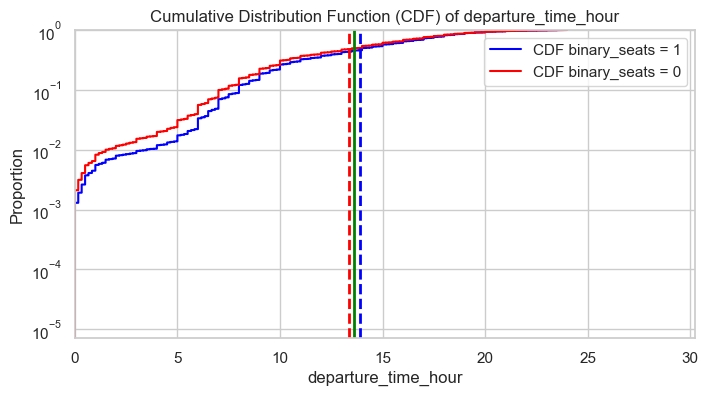

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/531870254.py:70: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


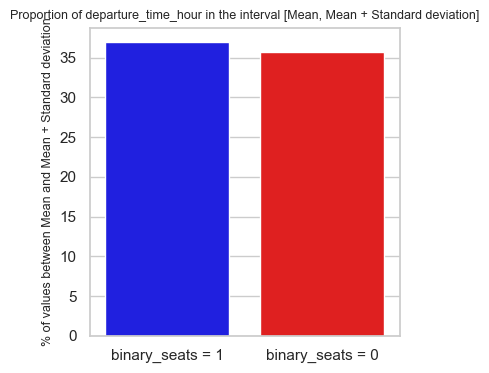

89923 79359
79359 79359
departure_time_hour (Log Transformed)

Mean (1) : 2.64, Mean (0) : 2.60, Total Mean : 2.62
Standard Deviation (1) : 0.38, Standard Deviation (0) : 0.41
46.69% of '1' are between the mean and the standard deviation
47.17% of '0' are between the mean and the standard deviation



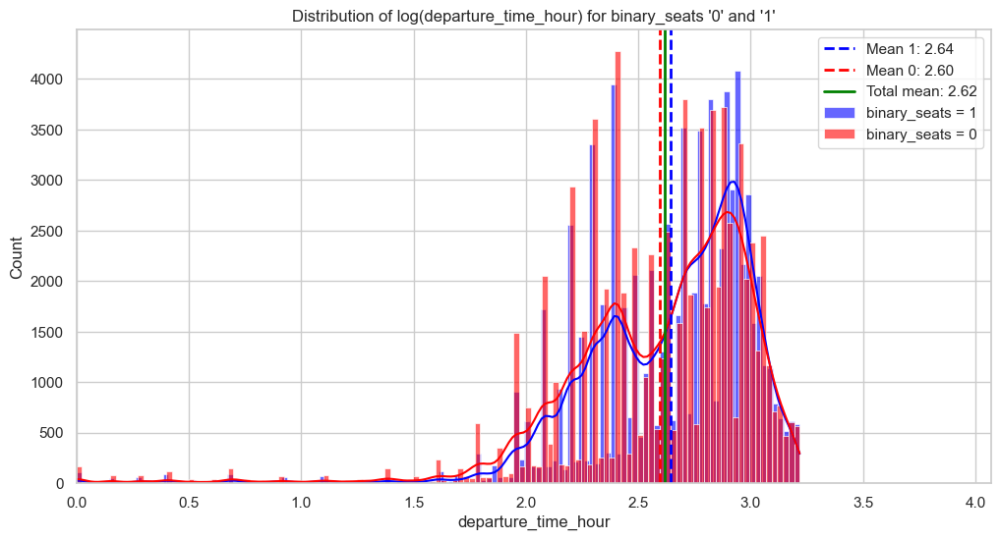

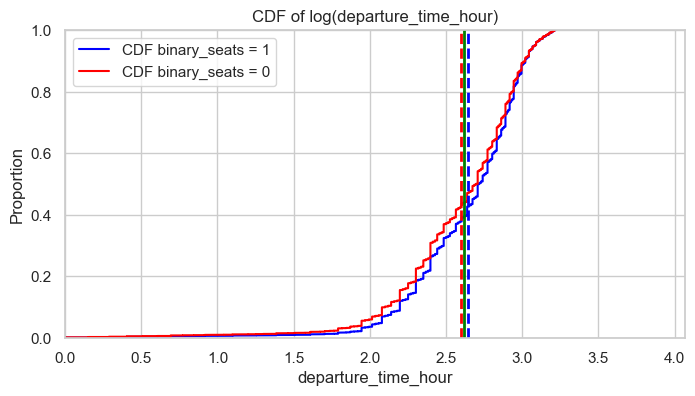

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/1832133660.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


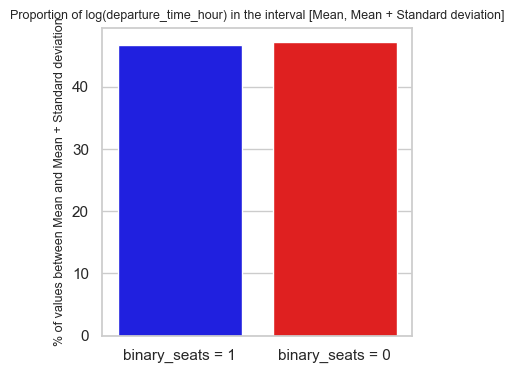

89923 79359
79359 79359
departure_time_hour (Log Transformed)

Mean (1) : 2.64, Mean (0) : 2.60, Total Mean : 2.62
Standard Deviation (1) : 0.38, Standard Deviation (0) : 0.41
46.69% of '1' are between the mean and the standard deviation
47.17% of '0' are between the mean and the standard deviation



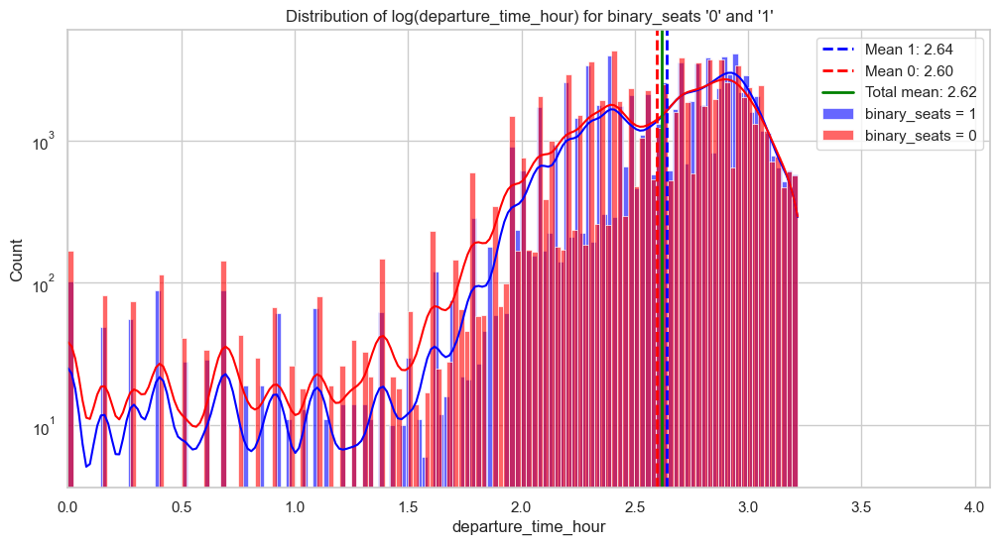

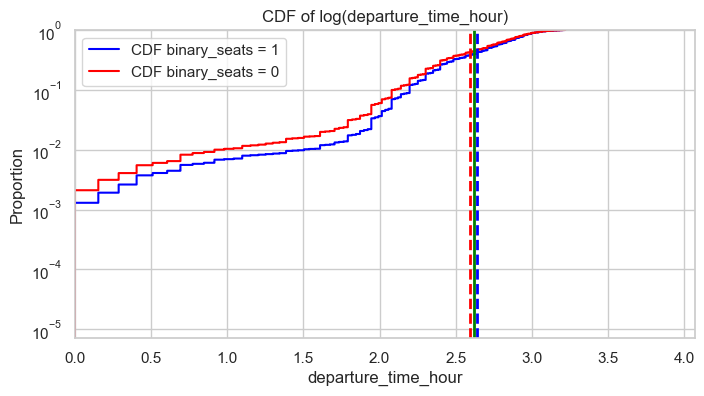

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/477769048.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


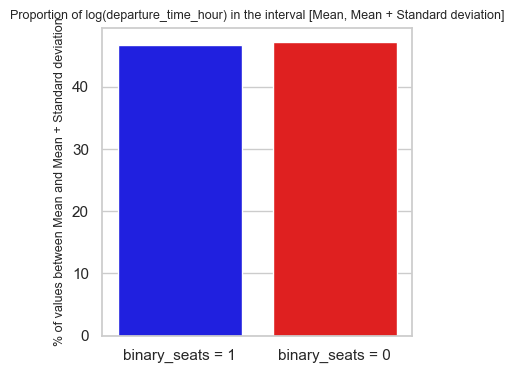

89923 79359
79359 79359
Hors unité urbaine

Mean (1) : 0.00, Mean (0) : 0.00, Total Mean : 0.00
Standard Deviation (1) : 0.04, Standard Deviation (0) : 0.06
0.00% of '1' are between the mean and the standard deviation
0.00% of '0' are between the mean and the standard deviation



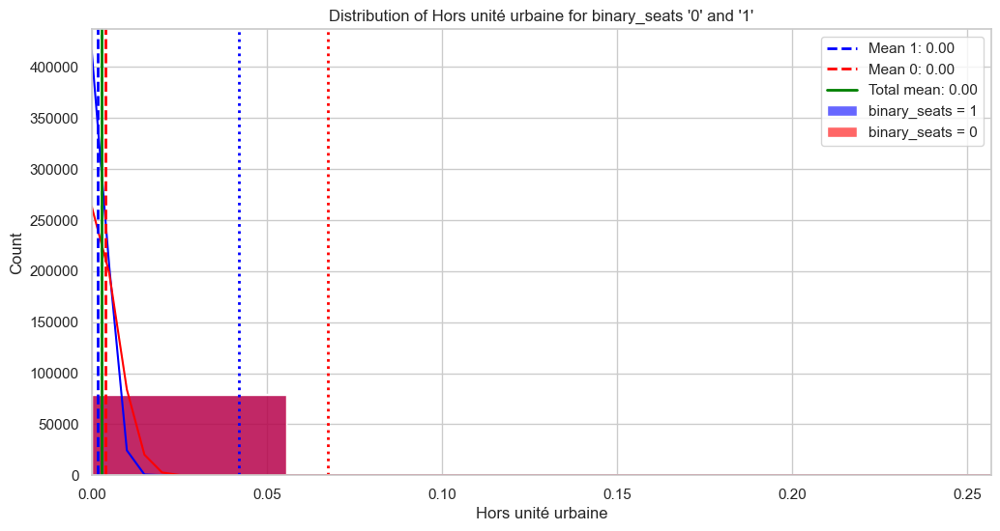

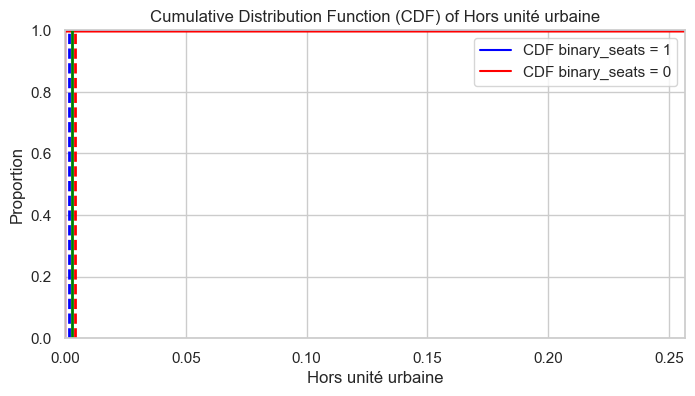

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/2489681251.py:68: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


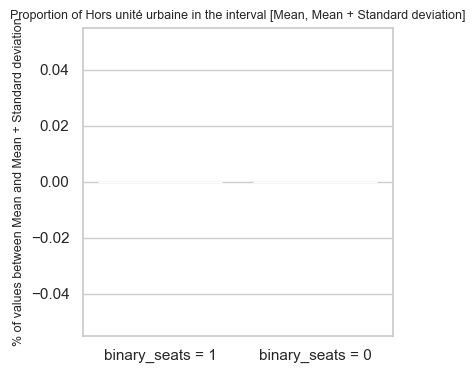

89923 79359
79359 79359
Hors unité urbaine

Mean (1) : 0.00, Mean (0) : 0.00, Total Mean : 0.00
Standard Deviation (1) : 0.04, Standard Deviation (0) : 0.06
0.00% of '1' are between the mean and the standard deviation
0.00% of '0' are between the mean and the standard deviation



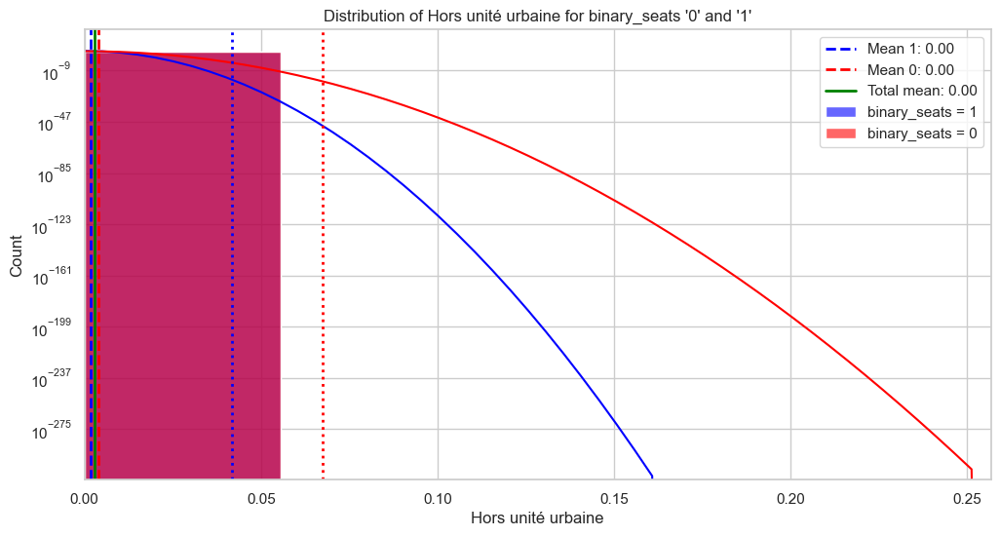

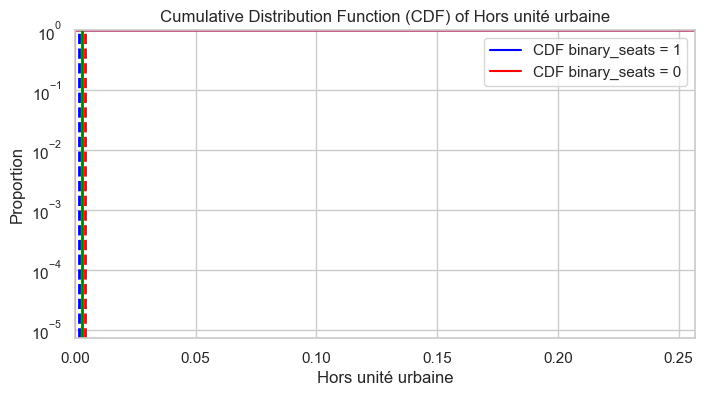

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/531870254.py:70: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


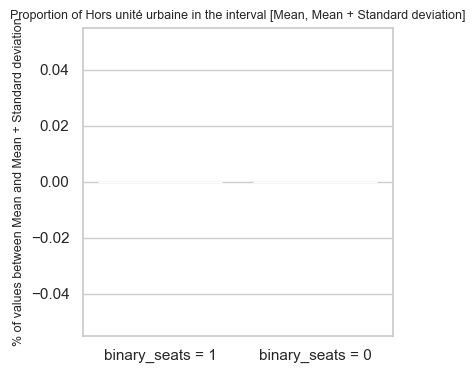

89923 79359
79359 79359
Hors unité urbaine (Log Transformed)

Mean (1) : 0.00, Mean (0) : 0.00, Total Mean : 0.00
Standard Deviation (1) : 0.03, Standard Deviation (0) : 0.04
0.00% of '1' are between the mean and the standard deviation
0.00% of '0' are between the mean and the standard deviation



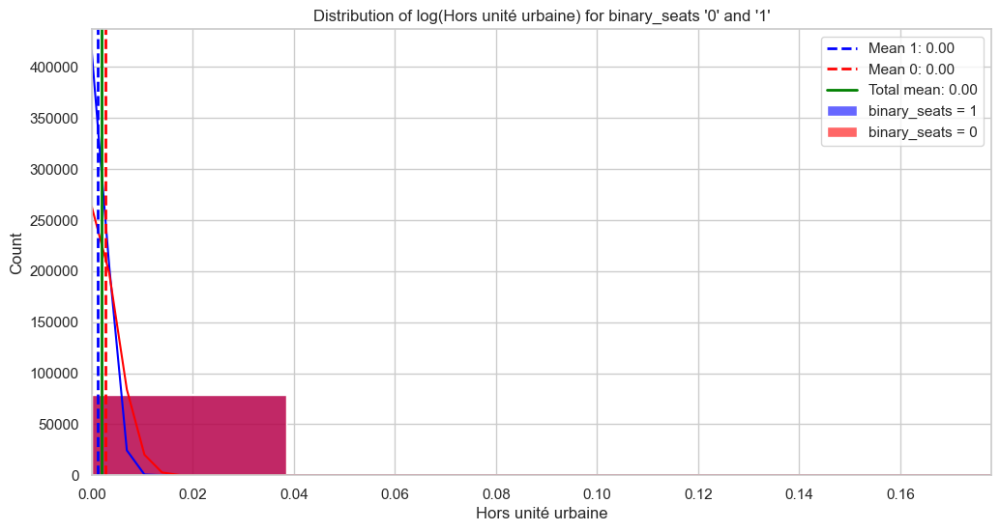

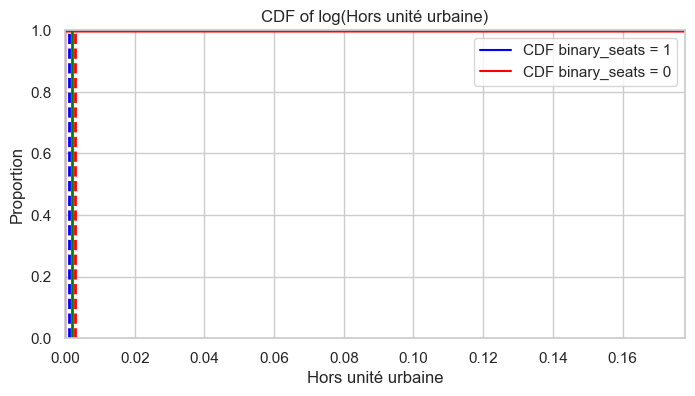

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/1832133660.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


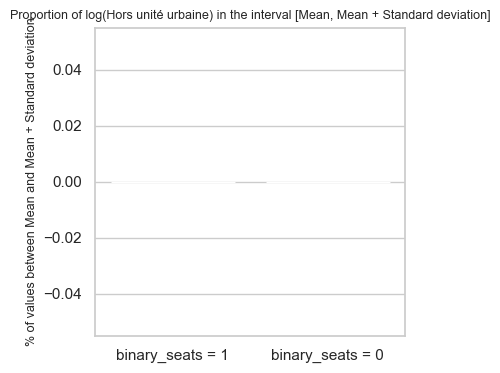

89923 79359
79359 79359
Hors unité urbaine (Log Transformed)

Mean (1) : 0.00, Mean (0) : 0.00, Total Mean : 0.00
Standard Deviation (1) : 0.03, Standard Deviation (0) : 0.04
0.00% of '1' are between the mean and the standard deviation
0.00% of '0' are between the mean and the standard deviation



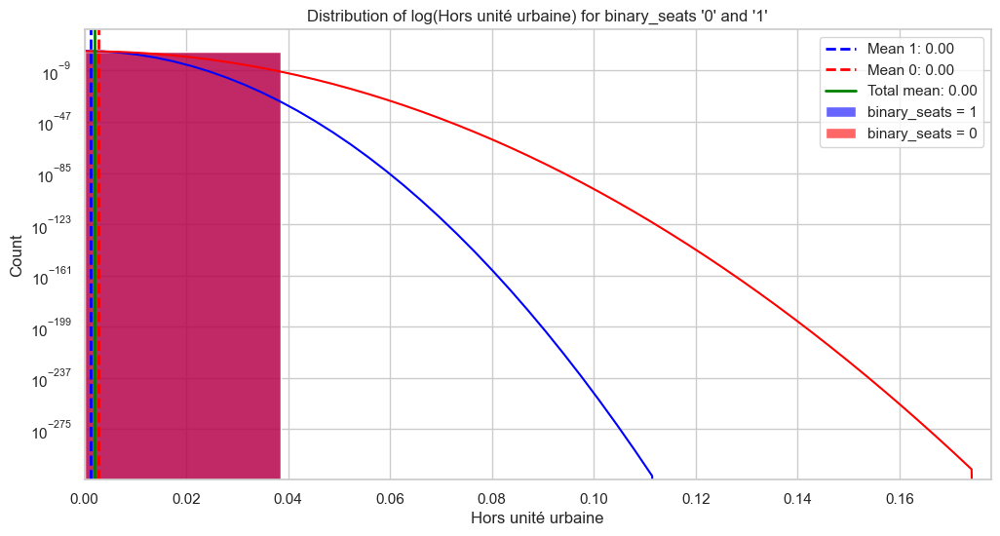

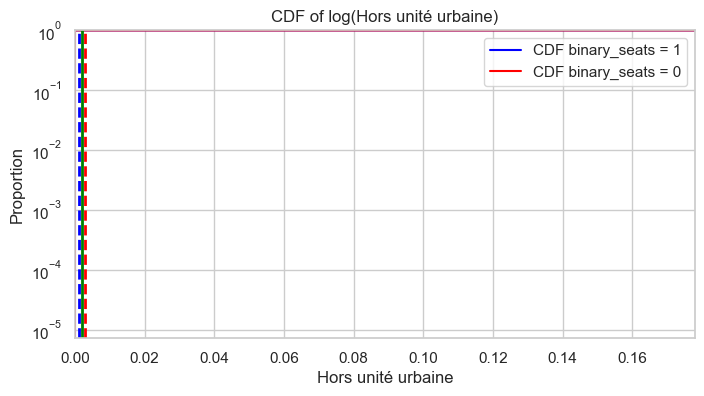

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/477769048.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


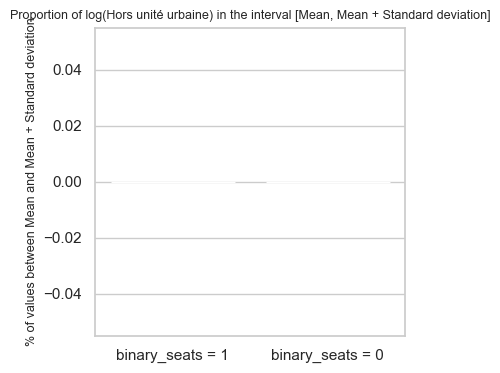

unit_price

Mean (1) : 0.06, Mean (0) : 0.06, Total Mean : 0.06
Standard Deviation (1) : 0.01, Standad Deviation(0) : 0.01
27.09% of '1' are between the mean and the standard deviation
24.26% of '0' are between the mean and the standard deviation



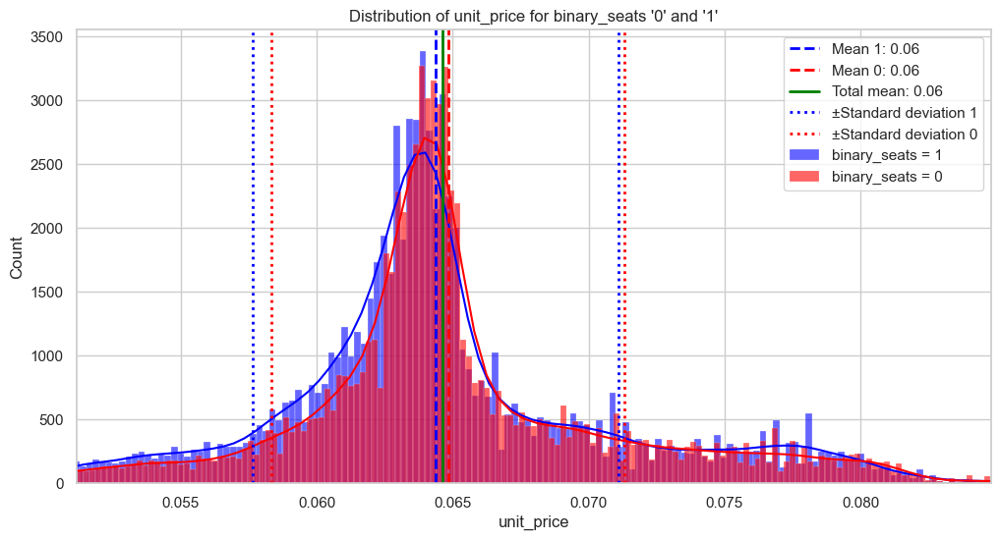

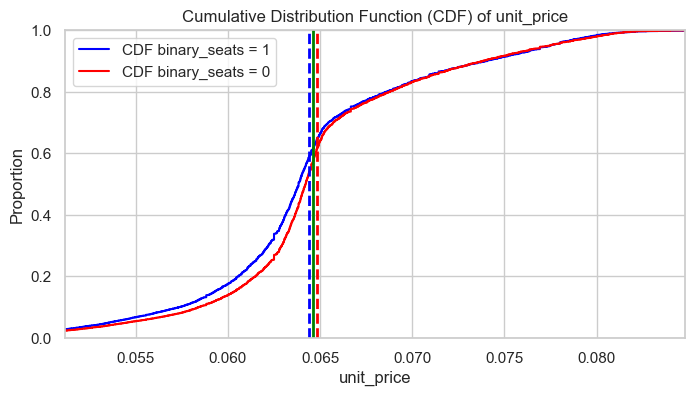

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/3739125995.py:74: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


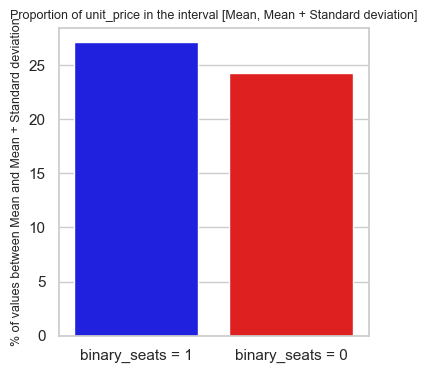

In [20]:
#my_values = ['airport_distance', 'airport_density', 'trainstation_distance', 'trainstation_density', 'electric_distance', 'electric_density', 'bicycle_parking_distance', 'bicycle_parking_density', 'tram_stop_distance', 'tram_stop_density', 'subway_entrance_distance','subway_entrance_density', 'bus_stop_distance' ,'bus_stop_density','bicycle_rental_distance','bicycle_rental_density','fuel_distance', 'fuel_density', 'dens_pop', 'departure_time_hour','Hors unité urbaine','Banlieue','Centre','Isolées']
my_values = ['airport_distance', 'airport_density', 'trainstation_distance','electric_distance', 'electric_density', 'bicycle_parking_distance', 'bicycle_parking_density', 'tram_stop_distance', 'tram_stop_density', 'subway_entrance_distance','subway_entrance_density', 'bus_stop_distance' ,'bus_stop_density','bicycle_rental_distance','bicycle_rental_density','fuel_distance', 'fuel_density', 'dens_pop', 'departure_time_hour','Hors unité urbaine']
my_weight =[4,1.5,3,2,3,1.5,3,2,3,1.5,3,3,3,1.5,3,3,4,3.5,3.5,4,4]

for i in range(0,len(my_values)):
    my_statistics(my_values[i],my_weight[i])
    my_statistics2(my_values[i],my_weight[i])
    my_statistics3(my_values[i],my_weight[i])
    my_statistics4(my_values[i],my_weight[i])

my_statistics1('unit_price',2,3)

#my_values = ['airport_distance', 'airport_density', 'trainstation_distance', 'trainstation_density', 'electric_distance', 'electric_density', 'bicycle_parking_distance', 'bicycle_parking_density', 'tram_stop_distance', 'tram_stop_density', 'subway_entrance_distance','subway_entrance_density', 'bus_stop_distance' ,'bus_stop_density','bicycle_rental_distance','bicycle_rental_density','fuel_distance', 'fuel_density', 'dens_pop', 'departure_time_hour','Banlieue','Centre']
#my_weight =[4,1.5,3,3,2,3,1.5,3,2,3,1.5,3,3,3,1.5,3,3,4,3.5,3.5,4,4]

89923 79359
79359 79359
airport_distance (Log Transformed)

Mean (1) : 2.66, Mean (0) : 2.67, Total Mean : 2.67
Standard Deviation (1) : 0.44, Standard Deviation (0) : 0.50
45.15% of '1' are between the mean and the standard deviation
47.91% of '0' are between the mean and the standard deviation



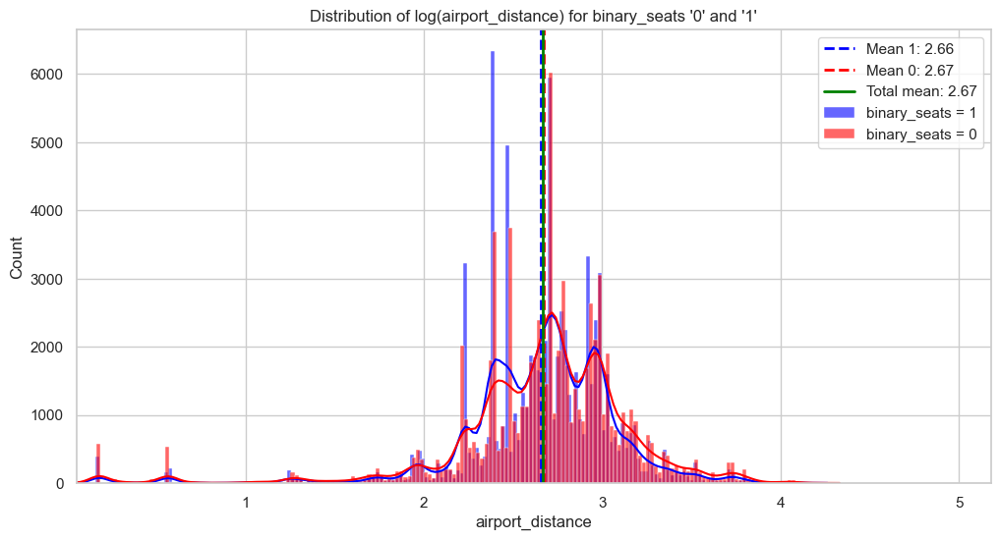

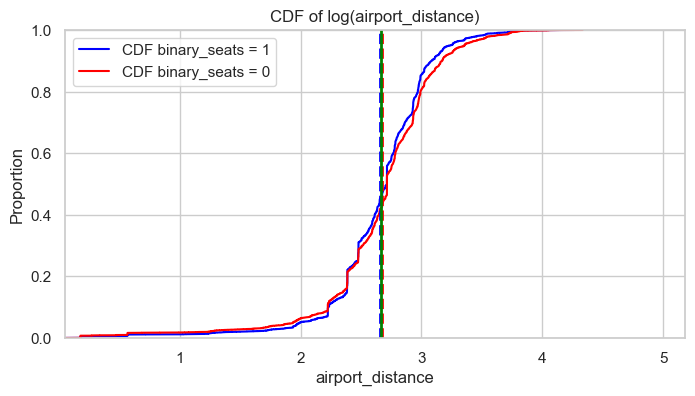

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/1832133660.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


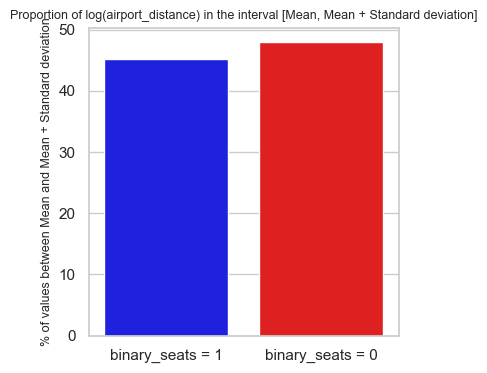

89923 79359
79359 79359
airport_density (Log Transformed)

Mean (1) : 0.00, Mean (0) : 0.01, Total Mean : 0.01
Standard Deviation (1) : 0.06, Standard Deviation (0) : 0.07
0.00% of '1' are between the mean and the standard deviation
0.00% of '0' are between the mean and the standard deviation



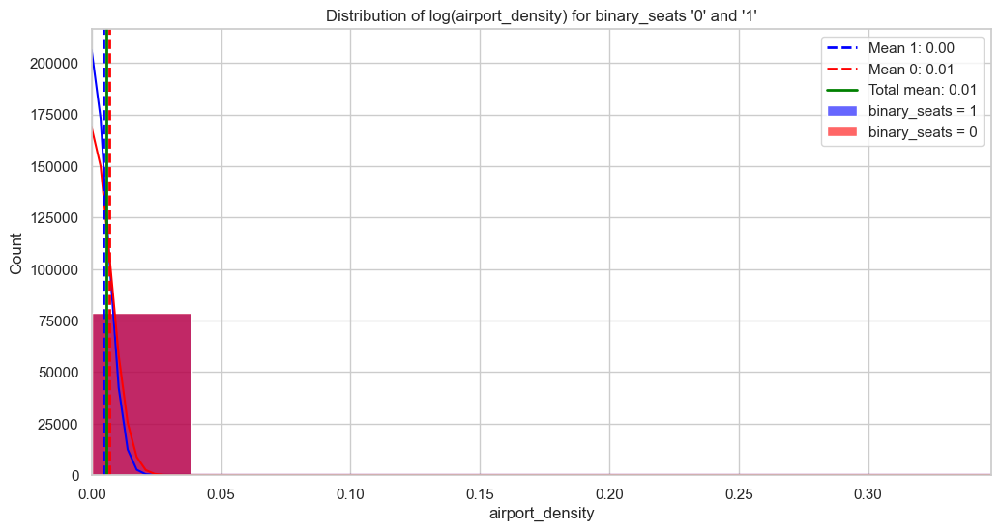

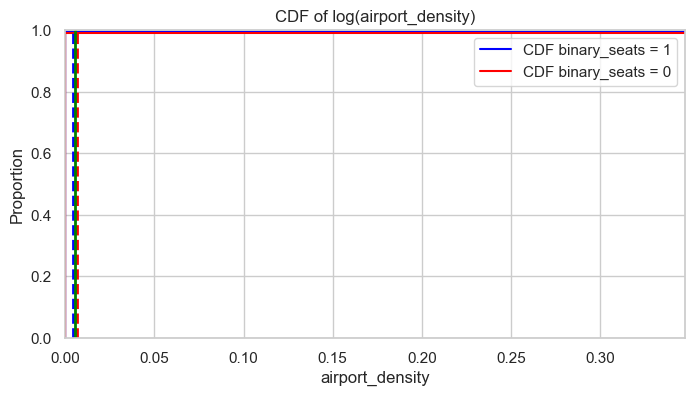

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/1832133660.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


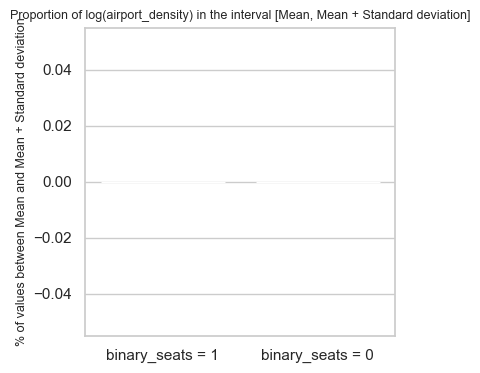

89923 79359
79359 79359
trainstation_distance (Log Transformed)

Mean (1) : 0.71, Mean (0) : 0.71, Total Mean : 0.71
Standard Deviation (1) : 0.44, Standard Deviation (0) : 0.46
39.20% of '1' are between the mean and the standard deviation
35.92% of '0' are between the mean and the standard deviation



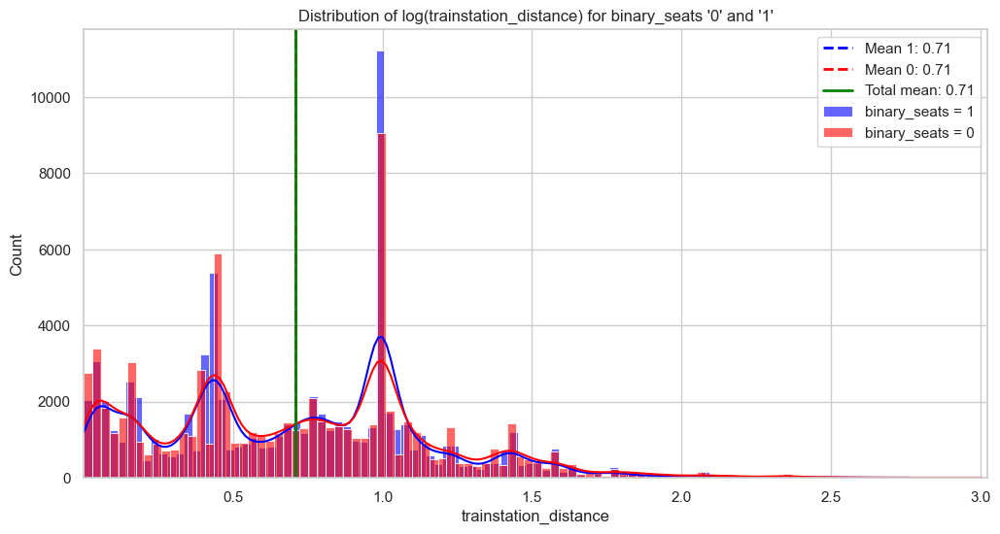

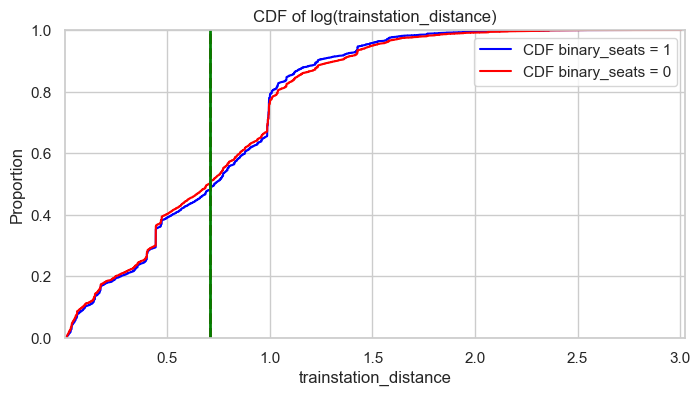

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/1832133660.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


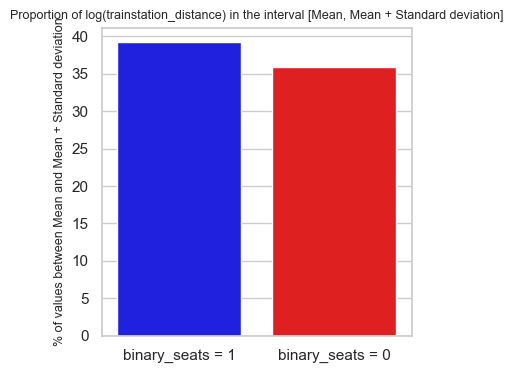

89923 79359
79359 79359
electric_distance (Log Transformed)

Mean (1) : 0.34, Mean (0) : 0.37, Total Mean : 0.35
Standard Deviation (1) : 0.29, Standard Deviation (0) : 0.33
26.99% of '1' are between the mean and the standard deviation
23.89% of '0' are between the mean and the standard deviation



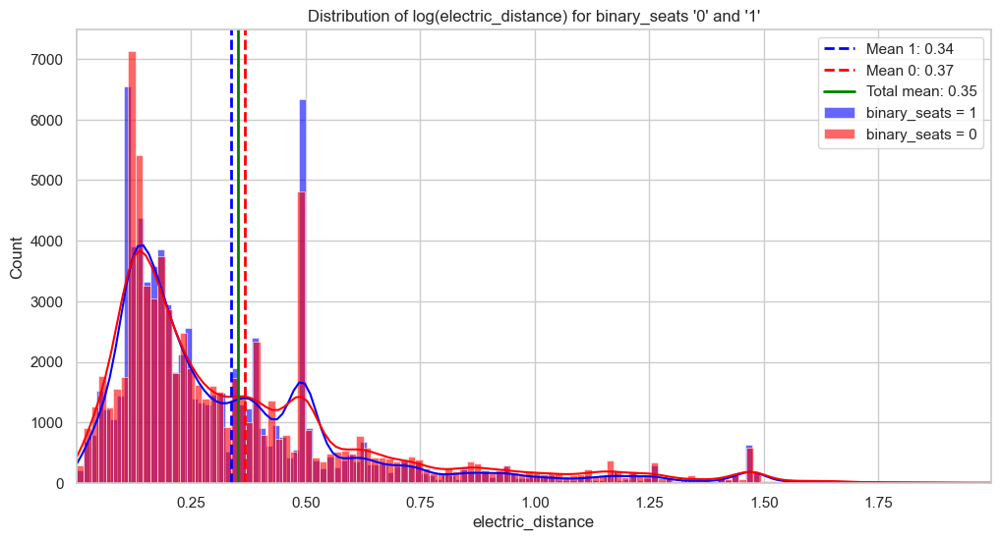

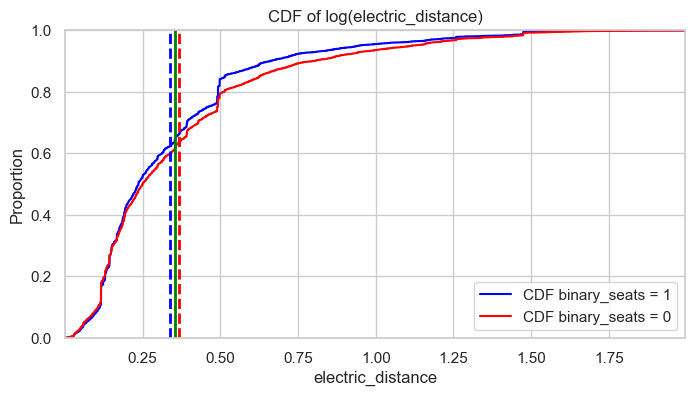

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/1832133660.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


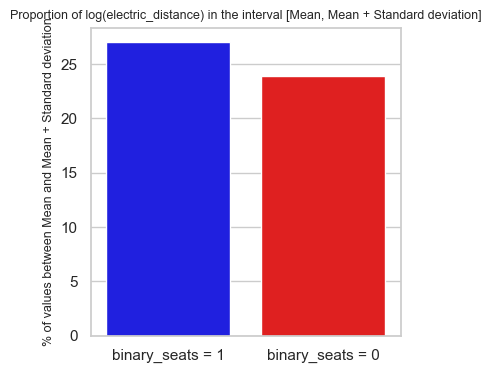

89923 79359
79359 79359
electric_density (Log Transformed)

Mean (1) : 1.67, Mean (0) : 1.53, Total Mean : 1.59
Standard Deviation (1) : 0.83, Standard Deviation (0) : 0.88
55.47% of '1' are between the mean and the standard deviation
39.99% of '0' are between the mean and the standard deviation



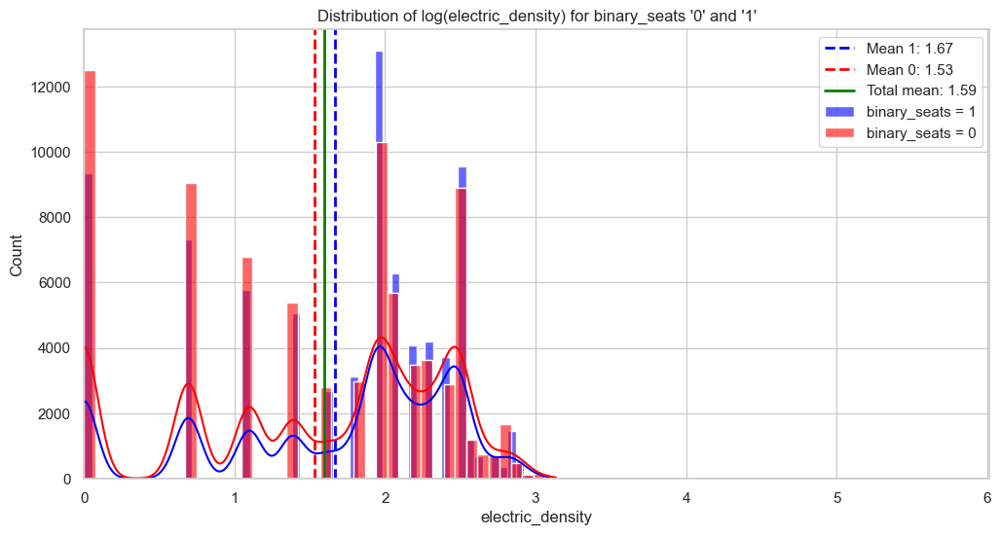

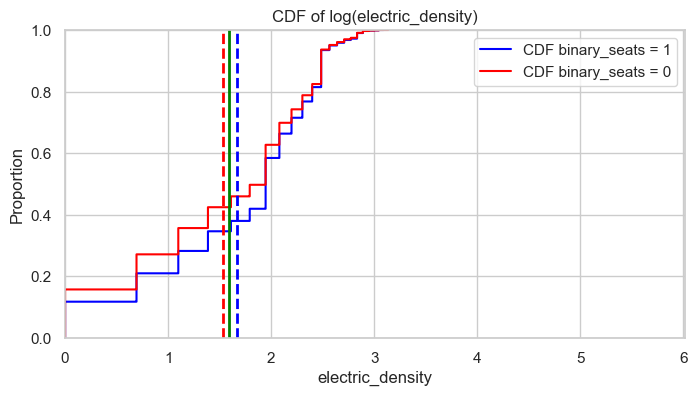

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/1832133660.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


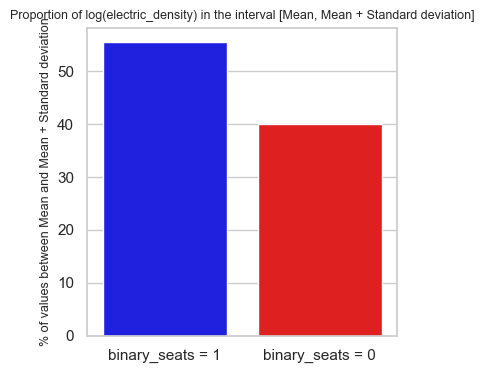

89923 79359
79359 79359
bicycle_parking_distance (Log Transformed)

Mean (1) : 0.10, Mean (0) : 0.13, Total Mean : 0.12
Standard Deviation (1) : 0.16, Standard Deviation (0) : 0.21
14.29% of '1' are between the mean and the standard deviation
12.88% of '0' are between the mean and the standard deviation



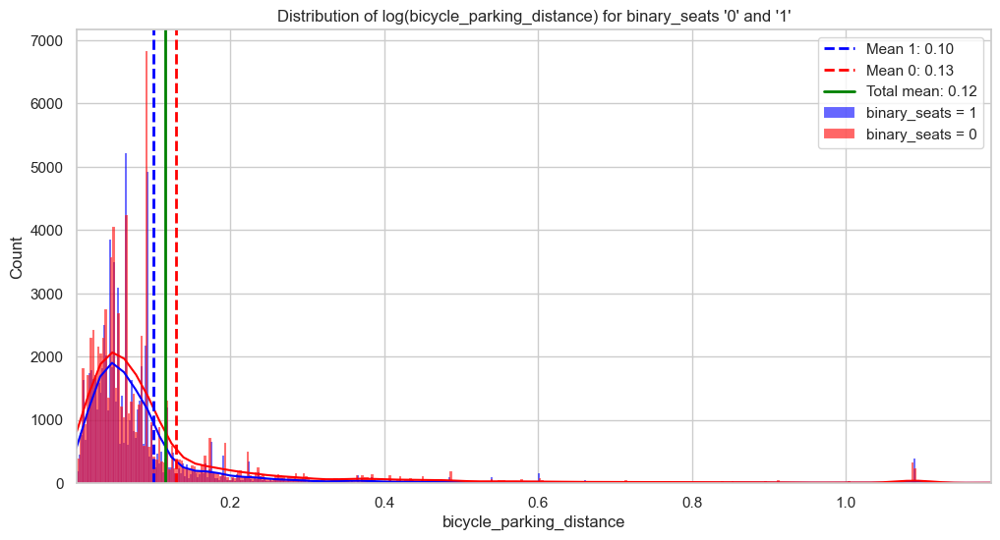

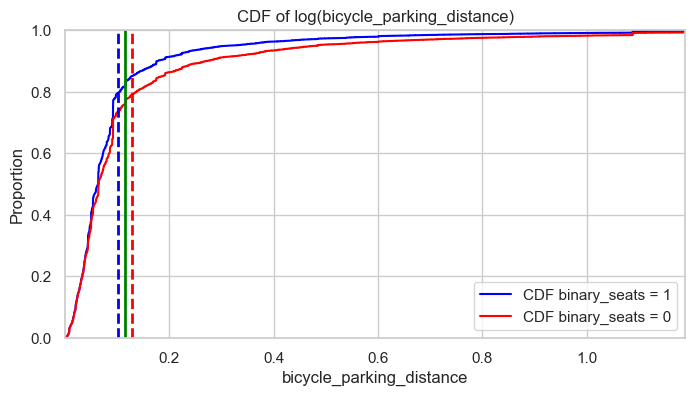

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/1832133660.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


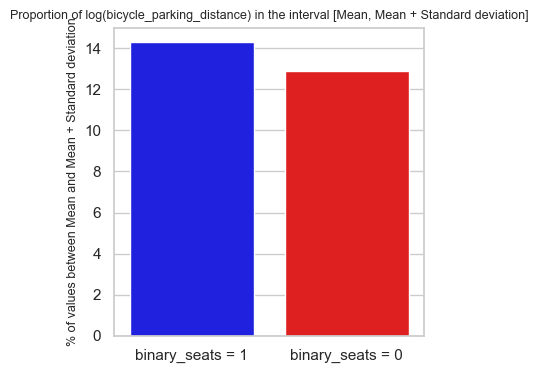

89923 79359
79359 79359
bicycle_parking_density (Log Transformed)

Mean (1) : 4.40, Mean (0) : 4.07, Total Mean : 4.22
Standard Deviation (1) : 1.39, Standard Deviation (0) : 1.61
53.87% of '1' are between the mean and the standard deviation
47.89% of '0' are between the mean and the standard deviation



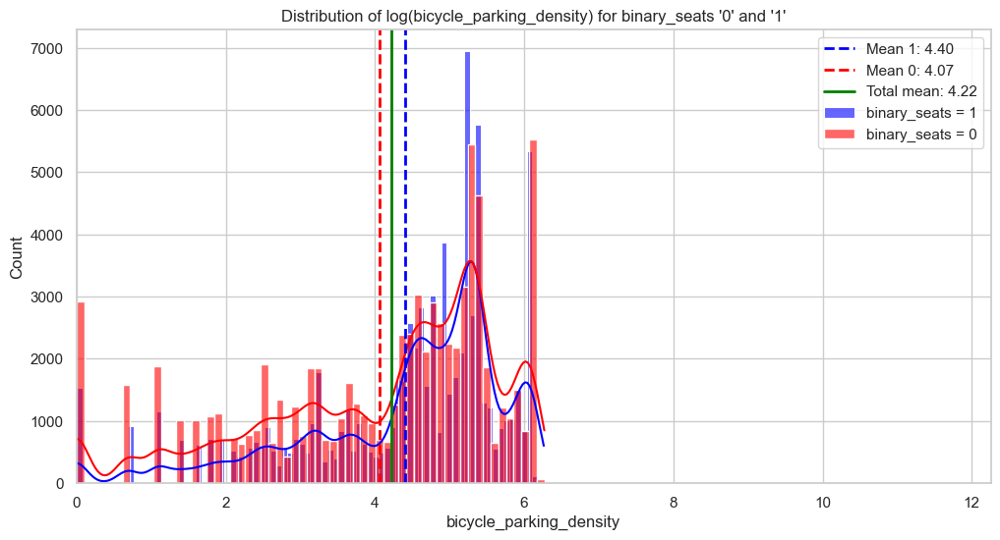

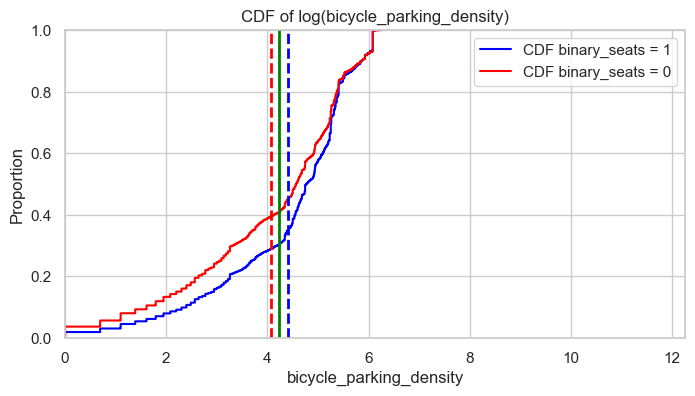

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/1832133660.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


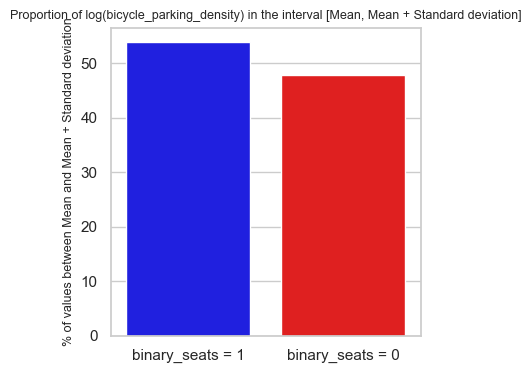

89923 79359
79359 79359
tram_stop_distance (Log Transformed)

Mean (1) : 0.78, Mean (0) : 0.93, Total Mean : 0.86
Standard Deviation (1) : 0.71, Standard Deviation (0) : 0.78
23.96% of '1' are between the mean and the standard deviation
30.79% of '0' are between the mean and the standard deviation



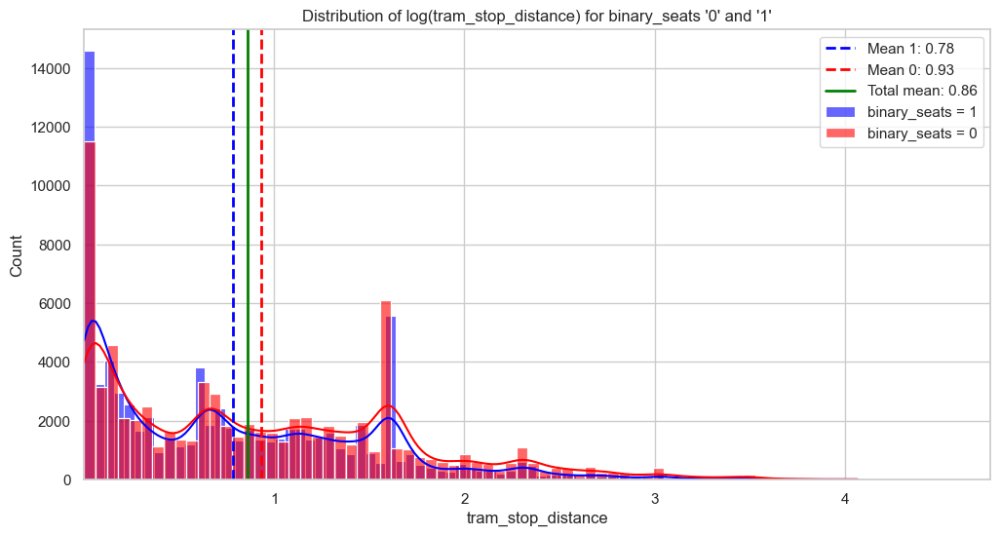

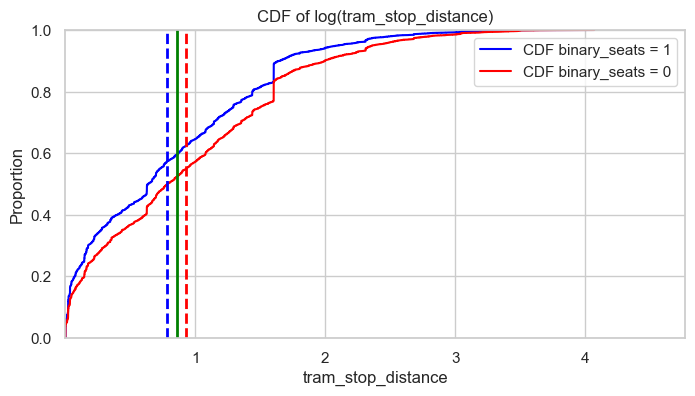

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/1832133660.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


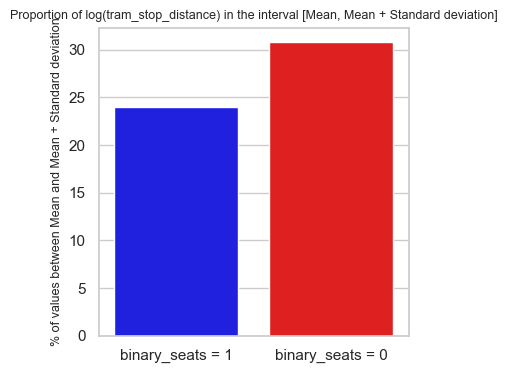

89923 79359
79359 79359
tram_stop_density (Log Transformed)

Mean (1) : 0.88, Mean (0) : 0.74, Total Mean : 0.81
Standard Deviation (1) : 0.98, Standard Deviation (0) : 0.94
13.54% of '1' are between the mean and the standard deviation
13.22% of '0' are between the mean and the standard deviation



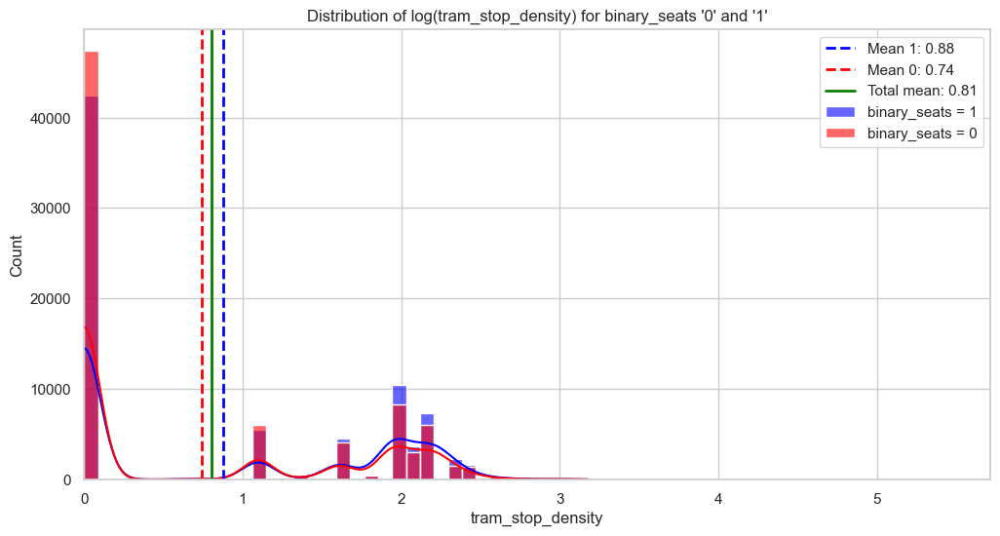

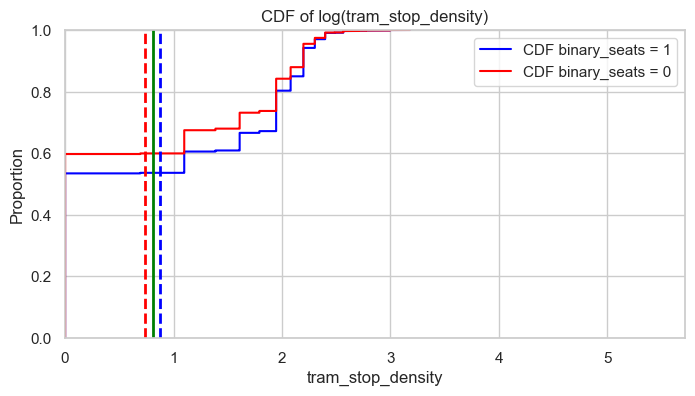

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/1832133660.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


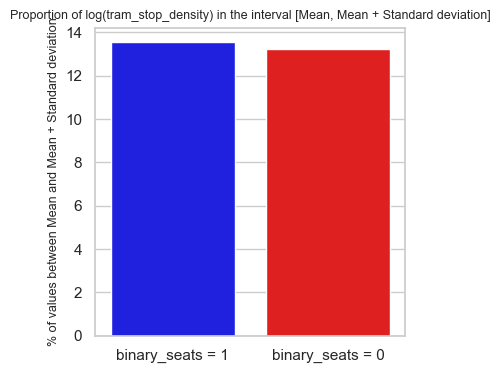

89923 79359
79359 79359
subway_entrance_distance (Log Transformed)

Mean (1) : 0.59, Mean (0) : 0.77, Total Mean : 0.69
Standard Deviation (1) : 0.88, Standard Deviation (0) : 0.98
12.53% of '1' are between the mean and the standard deviation
14.23% of '0' are between the mean and the standard deviation



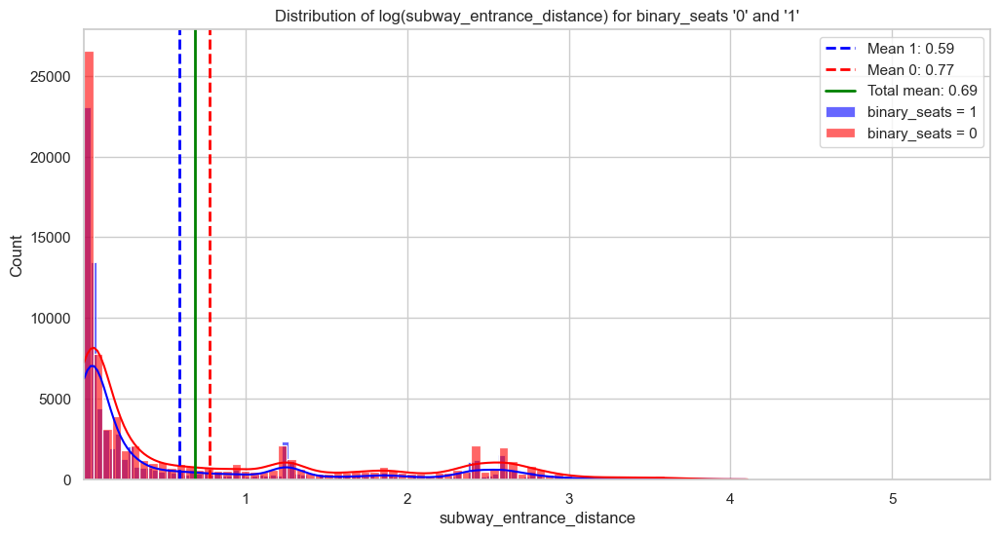

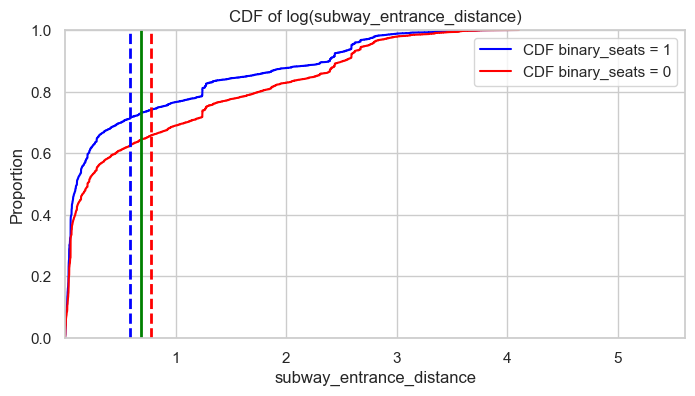

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/1832133660.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


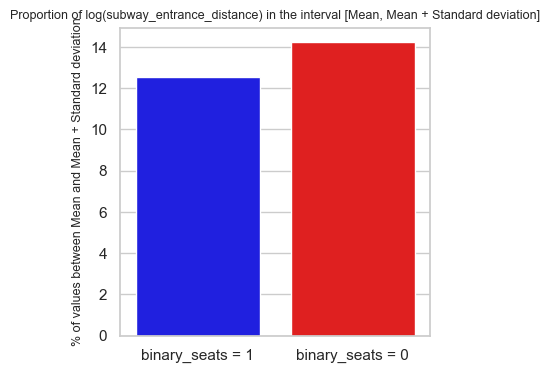

89923 79359
79359 79359
subway_entrance_density (Log Transformed)

Mean (1) : 1.98, Mean (0) : 1.71, Total Mean : 1.84
Standard Deviation (1) : 1.43, Standard Deviation (0) : 1.49
43.31% of '1' are between the mean and the standard deviation
29.03% of '0' are between the mean and the standard deviation



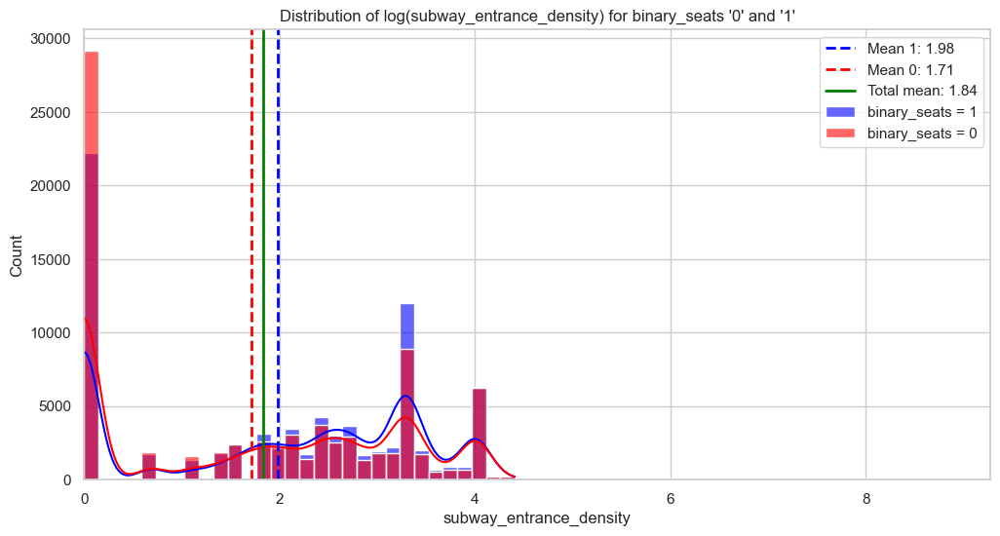

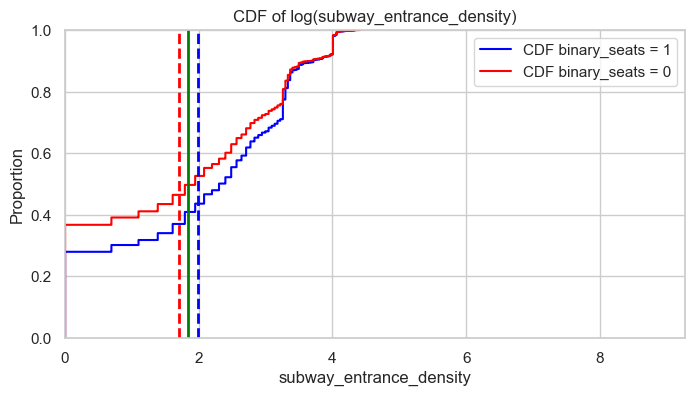

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/1832133660.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


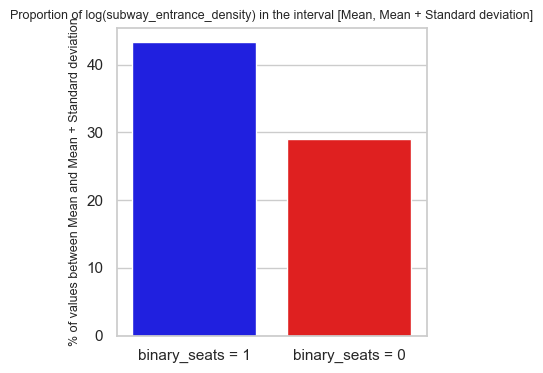

89923 79359
79359 79359
bus_stop_distance (Log Transformed)

Mean (1) : 0.07, Mean (0) : 0.08, Total Mean : 0.07
Standard Deviation (1) : 0.06, Standard Deviation (0) : 0.07
28.89% of '1' are between the mean and the standard deviation
29.13% of '0' are between the mean and the standard deviation



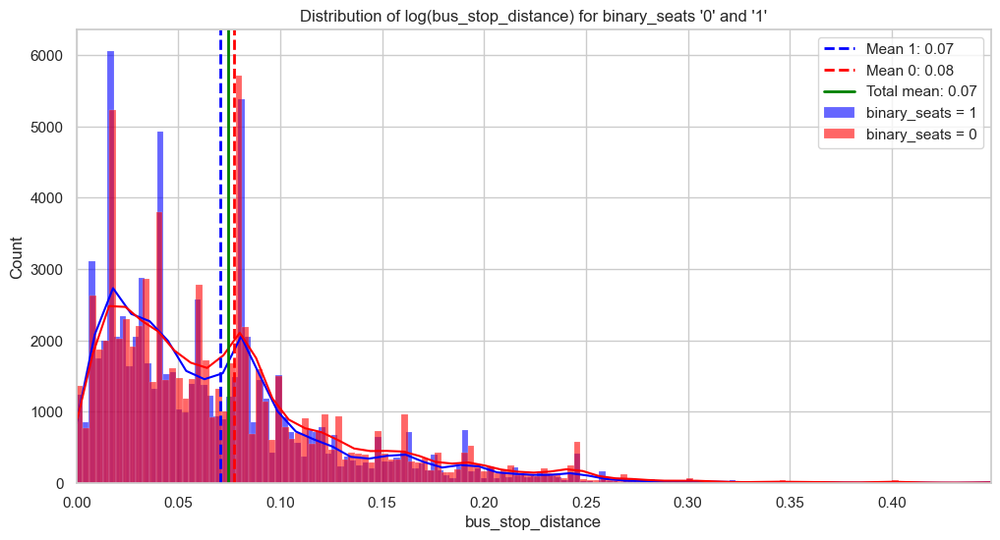

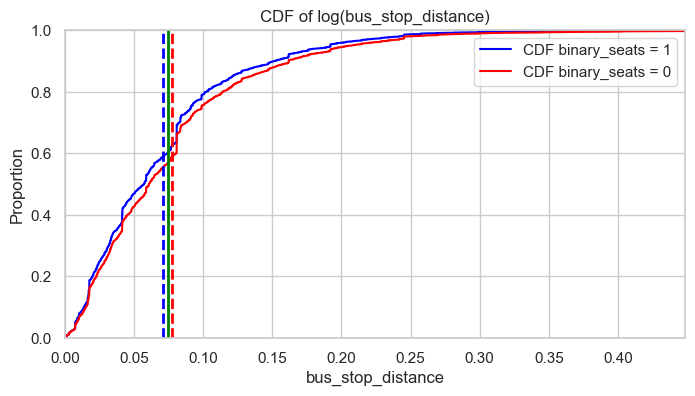

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/1832133660.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


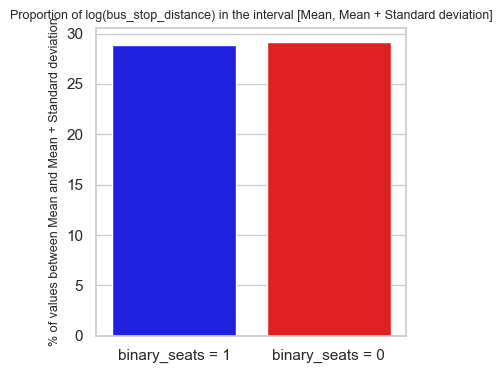

89923 79359
79359 79359
bus_stop_density (Log Transformed)

Mean (1) : 3.93, Mean (0) : 3.85, Total Mean : 3.89
Standard Deviation (1) : 0.43, Standard Deviation (0) : 0.51
50.04% of '1' are between the mean and the standard deviation
48.92% of '0' are between the mean and the standard deviation



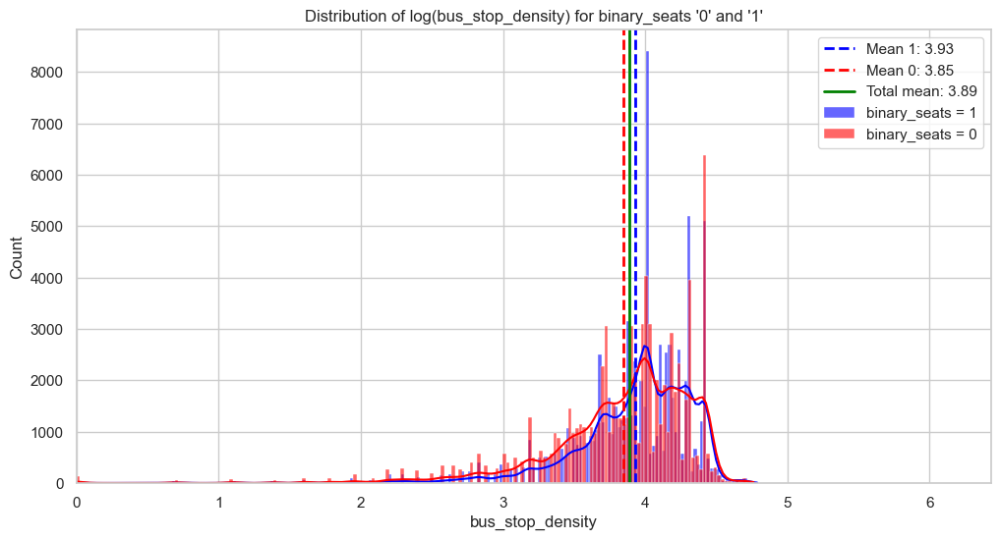

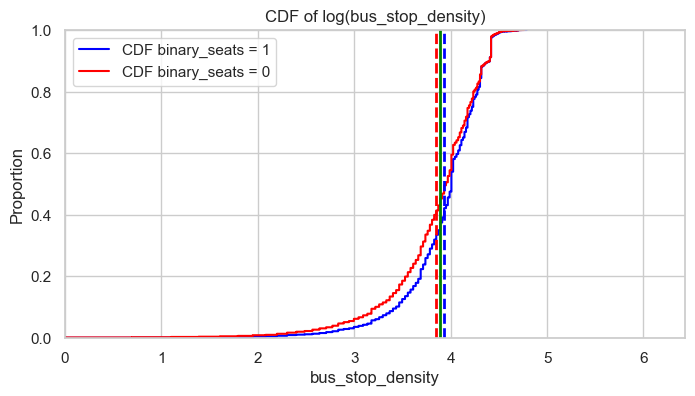

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/1832133660.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


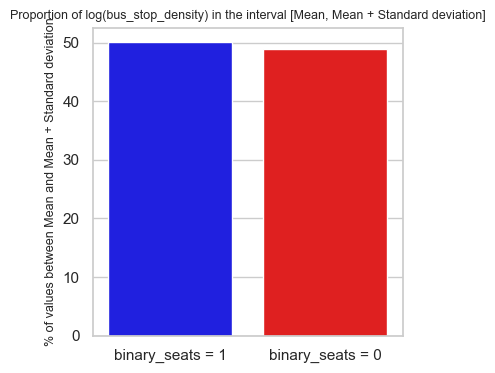

89923 79359
79359 79359
bicycle_rental_distance (Log Transformed)

Mean (1) : 0.43, Mean (0) : 0.58, Total Mean : 0.51
Standard Deviation (1) : 0.67, Standard Deviation (0) : 0.78
8.40% of '1' are between the mean and the standard deviation
13.16% of '0' are between the mean and the standard deviation



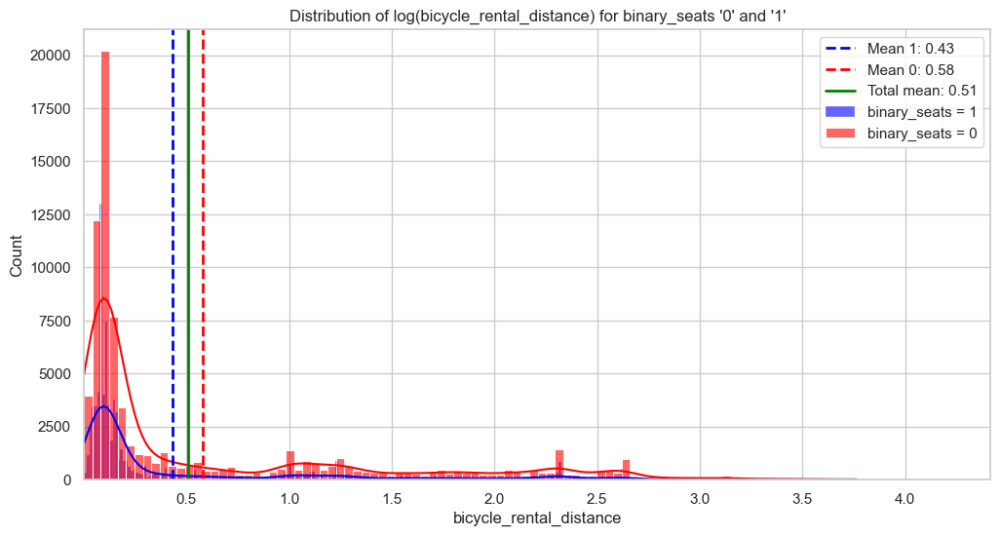

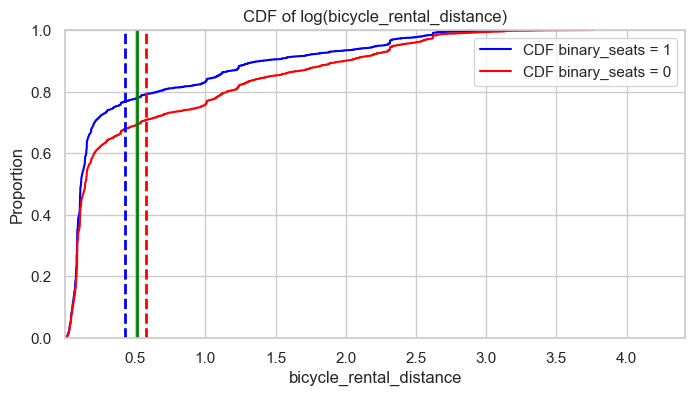

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/1832133660.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


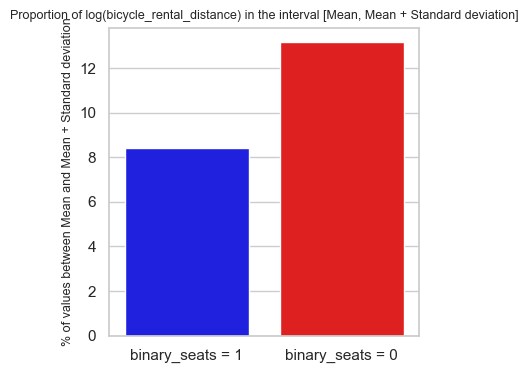

89923 79359
79359 79359
bicycle_rental_density (Log Transformed)

Mean (1) : 2.07, Mean (0) : 1.80, Total Mean : 1.92
Standard Deviation (1) : 1.28, Standard Deviation (0) : 1.37
51.83% of '1' are between the mean and the standard deviation
38.79% of '0' are between the mean and the standard deviation



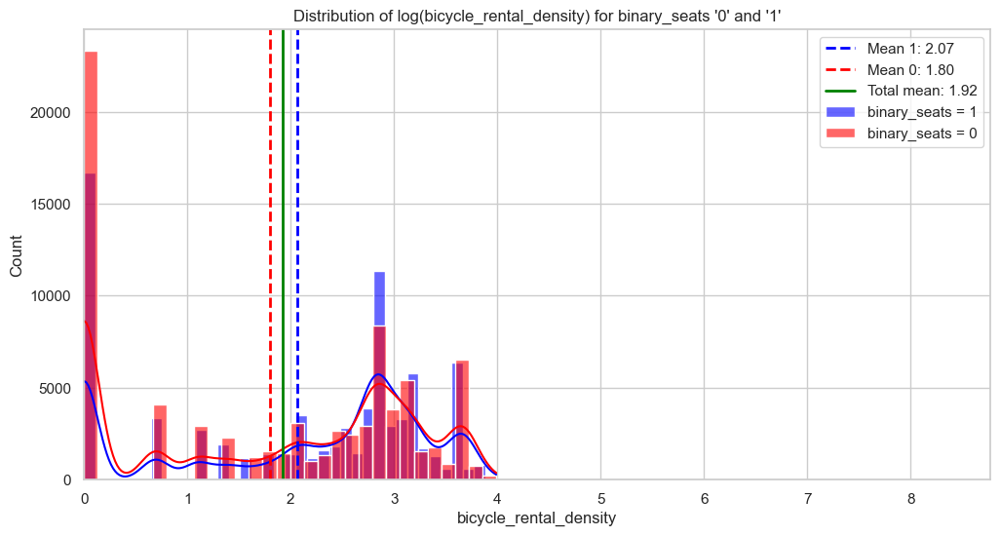

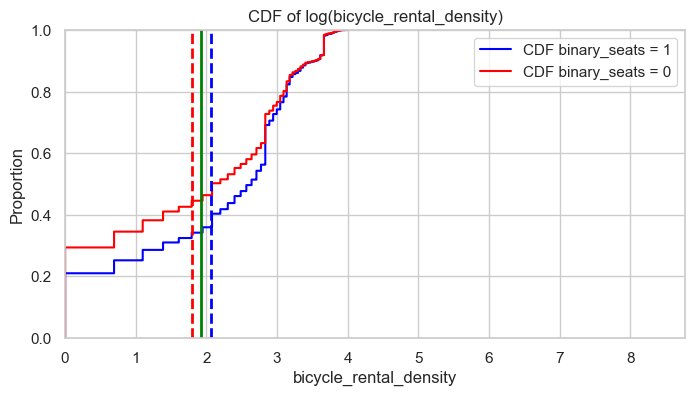

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/1832133660.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


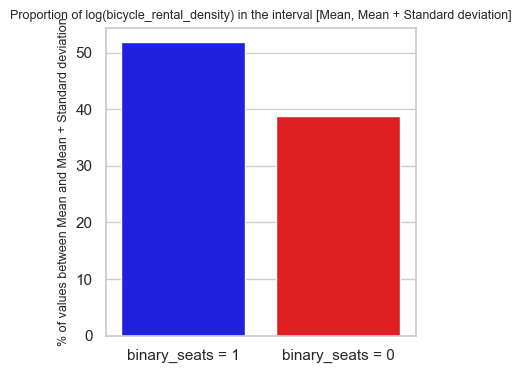

89923 79359
79359 79359
fuel_distance (Log Transformed)

Mean (1) : 0.55, Mean (0) : 0.59, Total Mean : 0.58
Standard Deviation (1) : 0.30, Standard Deviation (0) : 0.33
40.12% of '1' are between the mean and the standard deviation
35.75% of '0' are between the mean and the standard deviation



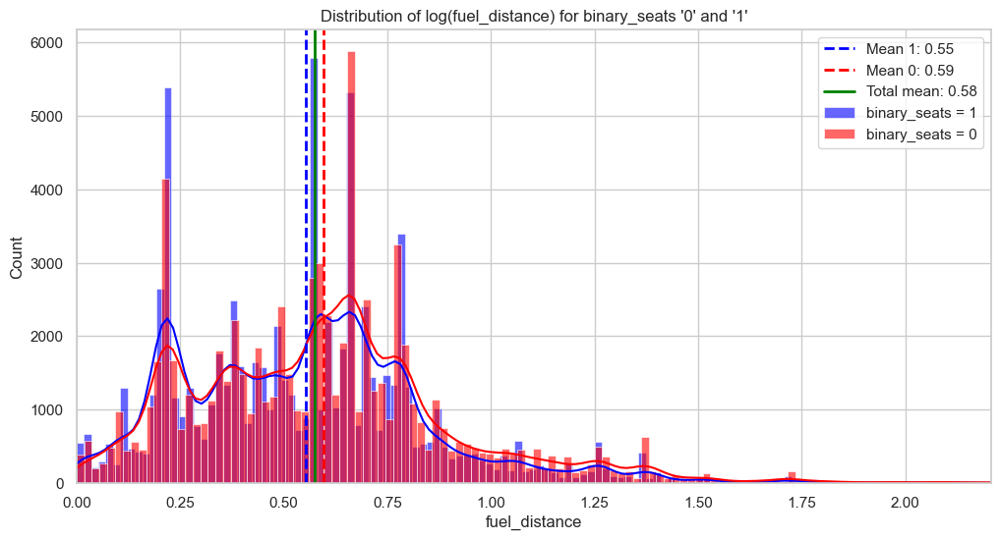

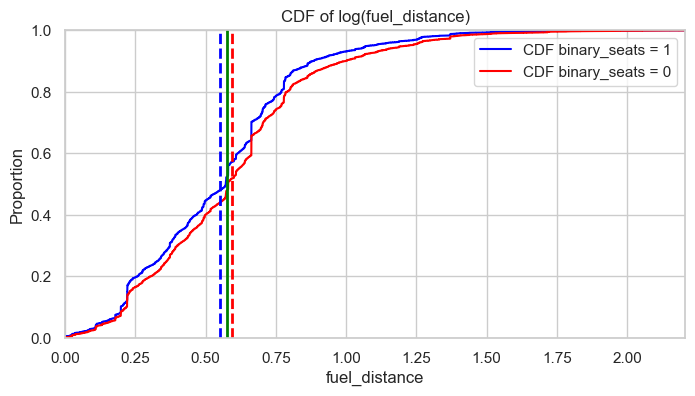

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/1832133660.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


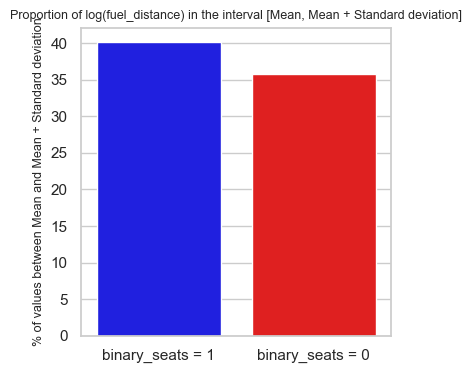

89923 79359
79359 79359
fuel_density (Log Transformed)

Mean (1) : 0.60, Mean (0) : 0.53, Total Mean : 0.56
Standard Deviation (1) : 0.57, Standard Deviation (0) : 0.56
48.44% of '1' are between the mean and the standard deviation
24.80% of '0' are between the mean and the standard deviation



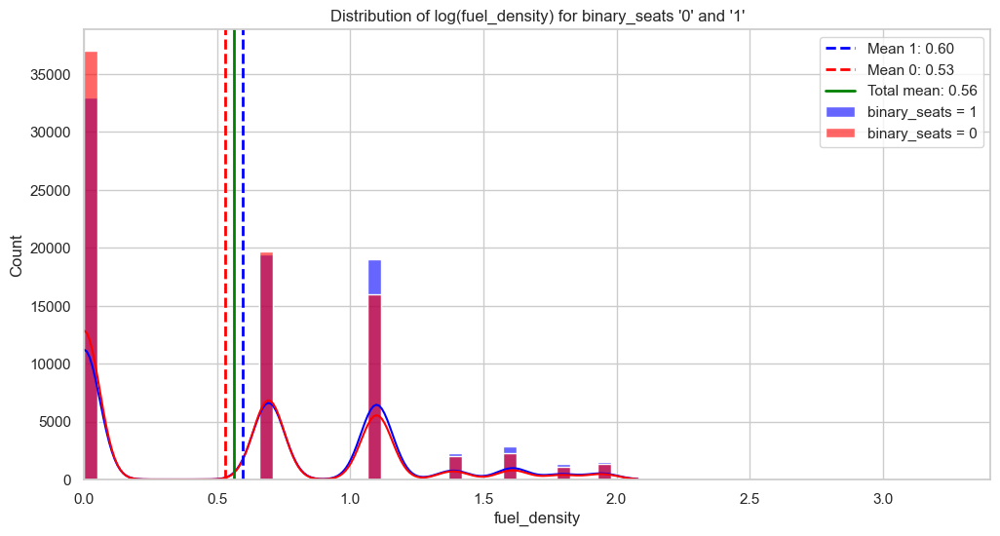

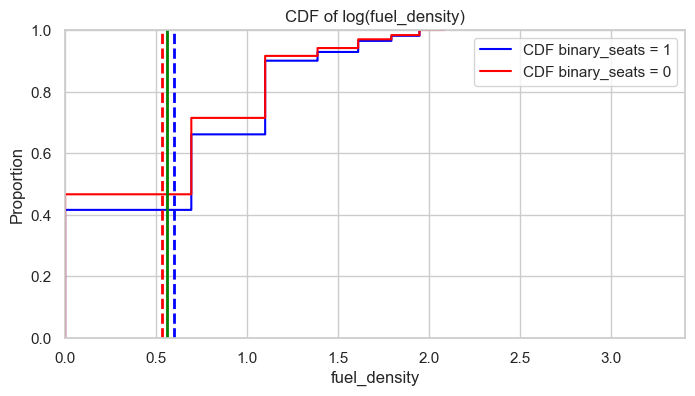

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/1832133660.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


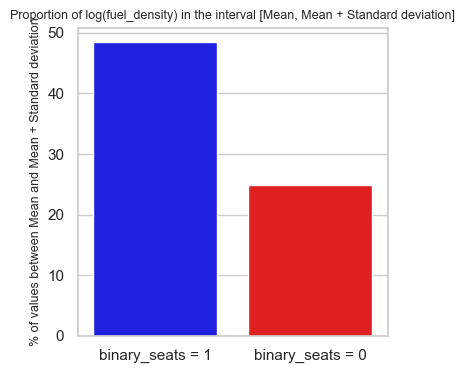

89923 79359
79359 79359
dens_pop (Log Transformed)

Mean (1) : 4.73, Mean (0) : 4.52, Total Mean : 4.62
Standard Deviation (1) : 0.95, Standard Deviation (0) : 1.06
45.61% of '1' are between the mean and the standard deviation
38.07% of '0' are between the mean and the standard deviation



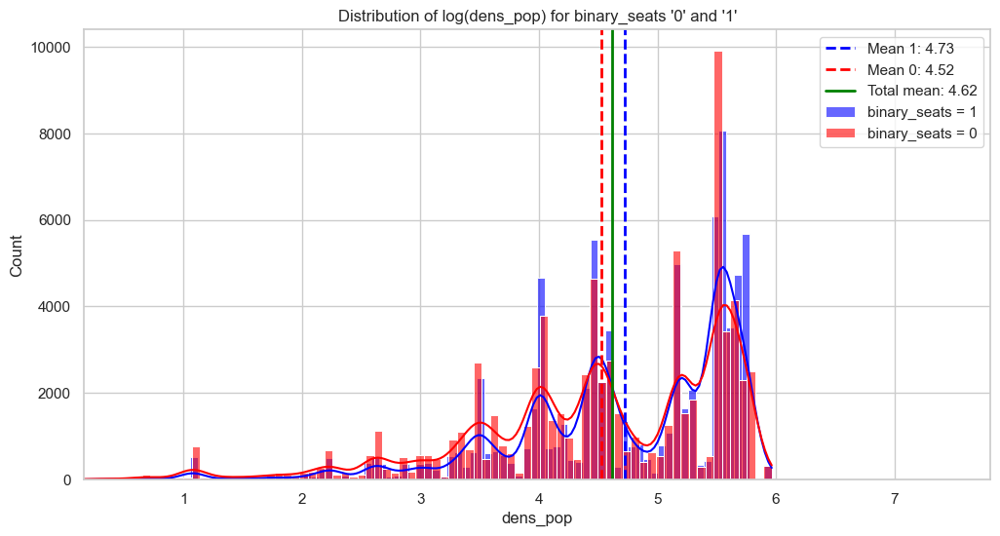

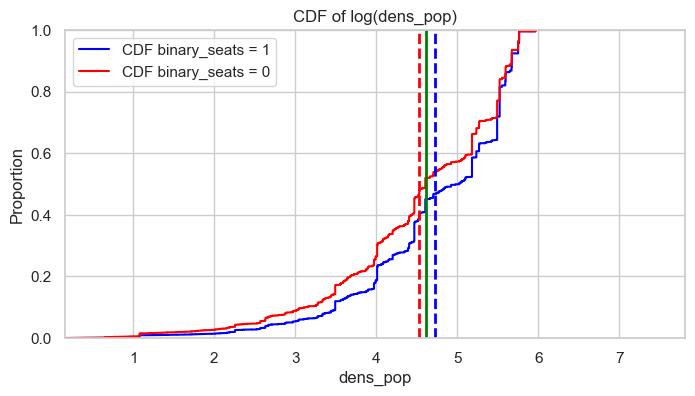

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/1832133660.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


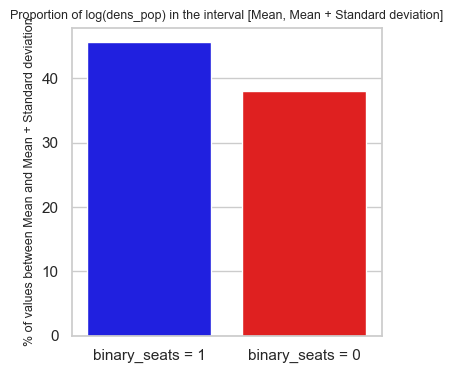

89923 79359
79359 79359
departure_time_hour (Log Transformed)

Mean (1) : 2.64, Mean (0) : 2.60, Total Mean : 2.62
Standard Deviation (1) : 0.38, Standard Deviation (0) : 0.41
46.69% of '1' are between the mean and the standard deviation
47.17% of '0' are between the mean and the standard deviation



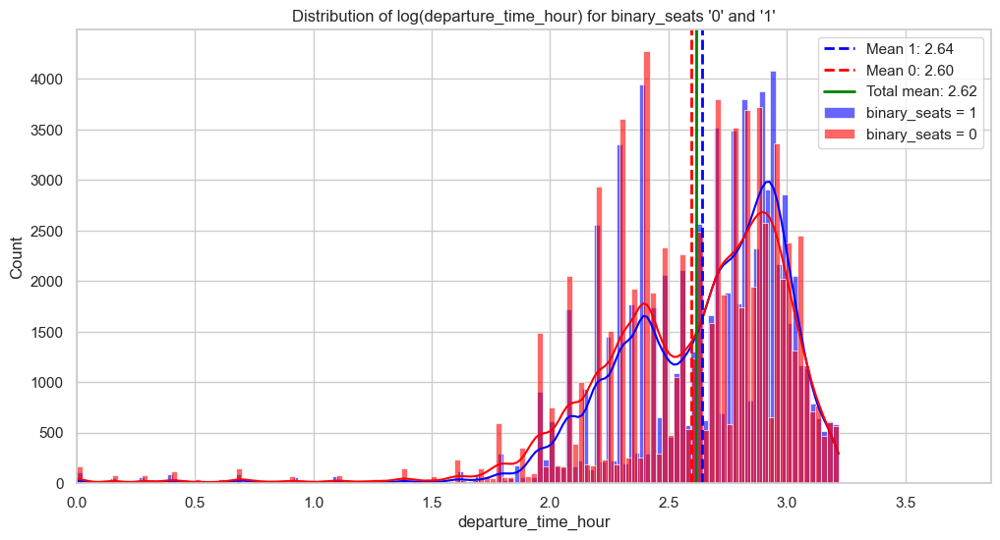

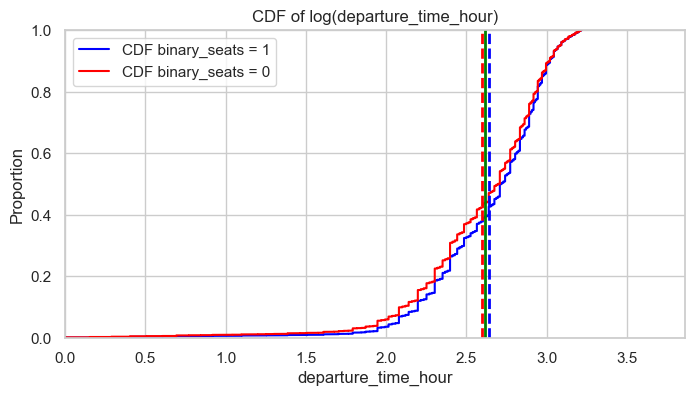

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/1832133660.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


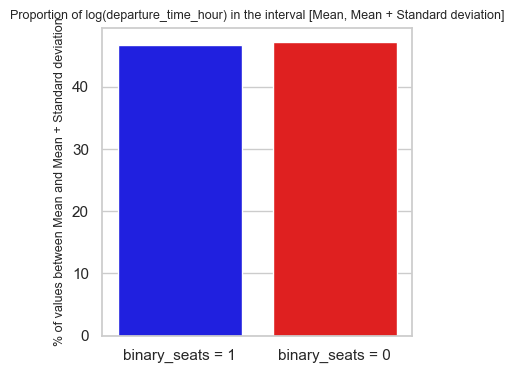

89923 79359
79359 79359
Hors unité urbaine (Log Transformed)

Mean (1) : 0.00, Mean (0) : 0.00, Total Mean : 0.00
Standard Deviation (1) : 0.03, Standard Deviation (0) : 0.04
0.00% of '1' are between the mean and the standard deviation
0.00% of '0' are between the mean and the standard deviation



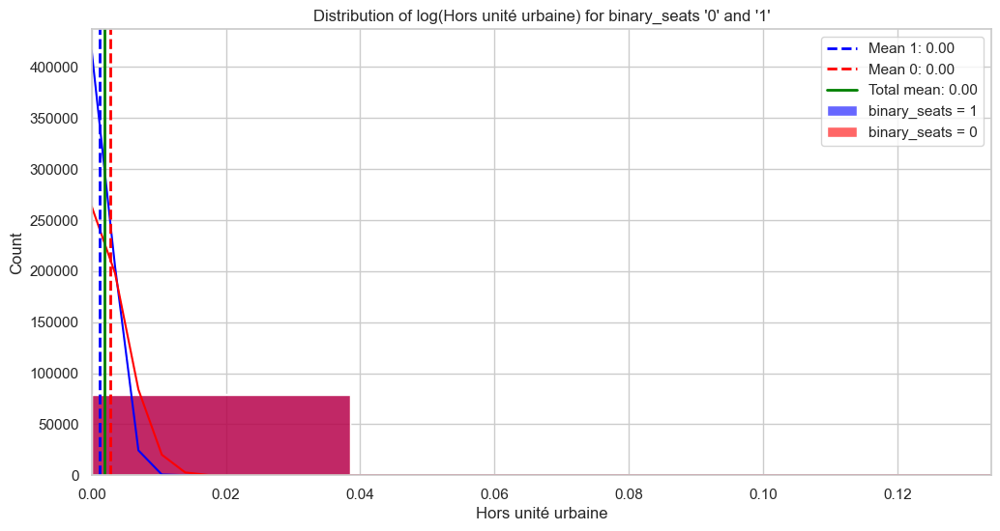

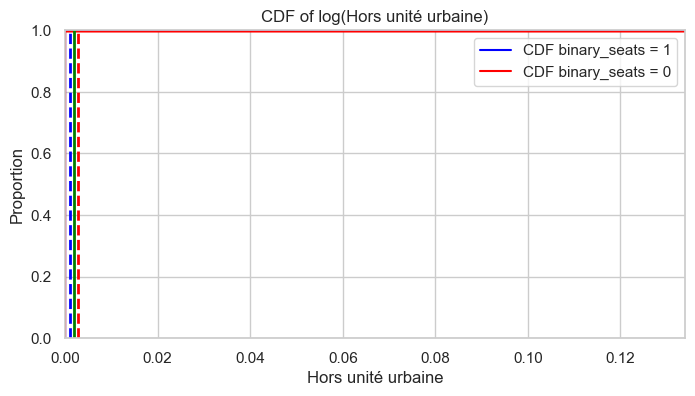

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/1832133660.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


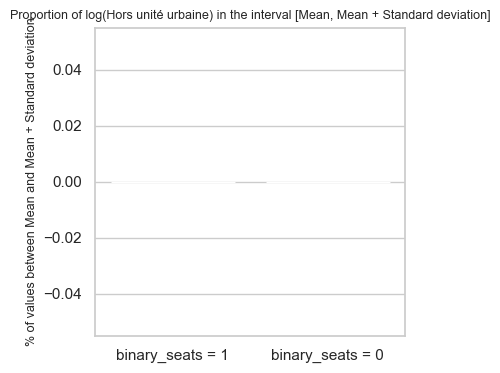

In [21]:
#my_values = ['airport_distance', 'airport_density', 'trainstation_distance', 'trainstation_density', 'electric_distance', 'electric_density', 'bicycle_parking_distance', 'bicycle_parking_density', 'tram_stop_distance', 'tram_stop_density', 'subway_entrance_distance','subway_entrance_density', 'bus_stop_distance' ,'bus_stop_density','bicycle_rental_distance','bicycle_rental_density','fuel_distance', 'fuel_density', 'dens_pop', 'departure_time_hour','Banlieue','Centre']
#my_weight =[4,1.5,3,3,2,3,1.5,3,2,3,1.5,3,3,3,1.5,3,3,4,3.5,3.5,4,4]
my_weight =[5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,3,3,3,3]
 
for i in range(0,len(my_values)):
    my_statistics3(my_values[i],my_weight[i])

89923 79359
79359 79359
airport_distance (Log Transformed)

Mean (1) : 2.66, Mean (0) : 2.67, Total Mean : 2.67
Standard Deviation (1) : 0.44, Standard Deviation (0) : 0.50
45.15% of '1' are between the mean and the standard deviation
47.91% of '0' are between the mean and the standard deviation



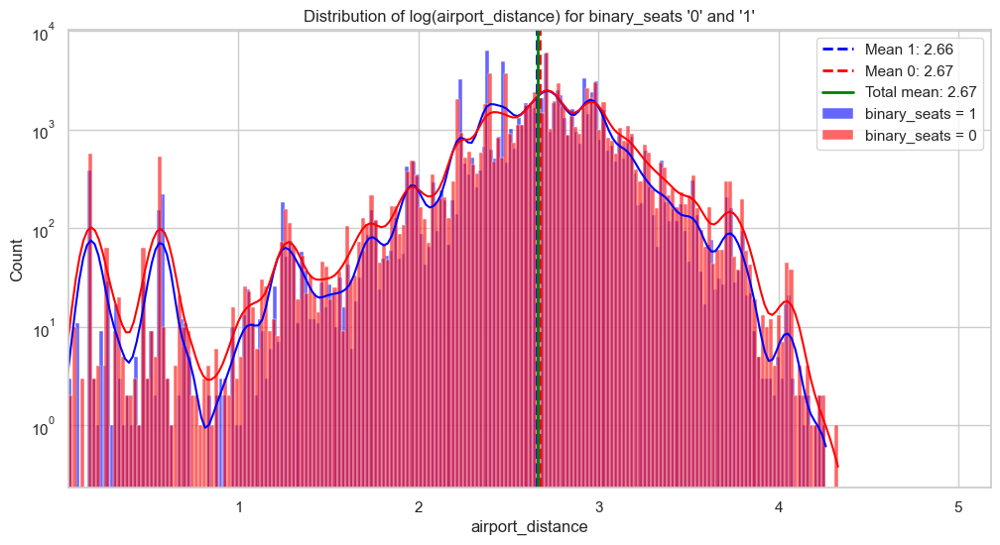

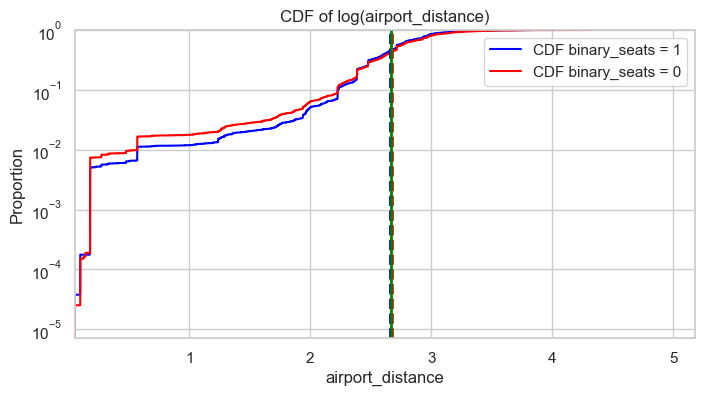

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/477769048.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


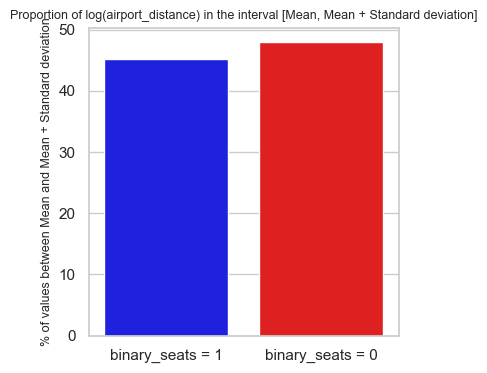

89923 79359
79359 79359
airport_density (Log Transformed)

Mean (1) : 0.00, Mean (0) : 0.01, Total Mean : 0.01
Standard Deviation (1) : 0.06, Standard Deviation (0) : 0.07
0.00% of '1' are between the mean and the standard deviation
0.00% of '0' are between the mean and the standard deviation



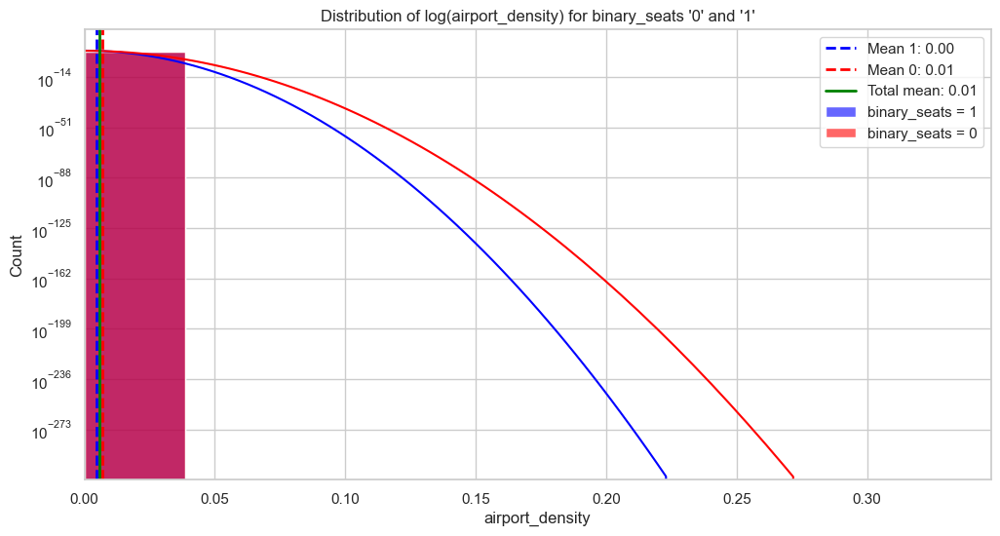

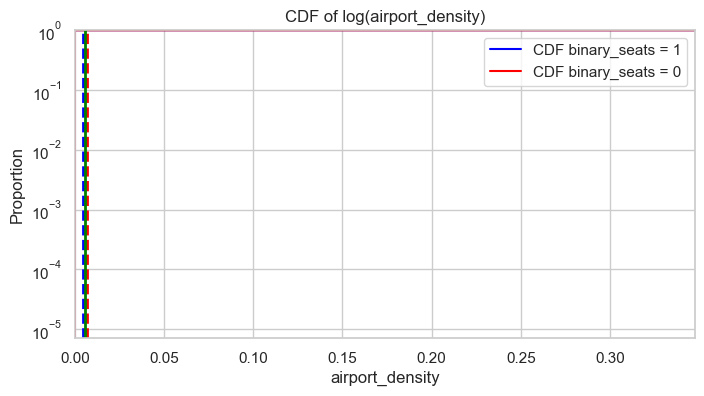

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/477769048.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


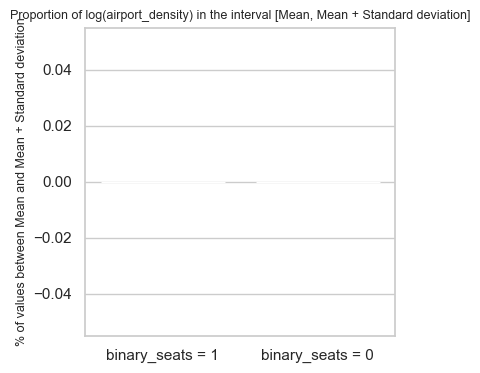

89923 79359
79359 79359
trainstation_distance (Log Transformed)

Mean (1) : 0.71, Mean (0) : 0.71, Total Mean : 0.71
Standard Deviation (1) : 0.44, Standard Deviation (0) : 0.46
39.20% of '1' are between the mean and the standard deviation
35.92% of '0' are between the mean and the standard deviation



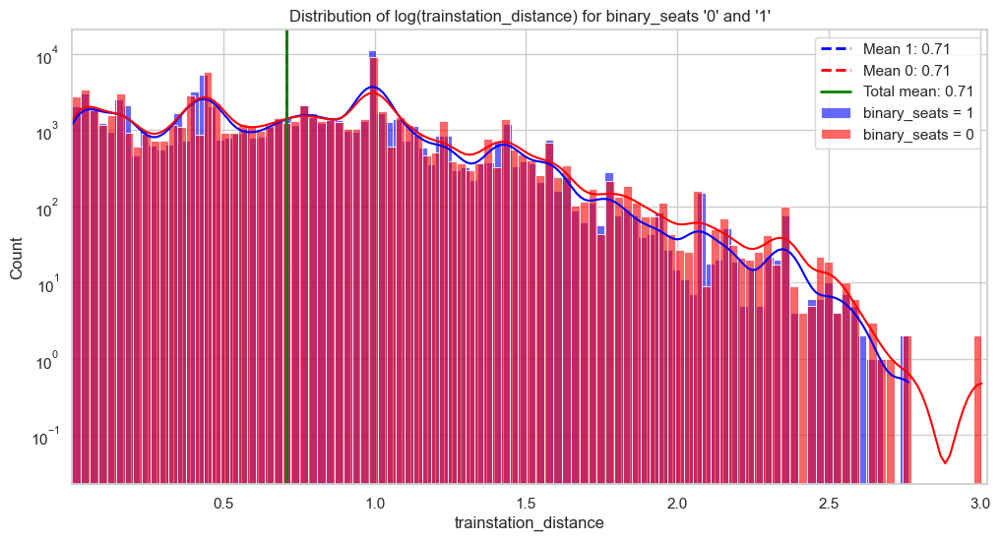

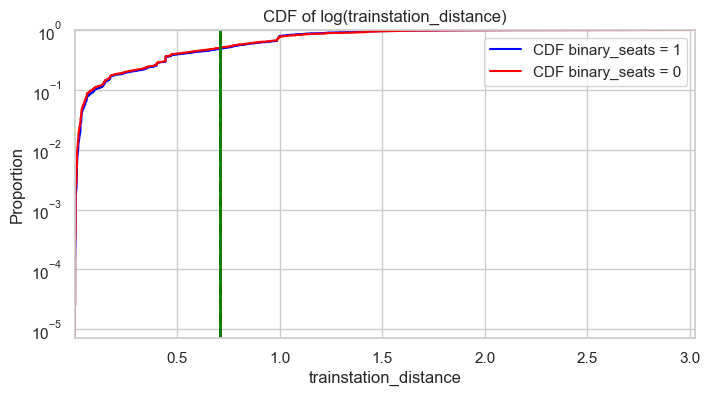

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/477769048.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


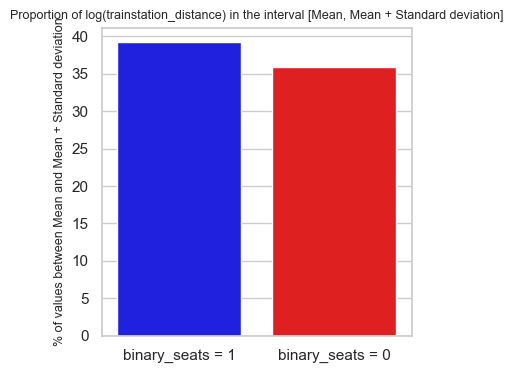

89923 79359
79359 79359
electric_distance (Log Transformed)

Mean (1) : 0.34, Mean (0) : 0.37, Total Mean : 0.35
Standard Deviation (1) : 0.29, Standard Deviation (0) : 0.33
26.99% of '1' are between the mean and the standard deviation
23.89% of '0' are between the mean and the standard deviation



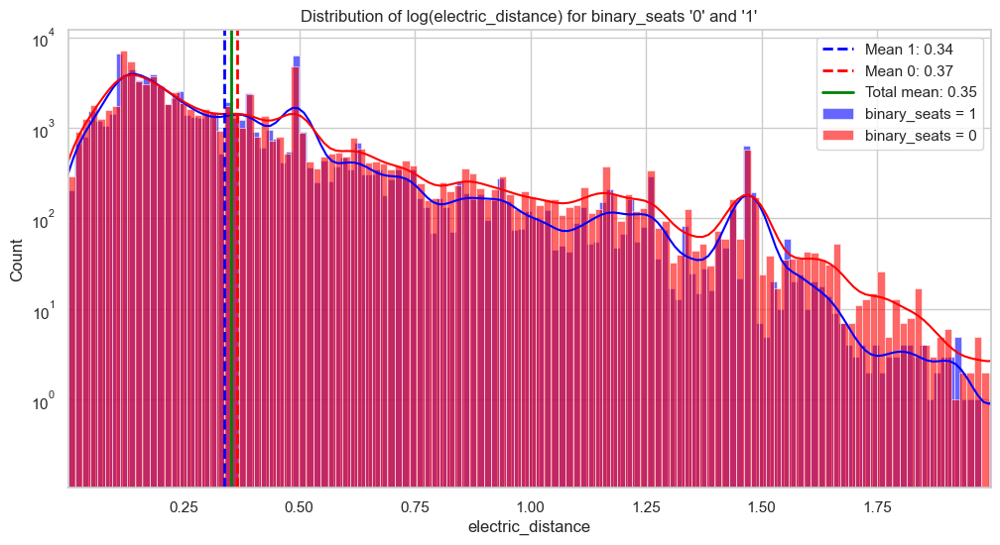

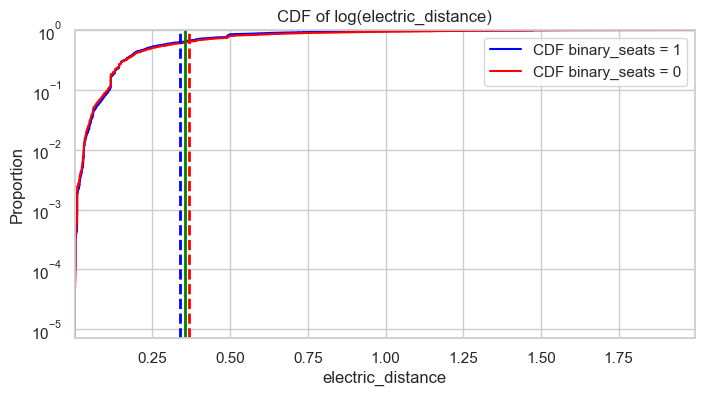

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/477769048.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


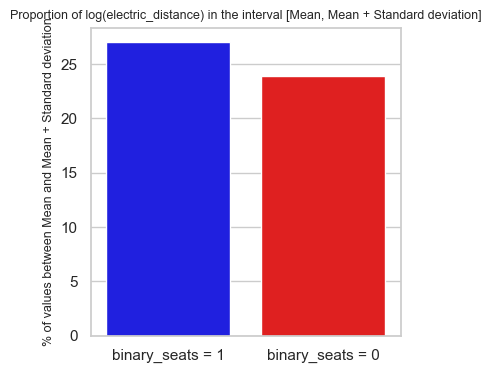

89923 79359
79359 79359
electric_density (Log Transformed)

Mean (1) : 1.67, Mean (0) : 1.53, Total Mean : 1.59
Standard Deviation (1) : 0.83, Standard Deviation (0) : 0.88
55.47% of '1' are between the mean and the standard deviation
39.99% of '0' are between the mean and the standard deviation



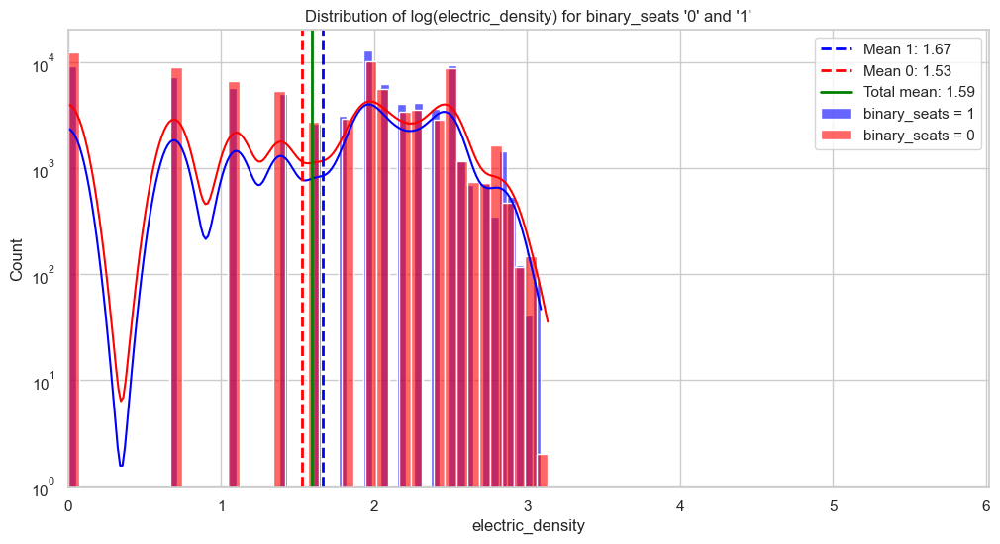

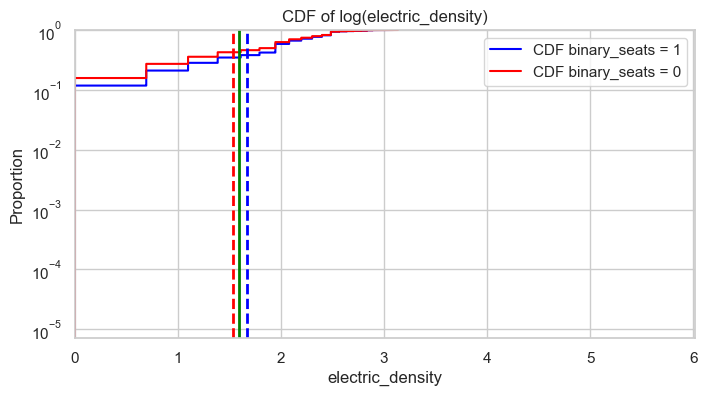

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/477769048.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


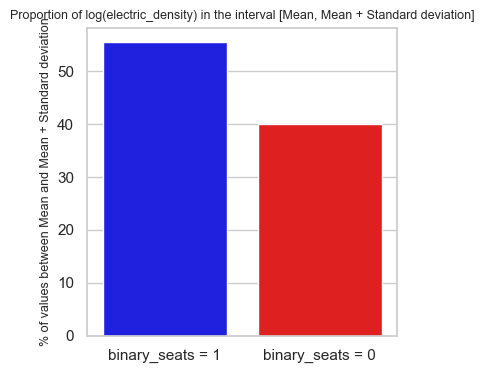

89923 79359
79359 79359
bicycle_parking_distance (Log Transformed)

Mean (1) : 0.10, Mean (0) : 0.13, Total Mean : 0.12
Standard Deviation (1) : 0.16, Standard Deviation (0) : 0.21
14.29% of '1' are between the mean and the standard deviation
12.88% of '0' are between the mean and the standard deviation



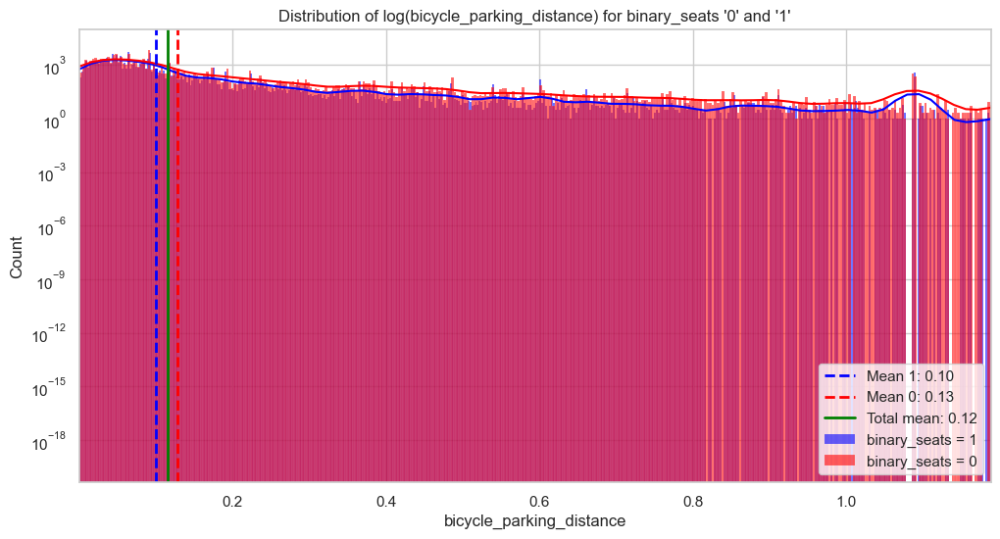

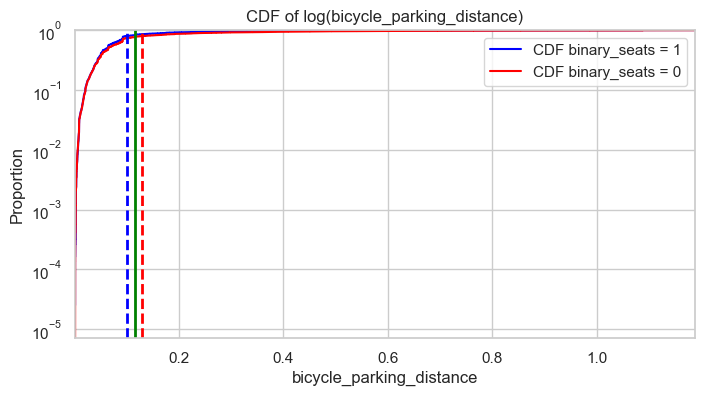

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/477769048.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


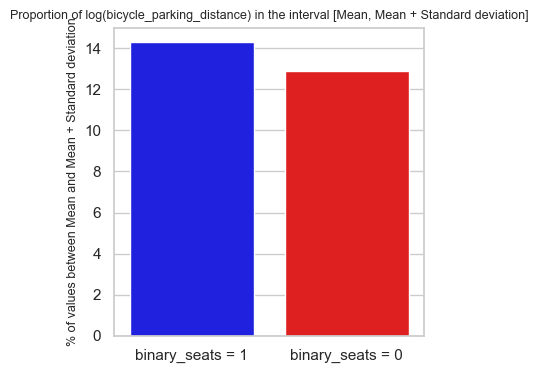

89923 79359
79359 79359
bicycle_parking_density (Log Transformed)

Mean (1) : 4.40, Mean (0) : 4.07, Total Mean : 4.22
Standard Deviation (1) : 1.39, Standard Deviation (0) : 1.61
53.87% of '1' are between the mean and the standard deviation
47.89% of '0' are between the mean and the standard deviation



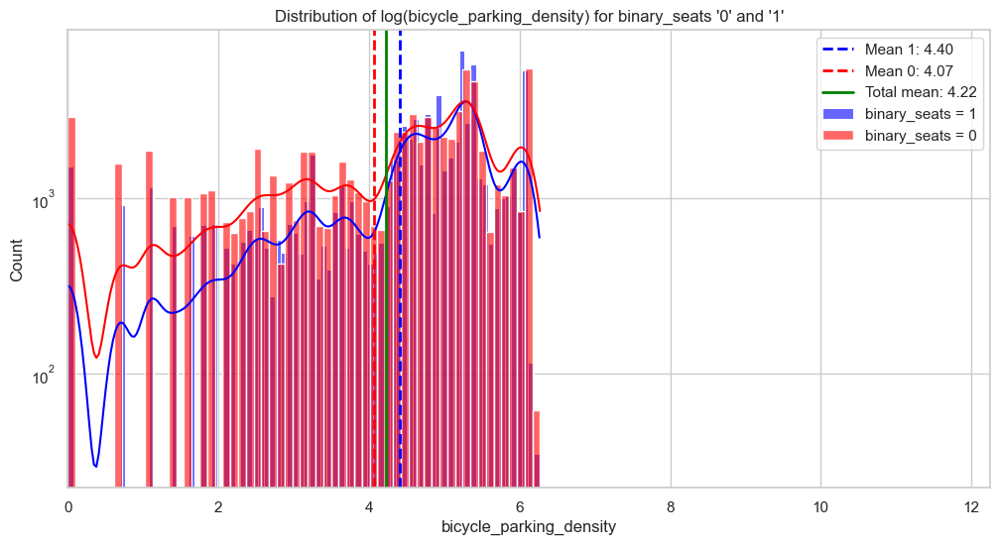

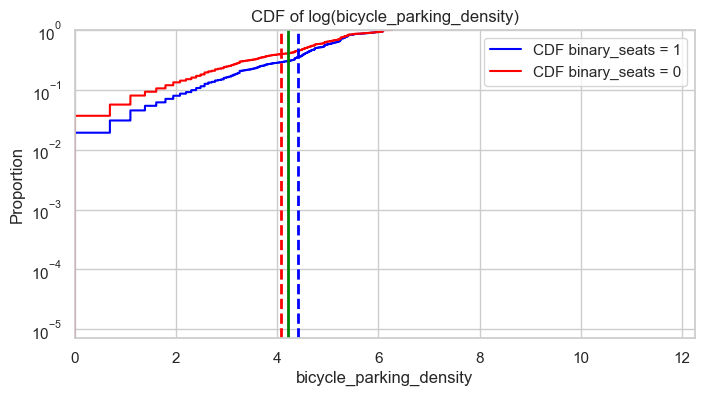

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/477769048.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


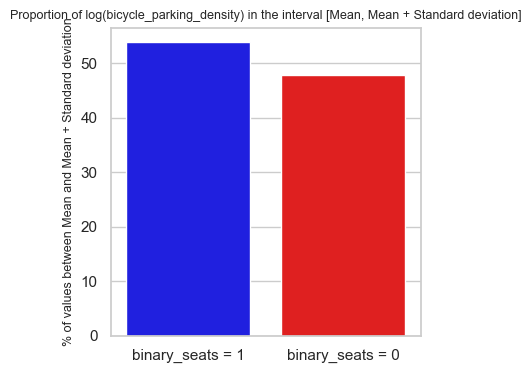

89923 79359
79359 79359
tram_stop_distance (Log Transformed)

Mean (1) : 0.78, Mean (0) : 0.93, Total Mean : 0.86
Standard Deviation (1) : 0.71, Standard Deviation (0) : 0.78
23.96% of '1' are between the mean and the standard deviation
30.79% of '0' are between the mean and the standard deviation



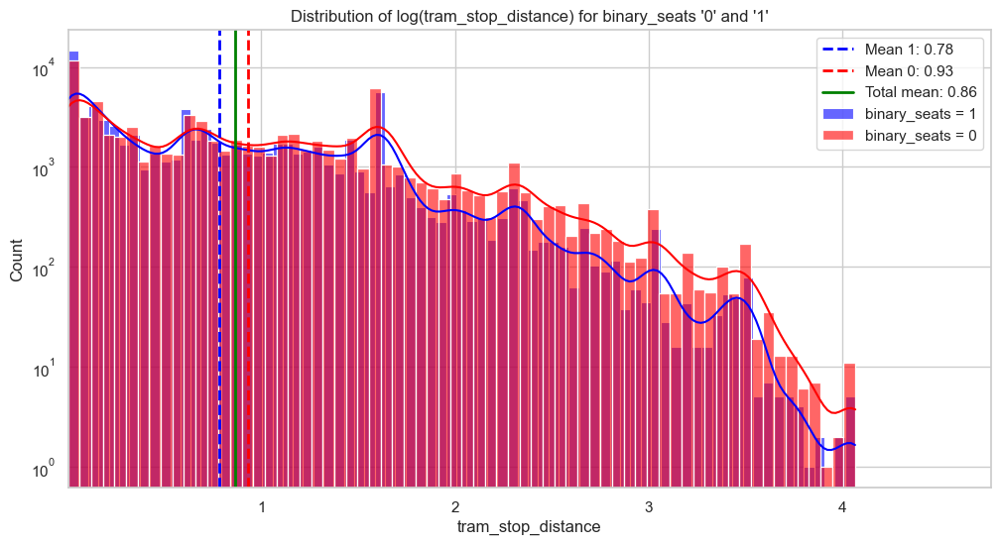

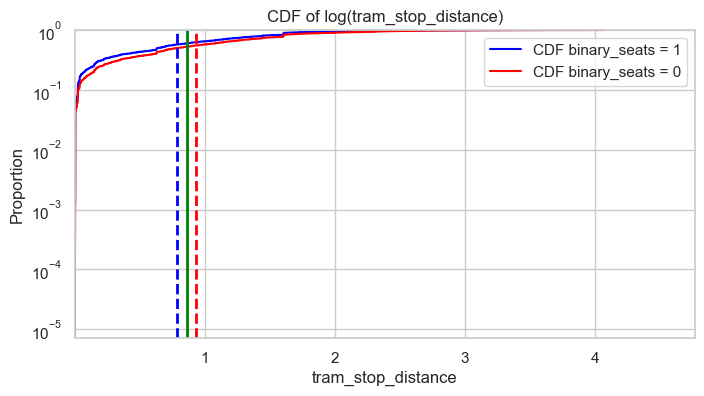

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/477769048.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


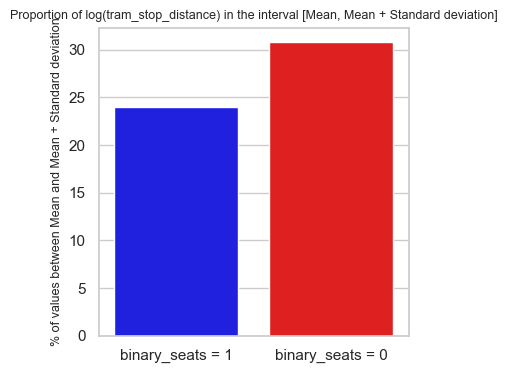

89923 79359
79359 79359
tram_stop_density (Log Transformed)

Mean (1) : 0.88, Mean (0) : 0.74, Total Mean : 0.81
Standard Deviation (1) : 0.98, Standard Deviation (0) : 0.94
13.54% of '1' are between the mean and the standard deviation
13.22% of '0' are between the mean and the standard deviation



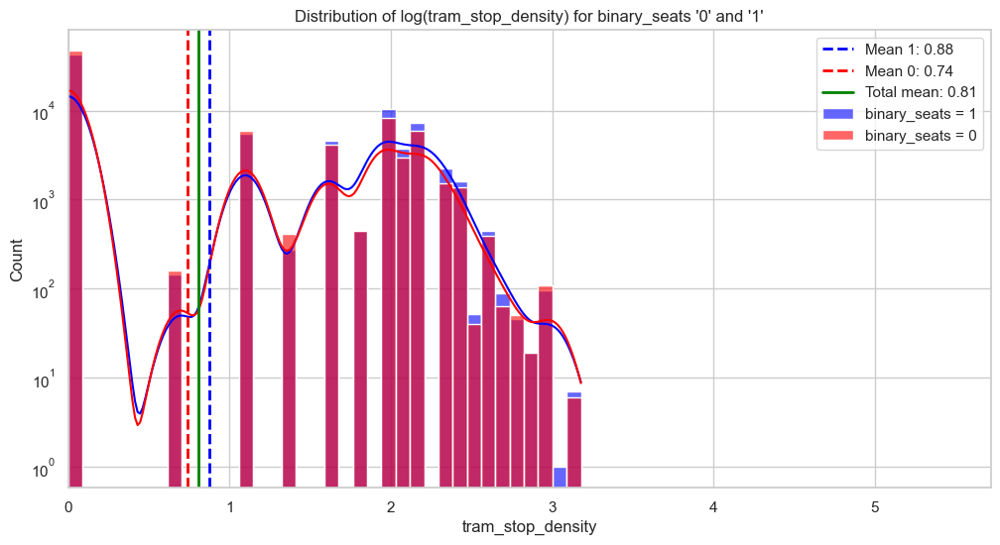

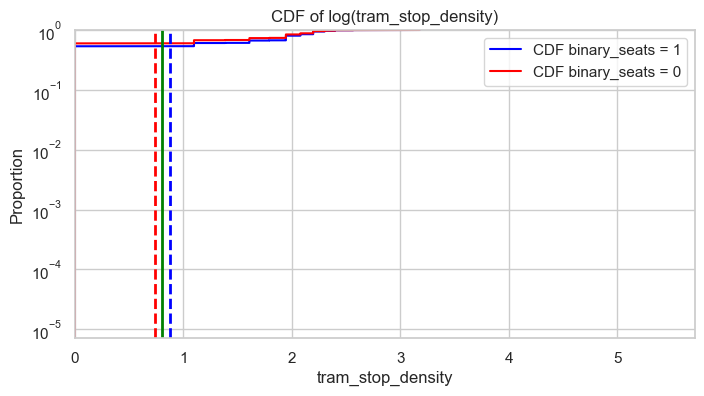

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/477769048.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


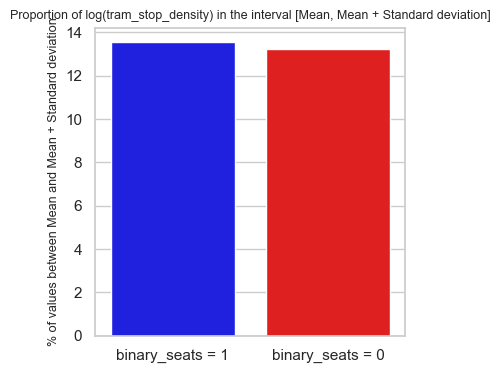

89923 79359
79359 79359
subway_entrance_distance (Log Transformed)

Mean (1) : 0.59, Mean (0) : 0.77, Total Mean : 0.69
Standard Deviation (1) : 0.88, Standard Deviation (0) : 0.98
12.53% of '1' are between the mean and the standard deviation
14.23% of '0' are between the mean and the standard deviation



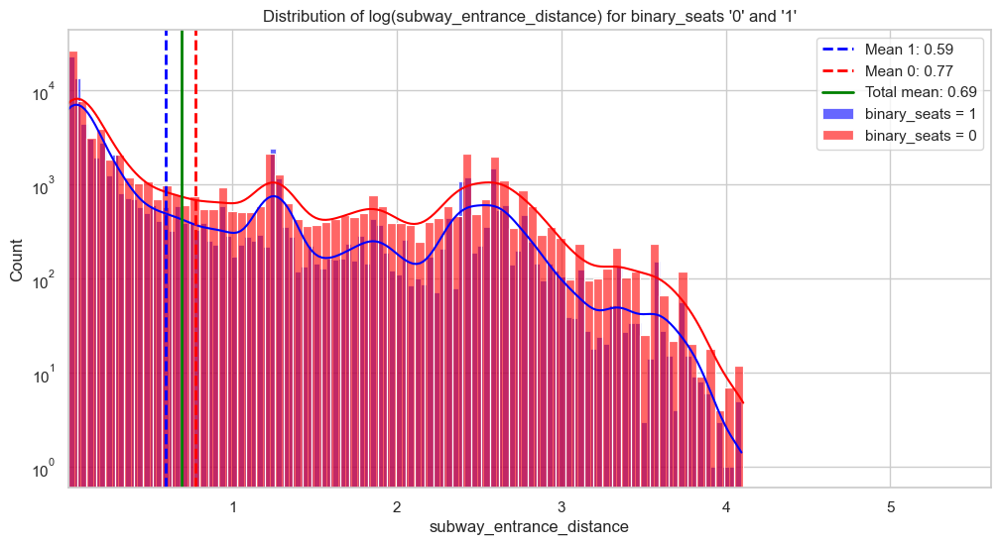

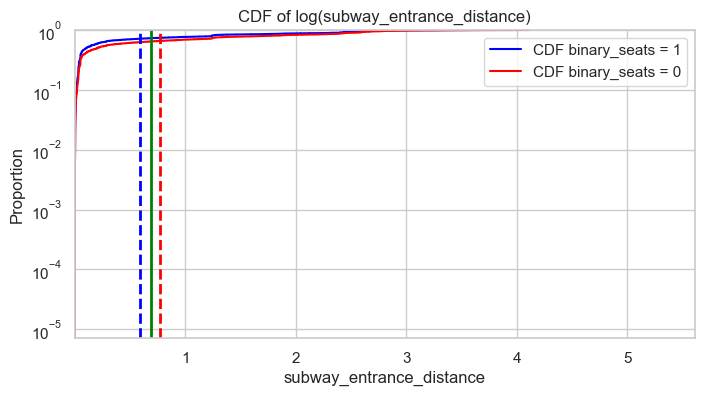

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/477769048.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


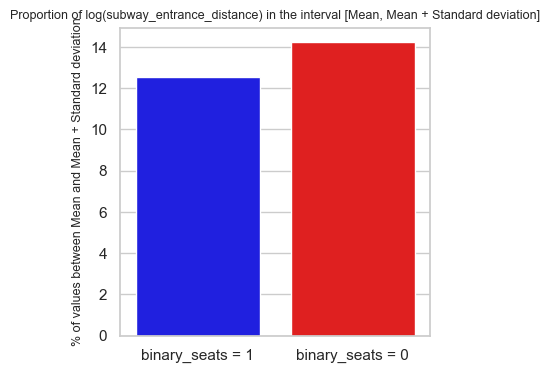

89923 79359
79359 79359
subway_entrance_density (Log Transformed)

Mean (1) : 1.98, Mean (0) : 1.71, Total Mean : 1.84
Standard Deviation (1) : 1.43, Standard Deviation (0) : 1.49
43.31% of '1' are between the mean and the standard deviation
29.03% of '0' are between the mean and the standard deviation



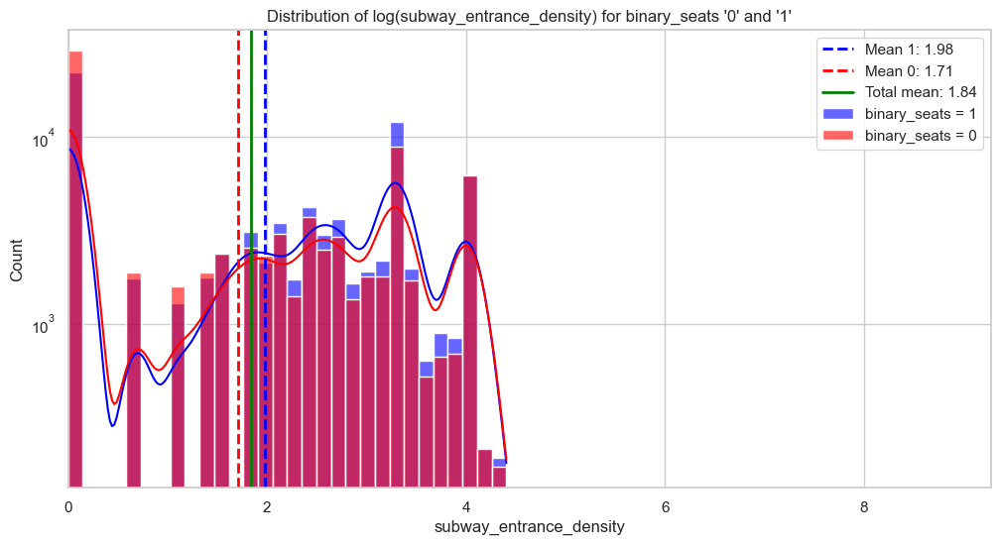

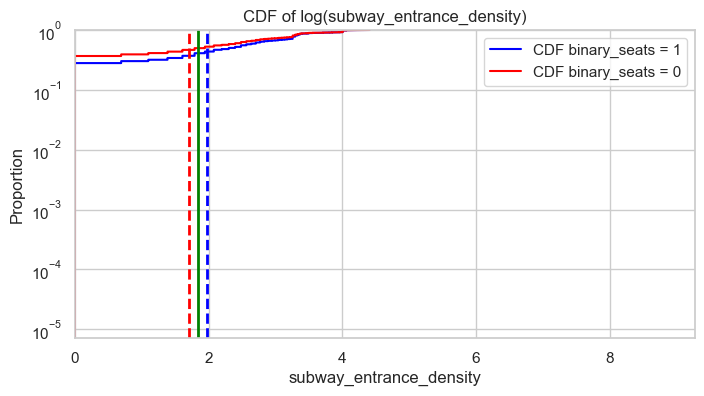

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/477769048.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


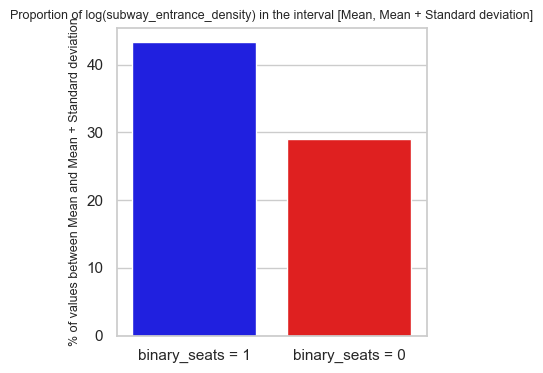

89923 79359
79359 79359
bus_stop_distance (Log Transformed)

Mean (1) : 0.07, Mean (0) : 0.08, Total Mean : 0.07
Standard Deviation (1) : 0.06, Standard Deviation (0) : 0.07
28.89% of '1' are between the mean and the standard deviation
29.13% of '0' are between the mean and the standard deviation



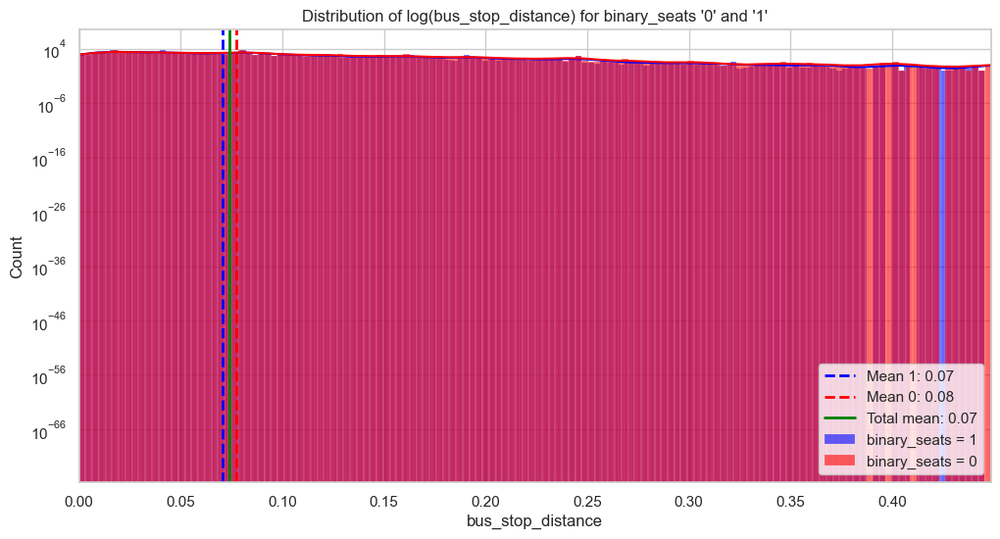

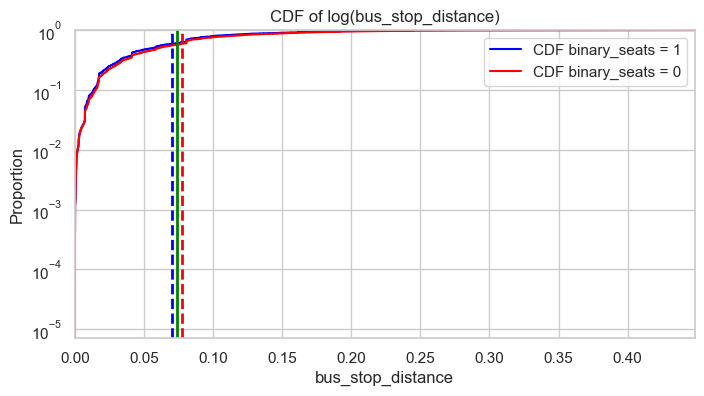

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/477769048.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


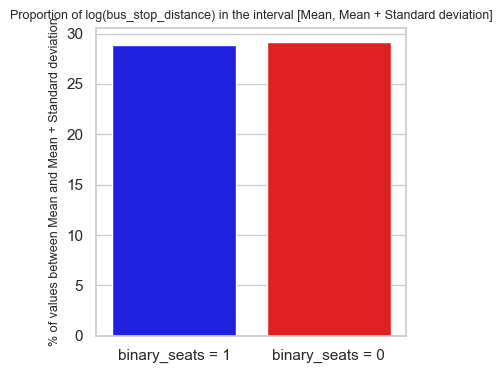

89923 79359
79359 79359
bus_stop_density (Log Transformed)

Mean (1) : 3.93, Mean (0) : 3.85, Total Mean : 3.89
Standard Deviation (1) : 0.43, Standard Deviation (0) : 0.51
50.04% of '1' are between the mean and the standard deviation
48.92% of '0' are between the mean and the standard deviation



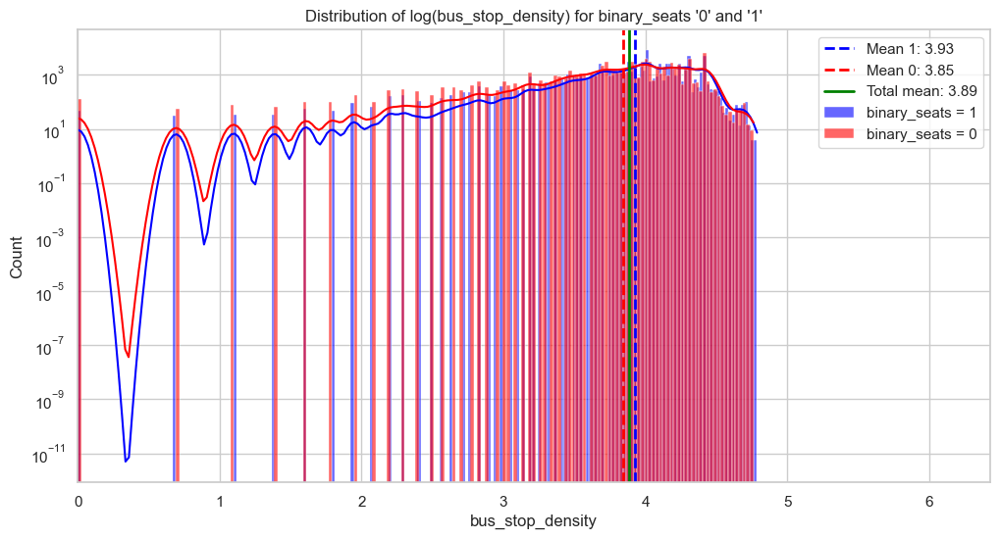

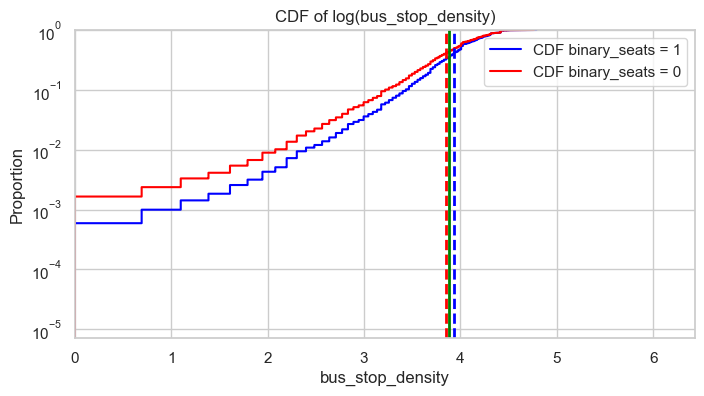

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/477769048.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


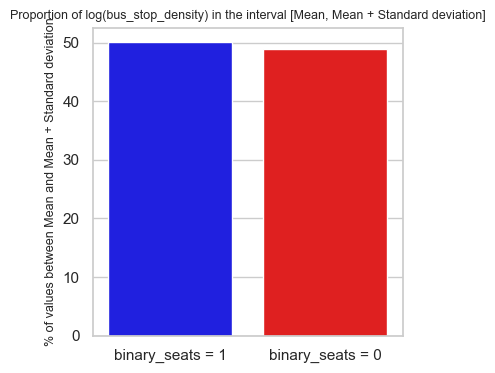

89923 79359
79359 79359
bicycle_rental_distance (Log Transformed)

Mean (1) : 0.43, Mean (0) : 0.58, Total Mean : 0.51
Standard Deviation (1) : 0.67, Standard Deviation (0) : 0.78
8.40% of '1' are between the mean and the standard deviation
13.16% of '0' are between the mean and the standard deviation



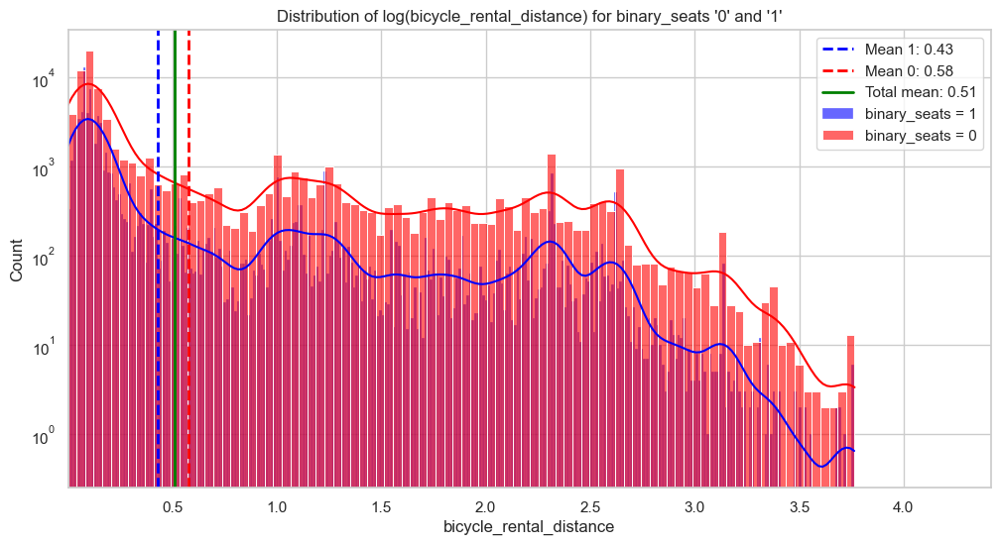

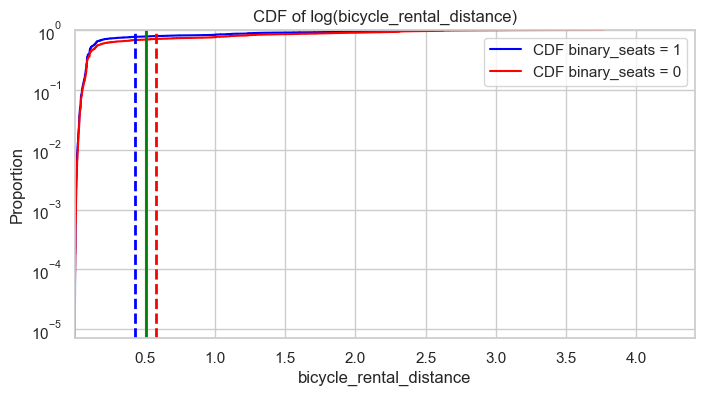

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/477769048.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


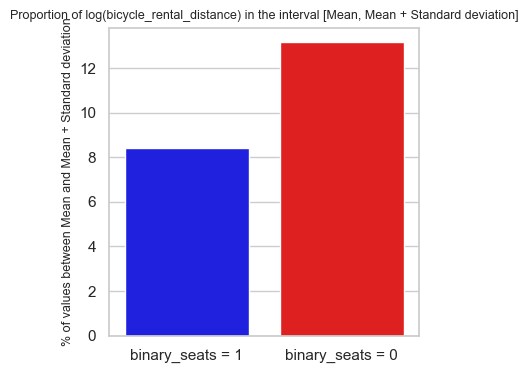

89923 79359
79359 79359
bicycle_rental_density (Log Transformed)

Mean (1) : 2.07, Mean (0) : 1.80, Total Mean : 1.92
Standard Deviation (1) : 1.28, Standard Deviation (0) : 1.37
51.83% of '1' are between the mean and the standard deviation
38.79% of '0' are between the mean and the standard deviation



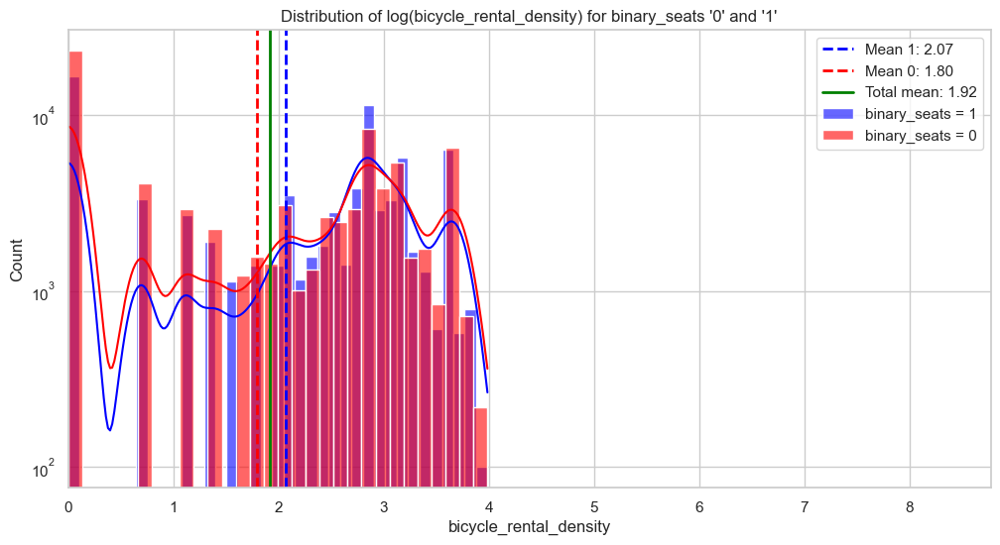

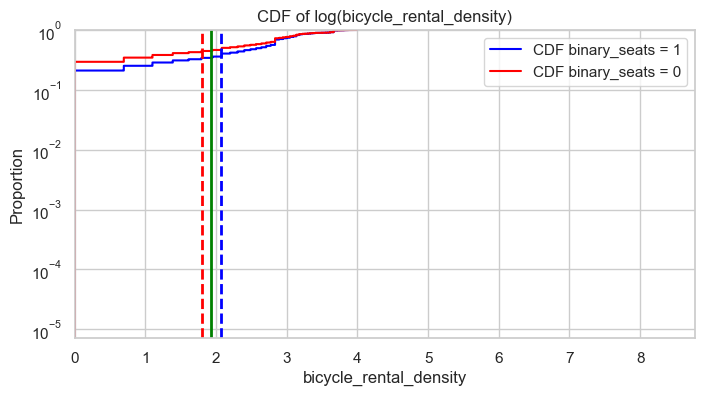

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/477769048.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


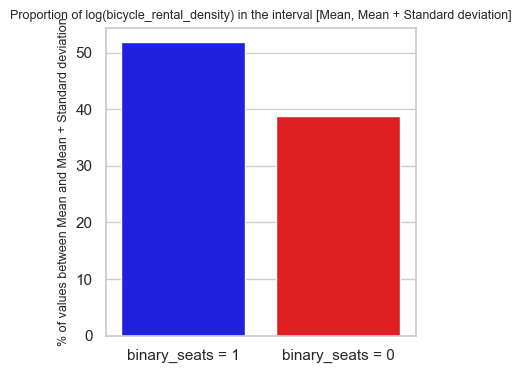

89923 79359
79359 79359
fuel_distance (Log Transformed)

Mean (1) : 0.55, Mean (0) : 0.59, Total Mean : 0.58
Standard Deviation (1) : 0.30, Standard Deviation (0) : 0.33
40.12% of '1' are between the mean and the standard deviation
35.75% of '0' are between the mean and the standard deviation



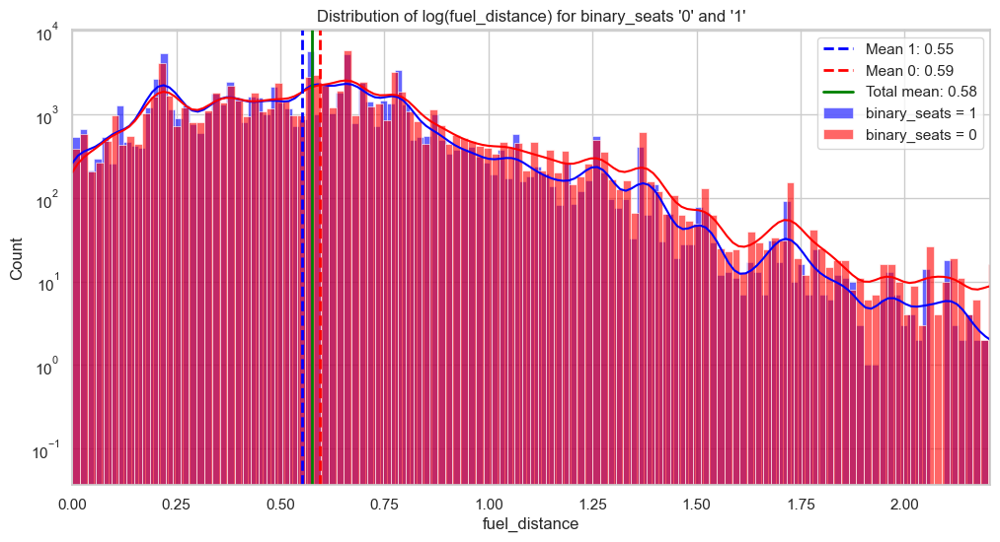

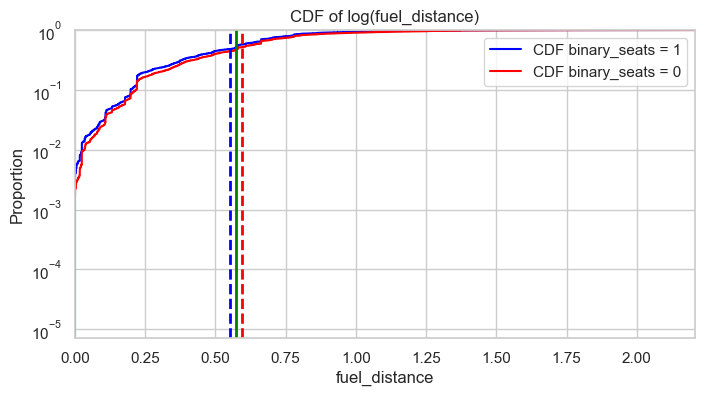

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/477769048.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


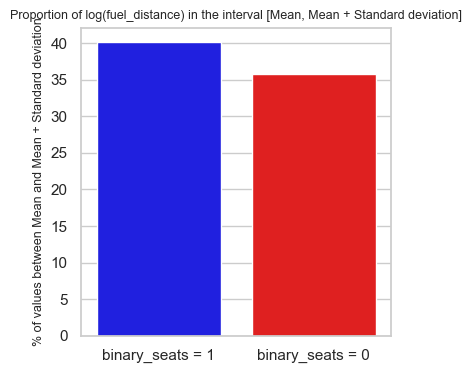

89923 79359
79359 79359
fuel_density (Log Transformed)

Mean (1) : 0.60, Mean (0) : 0.53, Total Mean : 0.56
Standard Deviation (1) : 0.57, Standard Deviation (0) : 0.56
48.44% of '1' are between the mean and the standard deviation
24.80% of '0' are between the mean and the standard deviation



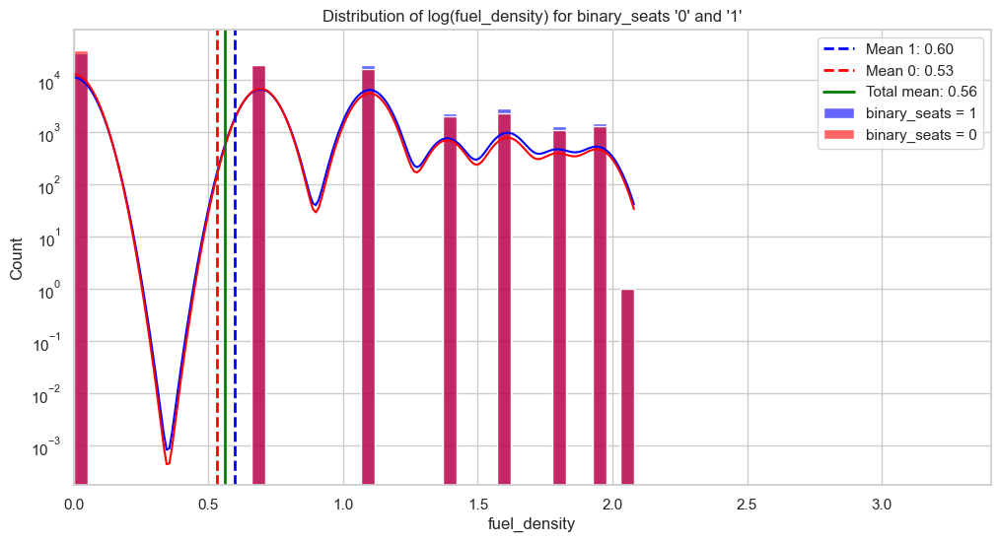

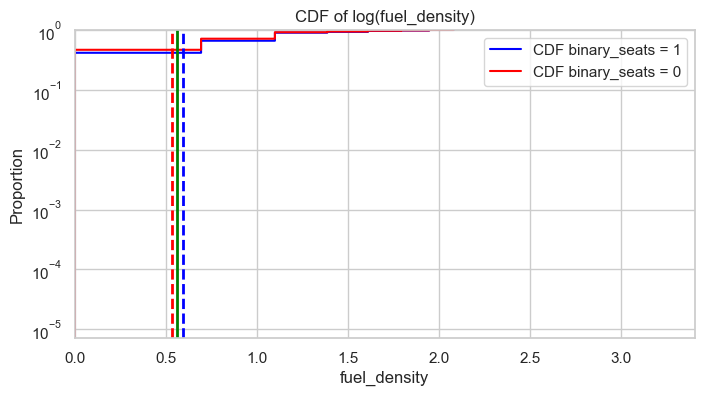

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/477769048.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


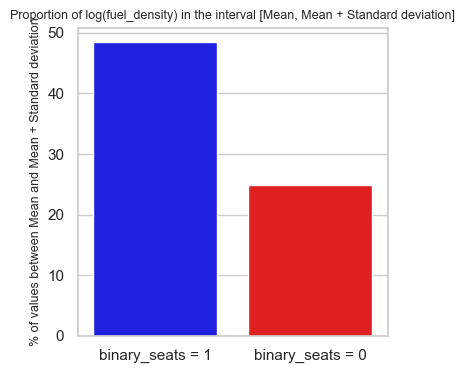

89923 79359
79359 79359
dens_pop (Log Transformed)

Mean (1) : 4.73, Mean (0) : 4.52, Total Mean : 4.62
Standard Deviation (1) : 0.95, Standard Deviation (0) : 1.06
45.61% of '1' are between the mean and the standard deviation
38.07% of '0' are between the mean and the standard deviation



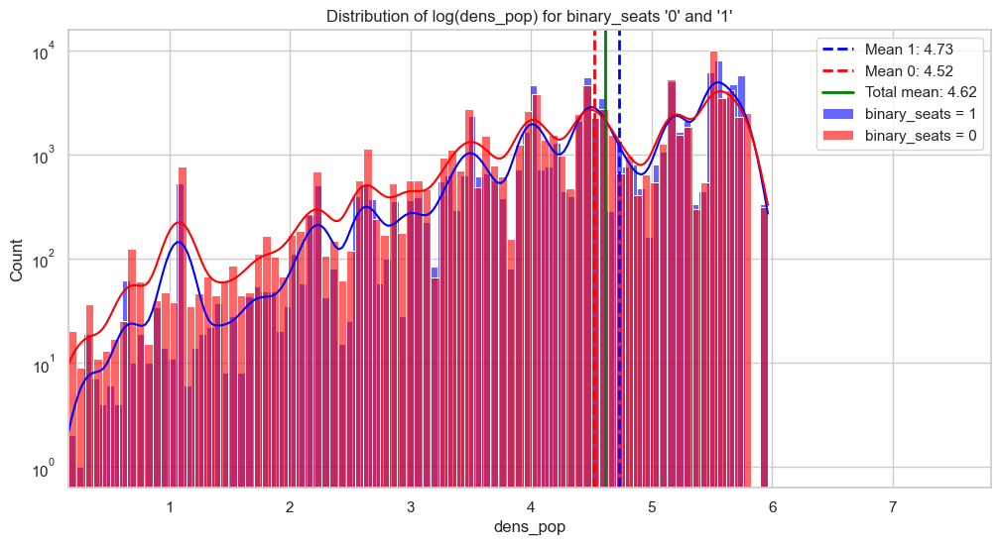

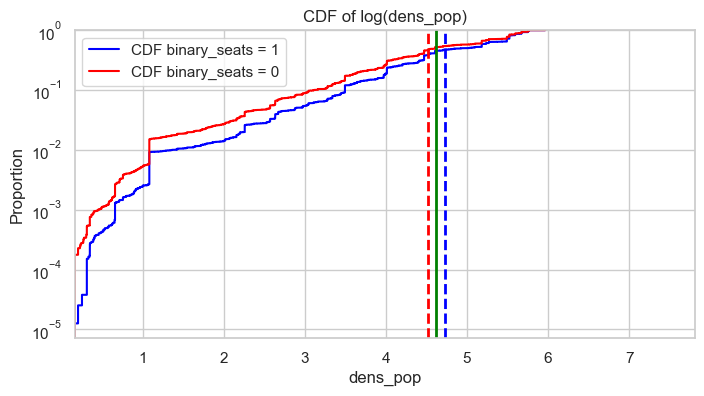

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/477769048.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


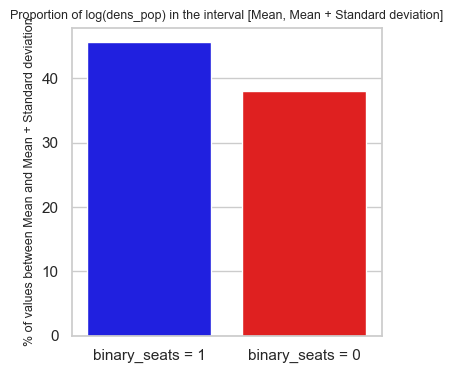

89923 79359
79359 79359
departure_time_hour (Log Transformed)

Mean (1) : 2.64, Mean (0) : 2.60, Total Mean : 2.62
Standard Deviation (1) : 0.38, Standard Deviation (0) : 0.41
46.69% of '1' are between the mean and the standard deviation
47.17% of '0' are between the mean and the standard deviation



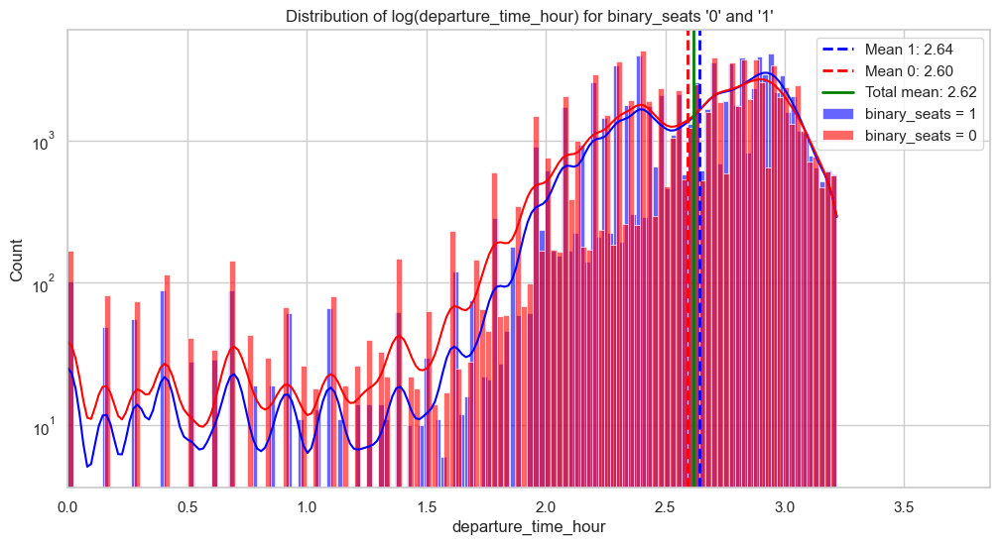

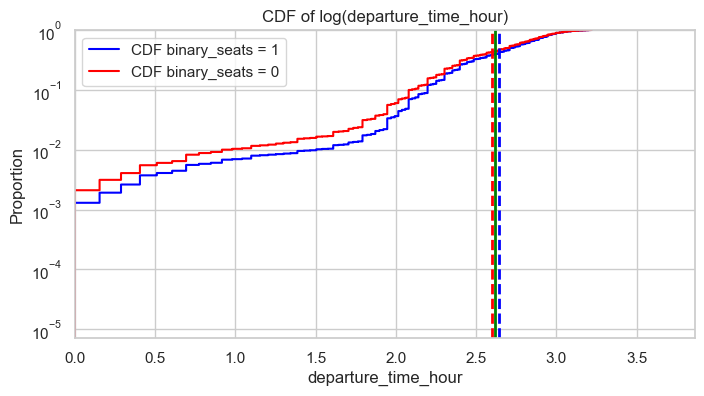

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/477769048.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


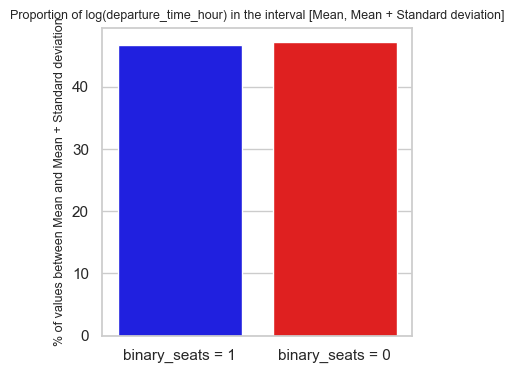

89923 79359
79359 79359
Hors unité urbaine (Log Transformed)

Mean (1) : 0.00, Mean (0) : 0.00, Total Mean : 0.00
Standard Deviation (1) : 0.03, Standard Deviation (0) : 0.04
0.00% of '1' are between the mean and the standard deviation
0.00% of '0' are between the mean and the standard deviation



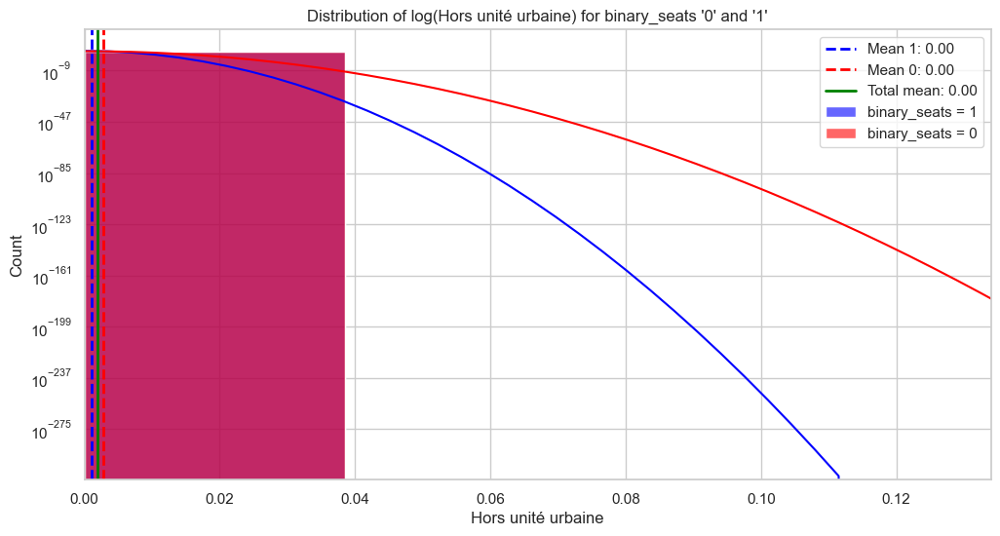

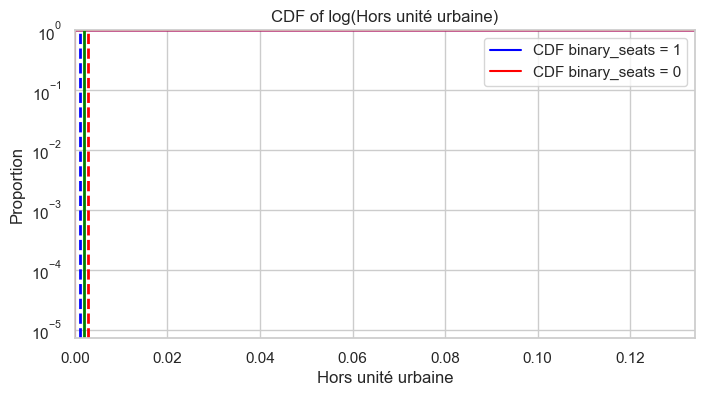

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/477769048.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


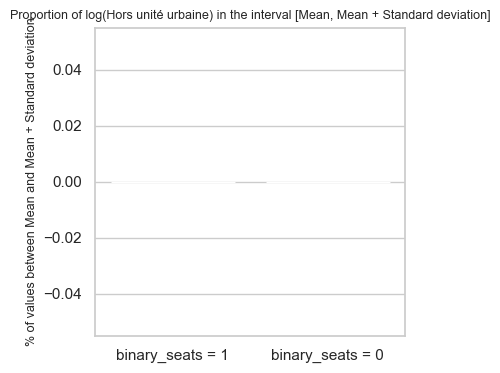

In [22]:
#my_values = ['airport_distance', 'airport_density', 'trainstation_distance', 'trainstation_density', 'electric_distance', 'electric_density', 'bicycle_parking_distance', 'bicycle_parking_density', 'tram_stop_distance', 'tram_stop_density', 'subway_entrance_distance','subway_entrance_density', 'bus_stop_distance' ,'bus_stop_density','bicycle_rental_distance','bicycle_rental_density','fuel_distance', 'fuel_density', 'dens_pop', 'departure_time_hour','Banlieue','Centre']
#my_weight =[4,1.5,3,3,2,3,1.5,3,2,3,1.5,3,3,3,1.5,3,3,4,3.5,3.5,4,4]
my_weight =[5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,3,3,3,3]
 
for i in range(0,len(my_values)):
    my_statistics4(my_values[i],my_weight[i])

Interval: [0.00, 1.00]
Percentage of '1' in range: 80.35%
Percentage of '0' in range: 72.26%


/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/2091069671.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


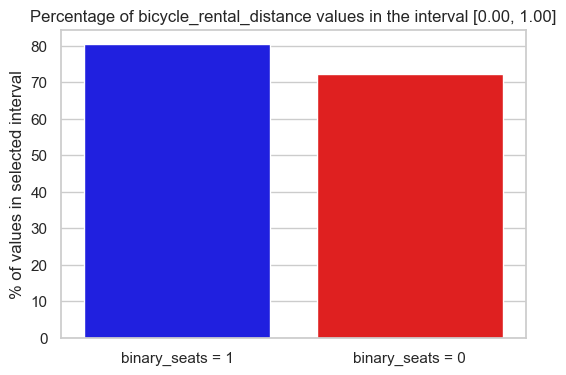

In [23]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_percentage_in_interval(column_name, n1, n2):
    # Séparation des groupes
    group_1 = result[result["binary_seats"] == 1][column_name]
    group_0 = result[result["binary_seats"] == 0][column_name]

    # Calcul de la moyenne et de l'écart-type globaux
    mean_total = result[column_name].mean()
    std_dev = max(group_1.std(), group_0.std())

    # Définition de l'intervalle
    interval_min = n1 
    interval_max = n2 

    # Calcul du pourcentage de valeurs dans l'intervalle
    percentage_1_in_range = (group_1[(group_1 >= interval_min) & (group_1 <= interval_max)].count() / len(group_1)) * 100
    percentage_0_in_range = (group_0[(group_0 >= interval_min) & (group_0 <= interval_max)].count() / len(group_0)) * 100

    # Affichage du résultat
    print(f"Interval: [{interval_min:.2f}, {interval_max:.2f}]")
    print(f"Percentage of '1' in range: {percentage_1_in_range:.2f}%")
    print(f"Percentage of '0' in range: {percentage_0_in_range:.2f}%")

    # Création du graphique
    plt.figure(figsize=(6, 4))
    sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],
                y=[percentage_1_in_range, percentage_0_in_range],
                palette=["blue", "red"])

    plt.ylabel("% of values in selected interval")
    plt.title(f"Percentage of {column_name} values in the interval [{interval_min:.2f}, {interval_max:.2f}]")
    plt.show()

plot_percentage_in_interval('bicycle_rental_distance',0,1)

Interval: [0.00, 0.30]
Percentage of '1' in range: 93.80%
Percentage of '0' in range: 89.52%


/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/2091069671.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


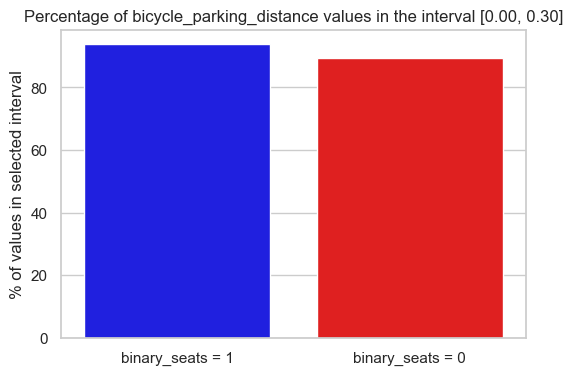

In [24]:
plot_percentage_in_interval('bicycle_parking_distance',0,0.3)

Interval: [3.00, 5.00]
Percentage of '1' in range: 14.49%
Percentage of '0' in range: 16.07%


/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/2091069671.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


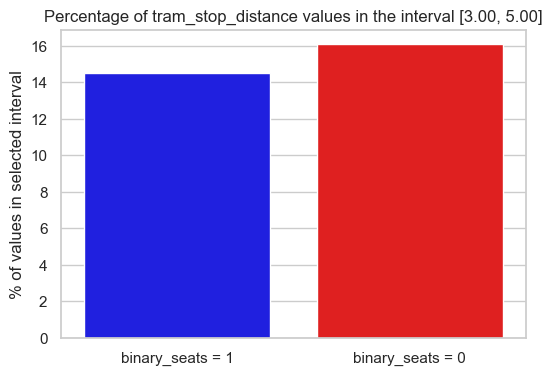

In [25]:
plot_percentage_in_interval('tram_stop_distance',3,5)

Interval: [0.00, 0.06]
Percentage of '1' in range: 50.95%
Percentage of '0' in range: 47.21%


/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/2091069671.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


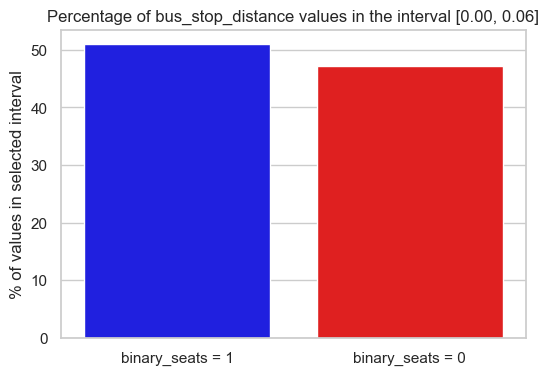

Interval: [0.06, 0.12]
Percentage of '1' in range: 31.88%
Percentage of '0' in range: 32.35%


/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/2091069671.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


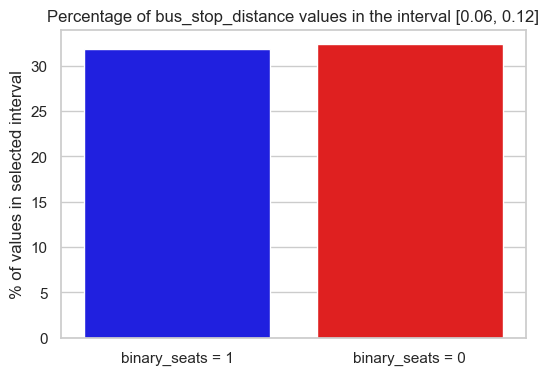

Interval: [0.12, 0.30]
Percentage of '1' in range: 16.06%
Percentage of '0' in range: 18.68%


/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/2091069671.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


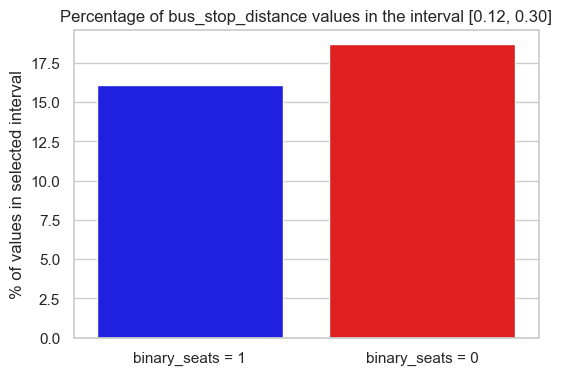

In [26]:
plot_percentage_in_interval('bus_stop_distance',0,0.06)
plot_percentage_in_interval('bus_stop_distance',0.06,0.12)
plot_percentage_in_interval('bus_stop_distance',0.12,0.3)

Interval: [0.00, 5.00]
Percentage of '1' in range: 41.95%
Percentage of '0' in range: 49.79%


/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/2091069671.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


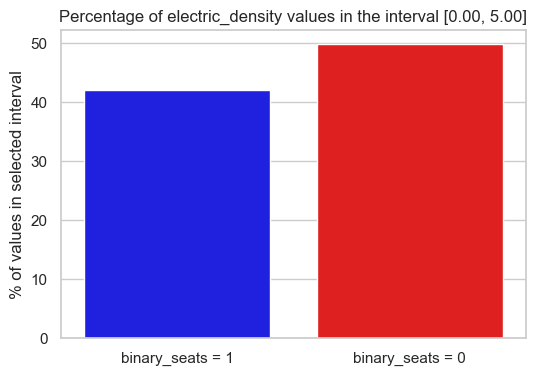

Interval: [5.00, 17.00]
Percentage of '1' in range: 61.68%
Percentage of '0' in range: 53.62%


/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/2091069671.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


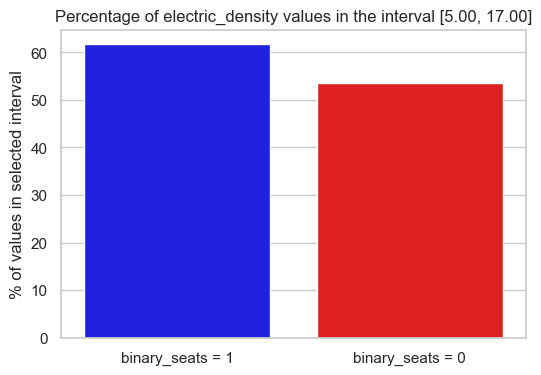

In [27]:
plot_percentage_in_interval('electric_density',0,5)
plot_percentage_in_interval('electric_density',5,17)

Interval: [0.00, 4.00]
Percentage of '1' in range: 84.80%
Percentage of '0' in range: 78.33%


/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_10309/2091069671.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["binary_seats = 1", "binary_seats = 0"],


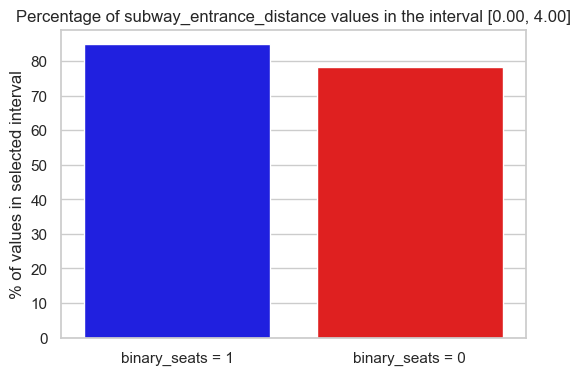

In [28]:
plot_percentage_in_interval('subway_entrance_distance',0,4)